In [1]:
!pip install scikit-optimize

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [4]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [5]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [6]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [7]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [8]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [9]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime'}

In [10]:
types_mapping = {'1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
    '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
    '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
    '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы' }

In [11]:
import pickle

with open('./RATINGS_OKKO_item_coldstart_dataset.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [12]:
df.shape

(9323, 20)

In [13]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [14]:
all_unique_genres = set(all_genres)

In [15]:
len(all_unique_genres)

32

In [16]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '66fad8c3-d84f-458d-a8bf-5b4f154969e0',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'Travel',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [17]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [18]:
decoded_genres

['Action',
 'Comedy',
 'Crime',
 'Detective',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'Shorts',
 'Horror',
 'Anime',
 'Family',
 'Sport',
 'Sci-Fi',
 'Cartoons',
 'War_movies',
 'Humor',
 'ArtHouse',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 'Show',
 'Music',
 'Fantasy',
 'Melodrama',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 'Adventure',
 'History',
 'Biography',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Theater',
 'Thriller',
 'ForKids',
 'Travel',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 'Documentary',
 'Drama']

In [19]:
all_genres = []

for col in ['actor', 'country', 'genre', 'director']:
    print(f'======{col}======')
    all_values = []
    for i, item_values in enumerate(df[col]):
        try:
            all_values.extend(item_values)
        except:
            print(i, item_values)
    all_values = set(all_values)
    print('Len:', len(all_values))
    # print(all_values)

======actor======
Len: 28834
======country======
Len: 102
======genre======
Len: 32
======director======
Len: 6889


# Preprocessing

In [20]:
prep_df = df.copy(deep=True)

In [21]:
prep_df.shape

(9323, 20)

In [22]:
prep_df.head(1).T

,0
availability,[SUBSCRIPTION]
actor,"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 30dd19c..."
age_access_type,18
country,[usa]
average_rating,6.99
duration,3780000
type,MOVIE
name,Прожарка Чарли Шина
release_year,2011
genre,"[Comedy, Documentary]"


### filter by year

In [23]:
prep_df = prep_df[prep_df['release_year'] >= 2000]

### ohe

In [24]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [25]:
top10genres, name = add_topN_feature(prep_df, 'genre', 10)
prep_df = ohe_topN_features(prep_df, top10genres, name)

top10actors, name = add_topN_feature(prep_df, 'actor', 10)
prep_df = ohe_topN_features(prep_df, top10actors, name)

top3directors, name = add_topN_feature(prep_df, 'director', 3)
prep_df = ohe_topN_features(prep_df, top3directors, name)

top5countries, name = add_topN_feature(prep_df, 'country', 5)
prep_df = ohe_topN_features(prep_df, top5countries, name)

prep_df.dropna(subset=['availability'], inplace=True)

avail, name = add_topN_feature(prep_df, 'availability', len(prep_df['availability']))
prep_df = ohe_topN_features(prep_df, avail, name)

In [26]:
prep_df.drop('FVOD', axis=1, inplace=True)

In [27]:
prep_df.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf9

In [28]:
cols = ['age_access_type', 'average_rating',
        'duration', 'type', 'subscription_only',
       'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 
        'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
        'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693',
        'usa', 'russia',
       'great-britain', 'france', 'germany',
        'SUBSCRIPTION', 'DTO', 'RENT',
       'AVOD',
       'price']

In [29]:
prep_df = prep_df[cols]

In [30]:
num_features = ['average_rating', 'duration']
skewed_num_features = ['duration'] 

In [31]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split
# from spacy.tokenizer import Tokenizer
# from spacy.lang.en import English
# nlp = English()
import pandas as pd

class Preprocesser:
    def __init__(self, 
#                 mulpiple_cat_features: list,
                skewed_num_features: list,
               # text_features: list,
               # release_year_feature: str,
#                 mltpl_cat_n_top: dict
                ):
#         self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
        #self.text_features = text_features
#         self.mltpl_cat_n_top = mltpl_cat_n_top
       # self.release_year_feature = release_year_feature
        # self.tokenizer = Tokenizer(nlp.vocab)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        for col in self.mulpiple_cat_features:
            feature_number = self.mltpl_cat_n_top[col]
            df_pr[[f'{col}_{i}' for i in range(feature_number)]] = pd.DataFrame(np.full((len(df), feature_number), np.nan))
            for i in df_pr.index:
                names = df_pr.loc[i, col]
                for k, name in enumerate(names[:int(feature_number)]):
                    df_pr.loc[i, f'{col}_{k}'] = name
            df_pr.drop(col, axis=1, inplace=True)

        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[col] = df_pr[col].apply(lambda x: self.tokenizer(x))
        return df_pr
            
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
#         df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
        # df_pr = self.__preprocess_text_features(df_pr)
        
        return df_pr
        

In [32]:
preprocesser = Preprocesser(
#     mltpl_cat_features,
            skewed_num_features,
            #text_features,
#             mltpl_cat_n_top
)

In [33]:
df_pr = preprocesser.preprocess(prep_df)

In [34]:
df_pr.head().T

,0,1,2,3,4
age_access_type,18,18,0,6,16
average_rating,6.99,6.0,6.21,6.4,NaN
duration,15.145235,15.145235,15.396549,15.523889,15.479437
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
subscription_only,True,True,True,True,False
av_ratings_3months,0.004276,0.0,-0.043478,0.018286,0.010101
Drama,0,0,0,0,1
Comedy,1,1,0,1,1
Thriller,0,0,0,0,0
Action,0,0,0,0,0


In [35]:
df_pr.isnull().sum()

age_access_type                           0
average_rating                          460
duration                                  0
type                                      0
subscription_only                         0
av_ratings_3months                        0
Drama                                     0
Comedy                                    0
Thriller                                  0
Action                                    0
287a1485-7a88-4c2f-bc94-ca418b6c47a1      0
Adventure                                 0
Melodrama                                 0
364fdc2e-bdfe-40be-b2c5-d30f43ec432e      0
Sci-Fi                                    0
Family                                    0
d08bba89-e937-40f3-b2a7-7ea26de4c246      0
fd401c6b-3e00-4f7f-aea7-5512df6b91e0      0
5463b4bc-e332-415c-aca8-11c0f217a9eb      0
fbdae856-85b9-4d4a-96dd-cc383571a488      0
9703b641-2566-4e58-aebb-8d140805c0f3      0
586f8d5a-2f17-42a3-b066-667f7c26a842      0
dfd861c4-d2de-4bb6-bc6e-bae3f92a

In [36]:
df_pr['subscription_only'] = df_pr['subscription_only'].astype(int)

In [37]:
df_pr['average_rating'] = df_pr['average_rating'].astype(float)
# data['age_access_type'] =data['age_access_type'].astype(int)

## Split

In [38]:
X, y = df_pr.drop('av_ratings_3months', axis=1), df_pr['av_ratings_3months']

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)

In [40]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)

In [41]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((6252, 37), (695, 37), (772, 37), (6252,), (695,), (772,))

### OHE

In [42]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(dtype='int8', handle_unknown='ignore')

enc_train = enc.fit_transform(X_train[['age_access_type', 'type']])

In [43]:
enc_train = pd.DataFrame(enc_train.toarray())

enc_train.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_train.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_train = X_train.merge(enc_train, on=X_train.index, how='left', sort=False)

In [44]:
enc_test = enc.transform(X_test[['age_access_type', 'type']])

enc_test = pd.DataFrame(enc_test.toarray())

enc_test.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_test.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_test = X_test.merge(enc_test, on=X_test.index, how='left', sort=False)

In [45]:
enc_val = enc.transform(X_val[['age_access_type', 'type']])

enc_val = pd.DataFrame(enc_val.toarray())

enc_val.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_val.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_val = X_val.merge(enc_val, on=X_val.index, how='left', sort=False)

### Model

In [46]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [47]:
X_train.head(1)

,key_0,average_rating,duration,subscription_only,Drama,Comedy,Thriller,Action,287a1485-7a88-4c2f-bc94-ca418b6c47a1,Adventure,...,RENT,AVOD,age_access_type_0,age_access_type_6,age_access_type_12,age_access_type_16,age_access_type_18,type_MOVIE,type_MP_MOVIE,type_SERIAL
0,8374,5.77,16.741893,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,1


In [48]:
X_train.drop('key_0', inplace=True, axis=1)
X_test.drop('key_0', inplace=True, axis=1)
X_val.drop('key_0', inplace=True, axis=1)

In [81]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
#                          cat_features=cat_features
                       )

val_dataset = cat.Pool(X_val, y_val,
#                        cat_features=cat_features
                      )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.0679
0:	learn: 0.0185380	test: 0.0222616	best: 0.0222616 (0)	total: 173ms	remaining: 2m 52s
100:	learn: 0.0162882	test: 0.0205452	best: 0.0204813 (80)	total: 30.7s	remaining: 4m 33s
200:	learn: 0.0159497	test: 0.0206916	best: 0.0204813 (80)	total: 59s	remaining: 3m 54s
300:	learn: 0.0156537	test: 0.0208854	best: 0.0204813 (80)	total: 1m 24s	remaining: 3m 16s
400:	learn: 0.0153293	test: 0.0211075	best: 0.0204813 (80)	total: 1m 50s	remaining: 2m 45s
500:	learn: 0.0150842	test: 0.0213160	best: 0.0204813 (80)	total: 2m 15s	remaining: 2m 14s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.02048134063
bestIteration = 80

Shrink model to first 81 iterations.


In [82]:
y_pred = cat_model.predict(test_dataset)

In [83]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.0009203709213007564
RMSE:  0.030337615616603034
R2:    0.1490717787072421
MAE:   0.015241468856844662
MedAE: 0.00888126535451084
------------------------------


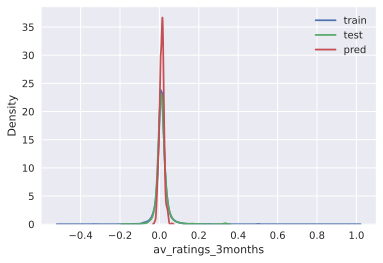

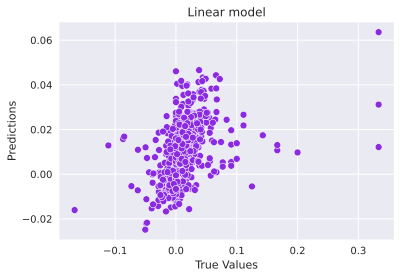

In [84]:
target_distr_linear(y_train, y_test, y_pred)   

In [85]:
cat_model.save_model('cat_reg_okko_ratings_ohe')

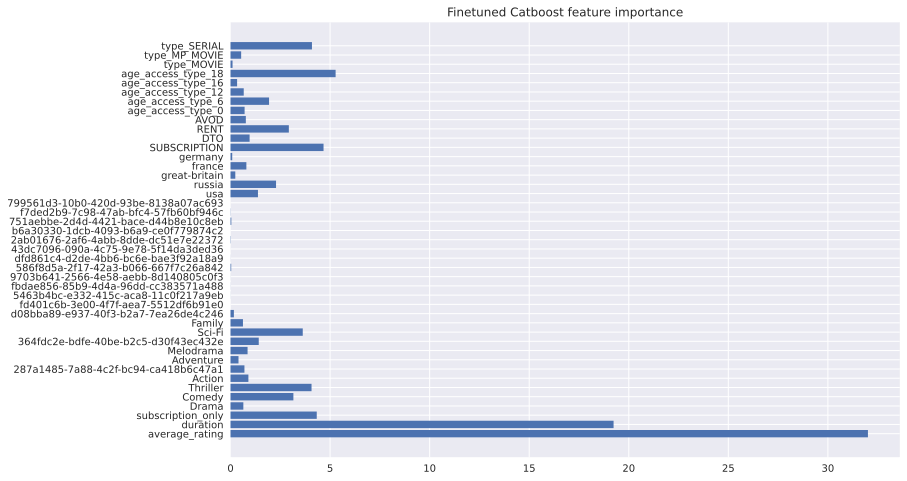

In [86]:
get_feature_imp(cat_model, train_dataset)

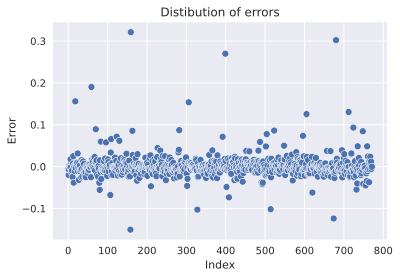

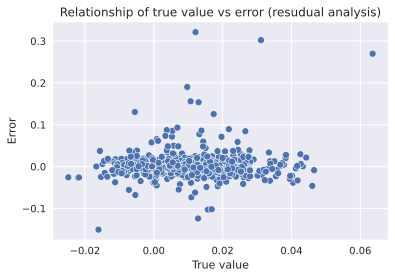

In [87]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Tuning

In [109]:
train_dataset = cat.Pool(X_train, 
                         y_train,
                         cat_features=cat_features)

test_dataset = cat.Pool(X_test, 
                        y_test,
                        cat_features=cat_features)

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

In [88]:
parameters_distr = {'depth': randint(3, 7),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [100, 1000, 5000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5, n_jobs=-1, verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_ratings_okko_tune', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.0189523	total: 672ms	remaining: 11m 10s
1:	learn: 0.0186512	total: 675ms	remaining: 5m 36s
2:	learn: 0.0184282	total: 1.19s	remaining: 6m 34s
3:	learn: 0.0182477	total: 1.2s	remaining: 4m 58s
4:	learn: 0.0180965	total: 1.28s	remaining: 4m 15s
5:	learn: 0.0179328	total: 1.51s	remaining: 4m 10s
6:	learn: 0.0178283	total: 1.53s	remaining: 3m 37s
7:	learn: 0.0177462	total: 1.53s	remaining: 3m 10s
8:	learn: 0.0176425	total: 1.85s	remaining: 3m 24s
9:	learn: 0.0175508	total: 1.87s	remaining: 3m 5s
10:	learn: 0.0174798	total: 1.88s	remaining: 2m 48s
11:	learn: 0.0174230	total: 2.12s	remaining: 2m 54s
12:	learn: 0.0174041	total: 2.13s	remaining: 2m 41s
13:	learn: 0.0173609	total: 2.13s	remaining: 2m 30s
14:	learn: 0.0173299	total: 2.33s	remaining: 2m 33s
15:	learn: 0.0173057	total: 2.33s	remaining: 2m 23s
16:	learn: 0.0172937	total: 2.47s	remaining: 2m 22s
17:	learn: 0.0172795	total: 2.48s	remaining: 2m 15s
18:	learn: 0.0

0:	learn: 0.0182942	total: 66ms	remaining: 1m 5s
1:	learn: 0.0182372	total: 68ms	remaining: 33.9s
2:	learn: 0.0181844	total: 69.6ms	remaining: 23.1s
3:	learn: 0.0181311	total: 71.3ms	remaining: 17.8s
4:	learn: 0.0180874	total: 73.7ms	remaining: 14.7s
5:	learn: 0.0180400	total: 75.3ms	remaining: 12.5s
6:	learn: 0.0179920	total: 76.8ms	remaining: 10.9s
7:	learn: 0.0179450	total: 821ms	remaining: 1m 41s
8:	learn: 0.0179034	total: 823ms	remaining: 1m 30s
9:	learn: 0.0178643	total: 825ms	remaining: 1m 21s
10:	learn: 0.0178189	total: 1.02s	remaining: 1m 31s
11:	learn: 0.0177795	total: 1.02s	remaining: 1m 24s
12:	learn: 0.0177442	total: 1.53s	remaining: 1m 56s
13:	learn: 0.0177053	total: 1.53s	remaining: 1m 47s
14:	learn: 0.0176720	total: 1.53s	remaining: 1m 40s
15:	learn: 0.0176383	total: 1.53s	remaining: 1m 34s
16:	learn: 0.0176064	total: 1.7s	remaining: 1m 38s
17:	learn: 0.0175753	total: 1.93s	remaining: 1m 45s
18:	learn: 0.0175414	total: 1.93s	remaining: 1m 39s
19:	learn: 0.0175161	total:

0:	learn: 0.0192505	total: 793ms	remaining: 13m 12s
1:	learn: 0.0191986	total: 795ms	remaining: 6m 36s
2:	learn: 0.0191485	total: 797ms	remaining: 4m 24s
3:	learn: 0.0191024	total: 1.12s	remaining: 4m 38s
4:	learn: 0.0190466	total: 1.12s	remaining: 3m 42s
5:	learn: 0.0189988	total: 1.12s	remaining: 3m 6s
6:	learn: 0.0189575	total: 1.13s	remaining: 2m 39s
7:	learn: 0.0189148	total: 1.13s	remaining: 2m 19s
8:	learn: 0.0188768	total: 1.13s	remaining: 2m 4s
9:	learn: 0.0188366	total: 1.13s	remaining: 1m 51s
10:	learn: 0.0187943	total: 1.13s	remaining: 1m 41s
11:	learn: 0.0187539	total: 1.24s	remaining: 1m 42s
12:	learn: 0.0187162	total: 1.24s	remaining: 1m 34s
13:	learn: 0.0186823	total: 1.24s	remaining: 1m 27s
14:	learn: 0.0186453	total: 1.63s	remaining: 1m 46s
15:	learn: 0.0186149	total: 1.63s	remaining: 1m 40s
16:	learn: 0.0185817	total: 1.76s	remaining: 1m 41s
17:	learn: 0.0185502	total: 1.76s	remaining: 1m 35s
18:	learn: 0.0185184	total: 1.76s	remaining: 1m 30s
19:	learn: 0.0184872	to

0:	learn: 0.0187590	total: 219ms	remaining: 18m 15s
1:	learn: 0.0186129	total: 221ms	remaining: 9m 11s
2:	learn: 0.0184803	total: 271ms	remaining: 7m 31s
3:	learn: 0.0183612	total: 273ms	remaining: 5m 40s
4:	learn: 0.0182351	total: 570ms	remaining: 9m 29s
5:	learn: 0.0181314	total: 686ms	remaining: 9m 31s
6:	learn: 0.0180379	total: 688ms	remaining: 8m 10s
7:	learn: 0.0179616	total: 689ms	remaining: 7m 10s
8:	learn: 0.0178988	total: 1.3s	remaining: 12m 2s
9:	learn: 0.0178334	total: 1.3s	remaining: 10m 50s
10:	learn: 0.0177628	total: 1.87s	remaining: 14m 7s
11:	learn: 0.0177083	total: 3.38s	remaining: 23m 26s
12:	learn: 0.0176583	total: 3.38s	remaining: 21m 38s
13:	learn: 0.0176109	total: 3.82s	remaining: 22m 40s
14:	learn: 0.0175609	total: 3.82s	remaining: 21m 10s
15:	learn: 0.0175170	total: 3.82s	remaining: 19m 51s
16:	learn: 0.0174856	total: 3.82s	remaining: 18m 41s
17:	learn: 0.0174504	total: 4.18s	remaining: 19m 18s
18:	learn: 0.0174149	total: 4.19s	remaining: 18m 17s
19:	learn: 0.0

0:	learn: 0.0180421	total: 119ms	remaining: 9m 55s
1:	learn: 0.0178038	total: 121ms	remaining: 5m 1s
2:	learn: 0.0175918	total: 122ms	remaining: 3m 23s
3:	learn: 0.0173915	total: 124ms	remaining: 2m 34s
4:	learn: 0.0172343	total: 158ms	remaining: 2m 37s
5:	learn: 0.0170884	total: 162ms	remaining: 2m 14s
6:	learn: 0.0169722	total: 165ms	remaining: 1m 57s
7:	learn: 0.0168855	total: 723ms	remaining: 7m 31s
8:	learn: 0.0167908	total: 1.75s	remaining: 16m 9s
9:	learn: 0.0167267	total: 1.75s	remaining: 14m 33s
10:	learn: 0.0166614	total: 1.8s	remaining: 13m 38s
11:	learn: 0.0166199	total: 1.81s	remaining: 12m 31s
12:	learn: 0.0165661	total: 2.17s	remaining: 13m 51s
13:	learn: 0.0165287	total: 2.39s	remaining: 14m 12s
14:	learn: 0.0164829	total: 2.71s	remaining: 15m 1s
15:	learn: 0.0164722	total: 3.18s	remaining: 16m 29s
16:	learn: 0.0164673	total: 3.38s	remaining: 16m 29s
17:	learn: 0.0164345	total: 3.38s	remaining: 15m 35s
18:	learn: 0.0164166	total: 3.66s	remaining: 15m 59s
19:	learn: 0.01

0:	learn: 0.0177977	total: 47.5ms	remaining: 3m 57s
1:	learn: 0.0176739	total: 48.9ms	remaining: 2m 2s
2:	learn: 0.0175436	total: 50.2ms	remaining: 1m 23s
3:	learn: 0.0174118	total: 51.6ms	remaining: 1m 4s
4:	learn: 0.0173021	total: 53ms	remaining: 52.9s
5:	learn: 0.0172257	total: 54.4ms	remaining: 45.3s
6:	learn: 0.0171369	total: 61.5ms	remaining: 43.8s
7:	learn: 0.0170572	total: 63ms	remaining: 39.3s
8:	learn: 0.0169934	total: 64.7ms	remaining: 35.9s
9:	learn: 0.0169407	total: 66.3ms	remaining: 33.1s
10:	learn: 0.0168705	total: 233ms	remaining: 1m 45s
11:	learn: 0.0168123	total: 238ms	remaining: 1m 38s
12:	learn: 0.0167738	total: 241ms	remaining: 1m 32s
13:	learn: 0.0167144	total: 243ms	remaining: 1m 26s
14:	learn: 0.0166614	total: 870ms	remaining: 4m 49s
15:	learn: 0.0166208	total: 872ms	remaining: 4m 31s
16:	learn: 0.0165811	total: 873ms	remaining: 4m 15s
17:	learn: 0.0165518	total: 1.1s	remaining: 5m 5s
18:	learn: 0.0165181	total: 1.11s	remaining: 4m 50s
19:	learn: 0.0164863	total

0:	learn: 0.0191952	total: 198ms	remaining: 16m 31s
1:	learn: 0.0191031	total: 200ms	remaining: 8m 19s
2:	learn: 0.0190223	total: 202ms	remaining: 5m 35s
3:	learn: 0.0189365	total: 768ms	remaining: 15m 59s
4:	learn: 0.0188646	total: 769ms	remaining: 12m 48s
5:	learn: 0.0187948	total: 770ms	remaining: 10m 41s
6:	learn: 0.0187370	total: 1.3s	remaining: 15m 30s
7:	learn: 0.0186547	total: 1.3s	remaining: 13m 34s
8:	learn: 0.0186022	total: 1.53s	remaining: 14m 9s
9:	learn: 0.0185463	total: 1.53s	remaining: 12m 45s
10:	learn: 0.0184737	total: 2.96s	remaining: 22m 21s
11:	learn: 0.0184232	total: 2.96s	remaining: 20m 30s
12:	learn: 0.0183652	total: 3.31s	remaining: 21m 11s
13:	learn: 0.0183134	total: 3.37s	remaining: 19m 59s
14:	learn: 0.0182682	total: 3.37s	remaining: 18m 40s
15:	learn: 0.0182181	total: 3.37s	remaining: 17m 30s
16:	learn: 0.0181707	total: 3.37s	remaining: 16m 28s
17:	learn: 0.0181289	total: 3.84s	remaining: 17m 42s
18:	learn: 0.0180857	total: 3.84s	remaining: 16m 47s
19:	lear

0:	learn: 0.0191390	total: 734ms	remaining: 1h 1m 9s
1:	learn: 0.0190047	total: 736ms	remaining: 30m 38s
2:	learn: 0.0188922	total: 1.15s	remaining: 31m 50s
3:	learn: 0.0187721	total: 1.55s	remaining: 32m 15s
4:	learn: 0.0186634	total: 1.55s	remaining: 25m 49s
5:	learn: 0.0185771	total: 1.55s	remaining: 21m 32s
6:	learn: 0.0185062	total: 2.07s	remaining: 24m 39s
7:	learn: 0.0184002	total: 2.08s	remaining: 21m 35s
8:	learn: 0.0183209	total: 2.27s	remaining: 20m 57s
9:	learn: 0.0182532	total: 2.27s	remaining: 18m 52s
10:	learn: 0.0181731	total: 2.27s	remaining: 17m 10s
11:	learn: 0.0181202	total: 2.27s	remaining: 15m 44s
12:	learn: 0.0180649	total: 3.12s	remaining: 19m 57s
13:	learn: 0.0180019	total: 3.12s	remaining: 18m 32s
14:	learn: 0.0179469	total: 3.75s	remaining: 20m 45s
15:	learn: 0.0178965	total: 3.83s	remaining: 19m 53s
16:	learn: 0.0178609	total: 3.83s	remaining: 18m 43s
17:	learn: 0.0178227	total: 3.92s	remaining: 18m 6s
18:	learn: 0.0177819	total: 3.93s	remaining: 17m 9s
19:	

0:	learn: 0.0188649	total: 52.5ms	remaining: 52.4s
1:	learn: 0.0188105	total: 54.2ms	remaining: 27.1s
2:	learn: 0.0187611	total: 56ms	remaining: 18.6s
3:	learn: 0.0187116	total: 98.2ms	remaining: 24.5s
4:	learn: 0.0186668	total: 99.6ms	remaining: 19.8s
5:	learn: 0.0186173	total: 101ms	remaining: 16.7s
6:	learn: 0.0185747	total: 110ms	remaining: 15.6s
7:	learn: 0.0185304	total: 112ms	remaining: 13.8s
8:	learn: 0.0184942	total: 113ms	remaining: 12.4s
9:	learn: 0.0184481	total: 123ms	remaining: 12.2s
10:	learn: 0.0184092	total: 125ms	remaining: 11.2s
11:	learn: 0.0183740	total: 128ms	remaining: 10.6s
12:	learn: 0.0183409	total: 130ms	remaining: 9.87s
13:	learn: 0.0183052	total: 132ms	remaining: 9.28s
14:	learn: 0.0182679	total: 260ms	remaining: 17.1s
15:	learn: 0.0182363	total: 261ms	remaining: 16.1s
16:	learn: 0.0182056	total: 263ms	remaining: 15.2s
17:	learn: 0.0181701	total: 265ms	remaining: 14.5s
18:	learn: 0.0181359	total: 266ms	remaining: 13.7s
19:	learn: 0.0181077	total: 269ms	rema

0:	learn: 0.0181818	total: 367ms	remaining: 30m 36s
1:	learn: 0.0180255	total: 711ms	remaining: 29m 36s
2:	learn: 0.0178894	total: 713ms	remaining: 19m 46s
3:	learn: 0.0177874	total: 714ms	remaining: 14m 51s
4:	learn: 0.0176901	total: 914ms	remaining: 15m 13s
5:	learn: 0.0175930	total: 916ms	remaining: 12m 42s
6:	learn: 0.0175058	total: 1.22s	remaining: 14m 30s
7:	learn: 0.0174143	total: 1.27s	remaining: 13m 11s
8:	learn: 0.0173430	total: 1.27s	remaining: 11m 44s
9:	learn: 0.0172823	total: 1.27s	remaining: 10m 34s
10:	learn: 0.0172139	total: 2.61s	remaining: 19m 44s
11:	learn: 0.0171639	total: 2.61s	remaining: 18m 6s
12:	learn: 0.0171193	total: 2.62s	remaining: 16m 43s
13:	learn: 0.0170678	total: 4.67s	remaining: 27m 44s
14:	learn: 0.0170357	total: 4.67s	remaining: 25m 53s
15:	learn: 0.0170031	total: 4.79s	remaining: 24m 53s
16:	learn: 0.0169669	total: 5.03s	remaining: 24m 34s
17:	learn: 0.0169349	total: 5.03s	remaining: 23m 12s
18:	learn: 0.0168905	total: 5.03s	remaining: 21m 59s
19:	

0:	learn: 0.0176194	total: 48.9ms	remaining: 48.9s
1:	learn: 0.0173209	total: 54.7ms	remaining: 27.3s
2:	learn: 0.0170764	total: 149ms	remaining: 49.7s
3:	learn: 0.0168925	total: 152ms	remaining: 37.9s
4:	learn: 0.0167658	total: 514ms	remaining: 1m 42s
5:	learn: 0.0166504	total: 538ms	remaining: 1m 29s
6:	learn: 0.0165384	total: 890ms	remaining: 2m 6s
7:	learn: 0.0164465	total: 893ms	remaining: 1m 50s
8:	learn: 0.0163537	total: 1.2s	remaining: 2m 12s
9:	learn: 0.0162814	total: 1.34s	remaining: 2m 12s
10:	learn: 0.0162137	total: 1.35s	remaining: 2m 1s
11:	learn: 0.0161686	total: 1.77s	remaining: 2m 25s
12:	learn: 0.0161193	total: 1.85s	remaining: 2m 20s
13:	learn: 0.0160942	total: 1.91s	remaining: 2m 14s
14:	learn: 0.0160572	total: 1.92s	remaining: 2m 5s
15:	learn: 0.0160300	total: 1.92s	remaining: 1m 57s
16:	learn: 0.0160181	total: 2.8s	remaining: 2m 41s
17:	learn: 0.0160080	total: 3.1s	remaining: 2m 48s
18:	learn: 0.0159934	total: 3.1s	remaining: 2m 39s
19:	learn: 0.0159821	total: 3.5

0:	learn: 0.0190141	total: 272ms	remaining: 22m 38s
1:	learn: 0.0187573	total: 602ms	remaining: 25m 5s
2:	learn: 0.0185675	total: 831ms	remaining: 23m 3s
3:	learn: 0.0183633	total: 866ms	remaining: 18m 2s
4:	learn: 0.0181962	total: 1.15s	remaining: 19m 4s
5:	learn: 0.0180600	total: 1.15s	remaining: 15m 55s
6:	learn: 0.0179585	total: 1.56s	remaining: 18m 32s
7:	learn: 0.0178773	total: 2.43s	remaining: 25m 14s
8:	learn: 0.0177684	total: 3.17s	remaining: 29m 16s
9:	learn: 0.0176737	total: 3.31s	remaining: 27m 33s
10:	learn: 0.0176175	total: 3.92s	remaining: 29m 39s
11:	learn: 0.0175464	total: 5.27s	remaining: 36m 30s
12:	learn: 0.0174945	total: 5.27s	remaining: 33m 42s
13:	learn: 0.0174358	total: 6.53s	remaining: 38m 46s
14:	learn: 0.0174028	total: 6.53s	remaining: 36m 11s
15:	learn: 0.0173713	total: 7.04s	remaining: 36m 32s
16:	learn: 0.0173462	total: 7.4s	remaining: 36m 9s
17:	learn: 0.0173165	total: 7.4s	remaining: 34m 9s
18:	learn: 0.0173002	total: 7.9s	remaining: 34m 31s
19:	learn: 0

315:	learn: 0.0160154	total: 37.7s	remaining: 1m 21s
316:	learn: 0.0160157	total: 38s	remaining: 1m 21s
317:	learn: 0.0160146	total: 38s	remaining: 1m 21s
318:	learn: 0.0160152	total: 38.6s	remaining: 1m 22s
319:	learn: 0.0160153	total: 38.7s	remaining: 1m 22s
320:	learn: 0.0160143	total: 38.7s	remaining: 1m 21s
321:	learn: 0.0160140	total: 38.7s	remaining: 1m 21s
322:	learn: 0.0160141	total: 38.9s	remaining: 1m 21s
323:	learn: 0.0160144	total: 39.2s	remaining: 1m 21s
324:	learn: 0.0160136	total: 39.2s	remaining: 1m 21s
325:	learn: 0.0160128	total: 39.2s	remaining: 1m 21s
326:	learn: 0.0160116	total: 39.6s	remaining: 1m 21s
327:	learn: 0.0160102	total: 39.6s	remaining: 1m 21s
328:	learn: 0.0160113	total: 39.6s	remaining: 1m 20s
329:	learn: 0.0160120	total: 39.6s	remaining: 1m 20s
330:	learn: 0.0160109	total: 40.2s	remaining: 1m 21s
331:	learn: 0.0160102	total: 40.2s	remaining: 1m 20s
332:	learn: 0.0160105	total: 40.2s	remaining: 1m 20s
333:	learn: 0.0160099	total: 40.2s	remaining: 1m 2

307:	learn: 0.0167801	total: 52.1s	remaining: 13m 14s
308:	learn: 0.0167796	total: 52.1s	remaining: 13m 11s
309:	learn: 0.0167771	total: 52.1s	remaining: 13m 8s
310:	learn: 0.0167792	total: 52.1s	remaining: 13m 5s
311:	learn: 0.0167787	total: 52.1s	remaining: 13m 3s
312:	learn: 0.0167769	total: 52.1s	remaining: 13m
313:	learn: 0.0167755	total: 52.3s	remaining: 13m
314:	learn: 0.0167727	total: 52.3s	remaining: 12m 58s
315:	learn: 0.0167728	total: 52.3s	remaining: 12m 55s
316:	learn: 0.0167724	total: 52.3s	remaining: 12m 52s
317:	learn: 0.0167711	total: 52.6s	remaining: 12m 54s
318:	learn: 0.0167702	total: 52.6s	remaining: 12m 51s
319:	learn: 0.0167690	total: 52.7s	remaining: 12m 50s
320:	learn: 0.0167694	total: 52.9s	remaining: 12m 50s
321:	learn: 0.0167704	total: 52.9s	remaining: 12m 48s
322:	learn: 0.0167723	total: 52.9s	remaining: 12m 45s
323:	learn: 0.0167711	total: 52.9s	remaining: 12m 43s
324:	learn: 0.0167729	total: 53.2s	remaining: 12m 45s
325:	learn: 0.0167729	total: 53.2s	rema

0:	learn: 0.0191995	total: 1.14s	remaining: 1h 34m 40s
1:	learn: 0.0191029	total: 1.41s	remaining: 58m 54s
2:	learn: 0.0190014	total: 1.42s	remaining: 39m 18s
3:	learn: 0.0189136	total: 1.46s	remaining: 30m 19s
4:	learn: 0.0188191	total: 1.46s	remaining: 24m 17s
5:	learn: 0.0187415	total: 1.46s	remaining: 20m 15s
6:	learn: 0.0186750	total: 4.23s	remaining: 50m 14s
7:	learn: 0.0186116	total: 4.23s	remaining: 43m 58s
8:	learn: 0.0185565	total: 4.5s	remaining: 41m 34s
9:	learn: 0.0185106	total: 4.5s	remaining: 37m 25s
10:	learn: 0.0184520	total: 5.07s	remaining: 38m 21s
11:	learn: 0.0184053	total: 5.14s	remaining: 35m 34s
12:	learn: 0.0183596	total: 5.14s	remaining: 32m 50s
13:	learn: 0.0183119	total: 5.14s	remaining: 30m 31s
14:	learn: 0.0182614	total: 5.17s	remaining: 28m 37s
15:	learn: 0.0182243	total: 5.2s	remaining: 26m 59s
16:	learn: 0.0181825	total: 5.69s	remaining: 27m 47s
17:	learn: 0.0181418	total: 5.69s	remaining: 26m 15s
18:	learn: 0.0181062	total: 6.26s	remaining: 27m 20s
19:

0:	learn: 0.0189911	total: 49.7ms	remaining: 4m 8s
1:	learn: 0.0187175	total: 52.9ms	remaining: 2m 12s
2:	learn: 0.0185101	total: 65.2ms	remaining: 1m 48s
3:	learn: 0.0183356	total: 67.8ms	remaining: 1m 24s
4:	learn: 0.0181936	total: 70.4ms	remaining: 1m 10s
5:	learn: 0.0180336	total: 115ms	remaining: 1m 35s
6:	learn: 0.0179274	total: 117ms	remaining: 1m 23s
7:	learn: 0.0178432	total: 119ms	remaining: 1m 14s
8:	learn: 0.0177349	total: 827ms	remaining: 7m 38s
9:	learn: 0.0176429	total: 829ms	remaining: 6m 53s
10:	learn: 0.0175674	total: 1.17s	remaining: 8m 50s
11:	learn: 0.0175093	total: 1.61s	remaining: 11m 8s
12:	learn: 0.0174778	total: 1.62s	remaining: 10m 20s
13:	learn: 0.0174264	total: 1.62s	remaining: 9m 36s
14:	learn: 0.0174010	total: 2.46s	remaining: 13m 38s
15:	learn: 0.0173704	total: 2.69s	remaining: 13m 57s
16:	learn: 0.0173393	total: 2.69s	remaining: 13m 9s
17:	learn: 0.0173167	total: 2.69s	remaining: 12m 25s
18:	learn: 0.0173005	total: 3.32s	remaining: 14m 31s
19:	learn: 0.

0:	learn: 0.0186398	total: 567ms	remaining: 47m 13s
1:	learn: 0.0183659	total: 995ms	remaining: 41m 27s
2:	learn: 0.0181308	total: 999ms	remaining: 27m 43s
3:	learn: 0.0179399	total: 1.65s	remaining: 34m 21s
4:	learn: 0.0177822	total: 2.49s	remaining: 41m 25s
5:	learn: 0.0176427	total: 2.54s	remaining: 35m 10s
6:	learn: 0.0175192	total: 2.55s	remaining: 30m 18s
7:	learn: 0.0174110	total: 2.55s	remaining: 26m 32s
8:	learn: 0.0173341	total: 3.72s	remaining: 34m 22s
9:	learn: 0.0172716	total: 3.72s	remaining: 30m 57s
10:	learn: 0.0172275	total: 3.72s	remaining: 28m 9s
11:	learn: 0.0171669	total: 4.42s	remaining: 30m 36s
12:	learn: 0.0171213	total: 4.79s	remaining: 30m 38s
13:	learn: 0.0170900	total: 4.79s	remaining: 28m 27s
14:	learn: 0.0170560	total: 5.34s	remaining: 29m 34s
15:	learn: 0.0170090	total: 5.8s	remaining: 30m 6s
16:	learn: 0.0169817	total: 5.8s	remaining: 28m 20s
17:	learn: 0.0169725	total: 6.78s	remaining: 31m 15s
18:	learn: 0.0169649	total: 6.78s	remaining: 29m 37s
19:	lea

160:	learn: 0.0173262	total: 13.7s	remaining: 1m 11s
161:	learn: 0.0173252	total: 13.7s	remaining: 1m 10s
162:	learn: 0.0173221	total: 13.7s	remaining: 1m 10s
163:	learn: 0.0173204	total: 14.7s	remaining: 1m 14s
164:	learn: 0.0173203	total: 14.7s	remaining: 1m 14s
165:	learn: 0.0173187	total: 14.7s	remaining: 1m 13s
166:	learn: 0.0173160	total: 15.2s	remaining: 1m 15s
167:	learn: 0.0173151	total: 15.4s	remaining: 1m 16s
168:	learn: 0.0173123	total: 15.5s	remaining: 1m 15s
169:	learn: 0.0173108	total: 15.5s	remaining: 1m 15s
170:	learn: 0.0173093	total: 15.5s	remaining: 1m 14s
171:	learn: 0.0173096	total: 15.7s	remaining: 1m 15s
172:	learn: 0.0173080	total: 15.7s	remaining: 1m 14s
173:	learn: 0.0173048	total: 16.6s	remaining: 1m 18s
174:	learn: 0.0173038	total: 16.6s	remaining: 1m 18s
175:	learn: 0.0173017	total: 16.6s	remaining: 1m 17s
176:	learn: 0.0173005	total: 17.1s	remaining: 1m 19s
177:	learn: 0.0172988	total: 17.1s	remaining: 1m 18s
178:	learn: 0.0173000	total: 17.1s	remaining: 

0:	learn: 0.0178604	total: 278ms	remaining: 23m 10s
1:	learn: 0.0177765	total: 280ms	remaining: 11m 39s
2:	learn: 0.0176844	total: 540ms	remaining: 14m 58s
3:	learn: 0.0175874	total: 541ms	remaining: 11m 15s
4:	learn: 0.0175021	total: 543ms	remaining: 9m 2s
5:	learn: 0.0174471	total: 544ms	remaining: 7m 33s
6:	learn: 0.0173752	total: 1.74s	remaining: 20m 41s
7:	learn: 0.0173056	total: 2.55s	remaining: 26m 32s
8:	learn: 0.0172512	total: 2.55s	remaining: 23m 36s
9:	learn: 0.0172096	total: 2.56s	remaining: 21m 14s
10:	learn: 0.0171428	total: 2.56s	remaining: 19m 19s
11:	learn: 0.0170932	total: 4.04s	remaining: 27m 58s
12:	learn: 0.0170328	total: 4.04s	remaining: 25m 49s
13:	learn: 0.0169782	total: 4.04s	remaining: 23m 58s
14:	learn: 0.0169370	total: 4.34s	remaining: 24m 2s
15:	learn: 0.0168947	total: 4.34s	remaining: 22m 32s
16:	learn: 0.0168489	total: 4.35s	remaining: 21m 14s
17:	learn: 0.0168099	total: 4.51s	remaining: 20m 49s
18:	learn: 0.0167714	total: 4.52s	remaining: 19m 43s
19:	lea

307:	learn: 0.0171057	total: 42.7s	remaining: 10m 50s
308:	learn: 0.0171048	total: 42.7s	remaining: 10m 48s
309:	learn: 0.0171065	total: 42.7s	remaining: 10m 46s
310:	learn: 0.0171067	total: 42.7s	remaining: 10m 44s
311:	learn: 0.0171087	total: 42.7s	remaining: 10m 42s
312:	learn: 0.0171081	total: 43.1s	remaining: 10m 46s
313:	learn: 0.0171074	total: 43.1s	remaining: 10m 43s
314:	learn: 0.0171091	total: 43.1s	remaining: 10m 41s
315:	learn: 0.0171083	total: 43.7s	remaining: 10m 47s
316:	learn: 0.0171064	total: 43.7s	remaining: 10m 45s
317:	learn: 0.0171050	total: 43.7s	remaining: 10m 43s
318:	learn: 0.0171052	total: 44s	remaining: 10m 45s
319:	learn: 0.0171047	total: 44s	remaining: 10m 43s
320:	learn: 0.0171043	total: 44s	remaining: 10m 40s
321:	learn: 0.0171025	total: 44s	remaining: 10m 38s
322:	learn: 0.0171014	total: 44.5s	remaining: 10m 44s
323:	learn: 0.0170998	total: 44.9s	remaining: 10m 48s
324:	learn: 0.0170981	total: 44.9s	remaining: 10m 46s
325:	learn: 0.0170963	total: 44.9s	r

466:	learn: 0.0163612	total: 1m 7s	remaining: 1m 16s
467:	learn: 0.0163605	total: 1m 7s	remaining: 1m 16s
468:	learn: 0.0163600	total: 1m 7s	remaining: 1m 16s
469:	learn: 0.0163591	total: 1m 7s	remaining: 1m 16s
470:	learn: 0.0163583	total: 1m 7s	remaining: 1m 15s
471:	learn: 0.0163587	total: 1m 7s	remaining: 1m 15s
472:	learn: 0.0163576	total: 1m 7s	remaining: 1m 15s
473:	learn: 0.0163568	total: 1m 7s	remaining: 1m 14s
474:	learn: 0.0163564	total: 1m 8s	remaining: 1m 15s
475:	learn: 0.0163557	total: 1m 8s	remaining: 1m 15s
476:	learn: 0.0163558	total: 1m 8s	remaining: 1m 14s
477:	learn: 0.0163559	total: 1m 8s	remaining: 1m 14s
478:	learn: 0.0163559	total: 1m 8s	remaining: 1m 14s
479:	learn: 0.0163560	total: 1m 8s	remaining: 1m 14s
480:	learn: 0.0163561	total: 1m 8s	remaining: 1m 13s
481:	learn: 0.0163550	total: 1m 8s	remaining: 1m 13s
482:	learn: 0.0163546	total: 1m 8s	remaining: 1m 13s
483:	learn: 0.0163538	total: 1m 8s	remaining: 1m 13s
484:	learn: 0.0163547	total: 1m 8s	remaining: 

154:	learn: 0.0163600	total: 32.4s	remaining: 16m 53s
155:	learn: 0.0163617	total: 32.6s	remaining: 16m 51s
156:	learn: 0.0163604	total: 32.6s	remaining: 16m 45s
157:	learn: 0.0163597	total: 33.5s	remaining: 17m 6s
158:	learn: 0.0163619	total: 33.5s	remaining: 16m 59s
159:	learn: 0.0163599	total: 33.5s	remaining: 16m 52s
160:	learn: 0.0163615	total: 34.4s	remaining: 17m 13s
161:	learn: 0.0163607	total: 34.4s	remaining: 17m 7s
162:	learn: 0.0163615	total: 34.4s	remaining: 17m
163:	learn: 0.0163615	total: 34.4s	remaining: 16m 54s
164:	learn: 0.0163602	total: 36.6s	remaining: 17m 52s
165:	learn: 0.0163597	total: 36.6s	remaining: 17m 46s
166:	learn: 0.0163568	total: 37.3s	remaining: 17m 58s
167:	learn: 0.0163586	total: 37.6s	remaining: 18m
168:	learn: 0.0163597	total: 37.9s	remaining: 18m 2s
169:	learn: 0.0163579	total: 37.9s	remaining: 17m 55s
170:	learn: 0.0163576	total: 37.9s	remaining: 17m 49s
171:	learn: 0.0163584	total: 38.4s	remaining: 17m 56s
172:	learn: 0.0163576	total: 38.4s	rema

157:	learn: 0.0170203	total: 17s	remaining: 1m 30s
158:	learn: 0.0170193	total: 17s	remaining: 1m 30s
159:	learn: 0.0170193	total: 17.9s	remaining: 1m 34s
160:	learn: 0.0170191	total: 18s	remaining: 1m 34s
161:	learn: 0.0170172	total: 18s	remaining: 1m 33s
162:	learn: 0.0170155	total: 18s	remaining: 1m 32s
163:	learn: 0.0170136	total: 18.4s	remaining: 1m 34s
164:	learn: 0.0170144	total: 18.4s	remaining: 1m 33s
165:	learn: 0.0170133	total: 18.8s	remaining: 1m 34s
166:	learn: 0.0170104	total: 18.8s	remaining: 1m 34s
167:	learn: 0.0170109	total: 18.8s	remaining: 1m 33s
168:	learn: 0.0170115	total: 19.3s	remaining: 1m 35s
169:	learn: 0.0170091	total: 19.3s	remaining: 1m 34s
170:	learn: 0.0170095	total: 19.3s	remaining: 1m 34s
171:	learn: 0.0170101	total: 19.9s	remaining: 1m 36s
172:	learn: 0.0170091	total: 19.9s	remaining: 1m 35s
173:	learn: 0.0170084	total: 19.9s	remaining: 1m 34s
174:	learn: 0.0170087	total: 19.9s	remaining: 1m 34s
175:	learn: 0.0170078	total: 20.5s	remaining: 1m 36s
176

471:	learn: 0.0159464	total: 58.5s	remaining: 1m 5s
472:	learn: 0.0159459	total: 59s	remaining: 1m 5s
473:	learn: 0.0159456	total: 59s	remaining: 1m 5s
474:	learn: 0.0159450	total: 59s	remaining: 1m 5s
475:	learn: 0.0159449	total: 59s	remaining: 1m 4s
476:	learn: 0.0159456	total: 59s	remaining: 1m 4s
477:	learn: 0.0159459	total: 59.3s	remaining: 1m 4s
478:	learn: 0.0159453	total: 59.3s	remaining: 1m 4s
479:	learn: 0.0159440	total: 59.7s	remaining: 1m 4s
480:	learn: 0.0159435	total: 59.7s	remaining: 1m 4s
481:	learn: 0.0159412	total: 59.7s	remaining: 1m 4s
482:	learn: 0.0159409	total: 59.7s	remaining: 1m 3s
483:	learn: 0.0159397	total: 59.7s	remaining: 1m 3s
484:	learn: 0.0159396	total: 59.9s	remaining: 1m 3s
485:	learn: 0.0159396	total: 59.9s	remaining: 1m 3s
486:	learn: 0.0159397	total: 59.9s	remaining: 1m 3s
487:	learn: 0.0159388	total: 59.9s	remaining: 1m 2s
488:	learn: 0.0159389	total: 1m	remaining: 1m 2s
489:	learn: 0.0159390	total: 1m	remaining: 1m 2s
490:	learn: 0.0159390	total:

308:	learn: 0.0157718	total: 1m 4s	remaining: 16m 12s
309:	learn: 0.0157714	total: 1m 4s	remaining: 16m 9s
310:	learn: 0.0157668	total: 1m 4s	remaining: 16m 5s
311:	learn: 0.0157649	total: 1m 4s	remaining: 16m 2s
312:	learn: 0.0157637	total: 1m 4s	remaining: 16m 11s
313:	learn: 0.0157621	total: 1m 4s	remaining: 16m 8s
314:	learn: 0.0157614	total: 1m 4s	remaining: 16m 5s
315:	learn: 0.0157619	total: 1m 4s	remaining: 16m 1s
316:	learn: 0.0157635	total: 1m 4s	remaining: 15m 58s
317:	learn: 0.0157623	total: 1m 5s	remaining: 16m 4s
318:	learn: 0.0157585	total: 1m 5s	remaining: 16m 1s
319:	learn: 0.0157582	total: 1m 5s	remaining: 15m 58s
320:	learn: 0.0157575	total: 1m 5s	remaining: 15m 55s
321:	learn: 0.0157565	total: 1m 5s	remaining: 15m 51s
322:	learn: 0.0157554	total: 1m 6s	remaining: 15m 58s
323:	learn: 0.0157548	total: 1m 6s	remaining: 15m 55s
324:	learn: 0.0157487	total: 1m 6s	remaining: 15m 52s
325:	learn: 0.0157484	total: 1m 6s	remaining: 15m 49s
326:	learn: 0.0157432	total: 1m 6s	r

306:	learn: 0.0170347	total: 55.8s	remaining: 14m 12s
307:	learn: 0.0170351	total: 56.2s	remaining: 14m 15s
308:	learn: 0.0170314	total: 56.2s	remaining: 14m 13s
309:	learn: 0.0170311	total: 56.7s	remaining: 14m 17s
310:	learn: 0.0170302	total: 56.7s	remaining: 14m 14s
311:	learn: 0.0170277	total: 56.7s	remaining: 14m 11s
312:	learn: 0.0170262	total: 56.7s	remaining: 14m 8s
313:	learn: 0.0170236	total: 57.2s	remaining: 14m 13s
314:	learn: 0.0170239	total: 57.2s	remaining: 14m 10s
315:	learn: 0.0170240	total: 57.2s	remaining: 14m 7s
316:	learn: 0.0170210	total: 57.7s	remaining: 14m 11s
317:	learn: 0.0170183	total: 58.2s	remaining: 14m 16s
318:	learn: 0.0170195	total: 58.2s	remaining: 14m 13s
319:	learn: 0.0170164	total: 58.2s	remaining: 14m 11s
320:	learn: 0.0170135	total: 58.2s	remaining: 14m 8s
321:	learn: 0.0170125	total: 58.5s	remaining: 14m 10s
322:	learn: 0.0170119	total: 58.5s	remaining: 14m 7s
323:	learn: 0.0170098	total: 58.5s	remaining: 14m 4s
324:	learn: 0.0170104	total: 59s	

610:	learn: 0.0164938	total: 1m 21s	remaining: 9m 42s
611:	learn: 0.0164943	total: 1m 21s	remaining: 9m 41s
612:	learn: 0.0164949	total: 1m 21s	remaining: 9m 40s
613:	learn: 0.0164906	total: 1m 21s	remaining: 9m 39s
614:	learn: 0.0164896	total: 1m 21s	remaining: 9m 40s
615:	learn: 0.0164900	total: 1m 21s	remaining: 9m 38s
616:	learn: 0.0164900	total: 1m 21s	remaining: 9m 37s
617:	learn: 0.0164883	total: 1m 21s	remaining: 9m 40s
618:	learn: 0.0164867	total: 1m 21s	remaining: 9m 39s
619:	learn: 0.0164870	total: 1m 21s	remaining: 9m 37s
620:	learn: 0.0164871	total: 1m 21s	remaining: 9m 36s
621:	learn: 0.0164848	total: 1m 21s	remaining: 9m 35s
622:	learn: 0.0164840	total: 1m 21s	remaining: 9m 34s
623:	learn: 0.0164825	total: 1m 22s	remaining: 9m 36s
624:	learn: 0.0164822	total: 1m 22s	remaining: 9m 35s
625:	learn: 0.0164788	total: 1m 22s	remaining: 9m 34s
626:	learn: 0.0164784	total: 1m 22s	remaining: 9m 33s
627:	learn: 0.0164787	total: 1m 22s	remaining: 9m 33s
628:	learn: 0.0164772	total:

459:	learn: 0.0169986	total: 1m 2s	remaining: 10m 17s
460:	learn: 0.0169962	total: 1m 2s	remaining: 10m 16s
461:	learn: 0.0169942	total: 1m 3s	remaining: 10m 22s
462:	learn: 0.0169930	total: 1m 3s	remaining: 10m 20s
463:	learn: 0.0169935	total: 1m 3s	remaining: 10m 19s
464:	learn: 0.0169916	total: 1m 3s	remaining: 10m 18s
465:	learn: 0.0169896	total: 1m 3s	remaining: 10m 16s
466:	learn: 0.0169896	total: 1m 3s	remaining: 10m 15s
467:	learn: 0.0169903	total: 1m 3s	remaining: 10m 13s
468:	learn: 0.0169902	total: 1m 3s	remaining: 10m 12s
469:	learn: 0.0169897	total: 1m 3s	remaining: 10m 10s
470:	learn: 0.0169896	total: 1m 4s	remaining: 10m 16s
471:	learn: 0.0169890	total: 1m 4s	remaining: 10m 14s
472:	learn: 0.0169871	total: 1m 4s	remaining: 10m 14s
473:	learn: 0.0169870	total: 1m 4s	remaining: 10m 12s
474:	learn: 0.0169865	total: 1m 4s	remaining: 10m 14s
475:	learn: 0.0169870	total: 1m 4s	remaining: 10m 13s
476:	learn: 0.0169851	total: 1m 5s	remaining: 10m 17s
477:	learn: 0.0169847	total:

465:	learn: 0.0172842	total: 1m 12s	remaining: 1m 23s
466:	learn: 0.0172841	total: 1m 12s	remaining: 1m 23s
467:	learn: 0.0172839	total: 1m 12s	remaining: 1m 22s
468:	learn: 0.0172832	total: 1m 13s	remaining: 1m 22s
469:	learn: 0.0172829	total: 1m 13s	remaining: 1m 22s
470:	learn: 0.0172813	total: 1m 13s	remaining: 1m 22s
471:	learn: 0.0172813	total: 1m 13s	remaining: 1m 22s
472:	learn: 0.0172806	total: 1m 13s	remaining: 1m 22s
473:	learn: 0.0172807	total: 1m 13s	remaining: 1m 21s
474:	learn: 0.0172807	total: 1m 13s	remaining: 1m 21s
475:	learn: 0.0172800	total: 1m 13s	remaining: 1m 21s
476:	learn: 0.0172793	total: 1m 14s	remaining: 1m 21s
477:	learn: 0.0172783	total: 1m 14s	remaining: 1m 20s
478:	learn: 0.0172770	total: 1m 14s	remaining: 1m 20s
479:	learn: 0.0172764	total: 1m 14s	remaining: 1m 20s
480:	learn: 0.0172748	total: 1m 14s	remaining: 1m 19s
481:	learn: 0.0172744	total: 1m 14s	remaining: 1m 19s
482:	learn: 0.0172741	total: 1m 14s	remaining: 1m 19s
483:	learn: 0.0172737	total:

157:	learn: 0.0151224	total: 48.9s	remaining: 4m 20s
158:	learn: 0.0151187	total: 48.9s	remaining: 4m 18s
159:	learn: 0.0151173	total: 49.3s	remaining: 4m 18s
160:	learn: 0.0151144	total: 49.3s	remaining: 4m 16s
161:	learn: 0.0151081	total: 50.2s	remaining: 4m 19s
162:	learn: 0.0151065	total: 50.3s	remaining: 4m 18s
163:	learn: 0.0151001	total: 50.9s	remaining: 4m 19s
164:	learn: 0.0150974	total: 50.9s	remaining: 4m 17s
165:	learn: 0.0150934	total: 50.9s	remaining: 4m 15s
166:	learn: 0.0150915	total: 51.4s	remaining: 4m 16s
167:	learn: 0.0150876	total: 51.8s	remaining: 4m 16s
168:	learn: 0.0150862	total: 52.5s	remaining: 4m 18s
169:	learn: 0.0150885	total: 52.5s	remaining: 4m 16s
170:	learn: 0.0150843	total: 53.2s	remaining: 4m 17s
171:	learn: 0.0150804	total: 53.2s	remaining: 4m 16s
172:	learn: 0.0150803	total: 53.7s	remaining: 4m 16s
173:	learn: 0.0150747	total: 53.7s	remaining: 4m 14s
174:	learn: 0.0150702	total: 53.7s	remaining: 4m 13s
175:	learn: 0.0150631	total: 54.1s	remaining: 

308:	learn: 0.0171673	total: 1m 1s	remaining: 15m 29s
309:	learn: 0.0171653	total: 1m 1s	remaining: 15m 33s
310:	learn: 0.0171650	total: 1m 1s	remaining: 15m 30s
311:	learn: 0.0171635	total: 1m 1s	remaining: 15m 27s
312:	learn: 0.0171632	total: 1m 1s	remaining: 15m 24s
313:	learn: 0.0171627	total: 1m 1s	remaining: 15m 23s
314:	learn: 0.0171643	total: 1m 1s	remaining: 15m 20s
315:	learn: 0.0171604	total: 1m 1s	remaining: 15m 17s
316:	learn: 0.0171604	total: 1m 2s	remaining: 15m 24s
317:	learn: 0.0171600	total: 1m 2s	remaining: 15m 21s
318:	learn: 0.0171566	total: 1m 2s	remaining: 15m 18s
319:	learn: 0.0171543	total: 1m 2s	remaining: 15m 15s
320:	learn: 0.0171559	total: 1m 2s	remaining: 15m 16s
321:	learn: 0.0171546	total: 1m 2s	remaining: 15m 13s
322:	learn: 0.0171541	total: 1m 2s	remaining: 15m 10s
323:	learn: 0.0171538	total: 1m 2s	remaining: 15m 7s
324:	learn: 0.0171529	total: 1m 3s	remaining: 15m 8s
325:	learn: 0.0171507	total: 1m 3s	remaining: 15m 5s
326:	learn: 0.0171504	total: 1m

317:	learn: 0.0172063	total: 54.9s	remaining: 1m 57s
318:	learn: 0.0172046	total: 55.5s	remaining: 1m 58s
319:	learn: 0.0172047	total: 55.5s	remaining: 1m 57s
320:	learn: 0.0172036	total: 55.5s	remaining: 1m 57s
321:	learn: 0.0172032	total: 55.5s	remaining: 1m 56s
322:	learn: 0.0172020	total: 56s	remaining: 1m 57s
323:	learn: 0.0172026	total: 56s	remaining: 1m 56s
324:	learn: 0.0172020	total: 56s	remaining: 1m 56s
325:	learn: 0.0172010	total: 56s	remaining: 1m 55s
326:	learn: 0.0172011	total: 56s	remaining: 1m 55s
327:	learn: 0.0172005	total: 56s	remaining: 1m 54s
328:	learn: 0.0171988	total: 57.3s	remaining: 1m 56s
329:	learn: 0.0171992	total: 57.3s	remaining: 1m 56s
330:	learn: 0.0171992	total: 57.3s	remaining: 1m 55s
331:	learn: 0.0171993	total: 57.3s	remaining: 1m 55s
332:	learn: 0.0171992	total: 58.1s	remaining: 1m 56s
333:	learn: 0.0171984	total: 58.1s	remaining: 1m 55s
334:	learn: 0.0171991	total: 58.1s	remaining: 1m 55s
335:	learn: 0.0171990	total: 58.1s	remaining: 1m 54s
336:	

458:	learn: 0.0168632	total: 1m 10s	remaining: 11m 33s
459:	learn: 0.0168611	total: 1m 10s	remaining: 11m 34s
460:	learn: 0.0168599	total: 1m 10s	remaining: 11m 32s
461:	learn: 0.0168581	total: 1m 10s	remaining: 11m 31s
462:	learn: 0.0168600	total: 1m 10s	remaining: 11m 29s
463:	learn: 0.0168597	total: 1m 10s	remaining: 11m 28s
464:	learn: 0.0168577	total: 1m 10s	remaining: 11m 27s
465:	learn: 0.0168572	total: 1m 10s	remaining: 11m 25s
466:	learn: 0.0168540	total: 1m 10s	remaining: 11m 28s
467:	learn: 0.0168532	total: 1m 10s	remaining: 11m 26s
468:	learn: 0.0168520	total: 1m 10s	remaining: 11m 25s
469:	learn: 0.0168499	total: 1m 10s	remaining: 11m 23s
470:	learn: 0.0168510	total: 1m 10s	remaining: 11m 21s
471:	learn: 0.0168497	total: 1m 10s	remaining: 11m 20s
472:	learn: 0.0168510	total: 1m 11s	remaining: 11m 21s
473:	learn: 0.0168510	total: 1m 11s	remaining: 11m 19s
474:	learn: 0.0168524	total: 1m 11s	remaining: 11m 18s
475:	learn: 0.0168514	total: 1m 11s	remaining: 11m 16s
476:	learn

460:	learn: 0.0161710	total: 55.9s	remaining: 9m 10s
461:	learn: 0.0161707	total: 55.9s	remaining: 9m 8s
462:	learn: 0.0161707	total: 55.9s	remaining: 9m 7s
463:	learn: 0.0161697	total: 55.9s	remaining: 9m 6s
464:	learn: 0.0161697	total: 55.9s	remaining: 9m 4s
465:	learn: 0.0161697	total: 55.9s	remaining: 9m 3s
466:	learn: 0.0161683	total: 56.6s	remaining: 9m 9s
467:	learn: 0.0161683	total: 56.9s	remaining: 9m 10s
468:	learn: 0.0161672	total: 56.9s	remaining: 9m 9s
469:	learn: 0.0161673	total: 56.9s	remaining: 9m 8s
470:	learn: 0.0161673	total: 56.9s	remaining: 9m 7s
471:	learn: 0.0161643	total: 56.9s	remaining: 9m 5s
472:	learn: 0.0161621	total: 57.3s	remaining: 9m 8s
473:	learn: 0.0161621	total: 57.3s	remaining: 9m 7s
474:	learn: 0.0161614	total: 57.3s	remaining: 9m 5s
475:	learn: 0.0161614	total: 57.3s	remaining: 9m 4s
476:	learn: 0.0161611	total: 57.3s	remaining: 9m 3s
477:	learn: 0.0161583	total: 57.6s	remaining: 9m 4s
478:	learn: 0.0161583	total: 57.6s	remaining: 9m 3s
479:	learn

154:	learn: 0.0165554	total: 39.7s	remaining: 20m 41s
155:	learn: 0.0165499	total: 39.7s	remaining: 20m 33s
156:	learn: 0.0165413	total: 41.3s	remaining: 21m 13s
157:	learn: 0.0165375	total: 41.5s	remaining: 21m 12s
158:	learn: 0.0165294	total: 41.6s	remaining: 21m 7s
159:	learn: 0.0165282	total: 44.2s	remaining: 22m 17s
160:	learn: 0.0165176	total: 44.2s	remaining: 22m 9s
161:	learn: 0.0165112	total: 44.4s	remaining: 22m 4s
162:	learn: 0.0165091	total: 44.7s	remaining: 22m 7s
163:	learn: 0.0165055	total: 44.7s	remaining: 21m 58s
164:	learn: 0.0165035	total: 46.8s	remaining: 22m 51s
165:	learn: 0.0165037	total: 47s	remaining: 22m 47s
166:	learn: 0.0164983	total: 47s	remaining: 22m 39s
167:	learn: 0.0164931	total: 47.3s	remaining: 22m 40s
168:	learn: 0.0164933	total: 47.5s	remaining: 22m 37s
169:	learn: 0.0164913	total: 47.5s	remaining: 22m 29s
170:	learn: 0.0164865	total: 48.1s	remaining: 22m 38s
171:	learn: 0.0164819	total: 48.1s	remaining: 22m 30s
172:	learn: 0.0164779	total: 48.3s	r

762:	learn: 0.0163588	total: 1m 37s	remaining: 9m
763:	learn: 0.0163586	total: 1m 37s	remaining: 9m 1s
764:	learn: 0.0163586	total: 1m 37s	remaining: 9m
765:	learn: 0.0163566	total: 1m 37s	remaining: 8m 59s
766:	learn: 0.0163564	total: 1m 38s	remaining: 9m 1s
767:	learn: 0.0163551	total: 1m 38s	remaining: 9m
768:	learn: 0.0163525	total: 1m 38s	remaining: 9m
769:	learn: 0.0163527	total: 1m 38s	remaining: 8m 59s
770:	learn: 0.0163530	total: 1m 38s	remaining: 8m 59s
771:	learn: 0.0163528	total: 1m 38s	remaining: 8m 58s
772:	learn: 0.0163532	total: 1m 38s	remaining: 8m 58s
773:	learn: 0.0163513	total: 1m 38s	remaining: 8m 57s
774:	learn: 0.0163483	total: 1m 38s	remaining: 8m 58s
775:	learn: 0.0163473	total: 1m 38s	remaining: 8m 57s
776:	learn: 0.0163484	total: 1m 38s	remaining: 8m 57s
777:	learn: 0.0163470	total: 1m 38s	remaining: 8m 56s
778:	learn: 0.0163472	total: 1m 38s	remaining: 8m 55s
779:	learn: 0.0163473	total: 1m 38s	remaining: 8m 55s
780:	learn: 0.0163453	total: 1m 40s	remaining:

759:	learn: 0.0168052	total: 1m 41s	remaining: 9m 25s
760:	learn: 0.0168050	total: 1m 41s	remaining: 9m 26s
761:	learn: 0.0168048	total: 1m 41s	remaining: 9m 25s
607:	learn: 0.0154904	total: 1m 46s	remaining: 12m 48s
608:	learn: 0.0154898	total: 1m 46s	remaining: 12m 47s
609:	learn: 0.0154848	total: 1m 46s	remaining: 12m 46s
610:	learn: 0.0154823	total: 1m 46s	remaining: 12m 44s
611:	learn: 0.0154818	total: 1m 46s	remaining: 12m 43s
612:	learn: 0.0154812	total: 1m 47s	remaining: 12m 46s
613:	learn: 0.0154803	total: 1m 47s	remaining: 12m 45s
614:	learn: 0.0154809	total: 1m 47s	remaining: 12m 43s
615:	learn: 0.0154816	total: 1m 47s	remaining: 12m 42s
616:	learn: 0.0154815	total: 1m 47s	remaining: 12m 42s
617:	learn: 0.0154839	total: 1m 47s	remaining: 12m 43s
618:	learn: 0.0154835	total: 1m 47s	remaining: 12m 42s
619:	learn: 0.0154829	total: 1m 47s	remaining: 12m 42s
620:	learn: 0.0154828	total: 1m 47s	remaining: 12m 41s
621:	learn: 0.0154834	total: 1m 47s	remaining: 12m 39s
622:	learn: 0

620:	learn: 0.0162941	total: 1m 21s	remaining: 49.9s
621:	learn: 0.0162931	total: 1m 21s	remaining: 49.7s
622:	learn: 0.0162915	total: 1m 21s	remaining: 49.5s
623:	learn: 0.0162914	total: 1m 22s	remaining: 49.7s
624:	learn: 0.0162904	total: 1m 22s	remaining: 49.6s
625:	learn: 0.0162905	total: 1m 22s	remaining: 49.3s
626:	learn: 0.0162896	total: 1m 22s	remaining: 49.1s
627:	learn: 0.0162899	total: 1m 22s	remaining: 48.9s
628:	learn: 0.0162897	total: 1m 23s	remaining: 49.3s
629:	learn: 0.0162902	total: 1m 23s	remaining: 49.1s
630:	learn: 0.0162898	total: 1m 23s	remaining: 48.9s
631:	learn: 0.0162894	total: 1m 23s	remaining: 48.7s
632:	learn: 0.0162893	total: 1m 24s	remaining: 49s
633:	learn: 0.0162882	total: 1m 24s	remaining: 48.8s
634:	learn: 0.0162882	total: 1m 24s	remaining: 48.7s
635:	learn: 0.0162884	total: 1m 25s	remaining: 48.7s
636:	learn: 0.0162885	total: 1m 25s	remaining: 48.5s
637:	learn: 0.0162874	total: 1m 25s	remaining: 48.4s
638:	learn: 0.0162864	total: 1m 25s	remaining: 4

307:	learn: 0.0159020	total: 41s	remaining: 10m 24s
308:	learn: 0.0159015	total: 41.2s	remaining: 10m 25s
309:	learn: 0.0159013	total: 41.2s	remaining: 10m 23s
310:	learn: 0.0159014	total: 41.2s	remaining: 10m 20s
311:	learn: 0.0159010	total: 41.2s	remaining: 10m 18s
312:	learn: 0.0159008	total: 41.4s	remaining: 10m 20s
313:	learn: 0.0159003	total: 41.4s	remaining: 10m 18s
314:	learn: 0.0158978	total: 41.4s	remaining: 10m 16s
315:	learn: 0.0158959	total: 41.7s	remaining: 10m 17s
316:	learn: 0.0158958	total: 41.7s	remaining: 10m 15s
317:	learn: 0.0158955	total: 41.7s	remaining: 10m 13s
318:	learn: 0.0158953	total: 41.9s	remaining: 10m 14s
319:	learn: 0.0158933	total: 41.9s	remaining: 10m 12s
320:	learn: 0.0158917	total: 42.3s	remaining: 10m 16s
321:	learn: 0.0158896	total: 42.3s	remaining: 10m 14s
322:	learn: 0.0158892	total: 42.5s	remaining: 10m 14s
323:	learn: 0.0158892	total: 42.5s	remaining: 10m 12s
324:	learn: 0.0158892	total: 42.5s	remaining: 10m 10s
325:	learn: 0.0158891	total: 4

466:	learn: 0.0169111	total: 1m 15s	remaining: 1m 26s
467:	learn: 0.0169105	total: 1m 15s	remaining: 1m 26s
468:	learn: 0.0169110	total: 1m 15s	remaining: 1m 25s
469:	learn: 0.0169094	total: 1m 16s	remaining: 1m 25s
470:	learn: 0.0169085	total: 1m 16s	remaining: 1m 25s
471:	learn: 0.0169086	total: 1m 16s	remaining: 1m 25s
472:	learn: 0.0169089	total: 1m 16s	remaining: 1m 24s
473:	learn: 0.0169089	total: 1m 16s	remaining: 1m 25s
474:	learn: 0.0169092	total: 1m 16s	remaining: 1m 24s
475:	learn: 0.0169088	total: 1m 17s	remaining: 1m 25s
476:	learn: 0.0169080	total: 1m 17s	remaining: 1m 24s
477:	learn: 0.0169098	total: 1m 17s	remaining: 1m 24s
478:	learn: 0.0169084	total: 1m 17s	remaining: 1m 24s
479:	learn: 0.0169068	total: 1m 17s	remaining: 1m 24s
480:	learn: 0.0169068	total: 1m 18s	remaining: 1m 24s
481:	learn: 0.0169064	total: 1m 18s	remaining: 1m 24s
482:	learn: 0.0169048	total: 1m 18s	remaining: 1m 23s
483:	learn: 0.0169046	total: 1m 18s	remaining: 1m 23s
484:	learn: 0.0169045	total:

155:	learn: 0.0167513	total: 47.6s	remaining: 24m 37s
156:	learn: 0.0167460	total: 47.6s	remaining: 24m 27s
157:	learn: 0.0167405	total: 49.7s	remaining: 25m 23s
158:	learn: 0.0167362	total: 49.8s	remaining: 25m 15s
159:	learn: 0.0167327	total: 49.8s	remaining: 25m 5s
160:	learn: 0.0167310	total: 51.3s	remaining: 25m 40s
161:	learn: 0.0167255	total: 51.3s	remaining: 25m 31s
162:	learn: 0.0167205	total: 52.3s	remaining: 25m 51s
163:	learn: 0.0167183	total: 53.1s	remaining: 26m 4s
164:	learn: 0.0167123	total: 53.2s	remaining: 25m 57s
165:	learn: 0.0167045	total: 53.2s	remaining: 25m 47s
166:	learn: 0.0167022	total: 53.5s	remaining: 25m 49s
167:	learn: 0.0167065	total: 53.6s	remaining: 25m 40s
168:	learn: 0.0167021	total: 54.4s	remaining: 25m 54s
169:	learn: 0.0166994	total: 54.6s	remaining: 25m 51s
170:	learn: 0.0166967	total: 55.4s	remaining: 26m 3s
171:	learn: 0.0166908	total: 55.4s	remaining: 25m 54s
172:	learn: 0.0166870	total: 56.4s	remaining: 26m 12s
173:	learn: 0.0166848	total: 56

459:	learn: 0.0170495	total: 1m 27s	remaining: 14m 21s
460:	learn: 0.0170481	total: 1m 27s	remaining: 14m 25s
461:	learn: 0.0170472	total: 1m 27s	remaining: 14m 23s
462:	learn: 0.0170432	total: 1m 27s	remaining: 14m 21s
463:	learn: 0.0170418	total: 1m 27s	remaining: 14m 19s
464:	learn: 0.0170374	total: 1m 28s	remaining: 14m 21s
465:	learn: 0.0170359	total: 1m 28s	remaining: 14m 19s
466:	learn: 0.0170351	total: 1m 28s	remaining: 14m 17s
467:	learn: 0.0170327	total: 1m 28s	remaining: 14m 15s
468:	learn: 0.0170329	total: 1m 28s	remaining: 14m 13s
469:	learn: 0.0170320	total: 1m 28s	remaining: 14m 11s
470:	learn: 0.0170312	total: 1m 28s	remaining: 14m 12s
471:	learn: 0.0170309	total: 1m 28s	remaining: 14m 10s
472:	learn: 0.0170285	total: 1m 28s	remaining: 14m 8s
473:	learn: 0.0170250	total: 1m 28s	remaining: 14m 6s
474:	learn: 0.0170259	total: 1m 28s	remaining: 14m 5s
475:	learn: 0.0170247	total: 1m 29s	remaining: 14m 6s
476:	learn: 0.0170258	total: 1m 29s	remaining: 14m 4s
477:	learn: 0.0

154:	learn: 0.0166005	total: 1m	remaining: 31m 39s
155:	learn: 0.0165954	total: 1m 1s	remaining: 31m 40s
156:	learn: 0.0165909	total: 1m 3s	remaining: 32m 49s
157:	learn: 0.0165865	total: 1m 4s	remaining: 32m 46s
158:	learn: 0.0165774	total: 1m 4s	remaining: 32m 53s
159:	learn: 0.0165735	total: 1m 4s	remaining: 32m 42s
160:	learn: 0.0165685	total: 1m 5s	remaining: 32m 55s
161:	learn: 0.0165580	total: 1m 6s	remaining: 32m 52s
162:	learn: 0.0165504	total: 1m 6s	remaining: 32m 39s
163:	learn: 0.0165451	total: 1m 7s	remaining: 33m 9s
164:	learn: 0.0165406	total: 1m 7s	remaining: 32m 57s
165:	learn: 0.0165369	total: 1m 8s	remaining: 33m 21s
166:	learn: 0.0165215	total: 1m 9s	remaining: 33m 45s
167:	learn: 0.0165170	total: 1m 10s	remaining: 33m 33s
168:	learn: 0.0165144	total: 1m 10s	remaining: 33m 25s
169:	learn: 0.0165112	total: 1m 10s	remaining: 33m 13s
170:	learn: 0.0165095	total: 1m 10s	remaining: 33m 19s
171:	learn: 0.0165061	total: 1m 12s	remaining: 33m 56s
172:	learn: 0.0164977	total

154:	learn: 0.0153645	total: 54.5s	remaining: 28m 22s
155:	learn: 0.0153603	total: 54.5s	remaining: 28m 11s
156:	learn: 0.0153535	total: 54.5s	remaining: 28m
157:	learn: 0.0153394	total: 54.5s	remaining: 27m 49s
158:	learn: 0.0153345	total: 54.8s	remaining: 27m 48s
159:	learn: 0.0153168	total: 54.8s	remaining: 27m 37s
160:	learn: 0.0153142	total: 55.1s	remaining: 27m 37s
161:	learn: 0.0153103	total: 55.1s	remaining: 27m 26s
162:	learn: 0.0153088	total: 55.2s	remaining: 27m 19s
163:	learn: 0.0153091	total: 55.2s	remaining: 27m 9s
164:	learn: 0.0152982	total: 55.3s	remaining: 26m 59s
165:	learn: 0.0152963	total: 55.5s	remaining: 26m 57s
166:	learn: 0.0152955	total: 55.5s	remaining: 26m 47s
167:	learn: 0.0152879	total: 55.5s	remaining: 26m 37s
168:	learn: 0.0152870	total: 55.8s	remaining: 26m 36s
169:	learn: 0.0152885	total: 55.8s	remaining: 26m 26s
170:	learn: 0.0152817	total: 56.1s	remaining: 26m 24s
171:	learn: 0.0152772	total: 56.1s	remaining: 26m 15s
172:	learn: 0.0152652	total: 56.3

314:	learn: 0.0158173	total: 1m 23s	remaining: 3m
315:	learn: 0.0158169	total: 1m 23s	remaining: 3m 1s
316:	learn: 0.0158118	total: 1m 24s	remaining: 3m 1s
317:	learn: 0.0158086	total: 1m 24s	remaining: 3m 1s
318:	learn: 0.0157999	total: 1m 24s	remaining: 3m
319:	learn: 0.0157958	total: 1m 25s	remaining: 3m 1s
320:	learn: 0.0157930	total: 1m 25s	remaining: 3m
321:	learn: 0.0157921	total: 1m 26s	remaining: 3m 1s
322:	learn: 0.0157910	total: 1m 26s	remaining: 3m
323:	learn: 0.0157899	total: 1m 26s	remaining: 3m
324:	learn: 0.0157888	total: 1m 26s	remaining: 2m 59s
325:	learn: 0.0157855	total: 1m 26s	remaining: 2m 58s
326:	learn: 0.0157846	total: 1m 26s	remaining: 2m 57s
327:	learn: 0.0157804	total: 1m 26s	remaining: 2m 56s
328:	learn: 0.0157780	total: 1m 27s	remaining: 2m 57s
329:	learn: 0.0157752	total: 1m 27s	remaining: 2m 58s
330:	learn: 0.0157721	total: 1m 28s	remaining: 2m 58s
331:	learn: 0.0157659	total: 1m 28s	remaining: 2m 58s
332:	learn: 0.0157606	total: 1m 28s	remaining: 2m 57s

614:	learn: 0.0160623	total: 1m 23s	remaining: 9m 53s
615:	learn: 0.0160612	total: 1m 23s	remaining: 9m 52s
616:	learn: 0.0160598	total: 1m 23s	remaining: 9m 51s
617:	learn: 0.0160589	total: 1m 23s	remaining: 9m 50s
618:	learn: 0.0160570	total: 1m 23s	remaining: 9m 48s
619:	learn: 0.0160564	total: 1m 23s	remaining: 9m 49s
620:	learn: 0.0160559	total: 1m 23s	remaining: 9m 48s
621:	learn: 0.0160546	total: 1m 23s	remaining: 9m 47s
622:	learn: 0.0160532	total: 1m 23s	remaining: 9m 45s
623:	learn: 0.0160516	total: 1m 23s	remaining: 9m 45s
624:	learn: 0.0160530	total: 1m 23s	remaining: 9m 44s
625:	learn: 0.0160514	total: 1m 23s	remaining: 9m 43s
626:	learn: 0.0160512	total: 1m 23s	remaining: 9m 44s
627:	learn: 0.0160493	total: 1m 23s	remaining: 9m 43s
628:	learn: 0.0160458	total: 1m 23s	remaining: 9m 42s
629:	learn: 0.0160463	total: 1m 24s	remaining: 9m 42s
630:	learn: 0.0160452	total: 1m 24s	remaining: 9m 44s
631:	learn: 0.0160451	total: 1m 24s	remaining: 9m 43s
632:	learn: 0.0160437	total:

617:	learn: 0.0172375	total: 1m 41s	remaining: 1m 2s
618:	learn: 0.0172373	total: 1m 41s	remaining: 1m 2s
619:	learn: 0.0172369	total: 1m 41s	remaining: 1m 1s
620:	learn: 0.0172366	total: 1m 41s	remaining: 1m 1s
621:	learn: 0.0172369	total: 1m 41s	remaining: 1m 1s
622:	learn: 0.0172355	total: 1m 41s	remaining: 1m 1s
623:	learn: 0.0172354	total: 1m 42s	remaining: 1m 1s
624:	learn: 0.0172362	total: 1m 42s	remaining: 1m 1s
625:	learn: 0.0172353	total: 1m 42s	remaining: 1m 1s
626:	learn: 0.0172348	total: 1m 42s	remaining: 1m 1s
627:	learn: 0.0172346	total: 1m 42s	remaining: 1m
628:	learn: 0.0172354	total: 1m 42s	remaining: 1m
629:	learn: 0.0172356	total: 1m 42s	remaining: 1m
630:	learn: 0.0172342	total: 1m 43s	remaining: 1m
631:	learn: 0.0172344	total: 1m 43s	remaining: 1m
632:	learn: 0.0172343	total: 1m 43s	remaining: 59.8s
633:	learn: 0.0172330	total: 1m 43s	remaining: 59.6s
634:	learn: 0.0172327	total: 1m 43s	remaining: 59.3s
635:	learn: 0.0172314	total: 1m 44s	remaining: 1m
636:	learn:

762:	learn: 0.0168042	total: 1m 41s	remaining: 9m 24s
763:	learn: 0.0168031	total: 1m 41s	remaining: 9m 25s
764:	learn: 0.0168035	total: 1m 41s	remaining: 9m 24s
765:	learn: 0.0168034	total: 1m 41s	remaining: 9m 23s
766:	learn: 0.0168030	total: 1m 41s	remaining: 9m 22s
767:	learn: 0.0168013	total: 1m 41s	remaining: 9m 22s
768:	learn: 0.0168008	total: 1m 42s	remaining: 9m 21s
769:	learn: 0.0167979	total: 1m 42s	remaining: 9m 23s
770:	learn: 0.0167977	total: 1m 42s	remaining: 9m 22s
771:	learn: 0.0167971	total: 1m 42s	remaining: 9m 21s
772:	learn: 0.0167957	total: 1m 43s	remaining: 9m 24s
773:	learn: 0.0167945	total: 1m 43s	remaining: 9m 23s
774:	learn: 0.0167947	total: 1m 43s	remaining: 9m 22s
775:	learn: 0.0167939	total: 1m 43s	remaining: 9m 21s
776:	learn: 0.0167912	total: 1m 43s	remaining: 9m 21s
777:	learn: 0.0167910	total: 1m 43s	remaining: 9m 20s
778:	learn: 0.0167912	total: 1m 43s	remaining: 9m 19s
779:	learn: 0.0167904	total: 1m 43s	remaining: 9m 19s
780:	learn: 0.0167901	total:

619:	learn: 0.0168508	total: 1m 32s	remaining: 56.8s
620:	learn: 0.0168507	total: 1m 32s	remaining: 56.6s
621:	learn: 0.0168502	total: 1m 32s	remaining: 56.3s
622:	learn: 0.0168507	total: 1m 32s	remaining: 56.1s
623:	learn: 0.0168507	total: 1m 32s	remaining: 55.9s
624:	learn: 0.0168506	total: 1m 32s	remaining: 55.6s
625:	learn: 0.0168494	total: 1m 32s	remaining: 55.6s
626:	learn: 0.0168475	total: 1m 32s	remaining: 55.3s
627:	learn: 0.0168475	total: 1m 32s	remaining: 55.1s
628:	learn: 0.0168473	total: 1m 33s	remaining: 55.1s
629:	learn: 0.0168476	total: 1m 33s	remaining: 54.9s
630:	learn: 0.0168476	total: 1m 33s	remaining: 54.6s
631:	learn: 0.0168473	total: 1m 33s	remaining: 54.5s
632:	learn: 0.0168472	total: 1m 33s	remaining: 54.3s
633:	learn: 0.0168471	total: 1m 33s	remaining: 54.1s
634:	learn: 0.0168467	total: 1m 33s	remaining: 53.9s
635:	learn: 0.0168462	total: 1m 33s	remaining: 53.8s
636:	learn: 0.0168458	total: 1m 33s	remaining: 53.6s
637:	learn: 0.0168454	total: 1m 33s	remaining:

459:	learn: 0.0157792	total: 1m 10s	remaining: 11m 36s
460:	learn: 0.0157782	total: 1m 11s	remaining: 11m 39s
461:	learn: 0.0157779	total: 1m 11s	remaining: 11m 37s
462:	learn: 0.0157777	total: 1m 11s	remaining: 11m 36s
463:	learn: 0.0157779	total: 1m 11s	remaining: 11m 41s
464:	learn: 0.0157767	total: 1m 11s	remaining: 11m 40s
465:	learn: 0.0157758	total: 1m 11s	remaining: 11m 38s
466:	learn: 0.0157757	total: 1m 12s	remaining: 11m 41s
467:	learn: 0.0157754	total: 1m 12s	remaining: 11m 39s
468:	learn: 0.0157741	total: 1m 12s	remaining: 11m 38s
469:	learn: 0.0157739	total: 1m 12s	remaining: 11m 36s
470:	learn: 0.0157727	total: 1m 13s	remaining: 11m 42s
471:	learn: 0.0157724	total: 1m 13s	remaining: 11m 40s
472:	learn: 0.0157712	total: 1m 13s	remaining: 11m 40s
473:	learn: 0.0157703	total: 1m 13s	remaining: 11m 38s
474:	learn: 0.0157699	total: 1m 13s	remaining: 11m 39s
475:	learn: 0.0157681	total: 1m 13s	remaining: 11m 38s
476:	learn: 0.0157698	total: 1m 13s	remaining: 11m 36s
477:	learn

766:	learn: 0.0159708	total: 1m 42s	remaining: 9m 26s
767:	learn: 0.0159694	total: 1m 42s	remaining: 9m 26s
768:	learn: 0.0159686	total: 1m 42s	remaining: 9m 25s
769:	learn: 0.0159676	total: 1m 42s	remaining: 9m 25s
770:	learn: 0.0159660	total: 1m 42s	remaining: 9m 24s
771:	learn: 0.0159656	total: 1m 42s	remaining: 9m 23s
772:	learn: 0.0159662	total: 1m 42s	remaining: 9m 22s
773:	learn: 0.0159657	total: 1m 43s	remaining: 9m 24s
774:	learn: 0.0159651	total: 1m 43s	remaining: 9m 23s
775:	learn: 0.0159635	total: 1m 43s	remaining: 9m 22s
776:	learn: 0.0159635	total: 1m 43s	remaining: 9m 22s
777:	learn: 0.0159633	total: 1m 43s	remaining: 9m 21s
778:	learn: 0.0159634	total: 1m 43s	remaining: 9m 22s
779:	learn: 0.0159618	total: 1m 43s	remaining: 9m 21s
780:	learn: 0.0159625	total: 1m 43s	remaining: 9m 20s
781:	learn: 0.0159598	total: 1m 43s	remaining: 9m 19s
782:	learn: 0.0159595	total: 1m 44s	remaining: 9m 23s
783:	learn: 0.0159581	total: 1m 44s	remaining: 9m 22s
784:	learn: 0.0159570	total:

909:	learn: 0.0153164	total: 2m 7s	remaining: 9m 30s
910:	learn: 0.0153160	total: 2m 7s	remaining: 9m 30s
911:	learn: 0.0153170	total: 2m 7s	remaining: 9m 29s
912:	learn: 0.0153173	total: 2m 7s	remaining: 9m 28s
913:	learn: 0.0153163	total: 2m 7s	remaining: 9m 27s
914:	learn: 0.0153157	total: 2m 7s	remaining: 9m 31s
915:	learn: 0.0153144	total: 2m 7s	remaining: 9m 30s
916:	learn: 0.0153135	total: 2m 7s	remaining: 9m 29s
917:	learn: 0.0153132	total: 2m 7s	remaining: 9m 28s
918:	learn: 0.0153138	total: 2m 8s	remaining: 9m 29s
919:	learn: 0.0153149	total: 2m 8s	remaining: 9m 28s
920:	learn: 0.0153146	total: 2m 8s	remaining: 9m 28s
921:	learn: 0.0153151	total: 2m 8s	remaining: 9m 27s
922:	learn: 0.0153167	total: 2m 8s	remaining: 9m 29s
923:	learn: 0.0153178	total: 2m 8s	remaining: 9m 28s
924:	learn: 0.0153173	total: 2m 9s	remaining: 9m 28s
925:	learn: 0.0153159	total: 2m 9s	remaining: 9m 27s
926:	learn: 0.0153168	total: 2m 9s	remaining: 9m 26s
927:	learn: 0.0153158	total: 2m 9s	remaining: 

608:	learn: 0.0169330	total: 1m 50s	remaining: 13m 17s
609:	learn: 0.0169325	total: 1m 50s	remaining: 13m 16s
610:	learn: 0.0169348	total: 1m 50s	remaining: 13m 15s
611:	learn: 0.0169353	total: 1m 51s	remaining: 13m 22s
612:	learn: 0.0169311	total: 1m 51s	remaining: 13m 20s
613:	learn: 0.0169279	total: 1m 51s	remaining: 13m 19s
614:	learn: 0.0169256	total: 1m 51s	remaining: 13m 17s
615:	learn: 0.0169258	total: 1m 53s	remaining: 13m 28s
616:	learn: 0.0169271	total: 1m 53s	remaining: 13m 26s
617:	learn: 0.0169259	total: 1m 53s	remaining: 13m 26s
618:	learn: 0.0169252	total: 1m 54s	remaining: 13m 29s
619:	learn: 0.0169237	total: 1m 54s	remaining: 13m 27s
620:	learn: 0.0169226	total: 1m 54s	remaining: 13m 26s
621:	learn: 0.0169214	total: 1m 54s	remaining: 13m 24s
622:	learn: 0.0169211	total: 1m 54s	remaining: 13m 23s
623:	learn: 0.0169205	total: 1m 55s	remaining: 13m 28s
624:	learn: 0.0169206	total: 1m 55s	remaining: 13m 26s
625:	learn: 0.0169215	total: 1m 55s	remaining: 13m 25s
626:	learn

464:	learn: 0.0167956	total: 55.6s	remaining: 9m 2s
465:	learn: 0.0167949	total: 55.6s	remaining: 9m
466:	learn: 0.0167935	total: 55.6s	remaining: 8m 59s
467:	learn: 0.0167923	total: 55.9s	remaining: 9m 1s
468:	learn: 0.0167910	total: 55.9s	remaining: 9m
469:	learn: 0.0167895	total: 55.9s	remaining: 8m 58s
470:	learn: 0.0167886	total: 55.9s	remaining: 8m 57s
471:	learn: 0.0167880	total: 55.9s	remaining: 8m 56s
472:	learn: 0.0167880	total: 56.2s	remaining: 8m 57s
473:	learn: 0.0167876	total: 56.2s	remaining: 8m 56s
474:	learn: 0.0167869	total: 56.2s	remaining: 8m 55s
475:	learn: 0.0167873	total: 56.4s	remaining: 8m 55s
476:	learn: 0.0167881	total: 56.4s	remaining: 8m 54s
477:	learn: 0.0167873	total: 56.4s	remaining: 8m 53s
478:	learn: 0.0167867	total: 56.4s	remaining: 8m 51s
479:	learn: 0.0167845	total: 57.5s	remaining: 9m 1s
480:	learn: 0.0167837	total: 57.5s	remaining: 9m
481:	learn: 0.0167831	total: 57.5s	remaining: 8m 59s
482:	learn: 0.0167841	total: 57.5s	remaining: 8m 57s
483:	lea

754:	learn: 0.0169936	total: 2m 2s	remaining: 11m 28s
755:	learn: 0.0169910	total: 2m 2s	remaining: 11m 28s
756:	learn: 0.0169888	total: 2m 2s	remaining: 11m 27s
757:	learn: 0.0169901	total: 2m 2s	remaining: 11m 26s
758:	learn: 0.0169887	total: 2m 2s	remaining: 11m 25s
759:	learn: 0.0169865	total: 2m 3s	remaining: 11m 27s
760:	learn: 0.0169861	total: 2m 3s	remaining: 11m 25s
761:	learn: 0.0169839	total: 2m 3s	remaining: 11m 24s
762:	learn: 0.0169815	total: 2m 3s	remaining: 11m 23s
763:	learn: 0.0169806	total: 2m 3s	remaining: 11m 23s
764:	learn: 0.0169802	total: 2m 3s	remaining: 11m 22s
765:	learn: 0.0169801	total: 2m 3s	remaining: 11m 21s
766:	learn: 0.0169796	total: 2m 3s	remaining: 11m 20s
767:	learn: 0.0169795	total: 2m 3s	remaining: 11m 20s
768:	learn: 0.0169775	total: 2m 3s	remaining: 11m 19s
769:	learn: 0.0169781	total: 2m 3s	remaining: 11m 18s
770:	learn: 0.0169765	total: 2m 3s	remaining: 11m 19s
771:	learn: 0.0169764	total: 2m 3s	remaining: 11m 18s
772:	learn: 0.0169762	total:

310:	learn: 0.0145478	total: 1m 35s	remaining: 3m 31s
311:	learn: 0.0145467	total: 1m 35s	remaining: 3m 31s
312:	learn: 0.0145422	total: 1m 36s	remaining: 3m 30s
313:	learn: 0.0145377	total: 1m 36s	remaining: 3m 29s
314:	learn: 0.0145373	total: 1m 36s	remaining: 3m 28s
315:	learn: 0.0145333	total: 1m 36s	remaining: 3m 27s
316:	learn: 0.0145298	total: 1m 36s	remaining: 3m 27s
317:	learn: 0.0145244	total: 1m 36s	remaining: 3m 26s
318:	learn: 0.0145117	total: 1m 36s	remaining: 3m 26s
319:	learn: 0.0145068	total: 1m 36s	remaining: 3m 25s
320:	learn: 0.0145035	total: 1m 37s	remaining: 3m 25s
321:	learn: 0.0144962	total: 1m 37s	remaining: 3m 24s
322:	learn: 0.0144925	total: 1m 37s	remaining: 3m 23s
323:	learn: 0.0144879	total: 1m 38s	remaining: 3m 25s
324:	learn: 0.0144835	total: 1m 38s	remaining: 3m 24s
325:	learn: 0.0144798	total: 1m 38s	remaining: 3m 23s
326:	learn: 0.0144763	total: 1m 40s	remaining: 3m 26s
327:	learn: 0.0144702	total: 1m 40s	remaining: 3m 26s
328:	learn: 0.0144674	total:

918:	learn: 0.0158600	total: 1m 57s	remaining: 8m 43s
919:	learn: 0.0158593	total: 1m 57s	remaining: 8m 42s
920:	learn: 0.0158587	total: 1m 57s	remaining: 8m 42s
921:	learn: 0.0158587	total: 1m 57s	remaining: 8m 41s
922:	learn: 0.0158578	total: 1m 57s	remaining: 8m 41s
923:	learn: 0.0158566	total: 1m 58s	remaining: 8m 41s
924:	learn: 0.0158569	total: 1m 58s	remaining: 8m 41s
925:	learn: 0.0158558	total: 1m 58s	remaining: 8m 41s
926:	learn: 0.0158530	total: 1m 58s	remaining: 8m 40s
927:	learn: 0.0158531	total: 1m 58s	remaining: 8m 42s
928:	learn: 0.0158528	total: 1m 59s	remaining: 8m 41s
929:	learn: 0.0158532	total: 1m 59s	remaining: 8m 40s
930:	learn: 0.0158529	total: 1m 59s	remaining: 8m 40s
931:	learn: 0.0158527	total: 1m 59s	remaining: 8m 39s
932:	learn: 0.0158526	total: 1m 59s	remaining: 8m 38s
933:	learn: 0.0158525	total: 1m 59s	remaining: 8m 38s
934:	learn: 0.0158514	total: 1m 59s	remaining: 8m 37s
935:	learn: 0.0158509	total: 1m 59s	remaining: 8m 36s
936:	learn: 0.0158511	total:

757:	learn: 0.0157981	total: 2m 10s	remaining: 12m 12s
758:	learn: 0.0157979	total: 2m 11s	remaining: 12m 13s
759:	learn: 0.0157981	total: 2m 11s	remaining: 12m 12s
760:	learn: 0.0157975	total: 2m 11s	remaining: 12m 11s
761:	learn: 0.0157948	total: 2m 11s	remaining: 12m 11s
762:	learn: 0.0157960	total: 2m 11s	remaining: 12m 10s
763:	learn: 0.0157956	total: 2m 11s	remaining: 12m 9s
764:	learn: 0.0157958	total: 2m 11s	remaining: 12m 9s
765:	learn: 0.0157962	total: 2m 11s	remaining: 12m 8s
766:	learn: 0.0157961	total: 2m 11s	remaining: 12m 7s
767:	learn: 0.0157953	total: 2m 11s	remaining: 12m 6s
768:	learn: 0.0157952	total: 2m 11s	remaining: 12m 5s
769:	learn: 0.0157943	total: 2m 11s	remaining: 12m 4s
770:	learn: 0.0157920	total: 2m 11s	remaining: 12m 3s
771:	learn: 0.0157895	total: 2m 11s	remaining: 12m 2s
772:	learn: 0.0157888	total: 2m 12s	remaining: 12m 1s
773:	learn: 0.0157855	total: 2m 12s	remaining: 12m
774:	learn: 0.0157839	total: 2m 12s	remaining: 12m 1s
775:	learn: 0.0157823	tot

306:	learn: 0.0147885	total: 1m 27s	remaining: 22m 17s
307:	learn: 0.0147897	total: 1m 27s	remaining: 22m 13s
308:	learn: 0.0147854	total: 1m 28s	remaining: 22m 18s
309:	learn: 0.0147822	total: 1m 28s	remaining: 22m 14s
310:	learn: 0.0147794	total: 1m 28s	remaining: 22m 9s
311:	learn: 0.0147788	total: 1m 28s	remaining: 22m 5s
312:	learn: 0.0147782	total: 1m 28s	remaining: 22m
313:	learn: 0.0147770	total: 1m 28s	remaining: 21m 56s
314:	learn: 0.0147748	total: 1m 29s	remaining: 22m 5s
315:	learn: 0.0147736	total: 1m 29s	remaining: 22m 4s
316:	learn: 0.0147707	total: 1m 29s	remaining: 22m 2s
317:	learn: 0.0147633	total: 1m 29s	remaining: 22m
318:	learn: 0.0147605	total: 1m 29s	remaining: 21m 55s
319:	learn: 0.0147522	total: 1m 29s	remaining: 21m 51s
320:	learn: 0.0147488	total: 1m 29s	remaining: 21m 47s
321:	learn: 0.0147456	total: 1m 30s	remaining: 21m 48s
322:	learn: 0.0147438	total: 1m 30s	remaining: 21m 46s
323:	learn: 0.0147424	total: 1m 30s	remaining: 21m 48s
324:	learn: 0.0147346	t

1060:	learn: 0.0152617	total: 2m 29s	remaining: 9m 16s
1061:	learn: 0.0152598	total: 2m 29s	remaining: 9m 15s
1062:	learn: 0.0152598	total: 2m 29s	remaining: 9m 14s
1063:	learn: 0.0152600	total: 2m 30s	remaining: 9m 15s
1064:	learn: 0.0152596	total: 2m 30s	remaining: 9m 14s
1065:	learn: 0.0152596	total: 2m 30s	remaining: 9m 13s
1066:	learn: 0.0152564	total: 2m 31s	remaining: 9m 17s
1067:	learn: 0.0152554	total: 2m 31s	remaining: 9m 19s
1068:	learn: 0.0152556	total: 2m 31s	remaining: 9m 18s
1069:	learn: 0.0152564	total: 2m 31s	remaining: 9m 17s
1070:	learn: 0.0152556	total: 2m 31s	remaining: 9m 17s
1071:	learn: 0.0152556	total: 2m 31s	remaining: 9m 16s
1072:	learn: 0.0152550	total: 2m 31s	remaining: 9m 15s
1073:	learn: 0.0152540	total: 2m 32s	remaining: 9m 17s
1074:	learn: 0.0152538	total: 2m 32s	remaining: 9m 16s
1075:	learn: 0.0152541	total: 2m 32s	remaining: 9m 16s
1076:	learn: 0.0152542	total: 2m 32s	remaining: 9m 15s
1077:	learn: 0.0152557	total: 2m 33s	remaining: 9m 17s
1078:	lear

306:	learn: 0.0162046	total: 1m 37s	remaining: 24m 43s
307:	learn: 0.0161963	total: 1m 37s	remaining: 24m 49s
308:	learn: 0.0161909	total: 1m 38s	remaining: 24m 52s
309:	learn: 0.0161885	total: 1m 38s	remaining: 24m 47s
310:	learn: 0.0161868	total: 1m 39s	remaining: 24m 52s
311:	learn: 0.0161849	total: 1m 39s	remaining: 24m 47s
312:	learn: 0.0161807	total: 1m 40s	remaining: 25m 6s
313:	learn: 0.0161769	total: 1m 40s	remaining: 25m 1s
314:	learn: 0.0161745	total: 1m 41s	remaining: 25m 16s
315:	learn: 0.0161675	total: 1m 42s	remaining: 25m 23s
316:	learn: 0.0161612	total: 1m 42s	remaining: 25m 18s
317:	learn: 0.0161569	total: 1m 42s	remaining: 25m 13s
318:	learn: 0.0161498	total: 1m 44s	remaining: 25m 36s
319:	learn: 0.0161452	total: 1m 46s	remaining: 25m 58s
320:	learn: 0.0161424	total: 1m 46s	remaining: 25m 53s
321:	learn: 0.0161395	total: 1m 47s	remaining: 26m 8s
322:	learn: 0.0161366	total: 1m 48s	remaining: 26m 10s
323:	learn: 0.0161341	total: 1m 49s	remaining: 26m 24s
324:	learn: 0

905:	learn: 0.0169159	total: 2m 17s	remaining: 10m 20s
906:	learn: 0.0169164	total: 2m 17s	remaining: 10m 19s
907:	learn: 0.0169182	total: 2m 17s	remaining: 10m 18s
908:	learn: 0.0169170	total: 2m 17s	remaining: 10m 17s
909:	learn: 0.0169155	total: 2m 17s	remaining: 10m 17s
910:	learn: 0.0169152	total: 2m 17s	remaining: 10m 16s
911:	learn: 0.0169136	total: 2m 17s	remaining: 10m 18s
912:	learn: 0.0169107	total: 2m 17s	remaining: 10m 17s
913:	learn: 0.0169107	total: 2m 17s	remaining: 10m 16s
914:	learn: 0.0169103	total: 2m 17s	remaining: 10m 15s
915:	learn: 0.0169076	total: 2m 17s	remaining: 10m 15s
916:	learn: 0.0169057	total: 2m 17s	remaining: 10m 14s
917:	learn: 0.0169059	total: 2m 18s	remaining: 10m 15s
918:	learn: 0.0169055	total: 2m 18s	remaining: 10m 14s
919:	learn: 0.0169035	total: 2m 18s	remaining: 10m 13s
920:	learn: 0.0169025	total: 2m 18s	remaining: 10m 14s
921:	learn: 0.0169019	total: 2m 18s	remaining: 10m 13s
922:	learn: 0.0169000	total: 2m 18s	remaining: 10m 12s
923:	learn

778:	learn: 0.0170401	total: 2m 17s	remaining: 39.1s
779:	learn: 0.0170405	total: 2m 19s	remaining: 39.2s
780:	learn: 0.0170410	total: 2m 19s	remaining: 39s
781:	learn: 0.0170394	total: 2m 19s	remaining: 38.8s
782:	learn: 0.0170394	total: 2m 19s	remaining: 38.5s
783:	learn: 0.0170395	total: 2m 19s	remaining: 38.3s
784:	learn: 0.0170398	total: 2m 19s	remaining: 38.3s
785:	learn: 0.0170390	total: 2m 19s	remaining: 38.1s
786:	learn: 0.0170386	total: 2m 19s	remaining: 37.9s
787:	learn: 0.0170389	total: 2m 19s	remaining: 37.6s
788:	learn: 0.0170381	total: 2m 19s	remaining: 37.4s
789:	learn: 0.0170375	total: 2m 20s	remaining: 37.4s
790:	learn: 0.0170366	total: 2m 20s	remaining: 37.1s
791:	learn: 0.0170360	total: 2m 20s	remaining: 36.9s
792:	learn: 0.0170360	total: 2m 20s	remaining: 36.7s
793:	learn: 0.0170358	total: 2m 20s	remaining: 36.5s
794:	learn: 0.0170350	total: 2m 20s	remaining: 36.3s
795:	learn: 0.0170351	total: 2m 20s	remaining: 36.1s
796:	learn: 0.0170336	total: 2m 20s	remaining: 3

616:	learn: 0.0167085	total: 1m 32s	remaining: 10m 59s
617:	learn: 0.0167081	total: 1m 32s	remaining: 10m 58s
618:	learn: 0.0167079	total: 1m 32s	remaining: 10m 57s
619:	learn: 0.0167079	total: 1m 33s	remaining: 10m 57s
620:	learn: 0.0167065	total: 1m 33s	remaining: 10m 56s
621:	learn: 0.0167064	total: 1m 33s	remaining: 10m 55s
622:	learn: 0.0167045	total: 1m 33s	remaining: 10m 54s
623:	learn: 0.0167049	total: 1m 33s	remaining: 10m 56s
624:	learn: 0.0167048	total: 1m 33s	remaining: 10m 54s
625:	learn: 0.0167032	total: 1m 33s	remaining: 10m 54s
626:	learn: 0.0167028	total: 1m 34s	remaining: 10m 56s
627:	learn: 0.0167010	total: 1m 34s	remaining: 10m 54s
628:	learn: 0.0166995	total: 1m 34s	remaining: 10m 53s
629:	learn: 0.0166981	total: 1m 34s	remaining: 10m 54s
630:	learn: 0.0166979	total: 1m 34s	remaining: 10m 52s
631:	learn: 0.0166970	total: 1m 34s	remaining: 10m 51s
632:	learn: 0.0166973	total: 1m 34s	remaining: 10m 50s
633:	learn: 0.0166952	total: 1m 34s	remaining: 10m 51s
634:	learn

1070:	learn: 0.0158047	total: 2m 13s	remaining: 8m 10s
1071:	learn: 0.0158052	total: 2m 13s	remaining: 8m 9s
1072:	learn: 0.0158053	total: 2m 13s	remaining: 8m 9s
1073:	learn: 0.0158047	total: 2m 13s	remaining: 8m 8s
1074:	learn: 0.0158038	total: 2m 13s	remaining: 8m 8s
1075:	learn: 0.0158036	total: 2m 13s	remaining: 8m 8s
1076:	learn: 0.0158035	total: 2m 13s	remaining: 8m 7s
1077:	learn: 0.0158017	total: 2m 13s	remaining: 8m 7s
1078:	learn: 0.0158015	total: 2m 14s	remaining: 8m 7s
1079:	learn: 0.0158013	total: 2m 14s	remaining: 8m 6s
1080:	learn: 0.0157999	total: 2m 14s	remaining: 8m 5s
1081:	learn: 0.0158001	total: 2m 14s	remaining: 8m 5s
1082:	learn: 0.0158012	total: 2m 14s	remaining: 8m 6s
1083:	learn: 0.0158005	total: 2m 14s	remaining: 8m 5s
1084:	learn: 0.0158008	total: 2m 14s	remaining: 8m 5s
1085:	learn: 0.0158004	total: 2m 14s	remaining: 8m 4s
1086:	learn: 0.0157998	total: 2m 14s	remaining: 8m 4s
1087:	learn: 0.0157984	total: 2m 14s	remaining: 8m 3s
1088:	learn: 0.0157978	tota

306:	learn: 0.0159667	total: 1m 25s	remaining: 21m 51s
307:	learn: 0.0159635	total: 1m 25s	remaining: 21m 47s
308:	learn: 0.0159624	total: 1m 26s	remaining: 21m 49s
309:	learn: 0.0159578	total: 1m 26s	remaining: 21m 45s
310:	learn: 0.0159553	total: 1m 27s	remaining: 22m
311:	learn: 0.0159550	total: 1m 27s	remaining: 21m 57s
312:	learn: 0.0159509	total: 1m 27s	remaining: 21m 52s
313:	learn: 0.0159488	total: 1m 28s	remaining: 22m 1s
314:	learn: 0.0159480	total: 1m 28s	remaining: 22m
315:	learn: 0.0159478	total: 1m 29s	remaining: 22m
316:	learn: 0.0159486	total: 1m 29s	remaining: 21m 55s
317:	learn: 0.0159437	total: 1m 30s	remaining: 22m 8s
318:	learn: 0.0159405	total: 1m 30s	remaining: 22m 6s
319:	learn: 0.0159366	total: 1m 30s	remaining: 22m 2s
320:	learn: 0.0159331	total: 1m 30s	remaining: 21m 58s
321:	learn: 0.0159299	total: 1m 31s	remaining: 22m 8s
322:	learn: 0.0159264	total: 1m 31s	remaining: 22m 6s
323:	learn: 0.0159230	total: 1m 31s	remaining: 22m 2s
324:	learn: 0.0159199	total: 

1055:	learn: 0.0168330	total: 2m 32s	remaining: 9m 29s
1056:	learn: 0.0168321	total: 2m 32s	remaining: 9m 29s
1057:	learn: 0.0168302	total: 2m 32s	remaining: 9m 28s
1058:	learn: 0.0168296	total: 2m 32s	remaining: 9m 28s
1059:	learn: 0.0168295	total: 2m 32s	remaining: 9m 27s
1060:	learn: 0.0168287	total: 2m 33s	remaining: 9m 28s
1061:	learn: 0.0168284	total: 2m 33s	remaining: 9m 27s
1062:	learn: 0.0168265	total: 2m 33s	remaining: 9m 27s
1063:	learn: 0.0168263	total: 2m 33s	remaining: 9m 26s
1064:	learn: 0.0168245	total: 2m 33s	remaining: 9m 26s
1065:	learn: 0.0168245	total: 2m 33s	remaining: 9m 25s
1066:	learn: 0.0168240	total: 2m 33s	remaining: 9m 24s
1067:	learn: 0.0168236	total: 2m 33s	remaining: 9m 25s
1068:	learn: 0.0168234	total: 2m 33s	remaining: 9m 24s
1069:	learn: 0.0168231	total: 2m 33s	remaining: 9m 24s
1070:	learn: 0.0168229	total: 2m 33s	remaining: 9m 23s
1071:	learn: 0.0168233	total: 2m 33s	remaining: 9m 22s
1072:	learn: 0.0168221	total: 2m 33s	remaining: 9m 22s
1073:	lear

1209:	learn: 0.0164056	total: 2m 41s	remaining: 8m 25s
1210:	learn: 0.0164051	total: 2m 41s	remaining: 8m 24s
1211:	learn: 0.0164053	total: 2m 41s	remaining: 8m 24s
1212:	learn: 0.0164053	total: 2m 41s	remaining: 8m 23s
1213:	learn: 0.0164039	total: 2m 41s	remaining: 8m 23s
1214:	learn: 0.0164031	total: 2m 41s	remaining: 8m 23s
1215:	learn: 0.0164028	total: 2m 41s	remaining: 8m 22s
1216:	learn: 0.0164011	total: 2m 41s	remaining: 8m 23s
1217:	learn: 0.0163985	total: 2m 41s	remaining: 8m 22s
1218:	learn: 0.0163962	total: 2m 41s	remaining: 8m 22s
1219:	learn: 0.0163945	total: 2m 41s	remaining: 8m 21s
1220:	learn: 0.0163935	total: 2m 42s	remaining: 8m 24s
1221:	learn: 0.0163941	total: 2m 42s	remaining: 8m 23s
1222:	learn: 0.0163940	total: 2m 42s	remaining: 8m 23s
1223:	learn: 0.0163924	total: 2m 43s	remaining: 8m 24s
1224:	learn: 0.0163928	total: 2m 43s	remaining: 8m 23s
1225:	learn: 0.0163923	total: 2m 43s	remaining: 8m 23s
1226:	learn: 0.0163919	total: 2m 43s	remaining: 8m 22s
1227:	lear

1214:	learn: 0.0166227	total: 2m 41s	remaining: 8m 23s
1215:	learn: 0.0166220	total: 2m 41s	remaining: 8m 23s
1216:	learn: 0.0166221	total: 2m 41s	remaining: 8m 22s
1217:	learn: 0.0166221	total: 2m 41s	remaining: 8m 21s
1218:	learn: 0.0166212	total: 2m 41s	remaining: 8m 21s
1219:	learn: 0.0166198	total: 2m 42s	remaining: 8m 22s
1220:	learn: 0.0166190	total: 2m 42s	remaining: 8m 21s
1221:	learn: 0.0166187	total: 2m 42s	remaining: 8m 22s
1222:	learn: 0.0166169	total: 2m 42s	remaining: 8m 21s
1223:	learn: 0.0166170	total: 2m 42s	remaining: 8m 21s
1224:	learn: 0.0166168	total: 2m 43s	remaining: 8m 23s
1225:	learn: 0.0166162	total: 2m 43s	remaining: 8m 22s
1226:	learn: 0.0166136	total: 2m 43s	remaining: 8m 22s
1227:	learn: 0.0166149	total: 2m 43s	remaining: 8m 21s
1228:	learn: 0.0166143	total: 2m 43s	remaining: 8m 21s
1229:	learn: 0.0166146	total: 2m 43s	remaining: 8m 21s
1230:	learn: 0.0166146	total: 2m 43s	remaining: 8m 20s
1231:	learn: 0.0166144	total: 2m 43s	remaining: 8m 20s
1232:	lear

1218:	learn: 0.0160648	total: 3m 4s	remaining: 9m 30s
1219:	learn: 0.0160637	total: 3m 4s	remaining: 9m 30s
1220:	learn: 0.0160636	total: 3m 4s	remaining: 9m 31s
1221:	learn: 0.0160637	total: 3m 4s	remaining: 9m 30s
1222:	learn: 0.0160636	total: 3m 4s	remaining: 9m 29s
1223:	learn: 0.0160625	total: 3m 4s	remaining: 9m 29s
1224:	learn: 0.0160616	total: 3m 5s	remaining: 9m 30s
1225:	learn: 0.0160625	total: 3m 5s	remaining: 9m 29s
1226:	learn: 0.0160611	total: 3m 5s	remaining: 9m 28s
1227:	learn: 0.0160606	total: 3m 5s	remaining: 9m 28s
1228:	learn: 0.0160604	total: 3m 6s	remaining: 9m 31s
1229:	learn: 0.0160589	total: 3m 6s	remaining: 9m 30s
1230:	learn: 0.0160566	total: 3m 6s	remaining: 9m 30s
1231:	learn: 0.0160556	total: 3m 6s	remaining: 9m 30s
1232:	learn: 0.0160557	total: 3m 6s	remaining: 9m 29s
1233:	learn: 0.0160562	total: 3m 6s	remaining: 9m 29s
1234:	learn: 0.0160562	total: 3m 6s	remaining: 9m 28s
1235:	learn: 0.0160568	total: 3m 7s	remaining: 9m 29s
1236:	learn: 0.0160541	total

1204:	learn: 0.0167753	total: 2m 47s	remaining: 8m 46s
1205:	learn: 0.0167755	total: 2m 47s	remaining: 8m 46s
1206:	learn: 0.0167753	total: 2m 47s	remaining: 8m 47s
1207:	learn: 0.0167750	total: 2m 47s	remaining: 8m 47s
1208:	learn: 0.0167746	total: 2m 47s	remaining: 8m 46s
1209:	learn: 0.0167749	total: 2m 48s	remaining: 8m 48s
1210:	learn: 0.0167740	total: 2m 48s	remaining: 8m 48s
1211:	learn: 0.0167748	total: 2m 48s	remaining: 8m 47s
1212:	learn: 0.0167747	total: 2m 48s	remaining: 8m 47s
1213:	learn: 0.0167749	total: 2m 49s	remaining: 8m 47s
1214:	learn: 0.0167747	total: 2m 49s	remaining: 8m 47s
1215:	learn: 0.0167752	total: 2m 49s	remaining: 8m 46s
1216:	learn: 0.0167751	total: 2m 49s	remaining: 8m 46s
1217:	learn: 0.0167738	total: 2m 49s	remaining: 8m 45s
1218:	learn: 0.0167730	total: 2m 49s	remaining: 8m 45s
1219:	learn: 0.0167710	total: 2m 49s	remaining: 8m 45s
1220:	learn: 0.0167709	total: 2m 49s	remaining: 8m 45s
1221:	learn: 0.0167689	total: 2m 49s	remaining: 8m 44s
1222:	lear

456:	learn: 0.0143687	total: 2m 7s	remaining: 21m 7s
457:	learn: 0.0143678	total: 2m 7s	remaining: 21m 7s
458:	learn: 0.0143648	total: 2m 7s	remaining: 21m 4s
459:	learn: 0.0143658	total: 2m 7s	remaining: 21m 3s
460:	learn: 0.0143642	total: 2m 8s	remaining: 21m 6s
461:	learn: 0.0143606	total: 2m 9s	remaining: 21m 7s
462:	learn: 0.0143589	total: 2m 9s	remaining: 21m 4s
463:	learn: 0.0143574	total: 2m 9s	remaining: 21m 6s
464:	learn: 0.0143534	total: 2m 9s	remaining: 21m 3s
465:	learn: 0.0143504	total: 2m 10s	remaining: 21m 5s
466:	learn: 0.0143465	total: 2m 10s	remaining: 21m 2s
467:	learn: 0.0143428	total: 2m 10s	remaining: 21m 1s
468:	learn: 0.0143405	total: 2m 10s	remaining: 21m 3s
469:	learn: 0.0143324	total: 2m 12s	remaining: 21m 15s
470:	learn: 0.0143306	total: 2m 12s	remaining: 21m 13s
471:	learn: 0.0143285	total: 2m 12s	remaining: 21m 10s
472:	learn: 0.0143251	total: 2m 13s	remaining: 21m 17s
473:	learn: 0.0143230	total: 2m 14s	remaining: 21m 20s
474:	learn: 0.0143183	total: 2m 

764:	learn: 0.0166041	total: 1m 53s	remaining: 10m 30s
765:	learn: 0.0166047	total: 1m 53s	remaining: 10m 29s
766:	learn: 0.0166047	total: 1m 53s	remaining: 10m 28s
767:	learn: 0.0166042	total: 1m 53s	remaining: 10m 27s
768:	learn: 0.0166029	total: 1m 53s	remaining: 10m 26s
769:	learn: 0.0166010	total: 1m 53s	remaining: 10m 25s
770:	learn: 0.0166006	total: 1m 53s	remaining: 10m 24s
771:	learn: 0.0166016	total: 1m 53s	remaining: 10m 23s
772:	learn: 0.0166002	total: 1m 54s	remaining: 10m 24s
773:	learn: 0.0166002	total: 1m 54s	remaining: 10m 23s
774:	learn: 0.0165997	total: 1m 54s	remaining: 10m 23s
775:	learn: 0.0165989	total: 1m 54s	remaining: 10m 22s
776:	learn: 0.0165987	total: 1m 54s	remaining: 10m 21s
777:	learn: 0.0165987	total: 1m 54s	remaining: 10m 20s
778:	learn: 0.0165982	total: 1m 54s	remaining: 10m 22s
779:	learn: 0.0165987	total: 1m 54s	remaining: 10m 21s
780:	learn: 0.0165977	total: 1m 54s	remaining: 10m 20s
781:	learn: 0.0165971	total: 1m 54s	remaining: 10m 20s
782:	learn

303:	learn: 0.0158522	total: 2m 19s	remaining: 35m 57s
304:	learn: 0.0158496	total: 2m 19s	remaining: 35m 50s
305:	learn: 0.0158475	total: 2m 20s	remaining: 36m 2s
306:	learn: 0.0158418	total: 2m 20s	remaining: 35m 55s
307:	learn: 0.0158341	total: 2m 20s	remaining: 35m 47s
308:	learn: 0.0158326	total: 2m 20s	remaining: 35m 40s
309:	learn: 0.0158324	total: 2m 22s	remaining: 36m 1s
310:	learn: 0.0158214	total: 2m 24s	remaining: 36m 12s
311:	learn: 0.0158128	total: 2m 25s	remaining: 36m 19s
312:	learn: 0.0158069	total: 2m 25s	remaining: 36m 12s
313:	learn: 0.0158056	total: 2m 25s	remaining: 36m 17s
314:	learn: 0.0158022	total: 2m 26s	remaining: 36m 13s
315:	learn: 0.0157976	total: 2m 26s	remaining: 36m 18s
316:	learn: 0.0157929	total: 2m 27s	remaining: 36m 13s
317:	learn: 0.0157915	total: 2m 27s	remaining: 36m 6s
318:	learn: 0.0157938	total: 2m 27s	remaining: 36m 3s
319:	learn: 0.0157916	total: 2m 27s	remaining: 35m 56s
320:	learn: 0.0157951	total: 2m 28s	remaining: 36m 1s
321:	learn: 0.0

1369:	learn: 0.0156656	total: 2m 46s	remaining: 7m 22s
1370:	learn: 0.0156647	total: 2m 46s	remaining: 7m 22s
1371:	learn: 0.0156650	total: 2m 46s	remaining: 7m 21s
1372:	learn: 0.0156639	total: 2m 46s	remaining: 7m 21s
1373:	learn: 0.0156625	total: 2m 47s	remaining: 7m 20s
1374:	learn: 0.0156631	total: 2m 47s	remaining: 7m 20s
1375:	learn: 0.0156629	total: 2m 47s	remaining: 7m 19s
1376:	learn: 0.0156628	total: 2m 47s	remaining: 7m 19s
1377:	learn: 0.0156619	total: 2m 47s	remaining: 7m 18s
1378:	learn: 0.0156611	total: 2m 47s	remaining: 7m 18s
1379:	learn: 0.0156610	total: 2m 47s	remaining: 7m 20s
1380:	learn: 0.0156605	total: 2m 47s	remaining: 7m 20s
1381:	learn: 0.0156604	total: 2m 48s	remaining: 7m 20s
1382:	learn: 0.0156597	total: 2m 48s	remaining: 7m 19s
1383:	learn: 0.0156580	total: 2m 48s	remaining: 7m 19s
1384:	learn: 0.0156585	total: 2m 48s	remaining: 7m 18s
1385:	learn: 0.0156577	total: 2m 48s	remaining: 7m 18s
1386:	learn: 0.0156568	total: 2m 48s	remaining: 7m 18s
1387:	lear

1203:	learn: 0.0155209	total: 3m 2s	remaining: 9m 36s
1204:	learn: 0.0155198	total: 3m 3s	remaining: 9m 37s
1205:	learn: 0.0155189	total: 3m 3s	remaining: 9m 36s
1206:	learn: 0.0155204	total: 3m 3s	remaining: 9m 36s
1207:	learn: 0.0155191	total: 3m 3s	remaining: 9m 37s
1208:	learn: 0.0155182	total: 3m 3s	remaining: 9m 36s
1209:	learn: 0.0155178	total: 3m 3s	remaining: 9m 36s
1210:	learn: 0.0155170	total: 3m 3s	remaining: 9m 35s
1211:	learn: 0.0155168	total: 3m 4s	remaining: 9m 35s
1212:	learn: 0.0155169	total: 3m 4s	remaining: 9m 34s
1213:	learn: 0.0155165	total: 3m 4s	remaining: 9m 34s
1214:	learn: 0.0155165	total: 3m 5s	remaining: 9m 36s
1215:	learn: 0.0155171	total: 3m 5s	remaining: 9m 35s
1216:	learn: 0.0155156	total: 3m 5s	remaining: 9m 35s
1217:	learn: 0.0155155	total: 3m 5s	remaining: 9m 34s
1218:	learn: 0.0155151	total: 3m 5s	remaining: 9m 35s
1219:	learn: 0.0155154	total: 3m 5s	remaining: 9m 34s
1220:	learn: 0.0155148	total: 3m 5s	remaining: 9m 33s
1221:	learn: 0.0155146	total

1057:	learn: 0.0154326	total: 2m 28s	remaining: 9m 14s
1058:	learn: 0.0154320	total: 2m 29s	remaining: 9m 14s
1059:	learn: 0.0154319	total: 2m 29s	remaining: 9m 14s
1060:	learn: 0.0154309	total: 2m 29s	remaining: 9m 13s
1061:	learn: 0.0154299	total: 2m 29s	remaining: 9m 14s
1062:	learn: 0.0154297	total: 2m 29s	remaining: 9m 13s
1063:	learn: 0.0154292	total: 2m 29s	remaining: 9m 12s
1064:	learn: 0.0154290	total: 2m 29s	remaining: 9m 12s
1065:	learn: 0.0154289	total: 2m 29s	remaining: 9m 11s
1066:	learn: 0.0154282	total: 2m 30s	remaining: 9m 12s
1067:	learn: 0.0154273	total: 2m 30s	remaining: 9m 12s
1068:	learn: 0.0154261	total: 2m 30s	remaining: 9m 11s
1069:	learn: 0.0154251	total: 2m 30s	remaining: 9m 12s
1070:	learn: 0.0154246	total: 2m 30s	remaining: 9m 11s
1071:	learn: 0.0154244	total: 2m 30s	remaining: 9m 10s
1072:	learn: 0.0154241	total: 2m 30s	remaining: 9m 10s
1073:	learn: 0.0154237	total: 2m 31s	remaining: 9m 12s
1074:	learn: 0.0154229	total: 2m 31s	remaining: 9m 11s
1075:	lear

1368:	learn: 0.0159908	total: 3m 23s	remaining: 9m
1369:	learn: 0.0159900	total: 3m 23s	remaining: 9m
1370:	learn: 0.0159876	total: 3m 23s	remaining: 8m 59s
1371:	learn: 0.0159867	total: 3m 23s	remaining: 8m 59s
1372:	learn: 0.0159864	total: 3m 23s	remaining: 8m 58s
1373:	learn: 0.0159868	total: 3m 23s	remaining: 8m 58s
1374:	learn: 0.0159858	total: 3m 23s	remaining: 8m 57s
1375:	learn: 0.0159860	total: 3m 23s	remaining: 8m 57s
1376:	learn: 0.0159858	total: 3m 23s	remaining: 8m 56s
1377:	learn: 0.0159862	total: 3m 23s	remaining: 8m 56s
1378:	learn: 0.0159850	total: 3m 24s	remaining: 8m 56s
1379:	learn: 0.0159836	total: 3m 24s	remaining: 8m 56s
1380:	learn: 0.0159829	total: 3m 24s	remaining: 8m 56s
1381:	learn: 0.0159840	total: 3m 24s	remaining: 8m 55s
1382:	learn: 0.0159831	total: 3m 24s	remaining: 8m 55s
1383:	learn: 0.0159829	total: 3m 24s	remaining: 8m 54s
1384:	learn: 0.0159832	total: 3m 24s	remaining: 8m 54s
1385:	learn: 0.0159819	total: 3m 24s	remaining: 8m 53s
1386:	learn: 0.015

909:	learn: 0.0167327	total: 3m 5s	remaining: 13m 52s
910:	learn: 0.0167314	total: 3m 5s	remaining: 13m 52s
911:	learn: 0.0167295	total: 3m 5s	remaining: 13m 51s
912:	learn: 0.0167290	total: 3m 6s	remaining: 13m 54s
913:	learn: 0.0167273	total: 3m 6s	remaining: 13m 52s
914:	learn: 0.0167268	total: 3m 6s	remaining: 13m 52s
915:	learn: 0.0167258	total: 3m 6s	remaining: 13m 51s
916:	learn: 0.0167235	total: 3m 6s	remaining: 13m 52s
917:	learn: 0.0167235	total: 3m 6s	remaining: 13m 51s
918:	learn: 0.0167229	total: 3m 6s	remaining: 13m 50s
919:	learn: 0.0167231	total: 3m 6s	remaining: 13m 49s
920:	learn: 0.0167219	total: 3m 8s	remaining: 13m 52s
921:	learn: 0.0167220	total: 3m 8s	remaining: 13m 51s
922:	learn: 0.0167217	total: 3m 8s	remaining: 13m 50s
923:	learn: 0.0167223	total: 3m 8s	remaining: 13m 49s
924:	learn: 0.0167214	total: 3m 8s	remaining: 13m 48s
925:	learn: 0.0167184	total: 3m 8s	remaining: 13m 47s
926:	learn: 0.0167198	total: 3m 8s	remaining: 13m 46s
927:	learn: 0.0167199	total:

771:	learn: 0.0137402	total: 3m 23s	remaining: 1m
772:	learn: 0.0137367	total: 3m 24s	remaining: 60s
773:	learn: 0.0137348	total: 3m 24s	remaining: 59.6s
774:	learn: 0.0137324	total: 3m 25s	remaining: 59.6s
775:	learn: 0.0137301	total: 3m 25s	remaining: 59.3s
776:	learn: 0.0137275	total: 3m 25s	remaining: 59s
777:	learn: 0.0137222	total: 3m 25s	remaining: 58.6s
778:	learn: 0.0137185	total: 3m 26s	remaining: 58.7s
779:	learn: 0.0137161	total: 3m 26s	remaining: 58.4s
780:	learn: 0.0137119	total: 3m 27s	remaining: 58s
781:	learn: 0.0137096	total: 3m 27s	remaining: 57.7s
782:	learn: 0.0137084	total: 3m 27s	remaining: 57.4s
783:	learn: 0.0137075	total: 3m 27s	remaining: 57.1s
784:	learn: 0.0137035	total: 3m 27s	remaining: 56.9s
785:	learn: 0.0137009	total: 3m 27s	remaining: 56.5s
786:	learn: 0.0136961	total: 3m 27s	remaining: 56.2s
787:	learn: 0.0136940	total: 3m 27s	remaining: 55.9s
788:	learn: 0.0136945	total: 3m 27s	remaining: 55.6s
789:	learn: 0.0136933	total: 3m 28s	remaining: 55.4s
79

456:	learn: 0.0156971	total: 2m 25s	remaining: 24m 3s
457:	learn: 0.0156955	total: 2m 25s	remaining: 23m 59s
458:	learn: 0.0156918	total: 2m 26s	remaining: 24m 9s
459:	learn: 0.0156886	total: 2m 26s	remaining: 24m 6s
460:	learn: 0.0156851	total: 2m 27s	remaining: 24m 8s
461:	learn: 0.0156832	total: 2m 27s	remaining: 24m 4s
462:	learn: 0.0156819	total: 2m 27s	remaining: 24m 1s
463:	learn: 0.0156713	total: 2m 28s	remaining: 24m 13s
464:	learn: 0.0156584	total: 2m 28s	remaining: 24m 9s
465:	learn: 0.0156572	total: 2m 28s	remaining: 24m 7s
466:	learn: 0.0156557	total: 2m 28s	remaining: 24m 4s
467:	learn: 0.0156525	total: 2m 28s	remaining: 24m 1s
468:	learn: 0.0156511	total: 2m 29s	remaining: 24m 1s
469:	learn: 0.0156489	total: 2m 29s	remaining: 23m 58s
470:	learn: 0.0156427	total: 2m 29s	remaining: 23m 59s
471:	learn: 0.0156367	total: 2m 29s	remaining: 23m 55s
472:	learn: 0.0156334	total: 2m 29s	remaining: 23m 52s
473:	learn: 0.0156313	total: 2m 30s	remaining: 23m 53s
474:	learn: 0.0156291

1509:	learn: 0.0150817	total: 3m 29s	remaining: 8m 5s
1510:	learn: 0.0150815	total: 3m 29s	remaining: 8m 4s
1511:	learn: 0.0150798	total: 3m 30s	remaining: 8m 5s
1512:	learn: 0.0150803	total: 3m 30s	remaining: 8m 4s
1513:	learn: 0.0150804	total: 3m 30s	remaining: 8m 4s
1514:	learn: 0.0150795	total: 3m 31s	remaining: 8m 5s
1515:	learn: 0.0150789	total: 3m 31s	remaining: 8m 5s
1516:	learn: 0.0150785	total: 3m 31s	remaining: 8m 4s
1517:	learn: 0.0150775	total: 3m 31s	remaining: 8m 4s
1518:	learn: 0.0150773	total: 3m 31s	remaining: 8m 4s
1519:	learn: 0.0150754	total: 3m 31s	remaining: 8m 3s
1520:	learn: 0.0150749	total: 3m 31s	remaining: 8m 3s
1521:	learn: 0.0150732	total: 3m 31s	remaining: 8m 3s
1522:	learn: 0.0150741	total: 3m 31s	remaining: 8m 2s
1523:	learn: 0.0150739	total: 3m 31s	remaining: 8m 2s
1524:	learn: 0.0150736	total: 3m 31s	remaining: 8m 2s
1525:	learn: 0.0150733	total: 3m 31s	remaining: 8m 1s
1526:	learn: 0.0150723	total: 3m 31s	remaining: 8m 1s
1527:	learn: 0.0150721	total

620:	learn: 0.0148571	total: 3m 30s	remaining: 2m 8s
621:	learn: 0.0148565	total: 3m 30s	remaining: 2m 8s
622:	learn: 0.0148488	total: 3m 31s	remaining: 2m 7s
623:	learn: 0.0148429	total: 3m 31s	remaining: 2m 7s
624:	learn: 0.0148426	total: 3m 31s	remaining: 2m 7s
625:	learn: 0.0148382	total: 3m 32s	remaining: 2m 6s
626:	learn: 0.0148345	total: 3m 32s	remaining: 2m 6s
627:	learn: 0.0148335	total: 3m 32s	remaining: 2m 6s
628:	learn: 0.0148322	total: 3m 32s	remaining: 2m 5s
629:	learn: 0.0148276	total: 3m 32s	remaining: 2m 4s
630:	learn: 0.0148260	total: 3m 33s	remaining: 2m 4s
631:	learn: 0.0148246	total: 3m 33s	remaining: 2m 4s
632:	learn: 0.0148160	total: 3m 33s	remaining: 2m 4s
633:	learn: 0.0148124	total: 3m 33s	remaining: 2m 3s
634:	learn: 0.0148107	total: 3m 33s	remaining: 2m 2s
635:	learn: 0.0148092	total: 3m 34s	remaining: 2m 2s
636:	learn: 0.0148045	total: 3m 34s	remaining: 2m 1s
637:	learn: 0.0148020	total: 3m 34s	remaining: 2m 1s
638:	learn: 0.0147957	total: 3m 34s	remaining:

463:	learn: 0.0151567	total: 3m 8s	remaining: 3m 37s
464:	learn: 0.0151558	total: 3m 8s	remaining: 3m 36s
465:	learn: 0.0151551	total: 3m 9s	remaining: 3m 36s
466:	learn: 0.0151513	total: 3m 9s	remaining: 3m 36s
467:	learn: 0.0151502	total: 3m 9s	remaining: 3m 35s
468:	learn: 0.0151464	total: 3m 10s	remaining: 3m 36s
469:	learn: 0.0151437	total: 3m 11s	remaining: 3m 35s
470:	learn: 0.0151401	total: 3m 11s	remaining: 3m 34s
471:	learn: 0.0151379	total: 3m 11s	remaining: 3m 34s
472:	learn: 0.0151365	total: 3m 11s	remaining: 3m 33s
473:	learn: 0.0151313	total: 3m 12s	remaining: 3m 33s
474:	learn: 0.0151236	total: 3m 12s	remaining: 3m 32s
475:	learn: 0.0151203	total: 3m 12s	remaining: 3m 32s
476:	learn: 0.0151164	total: 3m 12s	remaining: 3m 31s
477:	learn: 0.0151125	total: 3m 12s	remaining: 3m 30s
478:	learn: 0.0151106	total: 3m 13s	remaining: 3m 30s
479:	learn: 0.0151082	total: 3m 13s	remaining: 3m 29s
480:	learn: 0.0150995	total: 3m 14s	remaining: 3m 29s
481:	learn: 0.0150955	total: 3m 1

1532:	learn: 0.0164978	total: 3m 22s	remaining: 7m 37s
1533:	learn: 0.0164995	total: 3m 22s	remaining: 7m 36s
1534:	learn: 0.0164991	total: 3m 22s	remaining: 7m 36s
1535:	learn: 0.0164988	total: 3m 22s	remaining: 7m 37s
1536:	learn: 0.0165003	total: 3m 22s	remaining: 7m 37s
1537:	learn: 0.0165008	total: 3m 22s	remaining: 7m 36s
1538:	learn: 0.0165006	total: 3m 22s	remaining: 7m 36s
1539:	learn: 0.0165002	total: 3m 23s	remaining: 7m 36s
1540:	learn: 0.0165010	total: 3m 23s	remaining: 7m 36s
1541:	learn: 0.0165012	total: 3m 23s	remaining: 7m 35s
1542:	learn: 0.0165025	total: 3m 23s	remaining: 7m 35s
1543:	learn: 0.0165017	total: 3m 25s	remaining: 7m 39s
1544:	learn: 0.0165008	total: 3m 25s	remaining: 7m 38s
1545:	learn: 0.0165001	total: 3m 25s	remaining: 7m 38s
1546:	learn: 0.0164998	total: 3m 25s	remaining: 7m 37s
1547:	learn: 0.0164991	total: 3m 25s	remaining: 7m 37s
1548:	learn: 0.0164990	total: 3m 25s	remaining: 7m 38s
1549:	learn: 0.0165004	total: 3m 25s	remaining: 7m 37s
1550:	lear

1588:	learn: 0.0153202	total: 3m 39s	remaining: 7m 51s
1589:	learn: 0.0153207	total: 3m 39s	remaining: 7m 51s
1590:	learn: 0.0153205	total: 3m 40s	remaining: 7m 52s
1591:	learn: 0.0153202	total: 3m 40s	remaining: 7m 51s
1592:	learn: 0.0153190	total: 3m 40s	remaining: 7m 51s
1593:	learn: 0.0153184	total: 3m 40s	remaining: 7m 51s
1594:	learn: 0.0153172	total: 3m 40s	remaining: 7m 51s
1595:	learn: 0.0153164	total: 3m 40s	remaining: 7m 50s
1596:	learn: 0.0153163	total: 3m 40s	remaining: 7m 50s
1597:	learn: 0.0153160	total: 3m 40s	remaining: 7m 50s
1598:	learn: 0.0153151	total: 3m 40s	remaining: 7m 49s
1599:	learn: 0.0153158	total: 3m 40s	remaining: 7m 49s
1600:	learn: 0.0153150	total: 3m 40s	remaining: 7m 48s
1601:	learn: 0.0153151	total: 3m 40s	remaining: 7m 48s
1602:	learn: 0.0153143	total: 3m 41s	remaining: 7m 48s
1603:	learn: 0.0153132	total: 3m 41s	remaining: 7m 48s
1604:	learn: 0.0153111	total: 3m 41s	remaining: 7m 47s
1605:	learn: 0.0153110	total: 3m 41s	remaining: 7m 47s
1606:	lear

1622:	learn: 0.0166409	total: 3m 35s	remaining: 7m 27s
1623:	learn: 0.0166419	total: 3m 35s	remaining: 7m 27s
1624:	learn: 0.0166416	total: 3m 35s	remaining: 7m 27s
1625:	learn: 0.0166399	total: 3m 35s	remaining: 7m 26s
1626:	learn: 0.0166395	total: 3m 35s	remaining: 7m 26s
1627:	learn: 0.0166399	total: 3m 36s	remaining: 7m 29s
1628:	learn: 0.0166386	total: 3m 36s	remaining: 7m 28s
1629:	learn: 0.0166384	total: 3m 37s	remaining: 7m 30s
1630:	learn: 0.0166375	total: 3m 37s	remaining: 7m 29s
1631:	learn: 0.0166373	total: 3m 37s	remaining: 7m 29s
1632:	learn: 0.0166371	total: 3m 37s	remaining: 7m 29s
1633:	learn: 0.0166367	total: 3m 37s	remaining: 7m 28s
1634:	learn: 0.0166365	total: 3m 37s	remaining: 7m 28s
1635:	learn: 0.0166364	total: 3m 37s	remaining: 7m 27s
1636:	learn: 0.0166363	total: 3m 38s	remaining: 7m 28s
1637:	learn: 0.0166366	total: 3m 38s	remaining: 7m 27s
1638:	learn: 0.0166380	total: 3m 38s	remaining: 7m 27s
1639:	learn: 0.0166370	total: 3m 38s	remaining: 7m 26s
1640:	lear

454:	learn: 0.0148351	total: 3m 4s	remaining: 30m 45s
455:	learn: 0.0148313	total: 3m 4s	remaining: 30m 40s
456:	learn: 0.0148302	total: 3m 4s	remaining: 30m 36s
457:	learn: 0.0148255	total: 3m 5s	remaining: 30m 39s
458:	learn: 0.0148227	total: 3m 5s	remaining: 30m 40s
459:	learn: 0.0148220	total: 3m 6s	remaining: 30m 40s
460:	learn: 0.0148211	total: 3m 6s	remaining: 30m 38s
461:	learn: 0.0148185	total: 3m 8s	remaining: 30m 46s
462:	learn: 0.0148163	total: 3m 8s	remaining: 30m 45s
463:	learn: 0.0148133	total: 3m 8s	remaining: 30m 45s
464:	learn: 0.0148101	total: 3m 8s	remaining: 30m 40s
465:	learn: 0.0148076	total: 3m 8s	remaining: 30m 36s
466:	learn: 0.0148025	total: 3m 8s	remaining: 30m 34s
467:	learn: 0.0148003	total: 3m 9s	remaining: 30m 34s
468:	learn: 0.0147991	total: 3m 9s	remaining: 30m 31s
469:	learn: 0.0147947	total: 3m 9s	remaining: 30m 27s
470:	learn: 0.0147927	total: 3m 9s	remaining: 30m 26s
471:	learn: 0.0147905	total: 3m 9s	remaining: 30m 22s
472:	learn: 0.0147843	total:

456:	learn: 0.0155051	total: 2m 38s	remaining: 26m 13s
457:	learn: 0.0155019	total: 2m 38s	remaining: 26m 14s
458:	learn: 0.0154983	total: 2m 40s	remaining: 26m 27s
459:	learn: 0.0154954	total: 2m 41s	remaining: 26m 34s
460:	learn: 0.0154951	total: 2m 42s	remaining: 26m 37s
461:	learn: 0.0154909	total: 2m 42s	remaining: 26m 33s
462:	learn: 0.0154880	total: 2m 42s	remaining: 26m 35s
463:	learn: 0.0154854	total: 2m 42s	remaining: 26m 31s
464:	learn: 0.0154813	total: 2m 43s	remaining: 26m 34s
465:	learn: 0.0154777	total: 2m 43s	remaining: 26m 35s
466:	learn: 0.0154741	total: 2m 43s	remaining: 26m 31s
467:	learn: 0.0154722	total: 2m 44s	remaining: 26m 32s
468:	learn: 0.0154706	total: 2m 44s	remaining: 26m 30s
469:	learn: 0.0154669	total: 2m 44s	remaining: 26m 26s
470:	learn: 0.0154593	total: 2m 44s	remaining: 26m 22s
471:	learn: 0.0154537	total: 2m 44s	remaining: 26m 20s
472:	learn: 0.0154503	total: 2m 44s	remaining: 26m 17s
473:	learn: 0.0154483	total: 2m 45s	remaining: 26m 21s
474:	learn

1652:	learn: 0.0166303	total: 3m 39s	remaining: 7m 24s
1653:	learn: 0.0166293	total: 3m 39s	remaining: 7m 24s
1654:	learn: 0.0166285	total: 3m 39s	remaining: 7m 23s
1655:	learn: 0.0166278	total: 3m 39s	remaining: 7m 24s
1656:	learn: 0.0166272	total: 3m 39s	remaining: 7m 23s
1657:	learn: 0.0166272	total: 3m 39s	remaining: 7m 23s
1658:	learn: 0.0166282	total: 3m 40s	remaining: 7m 23s
1659:	learn: 0.0166276	total: 3m 40s	remaining: 7m 22s
1660:	learn: 0.0166281	total: 3m 40s	remaining: 7m 23s
1661:	learn: 0.0166278	total: 3m 40s	remaining: 7m 22s
1662:	learn: 0.0166267	total: 3m 40s	remaining: 7m 22s
1663:	learn: 0.0166260	total: 3m 40s	remaining: 7m 22s
1664:	learn: 0.0166255	total: 3m 40s	remaining: 7m 22s
1665:	learn: 0.0166260	total: 3m 40s	remaining: 7m 21s
1666:	learn: 0.0166253	total: 3m 40s	remaining: 7m 21s
1667:	learn: 0.0166239	total: 3m 40s	remaining: 7m 21s
1668:	learn: 0.0166232	total: 3m 40s	remaining: 7m 20s
1669:	learn: 0.0166229	total: 3m 41s	remaining: 7m 21s
1670:	lear

453:	learn: 0.0156053	total: 3m 30s	remaining: 35m 12s
454:	learn: 0.0155983	total: 3m 30s	remaining: 35m 7s
455:	learn: 0.0155964	total: 3m 32s	remaining: 35m 17s
456:	learn: 0.0155918	total: 3m 32s	remaining: 35m 12s
457:	learn: 0.0155902	total: 3m 33s	remaining: 35m 18s
458:	learn: 0.0155885	total: 3m 34s	remaining: 35m 19s
459:	learn: 0.0155867	total: 3m 34s	remaining: 35m 15s
460:	learn: 0.0155842	total: 3m 34s	remaining: 35m 15s
461:	learn: 0.0155824	total: 3m 35s	remaining: 35m 16s
462:	learn: 0.0155824	total: 3m 36s	remaining: 35m 17s
463:	learn: 0.0155805	total: 3m 36s	remaining: 35m 19s
464:	learn: 0.0155791	total: 3m 36s	remaining: 35m 14s
465:	learn: 0.0155785	total: 3m 37s	remaining: 35m 11s
466:	learn: 0.0155747	total: 3m 37s	remaining: 35m 11s
467:	learn: 0.0155714	total: 3m 38s	remaining: 35m 11s
468:	learn: 0.0155692	total: 3m 38s	remaining: 35m 6s
469:	learn: 0.0155700	total: 3m 40s	remaining: 35m 23s
470:	learn: 0.0155669	total: 3m 40s	remaining: 35m 21s
471:	learn: 

1357:	learn: 0.0153510	total: 3m 8s	remaining: 8m 25s
1358:	learn: 0.0153508	total: 3m 8s	remaining: 8m 24s
1359:	learn: 0.0153498	total: 3m 8s	remaining: 8m 24s
1360:	learn: 0.0153482	total: 3m 8s	remaining: 8m 23s
1361:	learn: 0.0153474	total: 3m 8s	remaining: 8m 23s
1362:	learn: 0.0153473	total: 3m 8s	remaining: 8m 23s
1363:	learn: 0.0153457	total: 3m 8s	remaining: 8m 22s
1364:	learn: 0.0153443	total: 3m 8s	remaining: 8m 21s
1365:	learn: 0.0153439	total: 3m 9s	remaining: 8m 23s
1366:	learn: 0.0153437	total: 3m 9s	remaining: 8m 23s
1367:	learn: 0.0153435	total: 3m 10s	remaining: 8m 24s
1368:	learn: 0.0153433	total: 3m 11s	remaining: 8m 27s
1369:	learn: 0.0153429	total: 3m 11s	remaining: 8m 26s
1370:	learn: 0.0153429	total: 3m 11s	remaining: 8m 26s
1371:	learn: 0.0153426	total: 3m 11s	remaining: 8m 26s
1372:	learn: 0.0153425	total: 3m 11s	remaining: 8m 25s
1373:	learn: 0.0153430	total: 3m 11s	remaining: 8m 25s
1374:	learn: 0.0153430	total: 3m 11s	remaining: 8m 24s
1375:	learn: 0.01534

1656:	learn: 0.0162364	total: 3m 43s	remaining: 7m 31s
1657:	learn: 0.0162354	total: 3m 43s	remaining: 7m 30s
1658:	learn: 0.0162364	total: 3m 44s	remaining: 7m 31s
1659:	learn: 0.0162362	total: 3m 44s	remaining: 7m 30s
1660:	learn: 0.0162359	total: 3m 44s	remaining: 7m 30s
1661:	learn: 0.0162350	total: 3m 44s	remaining: 7m 30s
1662:	learn: 0.0162353	total: 3m 44s	remaining: 7m 29s
1663:	learn: 0.0162348	total: 3m 44s	remaining: 7m 30s
1664:	learn: 0.0162328	total: 3m 44s	remaining: 7m 29s
1665:	learn: 0.0162325	total: 3m 44s	remaining: 7m 29s
1666:	learn: 0.0162329	total: 3m 47s	remaining: 7m 35s
1667:	learn: 0.0162307	total: 3m 47s	remaining: 7m 34s
1668:	learn: 0.0162304	total: 3m 47s	remaining: 7m 34s
1669:	learn: 0.0162298	total: 3m 49s	remaining: 7m 37s
1670:	learn: 0.0162290	total: 3m 49s	remaining: 7m 37s
1671:	learn: 0.0162288	total: 3m 49s	remaining: 7m 37s
1672:	learn: 0.0162288	total: 3m 49s	remaining: 7m 36s
1673:	learn: 0.0162283	total: 3m 49s	remaining: 7m 36s
1674:	lear

1651:	learn: 0.0152922	total: 3m 45s	remaining: 7m 36s
1652:	learn: 0.0152925	total: 3m 45s	remaining: 7m 35s
1653:	learn: 0.0152923	total: 3m 45s	remaining: 7m 35s
1654:	learn: 0.0152921	total: 3m 45s	remaining: 7m 35s
1655:	learn: 0.0152930	total: 3m 45s	remaining: 7m 35s
1656:	learn: 0.0152928	total: 3m 45s	remaining: 7m 34s
1657:	learn: 0.0152918	total: 3m 45s	remaining: 7m 34s
1658:	learn: 0.0152927	total: 3m 45s	remaining: 7m 33s
1659:	learn: 0.0152910	total: 3m 45s	remaining: 7m 33s
1660:	learn: 0.0152907	total: 3m 45s	remaining: 7m 33s
1661:	learn: 0.0152902	total: 3m 45s	remaining: 7m 32s
1662:	learn: 0.0152899	total: 3m 45s	remaining: 7m 32s
1663:	learn: 0.0152878	total: 3m 45s	remaining: 7m 32s
1664:	learn: 0.0152871	total: 3m 45s	remaining: 7m 32s
1665:	learn: 0.0152848	total: 3m 45s	remaining: 7m 31s
1666:	learn: 0.0152856	total: 3m 45s	remaining: 7m 31s
1667:	learn: 0.0152849	total: 3m 45s	remaining: 7m 31s
1668:	learn: 0.0152849	total: 3m 45s	remaining: 7m 30s
1669:	lear

605:	learn: 0.0153069	total: 3m 28s	remaining: 25m 9s
606:	learn: 0.0153049	total: 3m 28s	remaining: 25m 10s
607:	learn: 0.0153033	total: 3m 28s	remaining: 25m 8s
608:	learn: 0.0153005	total: 3m 29s	remaining: 25m 9s
609:	learn: 0.0152983	total: 3m 29s	remaining: 25m 6s
610:	learn: 0.0152959	total: 3m 29s	remaining: 25m 4s
611:	learn: 0.0152953	total: 3m 29s	remaining: 25m 5s
612:	learn: 0.0152923	total: 3m 30s	remaining: 25m 9s
613:	learn: 0.0152883	total: 3m 30s	remaining: 25m 6s
614:	learn: 0.0152884	total: 3m 30s	remaining: 25m 3s
615:	learn: 0.0152857	total: 3m 31s	remaining: 25m 4s
616:	learn: 0.0152849	total: 3m 31s	remaining: 25m 1s
617:	learn: 0.0152842	total: 3m 32s	remaining: 25m 5s
618:	learn: 0.0152822	total: 3m 32s	remaining: 25m 3s
619:	learn: 0.0152791	total: 3m 33s	remaining: 25m 6s
620:	learn: 0.0152778	total: 3m 33s	remaining: 25m 3s
621:	learn: 0.0152759	total: 3m 33s	remaining: 25m 5s
622:	learn: 0.0152742	total: 3m 33s	remaining: 25m 2s
623:	learn: 0.0152729	total

453:	learn: 0.0153022	total: 3m 29s	remaining: 34m 56s
454:	learn: 0.0153021	total: 3m 29s	remaining: 34m 56s
455:	learn: 0.0152997	total: 3m 31s	remaining: 35m 7s
456:	learn: 0.0152978	total: 3m 31s	remaining: 35m 2s
457:	learn: 0.0152955	total: 3m 31s	remaining: 34m 59s
458:	learn: 0.0152919	total: 3m 31s	remaining: 34m 54s
459:	learn: 0.0152891	total: 3m 32s	remaining: 34m 59s
460:	learn: 0.0152836	total: 3m 32s	remaining: 34m 54s
461:	learn: 0.0152826	total: 3m 32s	remaining: 34m 49s
462:	learn: 0.0152783	total: 3m 32s	remaining: 34m 45s
463:	learn: 0.0152751	total: 3m 32s	remaining: 34m 40s
464:	learn: 0.0152728	total: 3m 33s	remaining: 34m 39s
465:	learn: 0.0152685	total: 3m 33s	remaining: 34m 40s
466:	learn: 0.0152635	total: 3m 33s	remaining: 34m 35s
467:	learn: 0.0152575	total: 3m 34s	remaining: 34m 37s
468:	learn: 0.0152576	total: 3m 34s	remaining: 34m 35s
469:	learn: 0.0152516	total: 3m 34s	remaining: 34m 30s
470:	learn: 0.0152488	total: 3m 34s	remaining: 34m 25s
471:	learn: 

454:	learn: 0.0142726	total: 3m 15s	remaining: 32m 33s
455:	learn: 0.0142710	total: 3m 16s	remaining: 32m 36s
456:	learn: 0.0142700	total: 3m 16s	remaining: 32m 31s
457:	learn: 0.0142682	total: 3m 18s	remaining: 32m 47s
458:	learn: 0.0142669	total: 3m 18s	remaining: 32m 43s
459:	learn: 0.0142655	total: 3m 18s	remaining: 32m 39s
460:	learn: 0.0142626	total: 3m 18s	remaining: 32m 34s
461:	learn: 0.0142529	total: 3m 18s	remaining: 32m 34s
462:	learn: 0.0142498	total: 3m 21s	remaining: 32m 55s
463:	learn: 0.0142473	total: 3m 21s	remaining: 32m 50s
464:	learn: 0.0142446	total: 3m 22s	remaining: 32m 51s
465:	learn: 0.0142411	total: 3m 22s	remaining: 32m 49s
466:	learn: 0.0142357	total: 3m 23s	remaining: 32m 54s
467:	learn: 0.0142319	total: 3m 24s	remaining: 32m 55s
468:	learn: 0.0142269	total: 3m 24s	remaining: 32m 51s
469:	learn: 0.0142268	total: 3m 24s	remaining: 32m 48s
470:	learn: 0.0142258	total: 3m 25s	remaining: 32m 53s
471:	learn: 0.0142247	total: 3m 25s	remaining: 32m 50s
472:	learn

902:	learn: 0.0136824	total: 4m 8s	remaining: 18m 48s
903:	learn: 0.0136805	total: 4m 8s	remaining: 18m 47s
904:	learn: 0.0136782	total: 4m 8s	remaining: 18m 45s
905:	learn: 0.0136768	total: 4m 9s	remaining: 18m 48s
906:	learn: 0.0136749	total: 4m 9s	remaining: 18m 46s
907:	learn: 0.0136744	total: 4m 9s	remaining: 18m 45s
908:	learn: 0.0136734	total: 4m 9s	remaining: 18m 44s
909:	learn: 0.0136723	total: 4m 9s	remaining: 18m 42s
910:	learn: 0.0136701	total: 4m 10s	remaining: 18m 43s
911:	learn: 0.0136689	total: 4m 10s	remaining: 18m 44s
912:	learn: 0.0136668	total: 4m 10s	remaining: 18m 42s
913:	learn: 0.0136650	total: 4m 10s	remaining: 18m 41s
914:	learn: 0.0136638	total: 4m 10s	remaining: 18m 39s
915:	learn: 0.0136602	total: 4m 10s	remaining: 18m 38s
916:	learn: 0.0136577	total: 4m 10s	remaining: 18m 37s
917:	learn: 0.0136543	total: 4m 10s	remaining: 18m 35s
918:	learn: 0.0136523	total: 4m 11s	remaining: 18m 37s
919:	learn: 0.0136511	total: 4m 11s	remaining: 18m 35s
920:	learn: 0.0136

1820:	learn: 0.0154848	total: 3m 49s	remaining: 6m 40s
1821:	learn: 0.0154848	total: 3m 49s	remaining: 6m 39s
1822:	learn: 0.0154846	total: 3m 49s	remaining: 6m 39s
1823:	learn: 0.0154847	total: 3m 49s	remaining: 6m 39s
1824:	learn: 0.0154851	total: 3m 49s	remaining: 6m 39s
1825:	learn: 0.0154849	total: 3m 49s	remaining: 6m 39s
1826:	learn: 0.0154846	total: 3m 49s	remaining: 6m 38s
1827:	learn: 0.0154834	total: 3m 50s	remaining: 6m 39s
1828:	learn: 0.0154827	total: 3m 50s	remaining: 6m 39s
1829:	learn: 0.0154828	total: 3m 50s	remaining: 6m 39s
1830:	learn: 0.0154824	total: 3m 50s	remaining: 6m 38s
1831:	learn: 0.0154811	total: 3m 50s	remaining: 6m 39s
1832:	learn: 0.0154811	total: 3m 50s	remaining: 6m 38s
1833:	learn: 0.0154813	total: 3m 50s	remaining: 6m 38s
1834:	learn: 0.0154809	total: 3m 50s	remaining: 6m 38s
1835:	learn: 0.0154805	total: 3m 50s	remaining: 6m 37s
1836:	learn: 0.0154794	total: 3m 50s	remaining: 6m 37s
1837:	learn: 0.0154795	total: 3m 51s	remaining: 6m 38s
1838:	lear

1800:	learn: 0.0152193	total: 4m 10s	remaining: 7m 24s
1801:	learn: 0.0152191	total: 4m 10s	remaining: 7m 24s
1802:	learn: 0.0152169	total: 4m 10s	remaining: 7m 24s
1803:	learn: 0.0152160	total: 4m 11s	remaining: 7m 25s
1804:	learn: 0.0152163	total: 4m 11s	remaining: 7m 25s
1805:	learn: 0.0152164	total: 4m 11s	remaining: 7m 24s
1806:	learn: 0.0152151	total: 4m 11s	remaining: 7m 24s
1807:	learn: 0.0152160	total: 4m 11s	remaining: 7m 24s
1808:	learn: 0.0152162	total: 4m 11s	remaining: 7m 24s
1809:	learn: 0.0152161	total: 4m 11s	remaining: 7m 24s
1810:	learn: 0.0152168	total: 4m 11s	remaining: 7m 23s
1811:	learn: 0.0152178	total: 4m 11s	remaining: 7m 23s
1812:	learn: 0.0152181	total: 4m 11s	remaining: 7m 22s
1813:	learn: 0.0152179	total: 4m 11s	remaining: 7m 22s
1814:	learn: 0.0152178	total: 4m 12s	remaining: 7m 22s
1815:	learn: 0.0152168	total: 4m 12s	remaining: 7m 22s
1816:	learn: 0.0152166	total: 4m 12s	remaining: 7m 21s
1817:	learn: 0.0152162	total: 4m 12s	remaining: 7m 21s
1818:	lear

1964:	learn: 0.0157202	total: 4m 38s	remaining: 7m 9s
1965:	learn: 0.0157199	total: 4m 38s	remaining: 7m 9s
1966:	learn: 0.0157194	total: 4m 38s	remaining: 7m 9s
1967:	learn: 0.0157198	total: 4m 38s	remaining: 7m 8s
1968:	learn: 0.0157189	total: 4m 38s	remaining: 7m 8s
1969:	learn: 0.0157180	total: 4m 38s	remaining: 7m 8s
1970:	learn: 0.0157179	total: 4m 38s	remaining: 7m 7s
1971:	learn: 0.0157172	total: 4m 38s	remaining: 7m 7s
1972:	learn: 0.0157164	total: 4m 38s	remaining: 7m 7s
1973:	learn: 0.0157166	total: 4m 38s	remaining: 7m 7s
1974:	learn: 0.0157159	total: 4m 38s	remaining: 7m 7s
1975:	learn: 0.0157142	total: 4m 38s	remaining: 7m 6s
1976:	learn: 0.0157136	total: 4m 38s	remaining: 7m 6s
1977:	learn: 0.0157139	total: 4m 39s	remaining: 7m 6s
1978:	learn: 0.0157109	total: 4m 39s	remaining: 7m 6s
1979:	learn: 0.0157116	total: 4m 39s	remaining: 7m 6s
1980:	learn: 0.0157111	total: 4m 39s	remaining: 7m 5s
1981:	learn: 0.0157110	total: 4m 39s	remaining: 7m 5s
1982:	learn: 0.0157102	total

1806:	learn: 0.0161726	total: 4m 6s	remaining: 7m 14s
1807:	learn: 0.0161715	total: 4m 6s	remaining: 7m 15s
1808:	learn: 0.0161692	total: 4m 6s	remaining: 7m 14s
1809:	learn: 0.0161681	total: 4m 6s	remaining: 7m 14s
1810:	learn: 0.0161676	total: 4m 6s	remaining: 7m 14s
1811:	learn: 0.0161664	total: 4m 6s	remaining: 7m 13s
1812:	learn: 0.0161659	total: 4m 6s	remaining: 7m 13s
1813:	learn: 0.0161662	total: 4m 7s	remaining: 7m 15s
1814:	learn: 0.0161655	total: 4m 7s	remaining: 7m 14s
1815:	learn: 0.0161655	total: 4m 7s	remaining: 7m 14s
1816:	learn: 0.0161651	total: 4m 7s	remaining: 7m 14s
1817:	learn: 0.0161647	total: 4m 8s	remaining: 7m 15s
1818:	learn: 0.0161642	total: 4m 8s	remaining: 7m 14s
1819:	learn: 0.0161647	total: 4m 8s	remaining: 7m 14s
1820:	learn: 0.0161630	total: 4m 8s	remaining: 7m 13s
1821:	learn: 0.0161629	total: 4m 9s	remaining: 7m 14s
1822:	learn: 0.0161625	total: 4m 9s	remaining: 7m 14s
1823:	learn: 0.0161624	total: 4m 9s	remaining: 7m 14s
1824:	learn: 0.0161618	total

462:	learn: 0.0154296	total: 3m 11s	remaining: 3m 41s
463:	learn: 0.0154203	total: 3m 11s	remaining: 3m 40s
464:	learn: 0.0154167	total: 3m 11s	remaining: 3m 40s
465:	learn: 0.0154133	total: 3m 11s	remaining: 3m 39s
466:	learn: 0.0154069	total: 3m 11s	remaining: 3m 38s
467:	learn: 0.0154067	total: 3m 11s	remaining: 3m 37s
468:	learn: 0.0154058	total: 3m 12s	remaining: 3m 37s
469:	learn: 0.0153970	total: 3m 12s	remaining: 3m 36s
470:	learn: 0.0153946	total: 3m 12s	remaining: 3m 35s
471:	learn: 0.0153889	total: 3m 12s	remaining: 3m 35s
472:	learn: 0.0153878	total: 3m 13s	remaining: 3m 35s
473:	learn: 0.0153873	total: 3m 13s	remaining: 3m 34s
474:	learn: 0.0153815	total: 3m 13s	remaining: 3m 33s
475:	learn: 0.0153838	total: 3m 13s	remaining: 3m 33s
476:	learn: 0.0153826	total: 3m 13s	remaining: 3m 32s
477:	learn: 0.0153816	total: 3m 14s	remaining: 3m 32s
478:	learn: 0.0153782	total: 3m 14s	remaining: 3m 31s
479:	learn: 0.0153733	total: 3m 14s	remaining: 3m 30s
480:	learn: 0.0153706	total:

1811:	learn: 0.0164256	total: 4m 11s	remaining: 7m 23s
1812:	learn: 0.0164243	total: 4m 11s	remaining: 7m 22s
1813:	learn: 0.0164237	total: 4m 11s	remaining: 7m 22s
1814:	learn: 0.0164239	total: 4m 11s	remaining: 7m 22s
1815:	learn: 0.0164240	total: 4m 14s	remaining: 7m 25s
1816:	learn: 0.0164236	total: 4m 14s	remaining: 7m 25s
1817:	learn: 0.0164234	total: 4m 14s	remaining: 7m 25s
1818:	learn: 0.0164238	total: 4m 15s	remaining: 7m 25s
1819:	learn: 0.0164237	total: 4m 15s	remaining: 7m 25s
1820:	learn: 0.0164236	total: 4m 15s	remaining: 7m 25s
1821:	learn: 0.0164241	total: 4m 15s	remaining: 7m 24s
1822:	learn: 0.0164240	total: 4m 15s	remaining: 7m 25s
1823:	learn: 0.0164239	total: 4m 15s	remaining: 7m 24s
1824:	learn: 0.0164240	total: 4m 15s	remaining: 7m 24s
1825:	learn: 0.0164235	total: 4m 15s	remaining: 7m 24s
1826:	learn: 0.0164223	total: 4m 15s	remaining: 7m 23s
1827:	learn: 0.0164222	total: 4m 15s	remaining: 7m 23s
1828:	learn: 0.0164218	total: 4m 15s	remaining: 7m 22s
1829:	lear

0:	learn: 0.0190765	total: 634ms	remaining: 1m 2s
1:	learn: 0.0188841	total: 636ms	remaining: 31.2s
2:	learn: 0.0187033	total: 715ms	remaining: 23.1s
3:	learn: 0.0185586	total: 717ms	remaining: 17.2s
4:	learn: 0.0184044	total: 719ms	remaining: 13.7s
5:	learn: 0.0182939	total: 1.03s	remaining: 16.2s
6:	learn: 0.0181931	total: 1.26s	remaining: 16.8s
7:	learn: 0.0181186	total: 1.26s	remaining: 14.5s
8:	learn: 0.0180621	total: 1.43s	remaining: 14.4s
9:	learn: 0.0180119	total: 1.43s	remaining: 12.9s
10:	learn: 0.0179524	total: 1.43s	remaining: 11.6s
11:	learn: 0.0179069	total: 1.58s	remaining: 11.6s
12:	learn: 0.0178645	total: 1.58s	remaining: 10.6s
13:	learn: 0.0178248	total: 1.58s	remaining: 9.7s
14:	learn: 0.0177847	total: 1.78s	remaining: 10.1s
15:	learn: 0.0177486	total: 1.78s	remaining: 9.36s
16:	learn: 0.0177152	total: 1.78s	remaining: 8.71s
17:	learn: 0.0176860	total: 1.96s	remaining: 8.94s
18:	learn: 0.0176710	total: 1.96s	remaining: 8.37s
19:	learn: 0.0176561	total: 2.13s	remainin

2113:	learn: 0.0156530	total: 4m 50s	remaining: 6m 37s
2114:	learn: 0.0156511	total: 4m 50s	remaining: 6m 36s
2115:	learn: 0.0156523	total: 4m 50s	remaining: 6m 36s
2116:	learn: 0.0156525	total: 4m 50s	remaining: 6m 36s
2117:	learn: 0.0156521	total: 4m 50s	remaining: 6m 35s
2118:	learn: 0.0156520	total: 4m 50s	remaining: 6m 35s
2119:	learn: 0.0156521	total: 4m 50s	remaining: 6m 35s
2120:	learn: 0.0156541	total: 4m 50s	remaining: 6m 34s
2121:	learn: 0.0156531	total: 4m 50s	remaining: 6m 34s
2122:	learn: 0.0156522	total: 4m 50s	remaining: 6m 34s
2123:	learn: 0.0156513	total: 4m 50s	remaining: 6m 33s
2124:	learn: 0.0156518	total: 4m 51s	remaining: 6m 33s
2125:	learn: 0.0156524	total: 4m 51s	remaining: 6m 33s
2126:	learn: 0.0156521	total: 4m 51s	remaining: 6m 33s
2127:	learn: 0.0156528	total: 4m 51s	remaining: 6m 32s
2128:	learn: 0.0156519	total: 4m 51s	remaining: 6m 32s
2129:	learn: 0.0156510	total: 4m 51s	remaining: 6m 32s
2130:	learn: 0.0156511	total: 4m 51s	remaining: 6m 32s
2131:	lear

767:	learn: 0.0132733	total: 4m 11s	remaining: 1m 16s
768:	learn: 0.0132710	total: 4m 11s	remaining: 1m 15s
769:	learn: 0.0132685	total: 4m 12s	remaining: 1m 15s
770:	learn: 0.0132670	total: 4m 12s	remaining: 1m 14s
771:	learn: 0.0132603	total: 4m 12s	remaining: 1m 14s
772:	learn: 0.0132578	total: 4m 12s	remaining: 1m 14s
773:	learn: 0.0132554	total: 4m 13s	remaining: 1m 14s
774:	learn: 0.0132494	total: 4m 13s	remaining: 1m 13s
775:	learn: 0.0132481	total: 4m 13s	remaining: 1m 13s
776:	learn: 0.0132441	total: 4m 14s	remaining: 1m 13s
777:	learn: 0.0132421	total: 4m 15s	remaining: 1m 12s
778:	learn: 0.0132408	total: 4m 16s	remaining: 1m 12s
779:	learn: 0.0132384	total: 4m 16s	remaining: 1m 12s
780:	learn: 0.0132340	total: 4m 16s	remaining: 1m 11s
781:	learn: 0.0132321	total: 4m 16s	remaining: 1m 11s
782:	learn: 0.0132323	total: 4m 16s	remaining: 1m 11s
783:	learn: 0.0132318	total: 4m 17s	remaining: 1m 10s
784:	learn: 0.0132287	total: 4m 17s	remaining: 1m 10s
785:	learn: 0.0132284	total:

905:	learn: 0.0134024	total: 3m 52s	remaining: 17m 32s
906:	learn: 0.0134012	total: 3m 52s	remaining: 17m 31s
907:	learn: 0.0134013	total: 3m 52s	remaining: 17m 30s
908:	learn: 0.0133997	total: 3m 53s	remaining: 17m 29s
909:	learn: 0.0133979	total: 3m 53s	remaining: 17m 28s
910:	learn: 0.0133950	total: 3m 53s	remaining: 17m 27s
911:	learn: 0.0133936	total: 3m 53s	remaining: 17m 26s
912:	learn: 0.0133887	total: 3m 53s	remaining: 17m 25s
913:	learn: 0.0133860	total: 3m 53s	remaining: 17m 24s
914:	learn: 0.0133835	total: 3m 54s	remaining: 17m 24s
915:	learn: 0.0133806	total: 3m 54s	remaining: 17m 23s
916:	learn: 0.0133775	total: 3m 54s	remaining: 17m 22s
917:	learn: 0.0133747	total: 3m 54s	remaining: 17m 21s
918:	learn: 0.0133730	total: 3m 54s	remaining: 17m 21s
919:	learn: 0.0133707	total: 3m 54s	remaining: 17m 20s
920:	learn: 0.0133682	total: 3m 54s	remaining: 17m 19s
921:	learn: 0.0133666	total: 3m 55s	remaining: 17m 19s
922:	learn: 0.0133629	total: 3m 55s	remaining: 17m 18s
923:	learn

1959:	learn: 0.0163804	total: 4m 38s	remaining: 7m 12s
1960:	learn: 0.0163810	total: 4m 38s	remaining: 7m 12s
1961:	learn: 0.0163815	total: 4m 38s	remaining: 7m 11s
1962:	learn: 0.0163804	total: 4m 38s	remaining: 7m 11s
1963:	learn: 0.0163801	total: 4m 39s	remaining: 7m 11s
1964:	learn: 0.0163799	total: 4m 39s	remaining: 7m 11s
1965:	learn: 0.0163801	total: 4m 39s	remaining: 7m 10s
1966:	learn: 0.0163798	total: 4m 39s	remaining: 7m 10s
1967:	learn: 0.0163801	total: 4m 39s	remaining: 7m 10s
1968:	learn: 0.0163796	total: 4m 39s	remaining: 7m 10s
1969:	learn: 0.0163798	total: 4m 39s	remaining: 7m 9s
1970:	learn: 0.0163788	total: 4m 39s	remaining: 7m 9s
1971:	learn: 0.0163781	total: 4m 39s	remaining: 7m 9s
1972:	learn: 0.0163776	total: 4m 39s	remaining: 7m 8s
1973:	learn: 0.0163781	total: 4m 39s	remaining: 7m 8s
1974:	learn: 0.0163777	total: 4m 39s	remaining: 7m 8s
1975:	learn: 0.0163769	total: 4m 39s	remaining: 7m 7s
1976:	learn: 0.0163759	total: 4m 39s	remaining: 7m 7s
1977:	learn: 0.016

2121:	learn: 0.0153835	total: 4m 21s	remaining: 5m 54s
2122:	learn: 0.0153838	total: 4m 22s	remaining: 5m 55s
2123:	learn: 0.0153825	total: 4m 22s	remaining: 5m 55s
2124:	learn: 0.0153823	total: 4m 22s	remaining: 5m 54s
2125:	learn: 0.0153824	total: 4m 22s	remaining: 5m 54s
2126:	learn: 0.0153814	total: 4m 22s	remaining: 5m 55s
2127:	learn: 0.0153811	total: 4m 22s	remaining: 5m 54s
2128:	learn: 0.0153809	total: 4m 22s	remaining: 5m 54s
2129:	learn: 0.0153804	total: 4m 23s	remaining: 5m 54s
2130:	learn: 0.0153804	total: 4m 23s	remaining: 5m 54s
2131:	learn: 0.0153806	total: 4m 23s	remaining: 5m 54s
2132:	learn: 0.0153807	total: 4m 23s	remaining: 5m 53s
2133:	learn: 0.0153796	total: 4m 23s	remaining: 5m 53s
2134:	learn: 0.0153798	total: 4m 23s	remaining: 5m 53s
2135:	learn: 0.0153789	total: 4m 24s	remaining: 5m 54s
2136:	learn: 0.0153779	total: 4m 24s	remaining: 5m 53s
2137:	learn: 0.0153775	total: 4m 24s	remaining: 5m 53s
2138:	learn: 0.0153771	total: 4m 24s	remaining: 5m 53s
2139:	lear

0:	learn: 0.0186918	total: 287ms	remaining: 28.5s
1:	learn: 0.0184935	total: 289ms	remaining: 14.2s
2:	learn: 0.0183023	total: 350ms	remaining: 11.3s
3:	learn: 0.0181516	total: 352ms	remaining: 8.44s
4:	learn: 0.0180352	total: 353ms	remaining: 6.71s
5:	learn: 0.0179073	total: 625ms	remaining: 9.79s
6:	learn: 0.0178155	total: 863ms	remaining: 11.5s
7:	learn: 0.0177344	total: 865ms	remaining: 9.94s
8:	learn: 0.0176740	total: 1.18s	remaining: 12s
9:	learn: 0.0176100	total: 1.19s	remaining: 10.7s
10:	learn: 0.0175365	total: 1.19s	remaining: 9.6s
11:	learn: 0.0174804	total: 1.19s	remaining: 8.72s
12:	learn: 0.0174239	total: 2.04s	remaining: 13.6s
13:	learn: 0.0173995	total: 2.04s	remaining: 12.5s
14:	learn: 0.0173592	total: 2.28s	remaining: 12.9s
15:	learn: 0.0173380	total: 2.28s	remaining: 12s
16:	learn: 0.0172991	total: 2.76s	remaining: 13.5s
17:	learn: 0.0172683	total: 2.77s	remaining: 12.6s
18:	learn: 0.0172449	total: 2.77s	remaining: 11.8s
19:	learn: 0.0172316	total: 2.77s	remaining: 1

615:	learn: 0.0147000	total: 4m 10s	remaining: 2m 36s
616:	learn: 0.0146945	total: 4m 12s	remaining: 2m 36s
617:	learn: 0.0146929	total: 4m 12s	remaining: 2m 36s
618:	learn: 0.0146855	total: 4m 13s	remaining: 2m 35s
619:	learn: 0.0146878	total: 4m 13s	remaining: 2m 35s
620:	learn: 0.0146846	total: 4m 13s	remaining: 2m 34s
621:	learn: 0.0146789	total: 4m 14s	remaining: 2m 34s
622:	learn: 0.0146768	total: 4m 14s	remaining: 2m 34s
623:	learn: 0.0146698	total: 4m 15s	remaining: 2m 33s
624:	learn: 0.0146680	total: 4m 15s	remaining: 2m 33s
625:	learn: 0.0146656	total: 4m 15s	remaining: 2m 32s
626:	learn: 0.0146642	total: 4m 15s	remaining: 2m 32s
627:	learn: 0.0146606	total: 4m 17s	remaining: 2m 32s
628:	learn: 0.0146588	total: 4m 17s	remaining: 2m 31s
629:	learn: 0.0146561	total: 4m 17s	remaining: 2m 31s
630:	learn: 0.0146545	total: 4m 18s	remaining: 2m 30s
631:	learn: 0.0146540	total: 4m 18s	remaining: 2m 30s
632:	learn: 0.0146509	total: 4m 18s	remaining: 2m 30s
633:	learn: 0.0146487	total:

1497:	learn: 0.0164419	total: 4m 39s	remaining: 10m 52s
1498:	learn: 0.0164416	total: 4m 39s	remaining: 10m 52s
1499:	learn: 0.0164396	total: 4m 39s	remaining: 10m 51s
1500:	learn: 0.0164380	total: 4m 39s	remaining: 10m 50s
1501:	learn: 0.0164372	total: 4m 39s	remaining: 10m 50s
1502:	learn: 0.0164353	total: 4m 39s	remaining: 10m 49s
1503:	learn: 0.0164356	total: 4m 39s	remaining: 10m 49s
1504:	learn: 0.0164351	total: 4m 39s	remaining: 10m 49s
1505:	learn: 0.0164358	total: 4m 39s	remaining: 10m 48s
1506:	learn: 0.0164354	total: 4m 39s	remaining: 10m 48s
1507:	learn: 0.0164348	total: 4m 39s	remaining: 10m 47s
1508:	learn: 0.0164349	total: 4m 39s	remaining: 10m 47s
1509:	learn: 0.0164360	total: 4m 39s	remaining: 10m 46s
1510:	learn: 0.0164351	total: 4m 39s	remaining: 10m 46s
1511:	learn: 0.0164348	total: 4m 39s	remaining: 10m 45s
1512:	learn: 0.0164355	total: 4m 39s	remaining: 10m 44s
1513:	learn: 0.0164353	total: 4m 40s	remaining: 10m 44s
1514:	learn: 0.0164353	total: 4m 40s	remaining: 

2109:	learn: 0.0148561	total: 5m	remaining: 6m 51s
2110:	learn: 0.0148558	total: 5m	remaining: 6m 51s
2111:	learn: 0.0148557	total: 5m	remaining: 6m 51s
2112:	learn: 0.0148556	total: 5m	remaining: 6m 50s
2113:	learn: 0.0148553	total: 5m 1s	remaining: 6m 51s
2114:	learn: 0.0148548	total: 5m 1s	remaining: 6m 50s
2115:	learn: 0.0148543	total: 5m 1s	remaining: 6m 50s
2116:	learn: 0.0148543	total: 5m 1s	remaining: 6m 50s
2117:	learn: 0.0148539	total: 5m 1s	remaining: 6m 50s
2118:	learn: 0.0148529	total: 5m 1s	remaining: 6m 50s
2119:	learn: 0.0148531	total: 5m 1s	remaining: 6m 50s
2120:	learn: 0.0148528	total: 5m 1s	remaining: 6m 49s
2121:	learn: 0.0148533	total: 5m 1s	remaining: 6m 49s
2122:	learn: 0.0148532	total: 5m 2s	remaining: 6m 49s
2123:	learn: 0.0148524	total: 5m 2s	remaining: 6m 49s
2124:	learn: 0.0148529	total: 5m 2s	remaining: 6m 48s
2125:	learn: 0.0148529	total: 5m 2s	remaining: 6m 48s
2126:	learn: 0.0148538	total: 5m 2s	remaining: 6m 48s
2127:	learn: 0.0148531	total: 5m 2s	rema

754:	learn: 0.0148121	total: 3m 44s	remaining: 21m 4s
755:	learn: 0.0148110	total: 3m 44s	remaining: 21m 2s
756:	learn: 0.0148121	total: 3m 45s	remaining: 21m 5s
757:	learn: 0.0148092	total: 3m 45s	remaining: 21m 3s
758:	learn: 0.0148067	total: 3m 46s	remaining: 21m 3s
759:	learn: 0.0148023	total: 3m 46s	remaining: 21m 1s
760:	learn: 0.0147991	total: 3m 46s	remaining: 21m
761:	learn: 0.0147989	total: 3m 46s	remaining: 21m 1s
762:	learn: 0.0147972	total: 3m 46s	remaining: 20m 59s
763:	learn: 0.0147967	total: 3m 47s	remaining: 20m 59s
764:	learn: 0.0147912	total: 3m 47s	remaining: 21m
765:	learn: 0.0147880	total: 3m 47s	remaining: 20m 58s
766:	learn: 0.0147826	total: 3m 48s	remaining: 20m 59s
767:	learn: 0.0147787	total: 3m 48s	remaining: 20m 57s
768:	learn: 0.0147736	total: 3m 48s	remaining: 20m 55s
769:	learn: 0.0147716	total: 3m 49s	remaining: 20m 58s
770:	learn: 0.0147654	total: 3m 49s	remaining: 20m 56s
771:	learn: 0.0147643	total: 3m 49s	remaining: 20m 54s
772:	learn: 0.0147626	tot

1956:	learn: 0.0160853	total: 4m 34s	remaining: 7m 6s
1957:	learn: 0.0160847	total: 4m 34s	remaining: 7m 5s
1958:	learn: 0.0160857	total: 4m 34s	remaining: 7m 5s
1959:	learn: 0.0160848	total: 4m 34s	remaining: 7m 5s
1960:	learn: 0.0160844	total: 4m 34s	remaining: 7m 5s
1961:	learn: 0.0160839	total: 4m 34s	remaining: 7m 5s
1962:	learn: 0.0160832	total: 4m 36s	remaining: 7m 7s
1963:	learn: 0.0160828	total: 4m 36s	remaining: 7m 6s
1964:	learn: 0.0160821	total: 4m 36s	remaining: 7m 6s
1965:	learn: 0.0160814	total: 4m 36s	remaining: 7m 6s
1966:	learn: 0.0160803	total: 4m 36s	remaining: 7m 5s
1967:	learn: 0.0160796	total: 4m 36s	remaining: 7m 5s
1968:	learn: 0.0160800	total: 4m 36s	remaining: 7m 5s
1969:	learn: 0.0160798	total: 4m 36s	remaining: 7m 5s
1970:	learn: 0.0160799	total: 4m 36s	remaining: 7m 4s
1971:	learn: 0.0160787	total: 4m 36s	remaining: 7m 4s
1972:	learn: 0.0160787	total: 4m 36s	remaining: 7m 4s
1973:	learn: 0.0160778	total: 4m 36s	remaining: 7m 4s
1974:	learn: 0.0160778	total

2109:	learn: 0.0163231	total: 4m 52s	remaining: 6m 40s
2110:	learn: 0.0163228	total: 4m 52s	remaining: 6m 40s
2111:	learn: 0.0163225	total: 4m 52s	remaining: 6m 40s
2112:	learn: 0.0163220	total: 4m 52s	remaining: 6m 39s
2113:	learn: 0.0163207	total: 4m 52s	remaining: 6m 39s
2114:	learn: 0.0163204	total: 4m 52s	remaining: 6m 39s
2115:	learn: 0.0163200	total: 4m 53s	remaining: 6m 40s
2116:	learn: 0.0163202	total: 4m 53s	remaining: 6m 39s
2117:	learn: 0.0163203	total: 4m 53s	remaining: 6m 39s
2118:	learn: 0.0163202	total: 4m 53s	remaining: 6m 39s
2119:	learn: 0.0163199	total: 4m 53s	remaining: 6m 39s
2120:	learn: 0.0163194	total: 4m 53s	remaining: 6m 38s
2121:	learn: 0.0163200	total: 4m 53s	remaining: 6m 38s
2122:	learn: 0.0163198	total: 4m 54s	remaining: 6m 38s
2123:	learn: 0.0163202	total: 4m 54s	remaining: 6m 38s
2124:	learn: 0.0163205	total: 4m 54s	remaining: 6m 37s
2125:	learn: 0.0163201	total: 4m 54s	remaining: 6m 37s
2126:	learn: 0.0163199	total: 4m 54s	remaining: 6m 37s
2127:	lear

2287:	learn: 0.0153246	total: 4m 44s	remaining: 5m 37s
2288:	learn: 0.0153235	total: 4m 44s	remaining: 5m 37s
2289:	learn: 0.0153229	total: 4m 44s	remaining: 5m 36s
2290:	learn: 0.0153224	total: 4m 45s	remaining: 5m 37s
2291:	learn: 0.0153224	total: 4m 45s	remaining: 5m 36s
2292:	learn: 0.0153216	total: 4m 45s	remaining: 5m 36s
2293:	learn: 0.0153213	total: 4m 45s	remaining: 5m 36s
2294:	learn: 0.0153212	total: 4m 45s	remaining: 5m 35s
2295:	learn: 0.0153204	total: 4m 45s	remaining: 5m 36s
2296:	learn: 0.0153211	total: 4m 45s	remaining: 5m 36s
2297:	learn: 0.0153202	total: 4m 45s	remaining: 5m 35s
2298:	learn: 0.0153195	total: 4m 45s	remaining: 5m 35s
2299:	learn: 0.0153196	total: 4m 45s	remaining: 5m 35s
2300:	learn: 0.0153191	total: 4m 45s	remaining: 5m 35s
2301:	learn: 0.0153183	total: 4m 45s	remaining: 5m 34s
2302:	learn: 0.0153182	total: 4m 45s	remaining: 5m 34s
2303:	learn: 0.0153175	total: 4m 45s	remaining: 5m 34s
2304:	learn: 0.0153171	total: 4m 45s	remaining: 5m 34s
2305:	lear

602:	learn: 0.0152553	total: 4m 24s	remaining: 32m 10s
603:	learn: 0.0152538	total: 4m 25s	remaining: 32m 11s
604:	learn: 0.0152488	total: 4m 25s	remaining: 32m 8s
605:	learn: 0.0152466	total: 4m 26s	remaining: 32m 14s
606:	learn: 0.0152437	total: 4m 26s	remaining: 32m 10s
607:	learn: 0.0152411	total: 4m 27s	remaining: 32m 10s
608:	learn: 0.0152396	total: 4m 27s	remaining: 32m 11s
609:	learn: 0.0152324	total: 4m 29s	remaining: 32m 16s
610:	learn: 0.0152282	total: 4m 29s	remaining: 32m 13s
611:	learn: 0.0152242	total: 4m 29s	remaining: 32m 10s
612:	learn: 0.0152206	total: 4m 29s	remaining: 32m 8s
613:	learn: 0.0152177	total: 4m 30s	remaining: 32m 10s
614:	learn: 0.0152161	total: 4m 31s	remaining: 32m 14s
615:	learn: 0.0152153	total: 4m 31s	remaining: 32m 13s
616:	learn: 0.0152139	total: 4m 32s	remaining: 32m 14s
617:	learn: 0.0152089	total: 4m 32s	remaining: 32m 11s
618:	learn: 0.0152073	total: 4m 33s	remaining: 32m 14s
619:	learn: 0.0152060	total: 4m 33s	remaining: 32m 12s
620:	learn: 

2246:	learn: 0.0150449	total: 4m 58s	remaining: 6m 5s
2247:	learn: 0.0150451	total: 4m 58s	remaining: 6m 5s
2248:	learn: 0.0150442	total: 4m 58s	remaining: 6m 5s
2249:	learn: 0.0150430	total: 4m 58s	remaining: 6m 5s
2250:	learn: 0.0150427	total: 4m 58s	remaining: 6m 4s
2251:	learn: 0.0150426	total: 4m 59s	remaining: 6m 5s
2252:	learn: 0.0150412	total: 4m 59s	remaining: 6m 4s
2253:	learn: 0.0150405	total: 4m 59s	remaining: 6m 4s
2254:	learn: 0.0150394	total: 4m 59s	remaining: 6m 4s
2255:	learn: 0.0150396	total: 4m 59s	remaining: 6m 3s
2256:	learn: 0.0150388	total: 4m 59s	remaining: 6m 3s
2257:	learn: 0.0150387	total: 4m 59s	remaining: 6m 3s
2258:	learn: 0.0150390	total: 4m 59s	remaining: 6m 2s
2259:	learn: 0.0150379	total: 5m	remaining: 6m 3s
2260:	learn: 0.0150372	total: 5m	remaining: 6m 3s
2261:	learn: 0.0150367	total: 5m	remaining: 6m 3s
2262:	learn: 0.0150363	total: 5m	remaining: 6m 3s
2263:	learn: 0.0150359	total: 5m	remaining: 6m 2s
2264:	learn: 0.0150348	total: 5m	remaining: 6m 2

2417:	learn: 0.0152810	total: 4m 54s	remaining: 5m 14s
2418:	learn: 0.0152819	total: 4m 54s	remaining: 5m 14s
2419:	learn: 0.0152818	total: 4m 54s	remaining: 5m 14s
2420:	learn: 0.0152820	total: 4m 55s	remaining: 5m 14s
2421:	learn: 0.0152826	total: 4m 55s	remaining: 5m 14s
2422:	learn: 0.0152833	total: 4m 55s	remaining: 5m 14s
2423:	learn: 0.0152827	total: 4m 55s	remaining: 5m 14s
2424:	learn: 0.0152827	total: 4m 55s	remaining: 5m 13s
2425:	learn: 0.0152828	total: 4m 55s	remaining: 5m 13s
2426:	learn: 0.0152828	total: 4m 55s	remaining: 5m 13s
2427:	learn: 0.0152822	total: 4m 55s	remaining: 5m 13s
2428:	learn: 0.0152812	total: 4m 55s	remaining: 5m 13s
2429:	learn: 0.0152812	total: 4m 55s	remaining: 5m 12s
2430:	learn: 0.0152818	total: 4m 55s	remaining: 5m 12s
2431:	learn: 0.0152815	total: 4m 55s	remaining: 5m 12s
2432:	learn: 0.0152805	total: 4m 55s	remaining: 5m 12s
2433:	learn: 0.0152791	total: 4m 55s	remaining: 5m 11s
2434:	learn: 0.0152786	total: 4m 55s	remaining: 5m 11s
2435:	lear

603:	learn: 0.0148939	total: 4m 28s	remaining: 32m 36s
604:	learn: 0.0148914	total: 4m 28s	remaining: 32m 34s
605:	learn: 0.0148881	total: 4m 28s	remaining: 32m 30s
606:	learn: 0.0148856	total: 4m 29s	remaining: 32m 33s
607:	learn: 0.0148826	total: 4m 29s	remaining: 32m 29s
608:	learn: 0.0148817	total: 4m 29s	remaining: 32m 26s
609:	learn: 0.0148811	total: 4m 29s	remaining: 32m 23s
610:	learn: 0.0148780	total: 4m 29s	remaining: 32m 19s
611:	learn: 0.0148758	total: 4m 29s	remaining: 32m 15s
612:	learn: 0.0148745	total: 4m 29s	remaining: 32m 12s
613:	learn: 0.0148723	total: 4m 30s	remaining: 32m 8s
614:	learn: 0.0148704	total: 4m 30s	remaining: 32m 5s
615:	learn: 0.0148715	total: 4m 30s	remaining: 32m 1s
616:	learn: 0.0148688	total: 4m 30s	remaining: 31m 58s
617:	learn: 0.0148662	total: 4m 30s	remaining: 31m 59s
618:	learn: 0.0148652	total: 4m 30s	remaining: 31m 56s
619:	learn: 0.0148595	total: 4m 30s	remaining: 31m 53s
620:	learn: 0.0148574	total: 4m 30s	remaining: 31m 49s
621:	learn: 0

1643:	learn: 0.0163799	total: 5m 4s	remaining: 10m 22s
1644:	learn: 0.0163790	total: 5m 4s	remaining: 10m 21s
1645:	learn: 0.0163807	total: 5m 4s	remaining: 10m 20s
1646:	learn: 0.0163809	total: 5m 4s	remaining: 10m 20s
1647:	learn: 0.0163788	total: 5m 5s	remaining: 10m 20s
1648:	learn: 0.0163777	total: 5m 5s	remaining: 10m 20s
1649:	learn: 0.0163765	total: 5m 5s	remaining: 10m 19s
1650:	learn: 0.0163770	total: 5m 5s	remaining: 10m 18s
1651:	learn: 0.0163767	total: 5m 5s	remaining: 10m 18s
1652:	learn: 0.0163755	total: 5m 5s	remaining: 10m 19s
1653:	learn: 0.0163749	total: 5m 5s	remaining: 10m 18s
1654:	learn: 0.0163755	total: 5m 6s	remaining: 10m 20s
1655:	learn: 0.0163746	total: 5m 6s	remaining: 10m 19s
1656:	learn: 0.0163753	total: 5m 7s	remaining: 10m 19s
1657:	learn: 0.0163745	total: 5m 7s	remaining: 10m 19s
1658:	learn: 0.0163740	total: 5m 7s	remaining: 10m 18s
1659:	learn: 0.0163738	total: 5m 7s	remaining: 10m 18s
1660:	learn: 0.0163755	total: 5m 8s	remaining: 10m 20s
1661:	lear

1054:	learn: 0.0131328	total: 4m 25s	remaining: 16m 31s
1055:	learn: 0.0131304	total: 4m 25s	remaining: 16m 30s
1056:	learn: 0.0131301	total: 4m 25s	remaining: 16m 29s
1057:	learn: 0.0131258	total: 4m 26s	remaining: 16m 32s
1058:	learn: 0.0131257	total: 4m 27s	remaining: 16m 34s
1059:	learn: 0.0131249	total: 4m 27s	remaining: 16m 33s
1060:	learn: 0.0131235	total: 4m 27s	remaining: 16m 32s
1061:	learn: 0.0131224	total: 4m 27s	remaining: 16m 31s
1062:	learn: 0.0131172	total: 4m 27s	remaining: 16m 31s
1063:	learn: 0.0131161	total: 4m 27s	remaining: 16m 30s
1064:	learn: 0.0131148	total: 4m 27s	remaining: 16m 29s
1065:	learn: 0.0131143	total: 4m 27s	remaining: 16m 28s
1066:	learn: 0.0131137	total: 4m 28s	remaining: 16m 27s
1067:	learn: 0.0131110	total: 4m 28s	remaining: 16m 26s
1068:	learn: 0.0131094	total: 4m 28s	remaining: 16m 27s
1069:	learn: 0.0131082	total: 4m 28s	remaining: 16m 26s
1070:	learn: 0.0131069	total: 4m 28s	remaining: 16m 25s
1071:	learn: 0.0131063	total: 4m 28s	remaining: 

2106:	learn: 0.0160185	total: 5m 5s	remaining: 6m 59s
2107:	learn: 0.0160183	total: 5m 5s	remaining: 6m 59s
2108:	learn: 0.0160182	total: 5m 5s	remaining: 6m 58s
2109:	learn: 0.0160178	total: 5m 6s	remaining: 7m
2110:	learn: 0.0160183	total: 5m 6s	remaining: 6m 59s
2111:	learn: 0.0160181	total: 5m 6s	remaining: 6m 59s
2112:	learn: 0.0160171	total: 5m 6s	remaining: 6m 59s
2113:	learn: 0.0160171	total: 5m 7s	remaining: 6m 59s
2114:	learn: 0.0160161	total: 5m 7s	remaining: 6m 59s
2115:	learn: 0.0160165	total: 5m 7s	remaining: 6m 59s
2116:	learn: 0.0160155	total: 5m 7s	remaining: 6m 59s
2117:	learn: 0.0160144	total: 5m 9s	remaining: 7m
2118:	learn: 0.0160147	total: 5m 9s	remaining: 7m
2119:	learn: 0.0160136	total: 5m 9s	remaining: 6m 59s
2120:	learn: 0.0160139	total: 5m 9s	remaining: 6m 59s
2121:	learn: 0.0160133	total: 5m 11s	remaining: 7m 2s
2122:	learn: 0.0160124	total: 5m 11s	remaining: 7m 1s
2123:	learn: 0.0160125	total: 5m 11s	remaining: 7m 1s
2124:	learn: 0.0160121	total: 5m 11s	rem

904:	learn: 0.0146474	total: 4m 46s	remaining: 21m 35s
905:	learn: 0.0146418	total: 4m 47s	remaining: 21m 38s
906:	learn: 0.0146414	total: 4m 47s	remaining: 21m 37s
907:	learn: 0.0146415	total: 4m 48s	remaining: 21m 38s
908:	learn: 0.0146348	total: 4m 48s	remaining: 21m 36s
909:	learn: 0.0146308	total: 4m 48s	remaining: 21m 37s
910:	learn: 0.0146285	total: 4m 48s	remaining: 21m 35s
911:	learn: 0.0146228	total: 4m 49s	remaining: 21m 38s
912:	learn: 0.0146227	total: 4m 49s	remaining: 21m 36s
913:	learn: 0.0146223	total: 4m 50s	remaining: 21m 40s
914:	learn: 0.0146215	total: 4m 50s	remaining: 21m 39s
915:	learn: 0.0146211	total: 4m 52s	remaining: 21m 44s
916:	learn: 0.0146184	total: 4m 52s	remaining: 21m 42s
917:	learn: 0.0146176	total: 4m 53s	remaining: 21m 44s
918:	learn: 0.0146160	total: 4m 55s	remaining: 21m 50s
919:	learn: 0.0146149	total: 4m 55s	remaining: 21m 48s
920:	learn: 0.0146153	total: 4m 56s	remaining: 21m 52s
921:	learn: 0.0146132	total: 4m 56s	remaining: 21m 50s
922:	learn

2250:	learn: 0.0164330	total: 5m 2s	remaining: 6m 9s
2251:	learn: 0.0164325	total: 5m 2s	remaining: 6m 9s
2252:	learn: 0.0164320	total: 5m 3s	remaining: 6m 9s
2253:	learn: 0.0164323	total: 5m 3s	remaining: 6m 10s
2254:	learn: 0.0164318	total: 5m 3s	remaining: 6m 9s
2255:	learn: 0.0164328	total: 5m 3s	remaining: 6m 9s
2256:	learn: 0.0164333	total: 5m 3s	remaining: 6m 9s
2257:	learn: 0.0164334	total: 5m 4s	remaining: 6m 9s
2258:	learn: 0.0164339	total: 5m 4s	remaining: 6m 9s
2259:	learn: 0.0164344	total: 5m 4s	remaining: 6m 8s
2260:	learn: 0.0164339	total: 5m 4s	remaining: 6m 8s
2261:	learn: 0.0164337	total: 5m 4s	remaining: 6m 8s
2262:	learn: 0.0164343	total: 5m 4s	remaining: 6m 7s
2263:	learn: 0.0164335	total: 5m 4s	remaining: 6m 7s
2264:	learn: 0.0164335	total: 5m 5s	remaining: 6m 8s
2265:	learn: 0.0164333	total: 5m 5s	remaining: 6m 8s
2266:	learn: 0.0164331	total: 5m 5s	remaining: 6m 8s
2267:	learn: 0.0164335	total: 5m 5s	remaining: 6m 7s
2268:	learn: 0.0164337	total: 5m 6s	remaining

2562:	learn: 0.0154958	total: 5m 37s	remaining: 5m 21s
2563:	learn: 0.0154949	total: 5m 37s	remaining: 5m 20s
2564:	learn: 0.0154942	total: 5m 37s	remaining: 5m 20s
2565:	learn: 0.0154935	total: 5m 38s	remaining: 5m 20s
2566:	learn: 0.0154938	total: 5m 38s	remaining: 5m 20s
2567:	learn: 0.0154932	total: 5m 38s	remaining: 5m 20s
2568:	learn: 0.0154936	total: 5m 38s	remaining: 5m 20s
2569:	learn: 0.0154929	total: 5m 38s	remaining: 5m 20s
2570:	learn: 0.0154924	total: 5m 38s	remaining: 5m 19s
2571:	learn: 0.0154912	total: 5m 38s	remaining: 5m 19s
2572:	learn: 0.0154920	total: 5m 38s	remaining: 5m 19s
2573:	learn: 0.0154920	total: 5m 38s	remaining: 5m 19s
2574:	learn: 0.0154920	total: 5m 38s	remaining: 5m 19s
2575:	learn: 0.0154927	total: 5m 38s	remaining: 5m 18s
2576:	learn: 0.0154927	total: 5m 38s	remaining: 5m 18s
2577:	learn: 0.0154918	total: 5m 39s	remaining: 5m 18s
2578:	learn: 0.0154911	total: 5m 39s	remaining: 5m 18s
2579:	learn: 0.0154930	total: 5m 39s	remaining: 5m 18s
2580:	lear

1197:	learn: 0.0130828	total: 5m 28s	remaining: 17m 21s
1198:	learn: 0.0130805	total: 5m 28s	remaining: 17m 20s
1199:	learn: 0.0130792	total: 5m 28s	remaining: 17m 19s
1200:	learn: 0.0130769	total: 5m 28s	remaining: 17m 18s
1201:	learn: 0.0130751	total: 5m 28s	remaining: 17m 18s
1202:	learn: 0.0130709	total: 5m 28s	remaining: 17m 17s
1203:	learn: 0.0130677	total: 5m 29s	remaining: 17m 18s
1204:	learn: 0.0130662	total: 5m 29s	remaining: 17m 16s
1205:	learn: 0.0130660	total: 5m 29s	remaining: 17m 16s
1206:	learn: 0.0130617	total: 5m 29s	remaining: 17m 15s
1207:	learn: 0.0130562	total: 5m 30s	remaining: 17m 16s
1208:	learn: 0.0130554	total: 5m 30s	remaining: 17m 15s
1209:	learn: 0.0130540	total: 5m 30s	remaining: 17m 14s
1210:	learn: 0.0130524	total: 5m 30s	remaining: 17m 13s
1211:	learn: 0.0130492	total: 5m 31s	remaining: 17m 14s
1212:	learn: 0.0130479	total: 5m 31s	remaining: 17m 13s
1213:	learn: 0.0130460	total: 5m 31s	remaining: 17m 13s
1214:	learn: 0.0130424	total: 5m 31s	remaining: 

2398:	learn: 0.0149747	total: 5m 15s	remaining: 5m 41s
2399:	learn: 0.0149746	total: 5m 15s	remaining: 5m 41s
2400:	learn: 0.0149735	total: 5m 15s	remaining: 5m 41s
2401:	learn: 0.0149732	total: 5m 16s	remaining: 5m 42s
2402:	learn: 0.0149729	total: 5m 16s	remaining: 5m 41s
2403:	learn: 0.0149718	total: 5m 16s	remaining: 5m 41s
2404:	learn: 0.0149699	total: 5m 16s	remaining: 5m 41s
2405:	learn: 0.0149694	total: 5m 16s	remaining: 5m 41s
2406:	learn: 0.0149692	total: 5m 16s	remaining: 5m 40s
2407:	learn: 0.0149692	total: 5m 16s	remaining: 5m 40s
2408:	learn: 0.0149690	total: 5m 16s	remaining: 5m 40s
2409:	learn: 0.0149690	total: 5m 16s	remaining: 5m 40s
2410:	learn: 0.0149687	total: 5m 16s	remaining: 5m 40s
2411:	learn: 0.0149686	total: 5m 17s	remaining: 5m 40s
2412:	learn: 0.0149677	total: 5m 17s	remaining: 5m 40s
2413:	learn: 0.0149685	total: 5m 17s	remaining: 5m 40s
2414:	learn: 0.0149680	total: 5m 17s	remaining: 5m 40s
2415:	learn: 0.0149677	total: 5m 17s	remaining: 5m 39s
2416:	lear

0:	learn: 0.0190695	total: 58.1ms	remaining: 5.76s
1:	learn: 0.0188884	total: 141ms	remaining: 6.93s
2:	learn: 0.0187448	total: 143ms	remaining: 4.63s
3:	learn: 0.0185914	total: 145ms	remaining: 3.48s
4:	learn: 0.0184563	total: 147ms	remaining: 2.78s
5:	learn: 0.0183559	total: 302ms	remaining: 4.73s
6:	learn: 0.0182428	total: 304ms	remaining: 4.03s
7:	learn: 0.0181229	total: 305ms	remaining: 3.51s
8:	learn: 0.0180401	total: 995ms	remaining: 10.1s
9:	learn: 0.0179678	total: 997ms	remaining: 8.97s
10:	learn: 0.0178898	total: 1.26s	remaining: 10.2s
11:	learn: 0.0178411	total: 1.26s	remaining: 9.26s
12:	learn: 0.0177959	total: 1.65s	remaining: 11s
13:	learn: 0.0177463	total: 1.65s	remaining: 10.1s
14:	learn: 0.0176962	total: 1.65s	remaining: 9.35s
15:	learn: 0.0176827	total: 1.89s	remaining: 9.94s
16:	learn: 0.0176538	total: 1.9s	remaining: 9.25s
17:	learn: 0.0176207	total: 2.56s	remaining: 11.7s
18:	learn: 0.0175885	total: 2.56s	remaining: 10.9s
19:	learn: 0.0175518	total: 2.56s	remaining

2546:	learn: 0.0149129	total: 5m 40s	remaining: 5m 28s
2547:	learn: 0.0149120	total: 5m 40s	remaining: 5m 27s
2548:	learn: 0.0149121	total: 5m 40s	remaining: 5m 27s
2549:	learn: 0.0149120	total: 5m 41s	remaining: 5m 27s
2550:	learn: 0.0149120	total: 5m 41s	remaining: 5m 27s
2551:	learn: 0.0149109	total: 5m 41s	remaining: 5m 27s
2552:	learn: 0.0149098	total: 5m 41s	remaining: 5m 27s
2553:	learn: 0.0149098	total: 5m 41s	remaining: 5m 27s
2554:	learn: 0.0149093	total: 5m 41s	remaining: 5m 26s
2555:	learn: 0.0149088	total: 5m 41s	remaining: 5m 26s
2556:	learn: 0.0149089	total: 5m 41s	remaining: 5m 26s
2557:	learn: 0.0149093	total: 5m 41s	remaining: 5m 26s
2558:	learn: 0.0149086	total: 5m 41s	remaining: 5m 26s
2559:	learn: 0.0149074	total: 5m 42s	remaining: 5m 26s
2560:	learn: 0.0149063	total: 5m 42s	remaining: 5m 26s
2561:	learn: 0.0149057	total: 5m 42s	remaining: 5m 25s
2562:	learn: 0.0149040	total: 5m 42s	remaining: 5m 25s
2563:	learn: 0.0149033	total: 5m 42s	remaining: 5m 25s
2564:	lear

2712:	learn: 0.0154384	total: 5m 57s	remaining: 5m 1s
2713:	learn: 0.0154378	total: 5m 57s	remaining: 5m 1s
2714:	learn: 0.0154384	total: 5m 57s	remaining: 5m
2715:	learn: 0.0154379	total: 5m 57s	remaining: 5m
2716:	learn: 0.0154378	total: 5m 57s	remaining: 5m
2717:	learn: 0.0154365	total: 5m 58s	remaining: 5m
2718:	learn: 0.0154366	total: 5m 58s	remaining: 5m
2719:	learn: 0.0154363	total: 5m 58s	remaining: 5m
2720:	learn: 0.0154361	total: 5m 58s	remaining: 5m
2721:	learn: 0.0154357	total: 5m 58s	remaining: 5m
2722:	learn: 0.0154364	total: 5m 59s	remaining: 5m
2723:	learn: 0.0154364	total: 5m 59s	remaining: 5m
2724:	learn: 0.0154372	total: 5m 59s	remaining: 4m 59s
2725:	learn: 0.0154366	total: 5m 59s	remaining: 4m 59s
2726:	learn: 0.0154360	total: 5m 59s	remaining: 4m 59s
2727:	learn: 0.0154358	total: 5m 59s	remaining: 4m 59s
2728:	learn: 0.0154354	total: 5m 59s	remaining: 4m 59s
2729:	learn: 0.0154347	total: 5m 59s	remaining: 4m 58s
2730:	learn: 0.0154344	total: 5m 59s	remaining: 4m 5

2719:	learn: 0.0151957	total: 5m 20s	remaining: 4m 29s
2720:	learn: 0.0151955	total: 5m 20s	remaining: 4m 28s
2721:	learn: 0.0151946	total: 5m 20s	remaining: 4m 28s
2722:	learn: 0.0151957	total: 5m 20s	remaining: 4m 28s
2723:	learn: 0.0151954	total: 5m 21s	remaining: 4m 28s
2724:	learn: 0.0151950	total: 5m 21s	remaining: 4m 28s
2725:	learn: 0.0151942	total: 5m 21s	remaining: 4m 28s
2726:	learn: 0.0151932	total: 5m 21s	remaining: 4m 28s
2727:	learn: 0.0151925	total: 5m 21s	remaining: 4m 27s
2728:	learn: 0.0151921	total: 5m 21s	remaining: 4m 27s
2729:	learn: 0.0151925	total: 5m 22s	remaining: 4m 27s
2730:	learn: 0.0151927	total: 5m 22s	remaining: 4m 27s
2731:	learn: 0.0151918	total: 5m 22s	remaining: 4m 27s
2732:	learn: 0.0151914	total: 5m 22s	remaining: 4m 27s
2733:	learn: 0.0151921	total: 5m 22s	remaining: 4m 27s
2734:	learn: 0.0151915	total: 5m 22s	remaining: 4m 27s
2735:	learn: 0.0151909	total: 5m 22s	remaining: 4m 26s
2736:	learn: 0.0151908	total: 5m 22s	remaining: 4m 26s
2737:	lear

755:	learn: 0.0141522	total: 5m 10s	remaining: 29m 2s
756:	learn: 0.0141502	total: 5m 10s	remaining: 28m 59s
757:	learn: 0.0141483	total: 5m 10s	remaining: 28m 56s
758:	learn: 0.0141462	total: 5m 10s	remaining: 28m 54s
759:	learn: 0.0141442	total: 5m 10s	remaining: 28m 51s
760:	learn: 0.0141414	total: 5m 11s	remaining: 28m 54s
761:	learn: 0.0141394	total: 5m 11s	remaining: 28m 51s
762:	learn: 0.0141390	total: 5m 11s	remaining: 28m 52s
763:	learn: 0.0141387	total: 5m 12s	remaining: 28m 50s
764:	learn: 0.0141373	total: 5m 12s	remaining: 28m 47s
765:	learn: 0.0141359	total: 5m 12s	remaining: 28m 45s
766:	learn: 0.0141287	total: 5m 12s	remaining: 28m 43s
767:	learn: 0.0141259	total: 5m 12s	remaining: 28m 44s
768:	learn: 0.0141251	total: 5m 12s	remaining: 28m 42s
769:	learn: 0.0141241	total: 5m 13s	remaining: 28m 41s
770:	learn: 0.0141226	total: 5m 13s	remaining: 28m 39s
771:	learn: 0.0141189	total: 5m 13s	remaining: 28m 36s
772:	learn: 0.0141179	total: 5m 13s	remaining: 28m 36s
773:	learn:

1052:	learn: 0.0141146	total: 4m 37s	remaining: 17m 20s
1053:	learn: 0.0141128	total: 4m 37s	remaining: 17m 20s
1054:	learn: 0.0141137	total: 4m 38s	remaining: 17m 23s
1055:	learn: 0.0141100	total: 4m 38s	remaining: 17m 21s
1056:	learn: 0.0141069	total: 4m 39s	remaining: 17m 22s
1057:	learn: 0.0141048	total: 4m 39s	remaining: 17m 21s
1058:	learn: 0.0141042	total: 4m 40s	remaining: 17m 23s
1059:	learn: 0.0141020	total: 4m 40s	remaining: 17m 21s
1060:	learn: 0.0141001	total: 4m 40s	remaining: 17m 22s
1061:	learn: 0.0140978	total: 4m 40s	remaining: 17m 21s
1062:	learn: 0.0140968	total: 4m 40s	remaining: 17m 20s
1063:	learn: 0.0140941	total: 4m 41s	remaining: 17m 20s
1064:	learn: 0.0140925	total: 4m 41s	remaining: 17m 18s
1065:	learn: 0.0140913	total: 4m 41s	remaining: 17m 19s
1066:	learn: 0.0140894	total: 4m 41s	remaining: 17m 18s
1067:	learn: 0.0140871	total: 4m 41s	remaining: 17m 17s
1068:	learn: 0.0140845	total: 4m 41s	remaining: 17m 16s
1069:	learn: 0.0140827	total: 4m 41s	remaining: 

754:	learn: 0.0147177	total: 4m 52s	remaining: 27m 22s
755:	learn: 0.0147142	total: 4m 52s	remaining: 27m 20s
756:	learn: 0.0147111	total: 4m 52s	remaining: 27m 18s
757:	learn: 0.0147102	total: 4m 52s	remaining: 27m 17s
758:	learn: 0.0147071	total: 4m 52s	remaining: 27m 15s
759:	learn: 0.0147041	total: 4m 53s	remaining: 27m 19s
760:	learn: 0.0146984	total: 4m 53s	remaining: 27m 17s
761:	learn: 0.0146970	total: 4m 54s	remaining: 27m 17s
762:	learn: 0.0146967	total: 4m 54s	remaining: 27m 15s
763:	learn: 0.0146924	total: 4m 55s	remaining: 27m 20s
764:	learn: 0.0146899	total: 4m 56s	remaining: 27m 20s
765:	learn: 0.0146884	total: 4m 57s	remaining: 27m 23s
766:	learn: 0.0146869	total: 4m 57s	remaining: 27m 20s
767:	learn: 0.0146854	total: 4m 57s	remaining: 27m 19s
768:	learn: 0.0146839	total: 4m 57s	remaining: 27m 18s
769:	learn: 0.0146784	total: 4m 57s	remaining: 27m 15s
770:	learn: 0.0146773	total: 4m 57s	remaining: 27m 13s
771:	learn: 0.0146763	total: 4m 58s	remaining: 27m 14s
772:	learn

1654:	learn: 0.0161356	total: 4m 45s	remaining: 9m 37s
1655:	learn: 0.0161344	total: 4m 45s	remaining: 9m 37s
1656:	learn: 0.0161337	total: 4m 47s	remaining: 9m 39s
1657:	learn: 0.0161318	total: 4m 47s	remaining: 9m 38s
1658:	learn: 0.0161317	total: 4m 47s	remaining: 9m 38s
1659:	learn: 0.0161324	total: 4m 47s	remaining: 9m 38s
1660:	learn: 0.0161323	total: 4m 47s	remaining: 9m 37s
1661:	learn: 0.0161321	total: 4m 49s	remaining: 9m 40s
1662:	learn: 0.0161320	total: 4m 49s	remaining: 9m 40s
1663:	learn: 0.0161315	total: 4m 49s	remaining: 9m 39s
1664:	learn: 0.0161308	total: 4m 49s	remaining: 9m 39s
1665:	learn: 0.0161316	total: 4m 49s	remaining: 9m 38s
1666:	learn: 0.0161315	total: 4m 49s	remaining: 9m 38s
1667:	learn: 0.0161313	total: 4m 49s	remaining: 9m 38s
1668:	learn: 0.0161317	total: 4m 49s	remaining: 9m 37s
1669:	learn: 0.0161309	total: 4m 49s	remaining: 9m 37s
1670:	learn: 0.0161304	total: 4m 49s	remaining: 9m 36s
1671:	learn: 0.0161286	total: 4m 49s	remaining: 9m 37s
1672:	lear

751:	learn: 0.0149176	total: 5m 33s	remaining: 31m 26s
752:	learn: 0.0149173	total: 5m 34s	remaining: 31m 25s
753:	learn: 0.0149128	total: 5m 34s	remaining: 31m 24s
754:	learn: 0.0149112	total: 5m 34s	remaining: 31m 23s
755:	learn: 0.0149083	total: 5m 34s	remaining: 31m 20s
756:	learn: 0.0149061	total: 5m 34s	remaining: 31m 17s
757:	learn: 0.0149053	total: 5m 34s	remaining: 31m 14s
758:	learn: 0.0149054	total: 5m 34s	remaining: 31m 11s
759:	learn: 0.0149030	total: 5m 35s	remaining: 31m 10s
760:	learn: 0.0149021	total: 5m 35s	remaining: 31m 11s
761:	learn: 0.0148994	total: 5m 35s	remaining: 31m 8s
762:	learn: 0.0148960	total: 5m 35s	remaining: 31m 5s
763:	learn: 0.0148896	total: 5m 36s	remaining: 31m 6s
764:	learn: 0.0148893	total: 5m 36s	remaining: 31m 3s
765:	learn: 0.0148869	total: 5m 36s	remaining: 31m 1s
766:	learn: 0.0148858	total: 5m 37s	remaining: 31m 1s
767:	learn: 0.0148834	total: 5m 37s	remaining: 30m 58s
768:	learn: 0.0148796	total: 5m 37s	remaining: 30m 55s
769:	learn: 0.01

0:	learn: 0.0190218	total: 1.22s	remaining: 2m
1:	learn: 0.0187752	total: 1.54s	remaining: 1m 15s
2:	learn: 0.0185659	total: 1.82s	remaining: 59s
3:	learn: 0.0183908	total: 1.95s	remaining: 46.9s
4:	learn: 0.0182412	total: 2.23s	remaining: 42.4s
5:	learn: 0.0180622	total: 2.63s	remaining: 41.2s
6:	learn: 0.0179028	total: 3.32s	remaining: 44.2s
7:	learn: 0.0177828	total: 4.36s	remaining: 50.2s
8:	learn: 0.0176951	total: 4.59s	remaining: 46.4s
9:	learn: 0.0176086	total: 4.6s	remaining: 41.4s
10:	learn: 0.0175338	total: 4.67s	remaining: 37.8s
11:	learn: 0.0174980	total: 5s	remaining: 36.7s
12:	learn: 0.0174329	total: 5.61s	remaining: 37.5s
13:	learn: 0.0173828	total: 6.05s	remaining: 37.2s
14:	learn: 0.0173129	total: 6.59s	remaining: 37.3s
15:	learn: 0.0172662	total: 6.8s	remaining: 35.7s
16:	learn: 0.0172257	total: 6.81s	remaining: 33.2s
17:	learn: 0.0171944	total: 7.15s	remaining: 32.6s
18:	learn: 0.0171827	total: 7.15s	remaining: 30.5s
19:	learn: 0.0171536	total: 7.32s	remaining: 29.3s

2559:	learn: 0.0161687	total: 5m 53s	remaining: 5m 37s
2560:	learn: 0.0161685	total: 5m 53s	remaining: 5m 36s
2561:	learn: 0.0161688	total: 5m 53s	remaining: 5m 36s
2562:	learn: 0.0161688	total: 5m 54s	remaining: 5m 36s
2563:	learn: 0.0161677	total: 5m 54s	remaining: 5m 36s
2564:	learn: 0.0161679	total: 5m 54s	remaining: 5m 36s
2565:	learn: 0.0161674	total: 5m 55s	remaining: 5m 36s
2566:	learn: 0.0161673	total: 5m 55s	remaining: 5m 37s
2567:	learn: 0.0161668	total: 5m 55s	remaining: 5m 36s
2568:	learn: 0.0161670	total: 5m 55s	remaining: 5m 36s
2569:	learn: 0.0161662	total: 5m 55s	remaining: 5m 36s
2570:	learn: 0.0161658	total: 5m 56s	remaining: 5m 36s
2571:	learn: 0.0161650	total: 5m 56s	remaining: 5m 36s
2572:	learn: 0.0161650	total: 5m 56s	remaining: 5m 35s
2573:	learn: 0.0161650	total: 5m 56s	remaining: 5m 35s
2574:	learn: 0.0161649	total: 5m 56s	remaining: 5m 35s
2575:	learn: 0.0161645	total: 5m 56s	remaining: 5m 35s
2576:	learn: 0.0161641	total: 5m 56s	remaining: 5m 34s
2577:	lear

2867:	learn: 0.0151391	total: 5m 42s	remaining: 4m 14s
2868:	learn: 0.0151381	total: 5m 43s	remaining: 4m 14s
2869:	learn: 0.0151384	total: 5m 43s	remaining: 4m 14s
2870:	learn: 0.0151379	total: 5m 43s	remaining: 4m 14s
2871:	learn: 0.0151370	total: 5m 43s	remaining: 4m 14s
2872:	learn: 0.0151365	total: 5m 43s	remaining: 4m 14s
2873:	learn: 0.0151365	total: 5m 45s	remaining: 4m 15s
2874:	learn: 0.0151359	total: 5m 45s	remaining: 4m 15s
2875:	learn: 0.0151363	total: 5m 45s	remaining: 4m 14s
2876:	learn: 0.0151359	total: 5m 45s	remaining: 4m 15s
2877:	learn: 0.0151363	total: 5m 45s	remaining: 4m 14s
2878:	learn: 0.0151361	total: 5m 45s	remaining: 4m 14s
2879:	learn: 0.0151366	total: 5m 45s	remaining: 4m 14s
2880:	learn: 0.0151363	total: 5m 45s	remaining: 4m 14s
2881:	learn: 0.0151359	total: 5m 45s	remaining: 4m 14s
2882:	learn: 0.0151356	total: 5m 46s	remaining: 4m 14s
2883:	learn: 0.0151345	total: 5m 46s	remaining: 4m 14s
2884:	learn: 0.0151341	total: 5m 46s	remaining: 4m 14s
2885:	lear

2549:	learn: 0.0163489	total: 5m 49s	remaining: 5m 35s
2550:	learn: 0.0163489	total: 5m 49s	remaining: 5m 35s
2551:	learn: 0.0163493	total: 5m 49s	remaining: 5m 35s
2552:	learn: 0.0163481	total: 5m 49s	remaining: 5m 35s
2553:	learn: 0.0163476	total: 5m 49s	remaining: 5m 35s
2554:	learn: 0.0163474	total: 5m 49s	remaining: 5m 34s
2555:	learn: 0.0163463	total: 5m 49s	remaining: 5m 34s
2556:	learn: 0.0163468	total: 5m 49s	remaining: 5m 34s
2557:	learn: 0.0163465	total: 5m 49s	remaining: 5m 34s
2558:	learn: 0.0163468	total: 5m 50s	remaining: 5m 34s
2559:	learn: 0.0163468	total: 5m 50s	remaining: 5m 33s
2560:	learn: 0.0163475	total: 5m 50s	remaining: 5m 33s
2561:	learn: 0.0163475	total: 5m 50s	remaining: 5m 33s
2562:	learn: 0.0163484	total: 5m 50s	remaining: 5m 32s
2563:	learn: 0.0163483	total: 5m 50s	remaining: 5m 33s
2564:	learn: 0.0163476	total: 5m 50s	remaining: 5m 32s
2565:	learn: 0.0163478	total: 5m 50s	remaining: 5m 32s
2566:	learn: 0.0163479	total: 5m 50s	remaining: 5m 32s
2567:	lear

2708:	learn: 0.0146635	total: 6m 15s	remaining: 5m 17s
2709:	learn: 0.0146632	total: 6m 15s	remaining: 5m 17s
2710:	learn: 0.0146624	total: 6m 15s	remaining: 5m 16s
2711:	learn: 0.0146619	total: 6m 15s	remaining: 5m 16s
2712:	learn: 0.0146615	total: 6m 15s	remaining: 5m 16s
2713:	learn: 0.0146628	total: 6m 15s	remaining: 5m 16s
2714:	learn: 0.0146628	total: 6m 15s	remaining: 5m 15s
2715:	learn: 0.0146627	total: 6m 16s	remaining: 5m 16s
2716:	learn: 0.0146624	total: 6m 16s	remaining: 5m 16s
2717:	learn: 0.0146616	total: 6m 16s	remaining: 5m 16s
2718:	learn: 0.0146593	total: 6m 16s	remaining: 5m 15s
2719:	learn: 0.0146584	total: 6m 16s	remaining: 5m 15s
2720:	learn: 0.0146585	total: 6m 16s	remaining: 5m 15s
2721:	learn: 0.0146576	total: 6m 16s	remaining: 5m 15s
2722:	learn: 0.0146566	total: 6m 16s	remaining: 5m 15s
2723:	learn: 0.0146563	total: 6m 16s	remaining: 5m 14s
2724:	learn: 0.0146559	total: 6m 16s	remaining: 5m 14s
2725:	learn: 0.0146552	total: 6m 16s	remaining: 5m 14s
2726:	lear

1939:	learn: 0.0162276	total: 5m 54s	remaining: 9m 19s
1940:	learn: 0.0162269	total: 5m 54s	remaining: 9m 19s
1941:	learn: 0.0162264	total: 5m 54s	remaining: 9m 18s
1942:	learn: 0.0162258	total: 5m 55s	remaining: 9m 19s
1943:	learn: 0.0162252	total: 5m 55s	remaining: 9m 18s
1944:	learn: 0.0162237	total: 5m 55s	remaining: 9m 18s
1945:	learn: 0.0162218	total: 5m 55s	remaining: 9m 17s
1946:	learn: 0.0162213	total: 5m 56s	remaining: 9m 18s
1947:	learn: 0.0162199	total: 5m 56s	remaining: 9m 18s
1948:	learn: 0.0162189	total: 5m 56s	remaining: 9m 17s
1949:	learn: 0.0162183	total: 5m 56s	remaining: 9m 17s
1950:	learn: 0.0162177	total: 5m 56s	remaining: 9m 16s
1951:	learn: 0.0162172	total: 5m 56s	remaining: 9m 16s
1952:	learn: 0.0162161	total: 5m 56s	remaining: 9m 16s
1953:	learn: 0.0162154	total: 5m 56s	remaining: 9m 16s
1954:	learn: 0.0162167	total: 5m 57s	remaining: 9m 16s
1955:	learn: 0.0162165	total: 5m 57s	remaining: 9m 16s
1956:	learn: 0.0162163	total: 5m 57s	remaining: 9m 15s
1957:	lear

1200:	learn: 0.0138333	total: 5m 8s	remaining: 16m 15s
1201:	learn: 0.0138311	total: 5m 8s	remaining: 16m 14s
1202:	learn: 0.0138284	total: 5m 8s	remaining: 16m 15s
1203:	learn: 0.0138264	total: 5m 8s	remaining: 16m 14s
1204:	learn: 0.0138256	total: 5m 9s	remaining: 16m 14s
1205:	learn: 0.0138235	total: 5m 9s	remaining: 16m 13s
1206:	learn: 0.0138215	total: 5m 9s	remaining: 16m 13s
1207:	learn: 0.0138175	total: 5m 9s	remaining: 16m 12s
1208:	learn: 0.0138137	total: 5m 10s	remaining: 16m 12s
1209:	learn: 0.0138122	total: 5m 10s	remaining: 16m 11s
1210:	learn: 0.0138113	total: 5m 10s	remaining: 16m 11s
1211:	learn: 0.0138115	total: 5m 10s	remaining: 16m 9s
1212:	learn: 0.0138096	total: 5m 11s	remaining: 16m 11s
1213:	learn: 0.0138069	total: 5m 11s	remaining: 16m 10s
1214:	learn: 0.0138058	total: 5m 11s	remaining: 16m 9s
1215:	learn: 0.0138021	total: 5m 11s	remaining: 16m 8s
1216:	learn: 0.0138019	total: 5m 11s	remaining: 16m 9s
1217:	learn: 0.0138000	total: 5m 11s	remaining: 16m 8s
1218:

3018:	learn: 0.0150993	total: 6m 2s	remaining: 3m 58s
3019:	learn: 0.0150972	total: 6m 3s	remaining: 3m 58s
3020:	learn: 0.0150963	total: 6m 3s	remaining: 3m 57s
3021:	learn: 0.0150958	total: 6m 3s	remaining: 3m 57s
3022:	learn: 0.0150958	total: 6m 3s	remaining: 3m 57s
3023:	learn: 0.0150949	total: 6m 3s	remaining: 3m 57s
3024:	learn: 0.0150949	total: 6m 3s	remaining: 3m 57s
3025:	learn: 0.0150944	total: 6m 3s	remaining: 3m 57s
3026:	learn: 0.0150945	total: 6m 3s	remaining: 3m 57s
3027:	learn: 0.0150942	total: 6m 3s	remaining: 3m 57s
3028:	learn: 0.0150943	total: 6m 3s	remaining: 3m 56s
3029:	learn: 0.0150938	total: 6m 3s	remaining: 3m 56s
3030:	learn: 0.0150929	total: 6m 3s	remaining: 3m 56s
3031:	learn: 0.0150925	total: 6m 3s	remaining: 3m 56s
3032:	learn: 0.0150919	total: 6m 3s	remaining: 3m 56s
3033:	learn: 0.0150925	total: 6m 4s	remaining: 3m 56s
3034:	learn: 0.0150904	total: 6m 4s	remaining: 3m 55s
3035:	learn: 0.0150905	total: 6m 4s	remaining: 3m 55s
3036:	learn: 0.0150896	total

2709:	learn: 0.0161155	total: 6m 14s	remaining: 5m 16s
2710:	learn: 0.0161148	total: 6m 14s	remaining: 5m 15s
2711:	learn: 0.0161149	total: 6m 14s	remaining: 5m 15s
2712:	learn: 0.0161119	total: 6m 15s	remaining: 5m 16s
2713:	learn: 0.0161113	total: 6m 15s	remaining: 5m 16s
2714:	learn: 0.0161123	total: 6m 15s	remaining: 5m 16s
2715:	learn: 0.0161127	total: 6m 15s	remaining: 5m 15s
2716:	learn: 0.0161128	total: 6m 15s	remaining: 5m 15s
2717:	learn: 0.0161129	total: 6m 15s	remaining: 5m 15s
2718:	learn: 0.0161131	total: 6m 17s	remaining: 5m 16s
2719:	learn: 0.0161122	total: 6m 17s	remaining: 5m 16s
2720:	learn: 0.0161121	total: 6m 17s	remaining: 5m 15s
2721:	learn: 0.0161125	total: 6m 17s	remaining: 5m 15s
2722:	learn: 0.0161121	total: 6m 18s	remaining: 5m 16s
2723:	learn: 0.0161125	total: 6m 18s	remaining: 5m 16s
2724:	learn: 0.0161118	total: 6m 18s	remaining: 5m 16s
2725:	learn: 0.0161119	total: 6m 18s	remaining: 5m 15s
2726:	learn: 0.0161116	total: 6m 18s	remaining: 5m 15s
2727:	lear

2847:	learn: 0.0148183	total: 6m 10s	remaining: 4m 39s
2848:	learn: 0.0148178	total: 6m 10s	remaining: 4m 40s
2849:	learn: 0.0148174	total: 6m 11s	remaining: 4m 40s
2850:	learn: 0.0148168	total: 6m 11s	remaining: 4m 40s
2851:	learn: 0.0148170	total: 6m 11s	remaining: 4m 40s
2852:	learn: 0.0148170	total: 6m 11s	remaining: 4m 39s
2853:	learn: 0.0148170	total: 6m 12s	remaining: 4m 39s
2854:	learn: 0.0148166	total: 6m 12s	remaining: 4m 40s
2855:	learn: 0.0148172	total: 6m 12s	remaining: 4m 39s
2856:	learn: 0.0148162	total: 6m 12s	remaining: 4m 39s
2857:	learn: 0.0148166	total: 6m 13s	remaining: 4m 39s
2858:	learn: 0.0148160	total: 6m 13s	remaining: 4m 39s
2859:	learn: 0.0148160	total: 6m 13s	remaining: 4m 39s
2860:	learn: 0.0148152	total: 6m 13s	remaining: 4m 39s
2861:	learn: 0.0148149	total: 6m 13s	remaining: 4m 38s
2862:	learn: 0.0148154	total: 6m 13s	remaining: 4m 38s
2863:	learn: 0.0148150	total: 6m 13s	remaining: 4m 38s
2864:	learn: 0.0148141	total: 6m 13s	remaining: 4m 38s
2865:	lear

2555:	learn: 0.0158299	total: 6m 21s	remaining: 6m 4s
2556:	learn: 0.0158303	total: 6m 21s	remaining: 6m 4s
2557:	learn: 0.0158303	total: 6m 21s	remaining: 6m 4s
2558:	learn: 0.0158304	total: 6m 21s	remaining: 6m 4s
2559:	learn: 0.0158299	total: 6m 21s	remaining: 6m 3s
2560:	learn: 0.0158284	total: 6m 21s	remaining: 6m 3s
2561:	learn: 0.0158280	total: 6m 21s	remaining: 6m 3s
2562:	learn: 0.0158272	total: 6m 21s	remaining: 6m 2s
2563:	learn: 0.0158276	total: 6m 21s	remaining: 6m 2s
2564:	learn: 0.0158263	total: 6m 21s	remaining: 6m 2s
2565:	learn: 0.0158255	total: 6m 21s	remaining: 6m 2s
2566:	learn: 0.0158261	total: 6m 21s	remaining: 6m 1s
2567:	learn: 0.0158262	total: 6m 21s	remaining: 6m 1s
2568:	learn: 0.0158260	total: 6m 21s	remaining: 6m 1s
2569:	learn: 0.0158272	total: 6m 21s	remaining: 6m
2570:	learn: 0.0158270	total: 6m 21s	remaining: 6m
2571:	learn: 0.0158273	total: 6m 23s	remaining: 6m 1s
2572:	learn: 0.0158267	total: 6m 23s	remaining: 6m 1s
2573:	learn: 0.0158232	total: 6m 2

3011:	learn: 0.0153264	total: 6m 32s	remaining: 4m 19s
3012:	learn: 0.0153272	total: 6m 32s	remaining: 4m 19s
3013:	learn: 0.0153264	total: 6m 32s	remaining: 4m 18s
3014:	learn: 0.0153260	total: 6m 33s	remaining: 4m 18s
3015:	learn: 0.0153256	total: 6m 33s	remaining: 4m 18s
3016:	learn: 0.0153253	total: 6m 33s	remaining: 4m 18s
3017:	learn: 0.0153252	total: 6m 33s	remaining: 4m 18s
3018:	learn: 0.0153249	total: 6m 33s	remaining: 4m 17s
3019:	learn: 0.0153242	total: 6m 33s	remaining: 4m 17s
3020:	learn: 0.0153237	total: 6m 33s	remaining: 4m 17s
3021:	learn: 0.0153229	total: 6m 33s	remaining: 4m 17s
3022:	learn: 0.0153226	total: 6m 33s	remaining: 4m 17s
3023:	learn: 0.0153222	total: 6m 33s	remaining: 4m 17s
3024:	learn: 0.0153215	total: 6m 33s	remaining: 4m 17s
3025:	learn: 0.0153217	total: 6m 34s	remaining: 4m 17s
3026:	learn: 0.0153211	total: 6m 34s	remaining: 4m 16s
3027:	learn: 0.0153205	total: 6m 34s	remaining: 4m 16s
3028:	learn: 0.0153206	total: 6m 34s	remaining: 4m 16s
3029:	lear

904:	learn: 0.0138350	total: 6m 5s	remaining: 27m 33s
905:	learn: 0.0138332	total: 6m 5s	remaining: 27m 31s
906:	learn: 0.0138312	total: 6m 5s	remaining: 27m 30s
907:	learn: 0.0138302	total: 6m 5s	remaining: 27m 28s
908:	learn: 0.0138285	total: 6m 6s	remaining: 27m 27s
909:	learn: 0.0138239	total: 6m 6s	remaining: 27m 26s
910:	learn: 0.0138211	total: 6m 6s	remaining: 27m 23s
911:	learn: 0.0138178	total: 6m 6s	remaining: 27m 21s
912:	learn: 0.0138170	total: 6m 6s	remaining: 27m 19s
913:	learn: 0.0138143	total: 6m 6s	remaining: 27m 17s
914:	learn: 0.0138111	total: 6m 6s	remaining: 27m 15s
915:	learn: 0.0138099	total: 6m 6s	remaining: 27m 14s
916:	learn: 0.0138077	total: 6m 6s	remaining: 27m 12s
917:	learn: 0.0138041	total: 6m 6s	remaining: 27m 11s
918:	learn: 0.0138023	total: 6m 6s	remaining: 27m 9s
919:	learn: 0.0138008	total: 6m 6s	remaining: 27m 7s
920:	learn: 0.0137985	total: 6m 7s	remaining: 27m 8s
921:	learn: 0.0137955	total: 6m 7s	remaining: 27m 6s
922:	learn: 0.0137939	total: 6m 

2705:	learn: 0.0149805	total: 5m 42s	remaining: 4m 50s
2706:	learn: 0.0149800	total: 5m 42s	remaining: 4m 50s
2707:	learn: 0.0149797	total: 5m 42s	remaining: 4m 49s
2708:	learn: 0.0149796	total: 5m 42s	remaining: 4m 49s
2709:	learn: 0.0149801	total: 5m 43s	remaining: 4m 50s
2710:	learn: 0.0149805	total: 5m 43s	remaining: 4m 50s
2711:	learn: 0.0149799	total: 5m 43s	remaining: 4m 49s
2712:	learn: 0.0149791	total: 5m 43s	remaining: 4m 49s
2713:	learn: 0.0149790	total: 5m 43s	remaining: 4m 49s
2714:	learn: 0.0149788	total: 5m 44s	remaining: 4m 49s
2715:	learn: 0.0149787	total: 5m 44s	remaining: 4m 49s
2716:	learn: 0.0149797	total: 5m 44s	remaining: 4m 49s
2717:	learn: 0.0149795	total: 5m 44s	remaining: 4m 49s
2718:	learn: 0.0149800	total: 5m 44s	remaining: 4m 48s
2719:	learn: 0.0149798	total: 5m 44s	remaining: 4m 48s
2720:	learn: 0.0149794	total: 5m 44s	remaining: 4m 48s
2721:	learn: 0.0149791	total: 5m 44s	remaining: 4m 48s
2722:	learn: 0.0149792	total: 5m 44s	remaining: 4m 47s
2723:	lear

0:	learn: 0.0192471	total: 56ms	remaining: 5.54s
1:	learn: 0.0191858	total: 86.1ms	remaining: 4.22s
2:	learn: 0.0191225	total: 89.3ms	remaining: 2.89s
3:	learn: 0.0190659	total: 296ms	remaining: 7.09s
4:	learn: 0.0190121	total: 299ms	remaining: 5.67s
5:	learn: 0.0189629	total: 769ms	remaining: 12s
6:	learn: 0.0189109	total: 1.14s	remaining: 15.1s
7:	learn: 0.0188597	total: 1.15s	remaining: 13.2s
8:	learn: 0.0188103	total: 1.15s	remaining: 11.6s
9:	learn: 0.0187649	total: 2.16s	remaining: 19.4s
10:	learn: 0.0187249	total: 2.16s	remaining: 17.5s
11:	learn: 0.0186794	total: 2.6s	remaining: 19.1s
12:	learn: 0.0186399	total: 2.6s	remaining: 17.4s
13:	learn: 0.0186010	total: 2.62s	remaining: 16.1s
14:	learn: 0.0185605	total: 2.83s	remaining: 16s
15:	learn: 0.0185231	total: 3.01s	remaining: 15.8s
16:	learn: 0.0184848	total: 3.94s	remaining: 19.2s
17:	learn: 0.0184531	total: 3.94s	remaining: 17.9s
18:	learn: 0.0184206	total: 4.09s	remaining: 17.5s
19:	learn: 0.0183830	total: 4.1s	remaining: 16

3168:	learn: 0.0150603	total: 6m 17s	remaining: 3m 37s
3169:	learn: 0.0150604	total: 6m 17s	remaining: 3m 37s
3170:	learn: 0.0150603	total: 6m 17s	remaining: 3m 37s
3171:	learn: 0.0150608	total: 6m 17s	remaining: 3m 37s
3172:	learn: 0.0150606	total: 6m 17s	remaining: 3m 37s
3173:	learn: 0.0150606	total: 6m 17s	remaining: 3m 37s
3174:	learn: 0.0150601	total: 6m 18s	remaining: 3m 37s
3175:	learn: 0.0150603	total: 6m 18s	remaining: 3m 37s
3176:	learn: 0.0150602	total: 6m 19s	remaining: 3m 37s
3177:	learn: 0.0150594	total: 6m 19s	remaining: 3m 37s
3178:	learn: 0.0150596	total: 6m 19s	remaining: 3m 37s
3179:	learn: 0.0150590	total: 6m 19s	remaining: 3m 37s
3180:	learn: 0.0150582	total: 6m 19s	remaining: 3m 37s
3181:	learn: 0.0150584	total: 6m 19s	remaining: 3m 36s
3182:	learn: 0.0150579	total: 6m 19s	remaining: 3m 36s
3183:	learn: 0.0150575	total: 6m 19s	remaining: 3m 36s
3184:	learn: 0.0150567	total: 6m 19s	remaining: 3m 36s
3185:	learn: 0.0150565	total: 6m 20s	remaining: 3m 36s
3186:	lear

2091:	learn: 0.0161599	total: 6m 27s	remaining: 8m 58s
2092:	learn: 0.0161599	total: 6m 27s	remaining: 8m 58s
2093:	learn: 0.0161598	total: 6m 27s	remaining: 8m 58s
2094:	learn: 0.0161583	total: 6m 28s	remaining: 8m 58s
2095:	learn: 0.0161578	total: 6m 28s	remaining: 8m 58s
2096:	learn: 0.0161569	total: 6m 28s	remaining: 8m 57s
2097:	learn: 0.0161559	total: 6m 28s	remaining: 8m 57s
2098:	learn: 0.0161554	total: 6m 28s	remaining: 8m 57s
2099:	learn: 0.0161541	total: 6m 28s	remaining: 8m 56s
2100:	learn: 0.0161541	total: 6m 28s	remaining: 8m 56s
2101:	learn: 0.0161536	total: 6m 30s	remaining: 8m 58s
2102:	learn: 0.0161544	total: 6m 30s	remaining: 8m 58s
2103:	learn: 0.0161547	total: 6m 30s	remaining: 8m 57s
2104:	learn: 0.0161553	total: 6m 30s	remaining: 8m 57s
2105:	learn: 0.0161543	total: 6m 30s	remaining: 8m 57s
2106:	learn: 0.0161539	total: 6m 30s	remaining: 8m 56s
2107:	learn: 0.0161534	total: 6m 30s	remaining: 8m 56s
2108:	learn: 0.0161528	total: 6m 31s	remaining: 8m 57s
2109:	lear

0:	learn: 0.0178050	total: 960ms	remaining: 1m 34s
1:	learn: 0.0176409	total: 1.74s	remaining: 1m 25s
2:	learn: 0.0175059	total: 2.43s	remaining: 1m 18s
3:	learn: 0.0173753	total: 2.44s	remaining: 58.5s
4:	learn: 0.0172576	total: 3.03s	remaining: 57.5s
5:	learn: 0.0171367	total: 3.03s	remaining: 47.4s
6:	learn: 0.0170415	total: 3.34s	remaining: 44.3s
7:	learn: 0.0169624	total: 3.44s	remaining: 39.6s
8:	learn: 0.0168876	total: 3.44s	remaining: 34.8s
9:	learn: 0.0168147	total: 4s	remaining: 36s
10:	learn: 0.0167393	total: 4.04s	remaining: 32.7s
11:	learn: 0.0166713	total: 4.77s	remaining: 35s
12:	learn: 0.0166035	total: 4.78s	remaining: 32s
13:	learn: 0.0165443	total: 5.31s	remaining: 32.6s
14:	learn: 0.0164949	total: 5.53s	remaining: 31.3s
15:	learn: 0.0164524	total: 6.25s	remaining: 32.8s
16:	learn: 0.0164136	total: 6.25s	remaining: 30.5s
17:	learn: 0.0163815	total: 7.62s	remaining: 34.7s
18:	learn: 0.0163445	total: 7.62s	remaining: 32.5s
19:	learn: 0.0163154	total: 7.63s	remaining: 30

2704:	learn: 0.0157478	total: 6m 34s	remaining: 5m 34s
2705:	learn: 0.0157480	total: 6m 34s	remaining: 5m 34s
2706:	learn: 0.0157483	total: 6m 34s	remaining: 5m 33s
2707:	learn: 0.0157478	total: 6m 34s	remaining: 5m 33s
2708:	learn: 0.0157477	total: 6m 34s	remaining: 5m 34s
2709:	learn: 0.0157478	total: 6m 34s	remaining: 5m 33s
2710:	learn: 0.0157482	total: 6m 34s	remaining: 5m 33s
2711:	learn: 0.0157481	total: 6m 34s	remaining: 5m 33s
2712:	learn: 0.0157478	total: 6m 35s	remaining: 5m 33s
2713:	learn: 0.0157468	total: 6m 35s	remaining: 5m 32s
2714:	learn: 0.0157460	total: 6m 35s	remaining: 5m 32s
2715:	learn: 0.0157454	total: 6m 35s	remaining: 5m 32s
2716:	learn: 0.0157448	total: 6m 35s	remaining: 5m 32s
2717:	learn: 0.0157445	total: 6m 35s	remaining: 5m 32s
2718:	learn: 0.0157438	total: 6m 35s	remaining: 5m 31s
2719:	learn: 0.0157432	total: 6m 35s	remaining: 5m 31s
2720:	learn: 0.0157420	total: 6m 35s	remaining: 5m 31s
2721:	learn: 0.0157416	total: 6m 35s	remaining: 5m 31s
2722:	lear

3161:	learn: 0.0152773	total: 6m 58s	remaining: 4m 3s
3162:	learn: 0.0152770	total: 6m 58s	remaining: 4m 3s
3163:	learn: 0.0152775	total: 6m 58s	remaining: 4m 3s
3164:	learn: 0.0152782	total: 6m 58s	remaining: 4m 2s
3165:	learn: 0.0152783	total: 6m 58s	remaining: 4m 2s
3166:	learn: 0.0152786	total: 6m 58s	remaining: 4m 2s
3167:	learn: 0.0152789	total: 6m 59s	remaining: 4m 2s
3168:	learn: 0.0152789	total: 6m 59s	remaining: 4m 2s
3169:	learn: 0.0152800	total: 6m 59s	remaining: 4m 2s
3170:	learn: 0.0152795	total: 6m 59s	remaining: 4m 2s
3171:	learn: 0.0152785	total: 7m	remaining: 4m 2s
3172:	learn: 0.0152771	total: 7m	remaining: 4m 1s
3173:	learn: 0.0152775	total: 7m	remaining: 4m 1s
3174:	learn: 0.0152770	total: 7m	remaining: 4m 1s
3175:	learn: 0.0152767	total: 7m	remaining: 4m 1s
3176:	learn: 0.0152762	total: 7m	remaining: 4m 1s
3177:	learn: 0.0152762	total: 7m 1s	remaining: 4m 1s
3178:	learn: 0.0152756	total: 7m 1s	remaining: 4m 1s
3179:	learn: 0.0152753	total: 7m 1s	remaining: 4m
3180

3145:	learn: 0.0146989	total: 6m 47s	remaining: 3m 59s
3146:	learn: 0.0146982	total: 6m 47s	remaining: 3m 59s
3147:	learn: 0.0146989	total: 6m 47s	remaining: 3m 59s
3148:	learn: 0.0146984	total: 6m 47s	remaining: 3m 59s
3149:	learn: 0.0146980	total: 6m 47s	remaining: 3m 59s
3150:	learn: 0.0146980	total: 6m 47s	remaining: 3m 58s
3151:	learn: 0.0146964	total: 6m 48s	remaining: 3m 59s
3152:	learn: 0.0146949	total: 6m 48s	remaining: 3m 59s
3153:	learn: 0.0146942	total: 6m 48s	remaining: 3m 58s
3154:	learn: 0.0146930	total: 6m 48s	remaining: 3m 59s
3155:	learn: 0.0146926	total: 6m 48s	remaining: 3m 58s
3156:	learn: 0.0146918	total: 6m 48s	remaining: 3m 58s
3157:	learn: 0.0146921	total: 6m 48s	remaining: 3m 58s
3158:	learn: 0.0146925	total: 6m 49s	remaining: 3m 58s
3159:	learn: 0.0146912	total: 6m 49s	remaining: 3m 58s
3160:	learn: 0.0146909	total: 6m 49s	remaining: 3m 58s
3161:	learn: 0.0146899	total: 6m 49s	remaining: 3m 57s
3162:	learn: 0.0146898	total: 6m 49s	remaining: 3m 57s
3163:	lear

2854:	learn: 0.0149468	total: 6m 4s	remaining: 4m 33s
2855:	learn: 0.0149471	total: 6m 4s	remaining: 4m 33s
2856:	learn: 0.0149471	total: 6m 4s	remaining: 4m 33s
2857:	learn: 0.0149469	total: 6m 4s	remaining: 4m 33s
2858:	learn: 0.0149467	total: 6m 4s	remaining: 4m 33s
2859:	learn: 0.0149460	total: 6m 4s	remaining: 4m 32s
2860:	learn: 0.0149473	total: 6m 4s	remaining: 4m 32s
2861:	learn: 0.0149472	total: 6m 5s	remaining: 4m 33s
2862:	learn: 0.0149472	total: 6m 5s	remaining: 4m 32s
2863:	learn: 0.0149461	total: 6m 5s	remaining: 4m 32s
2864:	learn: 0.0149464	total: 6m 5s	remaining: 4m 32s
2865:	learn: 0.0149460	total: 6m 5s	remaining: 4m 32s
2866:	learn: 0.0149455	total: 6m 5s	remaining: 4m 32s
2867:	learn: 0.0149448	total: 6m 6s	remaining: 4m 32s
2868:	learn: 0.0149449	total: 6m 6s	remaining: 4m 31s
2869:	learn: 0.0149445	total: 6m 6s	remaining: 4m 31s
2870:	learn: 0.0149437	total: 6m 6s	remaining: 4m 31s
2871:	learn: 0.0149435	total: 6m 6s	remaining: 4m 31s
2872:	learn: 0.0149437	total

3007:	learn: 0.0160114	total: 6m 43s	remaining: 4m 27s
3008:	learn: 0.0160105	total: 6m 43s	remaining: 4m 26s
3009:	learn: 0.0160107	total: 6m 43s	remaining: 4m 26s
3010:	learn: 0.0160082	total: 6m 43s	remaining: 4m 26s
3011:	learn: 0.0160074	total: 6m 43s	remaining: 4m 26s
3012:	learn: 0.0160070	total: 6m 43s	remaining: 4m 26s
3013:	learn: 0.0160076	total: 6m 43s	remaining: 4m 25s
3014:	learn: 0.0160078	total: 6m 43s	remaining: 4m 25s
3015:	learn: 0.0160070	total: 6m 43s	remaining: 4m 25s
3016:	learn: 0.0160046	total: 6m 43s	remaining: 4m 25s
3017:	learn: 0.0160044	total: 6m 43s	remaining: 4m 25s
3018:	learn: 0.0160041	total: 6m 43s	remaining: 4m 25s
3019:	learn: 0.0160039	total: 6m 43s	remaining: 4m 24s
3020:	learn: 0.0160016	total: 6m 43s	remaining: 4m 24s
3021:	learn: 0.0160008	total: 6m 44s	remaining: 4m 24s
3022:	learn: 0.0159999	total: 6m 44s	remaining: 4m 24s
3023:	learn: 0.0159994	total: 6m 44s	remaining: 4m 24s
3024:	learn: 0.0159990	total: 6m 44s	remaining: 4m 23s
3025:	lear

1346:	learn: 0.0138112	total: 6m 25s	remaining: 17m 24s
1347:	learn: 0.0138103	total: 6m 25s	remaining: 17m 24s
1348:	learn: 0.0138087	total: 6m 25s	remaining: 17m 23s
1349:	learn: 0.0138079	total: 6m 27s	remaining: 17m 27s
1350:	learn: 0.0138069	total: 6m 27s	remaining: 17m 26s
1351:	learn: 0.0138048	total: 6m 27s	remaining: 17m 25s
1352:	learn: 0.0138005	total: 6m 27s	remaining: 17m 25s
1353:	learn: 0.0137962	total: 6m 28s	remaining: 17m 24s
1354:	learn: 0.0137942	total: 6m 28s	remaining: 17m 23s
1355:	learn: 0.0137928	total: 6m 29s	remaining: 17m 25s
1356:	learn: 0.0137911	total: 6m 29s	remaining: 17m 24s
1357:	learn: 0.0137896	total: 6m 30s	remaining: 17m 27s
1358:	learn: 0.0137831	total: 6m 30s	remaining: 17m 26s
1359:	learn: 0.0137812	total: 6m 30s	remaining: 17m 25s
1360:	learn: 0.0137805	total: 6m 31s	remaining: 17m 26s
1361:	learn: 0.0137802	total: 6m 31s	remaining: 17m 25s
1362:	learn: 0.0137789	total: 6m 31s	remaining: 17m 24s
1363:	learn: 0.0137781	total: 6m 32s	remaining: 

2852:	learn: 0.0156875	total: 6m 56s	remaining: 5m 13s
2853:	learn: 0.0156868	total: 6m 56s	remaining: 5m 13s
2854:	learn: 0.0156867	total: 6m 56s	remaining: 5m 13s
2855:	learn: 0.0156864	total: 6m 56s	remaining: 5m 12s
2856:	learn: 0.0156878	total: 6m 56s	remaining: 5m 12s
2857:	learn: 0.0156872	total: 6m 56s	remaining: 5m 12s
2858:	learn: 0.0156862	total: 6m 56s	remaining: 5m 12s
2859:	learn: 0.0156861	total: 6m 57s	remaining: 5m 12s
2860:	learn: 0.0156861	total: 6m 57s	remaining: 5m 12s
2861:	learn: 0.0156861	total: 6m 57s	remaining: 5m 12s
2862:	learn: 0.0156849	total: 6m 57s	remaining: 5m 11s
2863:	learn: 0.0156858	total: 6m 58s	remaining: 5m 11s
2864:	learn: 0.0156856	total: 6m 58s	remaining: 5m 11s
2865:	learn: 0.0156859	total: 6m 58s	remaining: 5m 11s
2866:	learn: 0.0156859	total: 6m 58s	remaining: 5m 11s
2867:	learn: 0.0156857	total: 6m 58s	remaining: 5m 11s
2868:	learn: 0.0156839	total: 6m 58s	remaining: 5m 11s
2869:	learn: 0.0156833	total: 6m 58s	remaining: 5m 10s
2870:	lear

3003:	learn: 0.0149200	total: 6m 27s	remaining: 4m 17s
3004:	learn: 0.0149198	total: 6m 27s	remaining: 4m 17s
3005:	learn: 0.0149197	total: 6m 27s	remaining: 4m 17s
3006:	learn: 0.0149194	total: 6m 28s	remaining: 4m 17s
3007:	learn: 0.0149194	total: 6m 28s	remaining: 4m 16s
3008:	learn: 0.0149190	total: 6m 28s	remaining: 4m 16s
3009:	learn: 0.0149181	total: 6m 28s	remaining: 4m 16s
3010:	learn: 0.0149183	total: 6m 28s	remaining: 4m 16s
3011:	learn: 0.0149185	total: 6m 28s	remaining: 4m 16s
3012:	learn: 0.0149185	total: 6m 28s	remaining: 4m 15s
3013:	learn: 0.0149180	total: 6m 28s	remaining: 4m 15s
3014:	learn: 0.0149180	total: 6m 28s	remaining: 4m 15s
3015:	learn: 0.0149170	total: 6m 28s	remaining: 4m 15s
3016:	learn: 0.0149174	total: 6m 28s	remaining: 4m 15s
3017:	learn: 0.0149176	total: 6m 28s	remaining: 4m 14s
3018:	learn: 0.0149170	total: 6m 28s	remaining: 4m 14s
3019:	learn: 0.0149170	total: 6m 28s	remaining: 4m 14s
3020:	learn: 0.0149160	total: 6m 28s	remaining: 4m 14s
3021:	lear

902:	learn: 0.0145835	total: 6m 30s	remaining: 29m 29s
903:	learn: 0.0145812	total: 6m 30s	remaining: 29m 29s
904:	learn: 0.0145752	total: 6m 30s	remaining: 29m 27s
905:	learn: 0.0145737	total: 6m 30s	remaining: 29m 25s
906:	learn: 0.0145721	total: 6m 31s	remaining: 29m 25s
907:	learn: 0.0145705	total: 6m 31s	remaining: 29m 24s
908:	learn: 0.0145695	total: 6m 32s	remaining: 29m 24s
909:	learn: 0.0145694	total: 6m 32s	remaining: 29m 23s
910:	learn: 0.0145680	total: 6m 32s	remaining: 29m 22s
911:	learn: 0.0145646	total: 6m 33s	remaining: 29m 23s
912:	learn: 0.0145639	total: 6m 33s	remaining: 29m 20s
913:	learn: 0.0145614	total: 6m 35s	remaining: 29m 29s
914:	learn: 0.0145616	total: 6m 35s	remaining: 29m 27s
915:	learn: 0.0145610	total: 6m 38s	remaining: 29m 36s
916:	learn: 0.0145582	total: 6m 38s	remaining: 29m 35s
917:	learn: 0.0145558	total: 6m 38s	remaining: 29m 32s
918:	learn: 0.0145553	total: 6m 39s	remaining: 29m 32s
919:	learn: 0.0145565	total: 6m 39s	remaining: 29m 30s
920:	learn

2239:	learn: 0.0161019	total: 6m 54s	remaining: 8m 31s
2240:	learn: 0.0161008	total: 6m 54s	remaining: 8m 30s
2241:	learn: 0.0161018	total: 6m 55s	remaining: 8m 30s
2242:	learn: 0.0161017	total: 6m 55s	remaining: 8m 30s
2243:	learn: 0.0161013	total: 6m 55s	remaining: 8m 30s
2244:	learn: 0.0161008	total: 6m 55s	remaining: 8m 30s
2245:	learn: 0.0161003	total: 6m 56s	remaining: 8m 30s
2246:	learn: 0.0161000	total: 6m 56s	remaining: 8m 29s
2247:	learn: 0.0160989	total: 6m 56s	remaining: 8m 29s
2248:	learn: 0.0160980	total: 6m 56s	remaining: 8m 29s
2249:	learn: 0.0160967	total: 6m 57s	remaining: 8m 29s
2250:	learn: 0.0160955	total: 6m 57s	remaining: 8m 29s
2251:	learn: 0.0160954	total: 6m 57s	remaining: 8m 29s
2252:	learn: 0.0160954	total: 6m 57s	remaining: 8m 29s
2253:	learn: 0.0160951	total: 6m 57s	remaining: 8m 28s
2254:	learn: 0.0160946	total: 6m 57s	remaining: 8m 28s
2255:	learn: 0.0160938	total: 6m 57s	remaining: 8m 27s
2256:	learn: 0.0160930	total: 6m 57s	remaining: 8m 27s
2257:	lear

3466:	learn: 0.0149863	total: 6m 50s	remaining: 3m 1s
3467:	learn: 0.0149863	total: 6m 50s	remaining: 3m 1s
3468:	learn: 0.0149858	total: 6m 50s	remaining: 3m 1s
3469:	learn: 0.0149854	total: 6m 51s	remaining: 3m 1s
3470:	learn: 0.0149856	total: 6m 51s	remaining: 3m 1s
3471:	learn: 0.0149851	total: 6m 51s	remaining: 3m 1s
3472:	learn: 0.0149843	total: 6m 51s	remaining: 3m
3473:	learn: 0.0149840	total: 6m 51s	remaining: 3m
3474:	learn: 0.0149844	total: 6m 51s	remaining: 3m
3475:	learn: 0.0149843	total: 6m 51s	remaining: 3m
3476:	learn: 0.0149842	total: 6m 51s	remaining: 3m
3477:	learn: 0.0149842	total: 6m 51s	remaining: 3m
3478:	learn: 0.0149840	total: 6m 52s	remaining: 3m
3479:	learn: 0.0149837	total: 6m 52s	remaining: 2m 59s
3480:	learn: 0.0149839	total: 6m 52s	remaining: 2m 59s
3481:	learn: 0.0149835	total: 6m 52s	remaining: 2m 59s
3482:	learn: 0.0149829	total: 6m 52s	remaining: 2m 59s
3483:	learn: 0.0149832	total: 6m 52s	remaining: 2m 59s
3484:	learn: 0.0149826	total: 6m 52s	remaini

3155:	learn: 0.0145015	total: 7m 20s	remaining: 4m 17s
3156:	learn: 0.0145011	total: 7m 20s	remaining: 4m 16s
3157:	learn: 0.0145003	total: 7m 20s	remaining: 4m 16s
3158:	learn: 0.0144999	total: 7m 20s	remaining: 4m 16s
3159:	learn: 0.0144998	total: 7m 20s	remaining: 4m 16s
3160:	learn: 0.0144990	total: 7m 20s	remaining: 4m 16s
3161:	learn: 0.0144988	total: 7m 20s	remaining: 4m 15s
3162:	learn: 0.0145004	total: 7m 20s	remaining: 4m 15s
3163:	learn: 0.0144998	total: 7m 20s	remaining: 4m 15s
3164:	learn: 0.0144995	total: 7m 20s	remaining: 4m 15s
3165:	learn: 0.0144992	total: 7m 20s	remaining: 4m 15s
3166:	learn: 0.0144985	total: 7m 20s	remaining: 4m 15s
3167:	learn: 0.0144983	total: 7m 21s	remaining: 4m 15s
3168:	learn: 0.0144979	total: 7m 21s	remaining: 4m 15s
3169:	learn: 0.0144967	total: 7m 21s	remaining: 4m 15s
3170:	learn: 0.0144966	total: 7m 21s	remaining: 4m 14s
3171:	learn: 0.0144965	total: 7m 23s	remaining: 4m 15s
3172:	learn: 0.0144955	total: 7m 23s	remaining: 4m 15s
3173:	lear

1178:	learn: 0.0132916	total: 7m 26s	remaining: 24m 5s
1179:	learn: 0.0132900	total: 7m 26s	remaining: 24m 3s
1180:	learn: 0.0132867	total: 7m 26s	remaining: 24m 4s
1181:	learn: 0.0132861	total: 7m 26s	remaining: 24m 2s
1182:	learn: 0.0132847	total: 7m 26s	remaining: 24m 1s
1183:	learn: 0.0132840	total: 7m 26s	remaining: 23m 59s
1184:	learn: 0.0132835	total: 7m 26s	remaining: 23m 58s
1185:	learn: 0.0132827	total: 7m 27s	remaining: 23m 58s
1186:	learn: 0.0132813	total: 7m 27s	remaining: 23m 57s
1187:	learn: 0.0132786	total: 7m 29s	remaining: 24m 1s
1188:	learn: 0.0132771	total: 7m 29s	remaining: 23m 59s
1189:	learn: 0.0132729	total: 7m 30s	remaining: 24m 2s
1190:	learn: 0.0132715	total: 7m 30s	remaining: 24m 2s
1191:	learn: 0.0132706	total: 7m 31s	remaining: 24m
1192:	learn: 0.0132672	total: 7m 31s	remaining: 24m
1193:	learn: 0.0132634	total: 7m 31s	remaining: 23m 58s
1194:	learn: 0.0132617	total: 7m 31s	remaining: 23m 59s
1195:	learn: 0.0132590	total: 7m 32s	remaining: 23m 58s
1196:	le

3445:	learn: 0.0145977	total: 7m 17s	remaining: 3m 17s
3446:	learn: 0.0145967	total: 7m 17s	remaining: 3m 17s
3447:	learn: 0.0145953	total: 7m 17s	remaining: 3m 16s
3448:	learn: 0.0145959	total: 7m 17s	remaining: 3m 16s
3449:	learn: 0.0145957	total: 7m 17s	remaining: 3m 16s
3450:	learn: 0.0145958	total: 7m 17s	remaining: 3m 16s
3451:	learn: 0.0145949	total: 7m 17s	remaining: 3m 16s
3452:	learn: 0.0145948	total: 7m 17s	remaining: 3m 16s
3453:	learn: 0.0145949	total: 7m 17s	remaining: 3m 15s
3454:	learn: 0.0145938	total: 7m 17s	remaining: 3m 15s
3455:	learn: 0.0145933	total: 7m 17s	remaining: 3m 15s
3456:	learn: 0.0145929	total: 7m 17s	remaining: 3m 15s
3457:	learn: 0.0145926	total: 7m 17s	remaining: 3m 15s
3458:	learn: 0.0145924	total: 7m 17s	remaining: 3m 15s
3459:	learn: 0.0145923	total: 7m 18s	remaining: 3m 14s
3460:	learn: 0.0145909	total: 7m 18s	remaining: 3m 14s
3461:	learn: 0.0145904	total: 7m 18s	remaining: 3m 14s
3462:	learn: 0.0145906	total: 7m 18s	remaining: 3m 14s
3463:	lear

1493:	learn: 0.0132883	total: 6m 6s	remaining: 14m 20s
1494:	learn: 0.0132870	total: 6m 6s	remaining: 14m 19s
1495:	learn: 0.0132837	total: 6m 7s	remaining: 14m 20s
1496:	learn: 0.0132801	total: 6m 7s	remaining: 14m 20s
1497:	learn: 0.0132800	total: 6m 7s	remaining: 14m 19s
1498:	learn: 0.0132779	total: 6m 8s	remaining: 14m 19s
1499:	learn: 0.0132765	total: 6m 8s	remaining: 14m 20s
1500:	learn: 0.0132760	total: 6m 8s	remaining: 14m 19s
1501:	learn: 0.0132763	total: 6m 9s	remaining: 14m 20s
1502:	learn: 0.0132746	total: 6m 9s	remaining: 14m 19s
1503:	learn: 0.0132724	total: 6m 9s	remaining: 14m 19s
1504:	learn: 0.0132709	total: 6m 9s	remaining: 14m 19s
1505:	learn: 0.0132705	total: 6m 10s	remaining: 14m 18s
1506:	learn: 0.0132693	total: 6m 10s	remaining: 14m 17s
1507:	learn: 0.0132663	total: 6m 10s	remaining: 14m 18s
1508:	learn: 0.0132636	total: 6m 10s	remaining: 14m 17s
1509:	learn: 0.0132617	total: 6m 10s	remaining: 14m 16s
1510:	learn: 0.0132578	total: 6m 10s	remaining: 14m 16s
1511

3460:	learn: 0.0151801	total: 7m 38s	remaining: 3m 23s
3461:	learn: 0.0151804	total: 7m 38s	remaining: 3m 23s
3462:	learn: 0.0151802	total: 7m 38s	remaining: 3m 23s
3463:	learn: 0.0151809	total: 7m 38s	remaining: 3m 23s
3464:	learn: 0.0151802	total: 7m 38s	remaining: 3m 23s
3465:	learn: 0.0151799	total: 7m 38s	remaining: 3m 23s
3466:	learn: 0.0151796	total: 7m 39s	remaining: 3m 22s
3467:	learn: 0.0151790	total: 7m 40s	remaining: 3m 23s
3468:	learn: 0.0151795	total: 7m 40s	remaining: 3m 23s
3469:	learn: 0.0151797	total: 7m 41s	remaining: 3m 23s
3470:	learn: 0.0151802	total: 7m 41s	remaining: 3m 23s
3471:	learn: 0.0151795	total: 7m 41s	remaining: 3m 22s
3472:	learn: 0.0151789	total: 7m 42s	remaining: 3m 23s
3473:	learn: 0.0151796	total: 7m 42s	remaining: 3m 22s
3474:	learn: 0.0151796	total: 7m 42s	remaining: 3m 22s
3475:	learn: 0.0151795	total: 7m 42s	remaining: 3m 22s
3476:	learn: 0.0151799	total: 7m 42s	remaining: 3m 22s
3477:	learn: 0.0151804	total: 7m 42s	remaining: 3m 22s
3478:	lear

3146:	learn: 0.0161739	total: 7m 12s	remaining: 4m 14s
3147:	learn: 0.0161739	total: 7m 13s	remaining: 4m 14s
3148:	learn: 0.0161732	total: 7m 13s	remaining: 4m 14s
3149:	learn: 0.0161731	total: 7m 13s	remaining: 4m 14s
3150:	learn: 0.0161727	total: 7m 13s	remaining: 4m 14s
3151:	learn: 0.0161718	total: 7m 13s	remaining: 4m 14s
3152:	learn: 0.0161718	total: 7m 13s	remaining: 4m 13s
3153:	learn: 0.0161714	total: 7m 13s	remaining: 4m 13s
3154:	learn: 0.0161724	total: 7m 13s	remaining: 4m 13s
3155:	learn: 0.0161724	total: 7m 13s	remaining: 4m 13s
3156:	learn: 0.0161720	total: 7m 13s	remaining: 4m 13s
3157:	learn: 0.0161720	total: 7m 13s	remaining: 4m 12s
3158:	learn: 0.0161722	total: 7m 14s	remaining: 4m 12s
3159:	learn: 0.0161724	total: 7m 14s	remaining: 4m 12s
3160:	learn: 0.0161730	total: 7m 14s	remaining: 4m 12s
3161:	learn: 0.0161716	total: 7m 14s	remaining: 4m 12s
3162:	learn: 0.0161717	total: 7m 14s	remaining: 4m 12s
3163:	learn: 0.0161718	total: 7m 14s	remaining: 4m 12s
3164:	lear

3307:	learn: 0.0159083	total: 7m 21s	remaining: 3m 45s
3308:	learn: 0.0159073	total: 7m 21s	remaining: 3m 45s
3309:	learn: 0.0159066	total: 7m 21s	remaining: 3m 45s
3310:	learn: 0.0159069	total: 7m 21s	remaining: 3m 45s
3311:	learn: 0.0159066	total: 7m 21s	remaining: 3m 45s
3312:	learn: 0.0159063	total: 7m 21s	remaining: 3m 45s
3313:	learn: 0.0159065	total: 7m 22s	remaining: 3m 44s
3314:	learn: 0.0159069	total: 7m 22s	remaining: 3m 44s
3315:	learn: 0.0159063	total: 7m 22s	remaining: 3m 44s
3316:	learn: 0.0159059	total: 7m 22s	remaining: 3m 44s
3317:	learn: 0.0159058	total: 7m 22s	remaining: 3m 44s
3318:	learn: 0.0159054	total: 7m 22s	remaining: 3m 44s
3319:	learn: 0.0159048	total: 7m 22s	remaining: 3m 43s
3320:	learn: 0.0159044	total: 7m 23s	remaining: 3m 44s
3321:	learn: 0.0159050	total: 7m 23s	remaining: 3m 43s
3322:	learn: 0.0159037	total: 7m 23s	remaining: 3m 43s
3323:	learn: 0.0159041	total: 7m 23s	remaining: 3m 43s
3324:	learn: 0.0159035	total: 7m 23s	remaining: 3m 43s
3325:	lear

902:	learn: 0.0142351	total: 6m 39s	remaining: 30m 11s
903:	learn: 0.0142335	total: 6m 39s	remaining: 30m 9s
904:	learn: 0.0142311	total: 6m 39s	remaining: 30m 6s
905:	learn: 0.0142254	total: 6m 40s	remaining: 30m 8s
906:	learn: 0.0142223	total: 6m 40s	remaining: 30m 6s
907:	learn: 0.0142171	total: 6m 40s	remaining: 30m 6s
908:	learn: 0.0142163	total: 6m 40s	remaining: 30m 4s
909:	learn: 0.0142116	total: 6m 41s	remaining: 30m 4s
910:	learn: 0.0142101	total: 6m 41s	remaining: 30m 3s
911:	learn: 0.0142092	total: 6m 41s	remaining: 30m 1s
912:	learn: 0.0142066	total: 6m 42s	remaining: 30m 1s
913:	learn: 0.0141999	total: 6m 42s	remaining: 30m 1s
914:	learn: 0.0141952	total: 6m 43s	remaining: 30m
915:	learn: 0.0141939	total: 6m 43s	remaining: 29m 58s
916:	learn: 0.0141926	total: 6m 45s	remaining: 30m 3s
917:	learn: 0.0141897	total: 6m 45s	remaining: 30m 3s
918:	learn: 0.0141863	total: 6m 46s	remaining: 30m 5s
919:	learn: 0.0141839	total: 6m 46s	remaining: 30m 4s
920:	learn: 0.0141812	total: 

1493:	learn: 0.0135729	total: 7m 2s	remaining: 16m 30s
1494:	learn: 0.0135720	total: 7m 2s	remaining: 16m 30s
1495:	learn: 0.0135733	total: 7m 2s	remaining: 16m 29s
1496:	learn: 0.0135715	total: 7m 2s	remaining: 16m 29s
1497:	learn: 0.0135691	total: 7m 2s	remaining: 16m 28s
1498:	learn: 0.0135680	total: 7m 3s	remaining: 16m 28s
1499:	learn: 0.0135669	total: 7m 3s	remaining: 16m 27s
1500:	learn: 0.0135612	total: 7m 3s	remaining: 16m 26s
1501:	learn: 0.0135596	total: 7m 3s	remaining: 16m 26s
1502:	learn: 0.0135572	total: 7m 3s	remaining: 16m 25s
1503:	learn: 0.0135570	total: 7m 3s	remaining: 16m 25s
1504:	learn: 0.0135554	total: 7m 3s	remaining: 16m 24s
1505:	learn: 0.0135549	total: 7m 4s	remaining: 16m 23s
1506:	learn: 0.0135544	total: 7m 4s	remaining: 16m 23s
1507:	learn: 0.0135534	total: 7m 4s	remaining: 16m 23s
1508:	learn: 0.0135508	total: 7m 4s	remaining: 16m 22s
1509:	learn: 0.0135496	total: 7m 5s	remaining: 16m 22s
1510:	learn: 0.0135486	total: 7m 5s	remaining: 16m 21s
1511:	lear

3305:	learn: 0.0144558	total: 7m 39s	remaining: 3m 55s
3306:	learn: 0.0144558	total: 7m 39s	remaining: 3m 54s
3307:	learn: 0.0144550	total: 7m 39s	remaining: 3m 54s
3308:	learn: 0.0144549	total: 7m 39s	remaining: 3m 54s
3309:	learn: 0.0144552	total: 7m 41s	remaining: 3m 55s
3310:	learn: 0.0144552	total: 7m 41s	remaining: 3m 55s
3311:	learn: 0.0144552	total: 7m 41s	remaining: 3m 55s
3312:	learn: 0.0144551	total: 7m 41s	remaining: 3m 54s
3313:	learn: 0.0144554	total: 7m 42s	remaining: 3m 55s
3314:	learn: 0.0144554	total: 7m 42s	remaining: 3m 55s
3315:	learn: 0.0144551	total: 7m 42s	remaining: 3m 54s
3316:	learn: 0.0144552	total: 7m 43s	remaining: 3m 55s
3317:	learn: 0.0144545	total: 7m 43s	remaining: 3m 54s
3318:	learn: 0.0144541	total: 7m 43s	remaining: 3m 54s
3319:	learn: 0.0144535	total: 7m 43s	remaining: 3m 54s
3320:	learn: 0.0144530	total: 7m 44s	remaining: 3m 54s
3321:	learn: 0.0144518	total: 7m 44s	remaining: 3m 54s
3322:	learn: 0.0144524	total: 7m 44s	remaining: 3m 54s
3323:	lear

1052:	learn: 0.0140682	total: 6m 51s	remaining: 25m 41s
1053:	learn: 0.0140664	total: 6m 51s	remaining: 25m 41s
1054:	learn: 0.0140650	total: 6m 51s	remaining: 25m 40s
1055:	learn: 0.0140621	total: 6m 53s	remaining: 25m 43s
1056:	learn: 0.0140591	total: 6m 53s	remaining: 25m 41s
1057:	learn: 0.0140580	total: 6m 53s	remaining: 25m 39s
1058:	learn: 0.0140555	total: 6m 53s	remaining: 25m 40s
1059:	learn: 0.0140542	total: 6m 54s	remaining: 25m 40s
1060:	learn: 0.0140523	total: 6m 54s	remaining: 25m 38s
1061:	learn: 0.0140510	total: 6m 54s	remaining: 25m 36s
1062:	learn: 0.0140490	total: 6m 54s	remaining: 25m 36s
1063:	learn: 0.0140465	total: 6m 54s	remaining: 25m 34s
1064:	learn: 0.0140456	total: 6m 55s	remaining: 25m 34s
1065:	learn: 0.0140398	total: 6m 55s	remaining: 25m 32s
1066:	learn: 0.0140354	total: 6m 55s	remaining: 25m 31s
1067:	learn: 0.0140310	total: 6m 55s	remaining: 25m 29s
1068:	learn: 0.0140291	total: 6m 55s	remaining: 25m 27s
1069:	learn: 0.0140281	total: 6m 55s	remaining: 

3296:	learn: 0.0161280	total: 7m 31s	remaining: 3m 53s
3297:	learn: 0.0161270	total: 7m 31s	remaining: 3m 53s
3298:	learn: 0.0161271	total: 7m 31s	remaining: 3m 52s
3299:	learn: 0.0161267	total: 7m 31s	remaining: 3m 52s
3300:	learn: 0.0161270	total: 7m 31s	remaining: 3m 52s
3301:	learn: 0.0161267	total: 7m 31s	remaining: 3m 52s
3302:	learn: 0.0161262	total: 7m 31s	remaining: 3m 52s
3303:	learn: 0.0161263	total: 7m 31s	remaining: 3m 51s
3304:	learn: 0.0161264	total: 7m 31s	remaining: 3m 51s
3305:	learn: 0.0161266	total: 7m 31s	remaining: 3m 51s
3306:	learn: 0.0161260	total: 7m 31s	remaining: 3m 51s
3307:	learn: 0.0161262	total: 7m 33s	remaining: 3m 51s
3308:	learn: 0.0161263	total: 7m 33s	remaining: 3m 51s
3309:	learn: 0.0161252	total: 7m 33s	remaining: 3m 51s
3310:	learn: 0.0161250	total: 7m 33s	remaining: 3m 51s
3311:	learn: 0.0161251	total: 7m 33s	remaining: 3m 51s
3312:	learn: 0.0161245	total: 7m 33s	remaining: 3m 50s
3313:	learn: 0.0161239	total: 7m 33s	remaining: 3m 50s
3314:	lear

3302:	learn: 0.0148459	total: 7m	remaining: 3m 36s
3303:	learn: 0.0148456	total: 7m	remaining: 3m 35s
3304:	learn: 0.0148455	total: 7m	remaining: 3m 35s
3305:	learn: 0.0148448	total: 7m	remaining: 3m 35s
3306:	learn: 0.0148444	total: 7m	remaining: 3m 35s
3307:	learn: 0.0148436	total: 7m 1s	remaining: 3m 35s
3308:	learn: 0.0148429	total: 7m 1s	remaining: 3m 35s
3309:	learn: 0.0148426	total: 7m 1s	remaining: 3m 34s
3310:	learn: 0.0148422	total: 7m 1s	remaining: 3m 35s
3311:	learn: 0.0148423	total: 7m 2s	remaining: 3m 35s
3312:	learn: 0.0148421	total: 7m 2s	remaining: 3m 34s
3313:	learn: 0.0148415	total: 7m 2s	remaining: 3m 34s
3314:	learn: 0.0148416	total: 7m 2s	remaining: 3m 34s
3315:	learn: 0.0148414	total: 7m 2s	remaining: 3m 34s
3316:	learn: 0.0148408	total: 7m 2s	remaining: 3m 34s
3317:	learn: 0.0148408	total: 7m 4s	remaining: 3m 35s
3318:	learn: 0.0148404	total: 7m 4s	remaining: 3m 35s
3319:	learn: 0.0148403	total: 7m 4s	remaining: 3m 34s
3320:	learn: 0.0148399	total: 7m 4s	remaini

3455:	learn: 0.0158695	total: 7m 41s	remaining: 3m 26s
3456:	learn: 0.0158694	total: 7m 41s	remaining: 3m 25s
3457:	learn: 0.0158692	total: 7m 41s	remaining: 3m 25s
3458:	learn: 0.0158689	total: 7m 41s	remaining: 3m 25s
3459:	learn: 0.0158689	total: 7m 41s	remaining: 3m 25s
3460:	learn: 0.0158695	total: 7m 41s	remaining: 3m 25s
3461:	learn: 0.0158688	total: 7m 42s	remaining: 3m 25s
3462:	learn: 0.0158685	total: 7m 42s	remaining: 3m 25s
3463:	learn: 0.0158681	total: 7m 42s	remaining: 3m 25s
3464:	learn: 0.0158679	total: 7m 42s	remaining: 3m 24s
3465:	learn: 0.0158681	total: 7m 42s	remaining: 3m 24s
3466:	learn: 0.0158683	total: 7m 42s	remaining: 3m 24s
3467:	learn: 0.0158684	total: 7m 42s	remaining: 3m 24s
3468:	learn: 0.0158684	total: 7m 42s	remaining: 3m 24s
3469:	learn: 0.0158681	total: 7m 42s	remaining: 3m 24s
3470:	learn: 0.0158681	total: 7m 42s	remaining: 3m 23s
3471:	learn: 0.0158674	total: 7m 42s	remaining: 3m 23s
3472:	learn: 0.0158670	total: 7m 42s	remaining: 3m 23s
3473:	lear

1640:	learn: 0.0130298	total: 6m 44s	remaining: 13m 48s
1641:	learn: 0.0130284	total: 6m 44s	remaining: 13m 47s
1642:	learn: 0.0130281	total: 6m 44s	remaining: 13m 47s
1643:	learn: 0.0130269	total: 6m 44s	remaining: 13m 46s
1644:	learn: 0.0130264	total: 6m 45s	remaining: 13m 46s
1645:	learn: 0.0130238	total: 6m 45s	remaining: 13m 46s
1646:	learn: 0.0130223	total: 6m 46s	remaining: 13m 46s
1647:	learn: 0.0130207	total: 6m 46s	remaining: 13m 46s
1648:	learn: 0.0130206	total: 6m 46s	remaining: 13m 46s
1649:	learn: 0.0130201	total: 6m 47s	remaining: 13m 46s
1650:	learn: 0.0130174	total: 6m 47s	remaining: 13m 46s
1651:	learn: 0.0130157	total: 6m 47s	remaining: 13m 45s
1652:	learn: 0.0130153	total: 6m 47s	remaining: 13m 44s
1653:	learn: 0.0130135	total: 6m 48s	remaining: 13m 45s
1654:	learn: 0.0130124	total: 6m 48s	remaining: 13m 44s
1655:	learn: 0.0130105	total: 6m 48s	remaining: 13m 43s
1656:	learn: 0.0130093	total: 6m 48s	remaining: 13m 43s
1657:	learn: 0.0130080	total: 6m 48s	remaining: 

3743:	learn: 0.0144964	total: 7m 44s	remaining: 2m 35s
3744:	learn: 0.0144958	total: 7m 45s	remaining: 2m 35s
3745:	learn: 0.0144951	total: 7m 45s	remaining: 2m 35s
3746:	learn: 0.0144949	total: 7m 45s	remaining: 2m 35s
3747:	learn: 0.0144946	total: 7m 45s	remaining: 2m 35s
3748:	learn: 0.0144941	total: 7m 45s	remaining: 2m 35s
3749:	learn: 0.0144939	total: 7m 45s	remaining: 2m 35s
3750:	learn: 0.0144934	total: 7m 45s	remaining: 2m 34s
3751:	learn: 0.0144931	total: 7m 45s	remaining: 2m 34s
3752:	learn: 0.0144913	total: 7m 45s	remaining: 2m 34s
3753:	learn: 0.0144899	total: 7m 45s	remaining: 2m 34s
3754:	learn: 0.0144894	total: 7m 45s	remaining: 2m 34s
3755:	learn: 0.0144892	total: 7m 46s	remaining: 2m 34s
3756:	learn: 0.0144890	total: 7m 46s	remaining: 2m 34s
3757:	learn: 0.0144881	total: 7m 46s	remaining: 2m 34s
3758:	learn: 0.0144877	total: 7m 46s	remaining: 2m 33s
3759:	learn: 0.0144866	total: 7m 46s	remaining: 2m 33s
3760:	learn: 0.0144863	total: 7m 46s	remaining: 2m 33s
3761:	lear

2252:	learn: 0.0159551	total: 6m 47s	remaining: 8m 16s
2253:	learn: 0.0159547	total: 6m 47s	remaining: 8m 16s
2254:	learn: 0.0159543	total: 6m 47s	remaining: 8m 15s
2255:	learn: 0.0159542	total: 6m 47s	remaining: 8m 16s
2256:	learn: 0.0159541	total: 6m 47s	remaining: 8m 15s
2257:	learn: 0.0159545	total: 6m 47s	remaining: 8m 15s
2258:	learn: 0.0159537	total: 6m 47s	remaining: 8m 15s
2259:	learn: 0.0159529	total: 6m 47s	remaining: 8m 14s
2260:	learn: 0.0159524	total: 6m 47s	remaining: 8m 14s
2261:	learn: 0.0159521	total: 6m 48s	remaining: 8m 14s
2262:	learn: 0.0159521	total: 6m 48s	remaining: 8m 13s
2263:	learn: 0.0159506	total: 6m 48s	remaining: 8m 13s
2264:	learn: 0.0159503	total: 6m 48s	remaining: 8m 13s
2265:	learn: 0.0159501	total: 6m 48s	remaining: 8m 13s
2266:	learn: 0.0159491	total: 6m 48s	remaining: 8m 12s
2267:	learn: 0.0159488	total: 6m 49s	remaining: 8m 12s
2268:	learn: 0.0159502	total: 6m 49s	remaining: 8m 13s
2269:	learn: 0.0159481	total: 6m 49s	remaining: 8m 12s
2270:	lear

3604:	learn: 0.0158260	total: 7m 58s	remaining: 3m 4s
3605:	learn: 0.0158264	total: 7m 58s	remaining: 3m 4s
3606:	learn: 0.0158248	total: 7m 58s	remaining: 3m 4s
3607:	learn: 0.0158246	total: 7m 58s	remaining: 3m 4s
3608:	learn: 0.0158241	total: 7m 58s	remaining: 3m 4s
3609:	learn: 0.0158239	total: 7m 58s	remaining: 3m 4s
3610:	learn: 0.0158235	total: 7m 58s	remaining: 3m 3s
3611:	learn: 0.0158229	total: 7m 58s	remaining: 3m 3s
3612:	learn: 0.0158225	total: 7m 58s	remaining: 3m 3s
3613:	learn: 0.0158223	total: 7m 58s	remaining: 3m 3s
3614:	learn: 0.0158222	total: 7m 58s	remaining: 3m 3s
3615:	learn: 0.0158220	total: 7m 58s	remaining: 3m 3s
3616:	learn: 0.0158214	total: 7m 58s	remaining: 3m 3s
3617:	learn: 0.0158207	total: 7m 58s	remaining: 3m 2s
3618:	learn: 0.0158200	total: 7m 58s	remaining: 3m 2s
3619:	learn: 0.0158198	total: 7m 58s	remaining: 3m 2s
3620:	learn: 0.0158201	total: 7m 58s	remaining: 3m 2s
3621:	learn: 0.0158192	total: 7m 58s	remaining: 3m 2s
3622:	learn: 0.0158189	total

1644:	learn: 0.0121718	total: 7m 3s	remaining: 14m 23s
1645:	learn: 0.0121708	total: 7m 3s	remaining: 14m 22s
1646:	learn: 0.0121671	total: 7m 3s	remaining: 14m 22s
1647:	learn: 0.0121655	total: 7m 3s	remaining: 14m 21s
1648:	learn: 0.0121641	total: 7m 4s	remaining: 14m 21s
1649:	learn: 0.0121611	total: 7m 4s	remaining: 14m 22s
1650:	learn: 0.0121588	total: 7m 4s	remaining: 14m 21s
1651:	learn: 0.0121581	total: 7m 4s	remaining: 14m 21s
1652:	learn: 0.0121564	total: 7m 4s	remaining: 14m 20s
1653:	learn: 0.0121537	total: 7m 5s	remaining: 14m 20s
1654:	learn: 0.0121528	total: 7m 5s	remaining: 14m 19s
1655:	learn: 0.0121511	total: 7m 5s	remaining: 14m 18s
1656:	learn: 0.0121494	total: 7m 5s	remaining: 14m 18s
1657:	learn: 0.0121474	total: 7m 5s	remaining: 14m 17s
1658:	learn: 0.0121466	total: 7m 5s	remaining: 14m 17s
1659:	learn: 0.0121449	total: 7m 5s	remaining: 14m 16s
1660:	learn: 0.0121437	total: 7m 6s	remaining: 14m 17s
1661:	learn: 0.0121421	total: 7m 6s	remaining: 14m 16s
1662:	lear

1640:	learn: 0.0133320	total: 7m 33s	remaining: 15m 28s
1641:	learn: 0.0133313	total: 7m 33s	remaining: 15m 28s
1642:	learn: 0.0133301	total: 7m 34s	remaining: 15m 28s
1643:	learn: 0.0133285	total: 7m 34s	remaining: 15m 27s
1644:	learn: 0.0133255	total: 7m 34s	remaining: 15m 27s
1645:	learn: 0.0133218	total: 7m 34s	remaining: 15m 26s
1646:	learn: 0.0133204	total: 7m 34s	remaining: 15m 25s
1647:	learn: 0.0133175	total: 7m 35s	remaining: 15m 25s
1648:	learn: 0.0133140	total: 7m 35s	remaining: 15m 24s
1649:	learn: 0.0133125	total: 7m 35s	remaining: 15m 23s
1650:	learn: 0.0133102	total: 7m 35s	remaining: 15m 24s
1651:	learn: 0.0133061	total: 7m 35s	remaining: 15m 23s
1652:	learn: 0.0133045	total: 7m 35s	remaining: 15m 23s
1653:	learn: 0.0133045	total: 7m 35s	remaining: 15m 22s
1654:	learn: 0.0133035	total: 7m 36s	remaining: 15m 22s
1655:	learn: 0.0132998	total: 7m 36s	remaining: 15m 22s
1656:	learn: 0.0132964	total: 7m 36s	remaining: 15m 21s
1657:	learn: 0.0132933	total: 7m 36s	remaining: 

3301:	learn: 0.0155043	total: 7m 50s	remaining: 4m 1s
3302:	learn: 0.0155032	total: 7m 50s	remaining: 4m 1s
3303:	learn: 0.0155033	total: 7m 50s	remaining: 4m 1s
3304:	learn: 0.0155038	total: 7m 50s	remaining: 4m 1s
3305:	learn: 0.0155030	total: 7m 50s	remaining: 4m 1s
3306:	learn: 0.0155021	total: 7m 50s	remaining: 4m 1s
3307:	learn: 0.0155024	total: 7m 51s	remaining: 4m
3308:	learn: 0.0155016	total: 7m 51s	remaining: 4m
3309:	learn: 0.0155010	total: 7m 51s	remaining: 4m
3310:	learn: 0.0155004	total: 7m 51s	remaining: 4m
3311:	learn: 0.0154981	total: 7m 51s	remaining: 4m
3312:	learn: 0.0154985	total: 7m 51s	remaining: 4m
3313:	learn: 0.0154984	total: 7m 51s	remaining: 3m 59s
3314:	learn: 0.0154987	total: 7m 51s	remaining: 3m 59s
3315:	learn: 0.0154986	total: 7m 51s	remaining: 3m 59s
3316:	learn: 0.0154983	total: 7m 51s	remaining: 3m 59s
3317:	learn: 0.0154978	total: 7m 51s	remaining: 3m 59s
3318:	learn: 0.0154974	total: 7m 51s	remaining: 3m 59s
3319:	learn: 0.0154972	total: 7m 51s	rem

1050:	learn: 0.0143065	total: 7m 39s	remaining: 28m 45s
1051:	learn: 0.0143040	total: 7m 39s	remaining: 28m 43s
1052:	learn: 0.0143026	total: 7m 41s	remaining: 28m 48s
1053:	learn: 0.0143015	total: 7m 41s	remaining: 28m 49s
1054:	learn: 0.0142991	total: 7m 42s	remaining: 28m 48s
1055:	learn: 0.0142984	total: 7m 42s	remaining: 28m 47s
1056:	learn: 0.0142956	total: 7m 43s	remaining: 28m 49s
1057:	learn: 0.0142954	total: 7m 44s	remaining: 28m 48s
1058:	learn: 0.0142904	total: 7m 44s	remaining: 28m 46s
1059:	learn: 0.0142868	total: 7m 47s	remaining: 28m 56s
1060:	learn: 0.0142818	total: 7m 47s	remaining: 28m 57s
1061:	learn: 0.0142806	total: 7m 47s	remaining: 28m 55s
1062:	learn: 0.0142782	total: 7m 48s	remaining: 28m 53s
1063:	learn: 0.0142739	total: 7m 48s	remaining: 28m 53s
1064:	learn: 0.0142723	total: 7m 49s	remaining: 28m 52s
1065:	learn: 0.0142705	total: 7m 49s	remaining: 28m 52s
1066:	learn: 0.0142690	total: 7m 49s	remaining: 28m 50s
1067:	learn: 0.0142674	total: 7m 49s	remaining: 

3593:	learn: 0.0160144	total: 7m 57s	remaining: 3m 6s
3594:	learn: 0.0160142	total: 7m 58s	remaining: 3m 6s
3595:	learn: 0.0160132	total: 7m 58s	remaining: 3m 6s
3596:	learn: 0.0160131	total: 7m 58s	remaining: 3m 6s
3597:	learn: 0.0160121	total: 7m 58s	remaining: 3m 6s
3598:	learn: 0.0160111	total: 7m 58s	remaining: 3m 6s
3599:	learn: 0.0160102	total: 7m 58s	remaining: 3m 5s
3600:	learn: 0.0160092	total: 7m 58s	remaining: 3m 5s
3601:	learn: 0.0160091	total: 7m 58s	remaining: 3m 5s
3602:	learn: 0.0160082	total: 7m 58s	remaining: 3m 5s
3603:	learn: 0.0160079	total: 7m 58s	remaining: 3m 5s
3604:	learn: 0.0160074	total: 7m 58s	remaining: 3m 5s
3605:	learn: 0.0160071	total: 7m 58s	remaining: 3m 4s
3606:	learn: 0.0160066	total: 7m 58s	remaining: 3m 4s
3607:	learn: 0.0160063	total: 7m 58s	remaining: 3m 4s
3608:	learn: 0.0160059	total: 7m 58s	remaining: 3m 4s
3609:	learn: 0.0160050	total: 7m 58s	remaining: 3m 4s
3610:	learn: 0.0160056	total: 7m 58s	remaining: 3m 4s
3611:	learn: 0.0160047	total

0:	learn: 0.0180644	total: 1.5s	remaining: 2m 28s
1:	learn: 0.0178089	total: 1.75s	remaining: 1m 25s
2:	learn: 0.0175984	total: 3.57s	remaining: 1m 55s
3:	learn: 0.0174229	total: 3.57s	remaining: 1m 25s
4:	learn: 0.0172752	total: 3.65s	remaining: 1m 9s
5:	learn: 0.0171452	total: 4.68s	remaining: 1m 13s
6:	learn: 0.0170243	total: 5.29s	remaining: 1m 10s
7:	learn: 0.0169219	total: 5.83s	remaining: 1m 7s
8:	learn: 0.0168341	total: 5.83s	remaining: 59s
9:	learn: 0.0167740	total: 6.73s	remaining: 1m
10:	learn: 0.0167105	total: 7.54s	remaining: 1m
11:	learn: 0.0166554	total: 9.11s	remaining: 1m 6s
12:	learn: 0.0165918	total: 9.39s	remaining: 1m 2s
13:	learn: 0.0165475	total: 9.97s	remaining: 1m 1s
14:	learn: 0.0165034	total: 10.3s	remaining: 58.5s
15:	learn: 0.0164670	total: 10.3s	remaining: 54.3s
16:	learn: 0.0164451	total: 11s	remaining: 53.9s
17:	learn: 0.0164150	total: 11.2s	remaining: 51.1s
18:	learn: 0.0163897	total: 11.2s	remaining: 48s
19:	learn: 0.0163567	total: 11.3s	remaining: 45s

2690:	learn: 0.0159572	total: 8m 1s	remaining: 6m 53s
2691:	learn: 0.0159570	total: 8m 1s	remaining: 6m 52s
2692:	learn: 0.0159568	total: 8m 1s	remaining: 6m 52s
2693:	learn: 0.0159566	total: 8m 1s	remaining: 6m 52s
2694:	learn: 0.0159585	total: 8m 1s	remaining: 6m 51s
2695:	learn: 0.0159572	total: 8m 1s	remaining: 6m 51s
2696:	learn: 0.0159579	total: 8m 1s	remaining: 6m 51s
2697:	learn: 0.0159580	total: 8m 2s	remaining: 6m 51s
2698:	learn: 0.0159577	total: 8m 2s	remaining: 6m 50s
2699:	learn: 0.0159576	total: 8m 2s	remaining: 6m 50s
2700:	learn: 0.0159574	total: 8m 2s	remaining: 6m 50s
2701:	learn: 0.0159561	total: 8m 2s	remaining: 6m 49s
2702:	learn: 0.0159560	total: 8m 2s	remaining: 6m 49s
2703:	learn: 0.0159554	total: 8m 2s	remaining: 6m 49s
2704:	learn: 0.0159561	total: 8m 2s	remaining: 6m 49s
2705:	learn: 0.0159558	total: 8m 2s	remaining: 6m 48s
2706:	learn: 0.0159555	total: 8m 2s	remaining: 6m 48s
2707:	learn: 0.0159551	total: 8m 2s	remaining: 6m 48s
2708:	learn: 0.0159538	total

1788:	learn: 0.0128167	total: 7m 12s	remaining: 12m 55s
1789:	learn: 0.0128153	total: 7m 12s	remaining: 12m 55s
1790:	learn: 0.0128138	total: 7m 12s	remaining: 12m 55s
1791:	learn: 0.0128126	total: 7m 13s	remaining: 12m 55s
1792:	learn: 0.0128099	total: 7m 14s	remaining: 12m 56s
1793:	learn: 0.0128078	total: 7m 14s	remaining: 12m 56s
1794:	learn: 0.0128055	total: 7m 14s	remaining: 12m 55s
1795:	learn: 0.0128044	total: 7m 14s	remaining: 12m 55s
1796:	learn: 0.0128027	total: 7m 14s	remaining: 12m 54s
1797:	learn: 0.0127987	total: 7m 14s	remaining: 12m 54s
1798:	learn: 0.0127984	total: 7m 14s	remaining: 12m 53s
1799:	learn: 0.0127978	total: 7m 15s	remaining: 12m 53s
1800:	learn: 0.0127967	total: 7m 15s	remaining: 12m 53s
1801:	learn: 0.0127931	total: 7m 15s	remaining: 12m 52s
1802:	learn: 0.0127912	total: 7m 15s	remaining: 12m 51s
1803:	learn: 0.0127892	total: 7m 15s	remaining: 12m 51s
1804:	learn: 0.0127874	total: 7m 15s	remaining: 12m 51s
1805:	learn: 0.0127859	total: 7m 16s	remaining: 

1054:	learn: 0.0140680	total: 7m 36s	remaining: 28m 25s
1055:	learn: 0.0140666	total: 7m 37s	remaining: 28m 28s
1056:	learn: 0.0140645	total: 7m 37s	remaining: 28m 26s
1057:	learn: 0.0140628	total: 7m 39s	remaining: 28m 33s
1058:	learn: 0.0140633	total: 7m 40s	remaining: 28m 33s
1059:	learn: 0.0140600	total: 7m 40s	remaining: 28m 31s
1060:	learn: 0.0140575	total: 7m 40s	remaining: 28m 29s
1061:	learn: 0.0140551	total: 7m 40s	remaining: 28m 27s
1062:	learn: 0.0140541	total: 7m 40s	remaining: 28m 25s
1063:	learn: 0.0140517	total: 7m 40s	remaining: 28m 23s
1064:	learn: 0.0140498	total: 7m 40s	remaining: 28m 21s
1065:	learn: 0.0140474	total: 7m 40s	remaining: 28m 19s
1066:	learn: 0.0140451	total: 7m 40s	remaining: 28m 17s
1067:	learn: 0.0140430	total: 7m 40s	remaining: 28m 15s
1068:	learn: 0.0140414	total: 7m 41s	remaining: 28m 17s
1069:	learn: 0.0140404	total: 7m 41s	remaining: 28m 15s
1070:	learn: 0.0140392	total: 7m 42s	remaining: 28m 14s
1071:	learn: 0.0140383	total: 7m 43s	remaining: 

0:	learn: 0.0187651	total: 919ms	remaining: 1m 30s
1:	learn: 0.0186025	total: 920ms	remaining: 45.1s
2:	learn: 0.0184509	total: 922ms	remaining: 29.8s
3:	learn: 0.0183180	total: 924ms	remaining: 22.2s
4:	learn: 0.0181965	total: 954ms	remaining: 18.1s
5:	learn: 0.0180936	total: 1.73s	remaining: 27.1s
6:	learn: 0.0179894	total: 1.85s	remaining: 24.6s
7:	learn: 0.0178838	total: 1.85s	remaining: 21.3s
8:	learn: 0.0178019	total: 2.23s	remaining: 22.5s
9:	learn: 0.0177176	total: 2.23s	remaining: 20.1s
10:	learn: 0.0176459	total: 2.62s	remaining: 21.2s
11:	learn: 0.0175673	total: 2.63s	remaining: 19.3s
12:	learn: 0.0175059	total: 2.88s	remaining: 19.3s
13:	learn: 0.0174540	total: 3.82s	remaining: 23.5s
14:	learn: 0.0173888	total: 3.82s	remaining: 21.7s
15:	learn: 0.0173406	total: 3.83s	remaining: 20.1s
16:	learn: 0.0172982	total: 4.07s	remaining: 19.9s
17:	learn: 0.0172662	total: 4.07s	remaining: 18.5s
18:	learn: 0.0172384	total: 5.04s	remaining: 21.5s
19:	learn: 0.0171998	total: 5.04s	remain

3745:	learn: 0.0159555	total: 8m 19s	remaining: 2m 47s
3746:	learn: 0.0159552	total: 8m 19s	remaining: 2m 47s
3747:	learn: 0.0159549	total: 8m 19s	remaining: 2m 46s
3748:	learn: 0.0159546	total: 8m 20s	remaining: 2m 46s
3749:	learn: 0.0159542	total: 8m 20s	remaining: 2m 46s
3750:	learn: 0.0159546	total: 8m 20s	remaining: 2m 46s
3751:	learn: 0.0159538	total: 8m 20s	remaining: 2m 46s
3752:	learn: 0.0159534	total: 8m 20s	remaining: 2m 46s
3753:	learn: 0.0159527	total: 8m 20s	remaining: 2m 46s
3754:	learn: 0.0159525	total: 8m 20s	remaining: 2m 45s
3755:	learn: 0.0159524	total: 8m 20s	remaining: 2m 45s
3756:	learn: 0.0159514	total: 8m 20s	remaining: 2m 45s
3757:	learn: 0.0159516	total: 8m 20s	remaining: 2m 45s
3758:	learn: 0.0159519	total: 8m 20s	remaining: 2m 45s
3759:	learn: 0.0159514	total: 8m 20s	remaining: 2m 45s
3760:	learn: 0.0159512	total: 8m 20s	remaining: 2m 44s
3761:	learn: 0.0159505	total: 8m 20s	remaining: 2m 44s
3762:	learn: 0.0159495	total: 8m 20s	remaining: 2m 44s
3763:	lear

3958:	learn: 0.0157339	total: 8m 27s	remaining: 2m 13s
3959:	learn: 0.0157336	total: 8m 27s	remaining: 2m 13s
3960:	learn: 0.0157334	total: 8m 27s	remaining: 2m 13s
3961:	learn: 0.0157332	total: 8m 27s	remaining: 2m 13s
3962:	learn: 0.0157326	total: 8m 27s	remaining: 2m 12s
3963:	learn: 0.0157321	total: 8m 27s	remaining: 2m 12s
3964:	learn: 0.0157320	total: 8m 27s	remaining: 2m 12s
3965:	learn: 0.0157321	total: 8m 27s	remaining: 2m 12s
3966:	learn: 0.0157317	total: 8m 27s	remaining: 2m 12s
3967:	learn: 0.0157313	total: 8m 28s	remaining: 2m 12s
3968:	learn: 0.0157310	total: 8m 28s	remaining: 2m 12s
3969:	learn: 0.0157312	total: 8m 28s	remaining: 2m 11s
3970:	learn: 0.0157310	total: 8m 28s	remaining: 2m 11s
3971:	learn: 0.0157303	total: 8m 28s	remaining: 2m 11s
3972:	learn: 0.0157296	total: 8m 28s	remaining: 2m 11s
3973:	learn: 0.0157292	total: 8m 28s	remaining: 2m 11s
3974:	learn: 0.0157291	total: 8m 28s	remaining: 2m 11s
3975:	learn: 0.0157294	total: 8m 28s	remaining: 2m 11s
3976:	lear

2470:	learn: 0.0158986	total: 7m 30s	remaining: 7m 40s
2471:	learn: 0.0158980	total: 7m 31s	remaining: 7m 41s
2472:	learn: 0.0158975	total: 7m 31s	remaining: 7m 40s
2473:	learn: 0.0158971	total: 7m 31s	remaining: 7m 40s
2474:	learn: 0.0158975	total: 7m 31s	remaining: 7m 40s
2475:	learn: 0.0158970	total: 7m 31s	remaining: 7m 40s
2476:	learn: 0.0158969	total: 7m 31s	remaining: 7m 39s
2477:	learn: 0.0158968	total: 7m 31s	remaining: 7m 39s
2478:	learn: 0.0158966	total: 7m 32s	remaining: 7m 39s
2479:	learn: 0.0158963	total: 7m 32s	remaining: 7m 39s
2480:	learn: 0.0158960	total: 7m 32s	remaining: 7m 39s
2481:	learn: 0.0158964	total: 7m 33s	remaining: 7m 40s
2482:	learn: 0.0158964	total: 7m 33s	remaining: 7m 39s
2483:	learn: 0.0158961	total: 7m 33s	remaining: 7m 39s
2484:	learn: 0.0158961	total: 7m 33s	remaining: 7m 39s
2485:	learn: 0.0158955	total: 7m 33s	remaining: 7m 38s
2486:	learn: 0.0158951	total: 7m 33s	remaining: 7m 38s
2487:	learn: 0.0158949	total: 7m 34s	remaining: 7m 39s
2488:	lear

1160:	learn: 0.0127278	total: 8m 31s	remaining: 28m 10s
1161:	learn: 0.0127265	total: 8m 31s	remaining: 28m 9s
1162:	learn: 0.0127264	total: 8m 32s	remaining: 28m 11s
1163:	learn: 0.0127253	total: 8m 32s	remaining: 28m 9s
1164:	learn: 0.0127225	total: 8m 32s	remaining: 28m 8s
1165:	learn: 0.0127207	total: 8m 33s	remaining: 28m 6s
1166:	learn: 0.0127182	total: 8m 33s	remaining: 28m 5s
1167:	learn: 0.0127172	total: 8m 33s	remaining: 28m 3s
1168:	learn: 0.0127158	total: 8m 33s	remaining: 28m 1s
1169:	learn: 0.0127100	total: 8m 33s	remaining: 28m 1s
1170:	learn: 0.0127069	total: 8m 33s	remaining: 27m 59s
1171:	learn: 0.0127046	total: 8m 33s	remaining: 27m 57s
1172:	learn: 0.0127023	total: 8m 34s	remaining: 27m 57s
1173:	learn: 0.0127013	total: 8m 34s	remaining: 27m 56s
1174:	learn: 0.0126961	total: 8m 34s	remaining: 27m 55s
1175:	learn: 0.0126937	total: 8m 34s	remaining: 27m 53s
1176:	learn: 0.0126916	total: 8m 36s	remaining: 27m 56s
1177:	learn: 0.0126895	total: 8m 36s	remaining: 27m 54s


2079:	learn: 0.0115358	total: 8m 39s	remaining: 12m 9s
2080:	learn: 0.0115347	total: 8m 39s	remaining: 12m 8s
2081:	learn: 0.0115325	total: 8m 39s	remaining: 12m 8s
2082:	learn: 0.0115316	total: 8m 39s	remaining: 12m 8s
2083:	learn: 0.0115309	total: 8m 39s	remaining: 12m 7s
2084:	learn: 0.0115298	total: 8m 39s	remaining: 12m 6s
2085:	learn: 0.0115295	total: 8m 40s	remaining: 12m 6s
2086:	learn: 0.0115274	total: 8m 40s	remaining: 12m 6s
2087:	learn: 0.0115261	total: 8m 40s	remaining: 12m 6s
2088:	learn: 0.0115241	total: 8m 40s	remaining: 12m 5s
2089:	learn: 0.0115232	total: 8m 40s	remaining: 12m 4s
2090:	learn: 0.0115203	total: 8m 40s	remaining: 12m 4s
2091:	learn: 0.0115179	total: 8m 40s	remaining: 12m 4s
2092:	learn: 0.0115154	total: 8m 41s	remaining: 12m 3s
2093:	learn: 0.0115143	total: 8m 41s	remaining: 12m 3s
2094:	learn: 0.0115133	total: 8m 41s	remaining: 12m 2s
2095:	learn: 0.0115127	total: 8m 41s	remaining: 12m 2s
2096:	learn: 0.0115107	total: 8m 41s	remaining: 12m 1s
2097:	lear

3451:	learn: 0.0154494	total: 8m 18s	remaining: 3m 43s
3452:	learn: 0.0154486	total: 8m 18s	remaining: 3m 43s
3453:	learn: 0.0154473	total: 8m 18s	remaining: 3m 43s
3454:	learn: 0.0154476	total: 8m 19s	remaining: 3m 43s
3455:	learn: 0.0154469	total: 8m 19s	remaining: 3m 43s
3456:	learn: 0.0154463	total: 8m 19s	remaining: 3m 43s
3457:	learn: 0.0154463	total: 8m 19s	remaining: 3m 42s
3458:	learn: 0.0154466	total: 8m 19s	remaining: 3m 42s
3459:	learn: 0.0154466	total: 8m 19s	remaining: 3m 42s
3460:	learn: 0.0154448	total: 8m 21s	remaining: 3m 42s
3461:	learn: 0.0154449	total: 8m 21s	remaining: 3m 42s
3462:	learn: 0.0154459	total: 8m 21s	remaining: 3m 42s
3463:	learn: 0.0154451	total: 8m 21s	remaining: 3m 42s
3464:	learn: 0.0154446	total: 8m 21s	remaining: 3m 42s
3465:	learn: 0.0154445	total: 8m 22s	remaining: 3m 42s
3466:	learn: 0.0154447	total: 8m 22s	remaining: 3m 41s
3467:	learn: 0.0154439	total: 8m 22s	remaining: 3m 41s
3468:	learn: 0.0154438	total: 8m 22s	remaining: 3m 41s
3469:	lear

3752:	learn: 0.0147276	total: 8m 1s	remaining: 2m 39s
3753:	learn: 0.0147274	total: 8m 1s	remaining: 2m 39s
3754:	learn: 0.0147272	total: 8m 1s	remaining: 2m 39s
3755:	learn: 0.0147264	total: 8m 1s	remaining: 2m 39s
3756:	learn: 0.0147263	total: 8m 1s	remaining: 2m 39s
3757:	learn: 0.0147262	total: 8m 1s	remaining: 2m 39s
3758:	learn: 0.0147258	total: 8m 1s	remaining: 2m 39s
3759:	learn: 0.0147257	total: 8m 2s	remaining: 2m 39s
3760:	learn: 0.0147260	total: 8m 2s	remaining: 2m 38s
3761:	learn: 0.0147259	total: 8m 2s	remaining: 2m 38s
3762:	learn: 0.0147262	total: 8m 2s	remaining: 2m 38s
3763:	learn: 0.0147259	total: 8m 2s	remaining: 2m 38s
3764:	learn: 0.0147258	total: 8m 2s	remaining: 2m 38s
3765:	learn: 0.0147250	total: 8m 2s	remaining: 2m 38s
3766:	learn: 0.0147246	total: 8m 2s	remaining: 2m 38s
3767:	learn: 0.0147246	total: 8m 2s	remaining: 2m 37s
3768:	learn: 0.0147244	total: 8m 2s	remaining: 2m 37s
3769:	learn: 0.0147237	total: 8m 3s	remaining: 2m 37s
3770:	learn: 0.0147235	total

4057:	learn: 0.0149808	total: 8m 51s	remaining: 2m 3s
4058:	learn: 0.0149807	total: 8m 51s	remaining: 2m 3s
4059:	learn: 0.0149795	total: 8m 51s	remaining: 2m 3s
4060:	learn: 0.0149788	total: 8m 51s	remaining: 2m 2s
4061:	learn: 0.0149787	total: 8m 51s	remaining: 2m 2s
4062:	learn: 0.0149785	total: 8m 51s	remaining: 2m 2s
4063:	learn: 0.0149784	total: 8m 52s	remaining: 2m 2s
4064:	learn: 0.0149783	total: 8m 52s	remaining: 2m 2s
4065:	learn: 0.0149789	total: 8m 52s	remaining: 2m 2s
4066:	learn: 0.0149777	total: 8m 52s	remaining: 2m 2s
4067:	learn: 0.0149772	total: 8m 52s	remaining: 2m 1s
4068:	learn: 0.0149766	total: 8m 52s	remaining: 2m 1s
4069:	learn: 0.0149763	total: 8m 52s	remaining: 2m 1s
4070:	learn: 0.0149760	total: 8m 53s	remaining: 2m 1s
4071:	learn: 0.0149760	total: 8m 53s	remaining: 2m 1s
4072:	learn: 0.0149759	total: 8m 53s	remaining: 2m 1s
4073:	learn: 0.0149751	total: 8m 53s	remaining: 2m 1s
4074:	learn: 0.0149747	total: 8m 53s	remaining: 2m 1s
4075:	learn: 0.0149744	total

1347:	learn: 0.0129573	total: 8m 21s	remaining: 22m 39s
1348:	learn: 0.0129555	total: 8m 22s	remaining: 22m 40s
1349:	learn: 0.0129517	total: 8m 22s	remaining: 22m 38s
1350:	learn: 0.0129511	total: 8m 22s	remaining: 22m 38s
1351:	learn: 0.0129493	total: 8m 22s	remaining: 22m 36s
1352:	learn: 0.0129481	total: 8m 23s	remaining: 22m 36s
1353:	learn: 0.0129473	total: 8m 23s	remaining: 22m 34s
1354:	learn: 0.0129449	total: 8m 23s	remaining: 22m 34s
1355:	learn: 0.0129443	total: 8m 23s	remaining: 22m 32s
1356:	learn: 0.0129415	total: 8m 23s	remaining: 22m 31s
1357:	learn: 0.0129399	total: 8m 23s	remaining: 22m 30s
1358:	learn: 0.0129395	total: 8m 23s	remaining: 22m 29s
1359:	learn: 0.0129374	total: 8m 23s	remaining: 22m 28s
1360:	learn: 0.0129367	total: 8m 23s	remaining: 22m 27s
1361:	learn: 0.0129362	total: 8m 23s	remaining: 22m 25s
1362:	learn: 0.0129321	total: 8m 24s	remaining: 22m 25s
1363:	learn: 0.0129257	total: 8m 24s	remaining: 22m 24s
1364:	learn: 0.0129256	total: 8m 24s	remaining: 

1934:	learn: 0.0125877	total: 7m 41s	remaining: 12m 11s
1935:	learn: 0.0125865	total: 7m 41s	remaining: 12m 11s
1936:	learn: 0.0125844	total: 7m 42s	remaining: 12m 11s
1937:	learn: 0.0125833	total: 7m 42s	remaining: 12m 10s
1938:	learn: 0.0125819	total: 7m 43s	remaining: 12m 11s
1939:	learn: 0.0125800	total: 7m 43s	remaining: 12m 10s
1940:	learn: 0.0125787	total: 7m 44s	remaining: 12m 11s
1941:	learn: 0.0125748	total: 7m 44s	remaining: 12m 11s
1942:	learn: 0.0125734	total: 7m 44s	remaining: 12m 10s
1943:	learn: 0.0125727	total: 7m 44s	remaining: 12m 10s
1944:	learn: 0.0125715	total: 7m 44s	remaining: 12m 10s
1945:	learn: 0.0125711	total: 7m 44s	remaining: 12m 9s
1946:	learn: 0.0125697	total: 7m 44s	remaining: 12m 8s
1947:	learn: 0.0125684	total: 7m 45s	remaining: 12m 9s
1948:	learn: 0.0125675	total: 7m 45s	remaining: 12m 8s
1949:	learn: 0.0125637	total: 7m 45s	remaining: 12m 8s
1950:	learn: 0.0125623	total: 7m 45s	remaining: 12m 7s
1951:	learn: 0.0125605	total: 7m 45s	remaining: 12m 6s

4191:	learn: 0.0143659	total: 8m 44s	remaining: 1m 41s
4192:	learn: 0.0143661	total: 8m 44s	remaining: 1m 41s
4193:	learn: 0.0143655	total: 8m 44s	remaining: 1m 40s
4194:	learn: 0.0143647	total: 8m 44s	remaining: 1m 40s
4195:	learn: 0.0143646	total: 8m 44s	remaining: 1m 40s
4196:	learn: 0.0143643	total: 8m 44s	remaining: 1m 40s
4197:	learn: 0.0143640	total: 8m 45s	remaining: 1m 40s
4198:	learn: 0.0143637	total: 8m 45s	remaining: 1m 40s
4199:	learn: 0.0143636	total: 8m 45s	remaining: 1m 40s
4200:	learn: 0.0143634	total: 8m 45s	remaining: 1m 39s
4201:	learn: 0.0143626	total: 8m 45s	remaining: 1m 39s
4202:	learn: 0.0143623	total: 8m 45s	remaining: 1m 39s
4203:	learn: 0.0143619	total: 8m 45s	remaining: 1m 39s
4204:	learn: 0.0143613	total: 8m 45s	remaining: 1m 39s
4205:	learn: 0.0143607	total: 8m 45s	remaining: 1m 39s
4206:	learn: 0.0143606	total: 8m 45s	remaining: 1m 39s
4207:	learn: 0.0143600	total: 8m 45s	remaining: 1m 38s
4208:	learn: 0.0143597	total: 8m 45s	remaining: 1m 38s
4209:	lear

0:	learn: 0.0191511	total: 1.73s	remaining: 2m 51s
1:	learn: 0.0190111	total: 1.74s	remaining: 1m 25s
2:	learn: 0.0188640	total: 2.44s	remaining: 1m 18s
3:	learn: 0.0187388	total: 2.44s	remaining: 58.6s
4:	learn: 0.0186232	total: 2.45s	remaining: 46.5s
5:	learn: 0.0185078	total: 4.46s	remaining: 1m 9s
6:	learn: 0.0184064	total: 5s	remaining: 1m 6s
7:	learn: 0.0183081	total: 5.01s	remaining: 57.6s
8:	learn: 0.0182248	total: 5.32s	remaining: 53.8s
9:	learn: 0.0181511	total: 5.32s	remaining: 47.9s
10:	learn: 0.0180932	total: 5.55s	remaining: 44.9s
11:	learn: 0.0180284	total: 6.01s	remaining: 44.1s
12:	learn: 0.0179687	total: 6.61s	remaining: 44.2s
13:	learn: 0.0179166	total: 6.98s	remaining: 42.9s
14:	learn: 0.0178743	total: 7.35s	remaining: 41.7s
15:	learn: 0.0178167	total: 7.35s	remaining: 38.6s
16:	learn: 0.0177721	total: 7.44s	remaining: 36.3s
17:	learn: 0.0177394	total: 7.6s	remaining: 34.6s
18:	learn: 0.0177062	total: 8.17s	remaining: 34.8s
19:	learn: 0.0176772	total: 8.27s	remainin

4208:	learn: 0.0149247	total: 9m 12s	remaining: 1m 43s
4209:	learn: 0.0149243	total: 9m 12s	remaining: 1m 43s
4210:	learn: 0.0149247	total: 9m 12s	remaining: 1m 43s
4211:	learn: 0.0149247	total: 9m 12s	remaining: 1m 43s
4212:	learn: 0.0149245	total: 9m 12s	remaining: 1m 43s
4213:	learn: 0.0149241	total: 9m 12s	remaining: 1m 43s
4214:	learn: 0.0149243	total: 9m 12s	remaining: 1m 42s
4215:	learn: 0.0149235	total: 9m 12s	remaining: 1m 42s
4216:	learn: 0.0149231	total: 9m 12s	remaining: 1m 42s
4217:	learn: 0.0149208	total: 9m 13s	remaining: 1m 42s
4218:	learn: 0.0149208	total: 9m 13s	remaining: 1m 42s
4219:	learn: 0.0149208	total: 9m 13s	remaining: 1m 42s
4220:	learn: 0.0149205	total: 9m 13s	remaining: 1m 42s
4221:	learn: 0.0149206	total: 9m 13s	remaining: 1m 42s
4222:	learn: 0.0149208	total: 9m 13s	remaining: 1m 41s
4223:	learn: 0.0149199	total: 9m 13s	remaining: 1m 41s
4224:	learn: 0.0149198	total: 9m 13s	remaining: 1m 41s
4225:	learn: 0.0149198	total: 9m 13s	remaining: 1m 41s
4226:	lear

1934:	learn: 0.0128310	total: 8m 30s	remaining: 13m 28s
1935:	learn: 0.0128285	total: 8m 30s	remaining: 13m 28s
1936:	learn: 0.0128277	total: 8m 31s	remaining: 13m 28s
1937:	learn: 0.0128270	total: 8m 31s	remaining: 13m 27s
1938:	learn: 0.0128256	total: 8m 31s	remaining: 13m 27s
1939:	learn: 0.0128247	total: 8m 31s	remaining: 13m 27s
1940:	learn: 0.0128224	total: 8m 32s	remaining: 13m 27s
1941:	learn: 0.0128193	total: 8m 32s	remaining: 13m 26s
1942:	learn: 0.0128176	total: 8m 33s	remaining: 13m 27s
1943:	learn: 0.0128165	total: 8m 33s	remaining: 13m 26s
1944:	learn: 0.0128154	total: 8m 33s	remaining: 13m 26s
1945:	learn: 0.0128129	total: 8m 33s	remaining: 13m 26s
1946:	learn: 0.0128124	total: 8m 33s	remaining: 13m 25s
1947:	learn: 0.0128094	total: 8m 34s	remaining: 13m 25s
1948:	learn: 0.0128088	total: 8m 34s	remaining: 13m 24s
1949:	learn: 0.0128050	total: 8m 34s	remaining: 13m 24s
1950:	learn: 0.0128041	total: 8m 34s	remaining: 13m 24s
1951:	learn: 0.0128029	total: 8m 34s	remaining: 

1347:	learn: 0.0135259	total: 8m 15s	remaining: 22m 21s
1348:	learn: 0.0135254	total: 8m 15s	remaining: 22m 20s
1349:	learn: 0.0135242	total: 8m 15s	remaining: 22m 19s
1350:	learn: 0.0135223	total: 8m 15s	remaining: 22m 19s
1351:	learn: 0.0135200	total: 8m 15s	remaining: 22m 18s
1352:	learn: 0.0135178	total: 8m 15s	remaining: 22m 16s
1353:	learn: 0.0135135	total: 8m 17s	remaining: 22m 19s
1354:	learn: 0.0135102	total: 8m 17s	remaining: 22m 18s
1355:	learn: 0.0135089	total: 8m 17s	remaining: 22m 17s
1356:	learn: 0.0135069	total: 8m 17s	remaining: 22m 16s
1357:	learn: 0.0135017	total: 8m 17s	remaining: 22m 15s
1358:	learn: 0.0135014	total: 8m 17s	remaining: 22m 13s
1359:	learn: 0.0135009	total: 8m 18s	remaining: 22m 13s
1360:	learn: 0.0134995	total: 8m 18s	remaining: 22m 12s
1361:	learn: 0.0134971	total: 8m 18s	remaining: 22m 11s
1362:	learn: 0.0134956	total: 8m 18s	remaining: 22m 10s
1363:	learn: 0.0134948	total: 8m 18s	remaining: 22m 9s
1364:	learn: 0.0134939	total: 8m 18s	remaining: 2

4203:	learn: 0.0156760	total: 8m 54s	remaining: 1m 41s
4204:	learn: 0.0156761	total: 8m 54s	remaining: 1m 41s
4205:	learn: 0.0156758	total: 8m 54s	remaining: 1m 40s
4206:	learn: 0.0156756	total: 8m 54s	remaining: 1m 40s
4207:	learn: 0.0156750	total: 8m 54s	remaining: 1m 40s
4208:	learn: 0.0156749	total: 8m 54s	remaining: 1m 40s
4209:	learn: 0.0156743	total: 8m 56s	remaining: 1m 40s
4210:	learn: 0.0156740	total: 8m 56s	remaining: 1m 40s
4211:	learn: 0.0156735	total: 8m 56s	remaining: 1m 40s
4212:	learn: 0.0156718	total: 8m 56s	remaining: 1m 40s
4213:	learn: 0.0156720	total: 8m 56s	remaining: 1m 40s
4214:	learn: 0.0156715	total: 8m 56s	remaining: 1m 39s
4215:	learn: 0.0156714	total: 8m 57s	remaining: 1m 39s
4216:	learn: 0.0156712	total: 8m 57s	remaining: 1m 39s
4217:	learn: 0.0156707	total: 8m 57s	remaining: 1m 39s
4218:	learn: 0.0156709	total: 8m 58s	remaining: 1m 39s
4219:	learn: 0.0156706	total: 8m 58s	remaining: 1m 39s
4220:	learn: 0.0156707	total: 8m 58s	remaining: 1m 39s
4221:	lear

4416:	learn: 0.0147834	total: 8m 49s	remaining: 1m 9s
4417:	learn: 0.0147832	total: 8m 49s	remaining: 1m 9s
4418:	learn: 0.0147831	total: 8m 49s	remaining: 1m 9s
4419:	learn: 0.0147827	total: 8m 49s	remaining: 1m 9s
4420:	learn: 0.0147821	total: 8m 49s	remaining: 1m 9s
4421:	learn: 0.0147817	total: 8m 49s	remaining: 1m 9s
4422:	learn: 0.0147816	total: 8m 50s	remaining: 1m 9s
4423:	learn: 0.0147812	total: 8m 50s	remaining: 1m 9s
4424:	learn: 0.0147814	total: 8m 50s	remaining: 1m 8s
4425:	learn: 0.0147816	total: 8m 50s	remaining: 1m 8s
4426:	learn: 0.0147807	total: 8m 50s	remaining: 1m 8s
4427:	learn: 0.0147805	total: 8m 50s	remaining: 1m 8s
4428:	learn: 0.0147800	total: 8m 50s	remaining: 1m 8s
4429:	learn: 0.0147802	total: 8m 50s	remaining: 1m 8s
4430:	learn: 0.0147799	total: 8m 51s	remaining: 1m 8s
4431:	learn: 0.0147802	total: 8m 51s	remaining: 1m 8s
4432:	learn: 0.0147798	total: 8m 51s	remaining: 1m 7s
4433:	learn: 0.0147796	total: 8m 51s	remaining: 1m 7s
4434:	learn: 0.0147794	total

2703:	learn: 0.0158517	total: 8m 17s	remaining: 7m 2s
2704:	learn: 0.0158516	total: 8m 17s	remaining: 7m 2s
2705:	learn: 0.0158486	total: 8m 17s	remaining: 7m 2s
2706:	learn: 0.0158475	total: 8m 17s	remaining: 7m 1s
2707:	learn: 0.0158470	total: 8m 18s	remaining: 7m 1s
2708:	learn: 0.0158467	total: 8m 18s	remaining: 7m 1s
2709:	learn: 0.0158460	total: 8m 18s	remaining: 7m
2710:	learn: 0.0158455	total: 8m 18s	remaining: 7m
2711:	learn: 0.0158451	total: 8m 18s	remaining: 7m
2712:	learn: 0.0158442	total: 8m 18s	remaining: 7m
2713:	learn: 0.0158441	total: 8m 18s	remaining: 6m 59s
2714:	learn: 0.0158440	total: 8m 18s	remaining: 6m 59s
2715:	learn: 0.0158433	total: 8m 18s	remaining: 6m 59s
2716:	learn: 0.0158448	total: 8m 18s	remaining: 6m 59s
2717:	learn: 0.0158450	total: 8m 18s	remaining: 6m 58s
2718:	learn: 0.0158448	total: 8m 18s	remaining: 6m 58s
2719:	learn: 0.0158447	total: 8m 18s	remaining: 6m 58s
2720:	learn: 0.0158447	total: 8m 18s	remaining: 6m 57s
2721:	learn: 0.0158448	total: 8m

930:	learn: 0.0161900	total: 2m 41s	remaining: 11.9s
931:	learn: 0.0161899	total: 2m 41s	remaining: 11.8s
932:	learn: 0.0161889	total: 2m 41s	remaining: 11.6s
933:	learn: 0.0161888	total: 2m 41s	remaining: 11.4s
934:	learn: 0.0161890	total: 2m 41s	remaining: 11.2s
935:	learn: 0.0161877	total: 2m 41s	remaining: 11.1s
936:	learn: 0.0161867	total: 2m 42s	remaining: 10.9s
937:	learn: 0.0161865	total: 2m 42s	remaining: 10.7s
938:	learn: 0.0161848	total: 2m 42s	remaining: 10.5s
939:	learn: 0.0161849	total: 2m 42s	remaining: 10.3s
940:	learn: 0.0161849	total: 2m 42s	remaining: 10.2s
941:	learn: 0.0161849	total: 2m 42s	remaining: 9.99s
942:	learn: 0.0161842	total: 2m 42s	remaining: 9.81s
943:	learn: 0.0161842	total: 2m 42s	remaining: 9.63s
944:	learn: 0.0161841	total: 2m 42s	remaining: 9.45s
945:	learn: 0.0161832	total: 2m 43s	remaining: 9.31s
946:	learn: 0.0161822	total: 2m 43s	remaining: 9.15s
947:	learn: 0.0161819	total: 2m 43s	remaining: 8.97s
948:	learn: 0.0161819	total: 2m 43s	remaining:

1196:	learn: 0.0140293	total: 8m 45s	remaining: 27m 50s
1197:	learn: 0.0140287	total: 8m 45s	remaining: 27m 48s
1198:	learn: 0.0140276	total: 8m 46s	remaining: 27m 48s
1199:	learn: 0.0140243	total: 8m 46s	remaining: 27m 46s
1200:	learn: 0.0140235	total: 8m 46s	remaining: 27m 45s
1201:	learn: 0.0140219	total: 8m 47s	remaining: 27m 45s
1202:	learn: 0.0140212	total: 8m 47s	remaining: 27m 43s
1203:	learn: 0.0140199	total: 8m 47s	remaining: 27m 43s
1204:	learn: 0.0140157	total: 8m 47s	remaining: 27m 42s
1205:	learn: 0.0140113	total: 8m 48s	remaining: 27m 42s
1206:	learn: 0.0140093	total: 8m 48s	remaining: 27m 41s
1207:	learn: 0.0140088	total: 8m 49s	remaining: 27m 40s
1208:	learn: 0.0140084	total: 8m 49s	remaining: 27m 40s
1209:	learn: 0.0140067	total: 8m 50s	remaining: 27m 42s
1210:	learn: 0.0140010	total: 8m 50s	remaining: 27m 40s
1211:	learn: 0.0140009	total: 8m 50s	remaining: 27m 38s
1212:	learn: 0.0139978	total: 8m 52s	remaining: 27m 41s
1213:	learn: 0.0139940	total: 8m 52s	remaining: 

2226:	learn: 0.0113227	total: 9m 4s	remaining: 11m 18s
2227:	learn: 0.0113221	total: 9m 4s	remaining: 11m 17s
2228:	learn: 0.0113210	total: 9m 5s	remaining: 11m 17s
2229:	learn: 0.0113176	total: 9m 5s	remaining: 11m 17s
2230:	learn: 0.0113158	total: 9m 5s	remaining: 11m 17s
2231:	learn: 0.0113142	total: 9m 5s	remaining: 11m 16s
2232:	learn: 0.0113136	total: 9m 5s	remaining: 11m 16s
2233:	learn: 0.0113078	total: 9m 6s	remaining: 11m 16s
2234:	learn: 0.0113055	total: 9m 6s	remaining: 11m 15s
2235:	learn: 0.0113027	total: 9m 6s	remaining: 11m 15s
2236:	learn: 0.0113020	total: 9m 6s	remaining: 11m 15s
2237:	learn: 0.0112999	total: 9m 6s	remaining: 11m 14s
2238:	learn: 0.0112989	total: 9m 7s	remaining: 11m 15s
2239:	learn: 0.0112963	total: 9m 7s	remaining: 11m 14s
2240:	learn: 0.0112944	total: 9m 7s	remaining: 11m 14s
2241:	learn: 0.0112929	total: 9m 8s	remaining: 11m 14s
2242:	learn: 0.0112920	total: 9m 8s	remaining: 11m 13s
2243:	learn: 0.0112915	total: 9m 8s	remaining: 11m 13s
2244:	lear

931:	learn: 0.0167821	total: 2m 8s	remaining: 9.42s
932:	learn: 0.0167812	total: 2m 9s	remaining: 9.3s
933:	learn: 0.0167812	total: 2m 9s	remaining: 9.15s
934:	learn: 0.0167802	total: 2m 9s	remaining: 9s
935:	learn: 0.0167794	total: 2m 9s	remaining: 8.86s
936:	learn: 0.0167794	total: 2m 9s	remaining: 8.72s
937:	learn: 0.0167792	total: 2m 9s	remaining: 8.57s
938:	learn: 0.0167791	total: 2m 9s	remaining: 8.42s
939:	learn: 0.0167797	total: 2m 9s	remaining: 8.28s
940:	learn: 0.0167792	total: 2m 9s	remaining: 8.15s
941:	learn: 0.0167793	total: 2m 9s	remaining: 8.01s
942:	learn: 0.0167788	total: 2m 9s	remaining: 7.86s
943:	learn: 0.0167786	total: 2m 10s	remaining: 7.72s
944:	learn: 0.0167785	total: 2m 10s	remaining: 7.58s
945:	learn: 0.0167790	total: 2m 10s	remaining: 7.43s
946:	learn: 0.0167787	total: 2m 10s	remaining: 7.3s
947:	learn: 0.0167785	total: 2m 10s	remaining: 7.15s
948:	learn: 0.0167782	total: 2m 10s	remaining: 7.01s
949:	learn: 0.0167774	total: 2m 10s	remaining: 6.86s
950:	learn

4053:	learn: 0.0146617	total: 8m 31s	remaining: 1m 59s
4054:	learn: 0.0146613	total: 8m 32s	remaining: 1m 59s
4055:	learn: 0.0146616	total: 8m 32s	remaining: 1m 59s
4056:	learn: 0.0146615	total: 8m 32s	remaining: 1m 59s
4057:	learn: 0.0146612	total: 8m 32s	remaining: 1m 58s
4058:	learn: 0.0146611	total: 8m 32s	remaining: 1m 58s
4059:	learn: 0.0146607	total: 8m 32s	remaining: 1m 58s
4060:	learn: 0.0146608	total: 8m 32s	remaining: 1m 58s
4061:	learn: 0.0146603	total: 8m 32s	remaining: 1m 58s
4062:	learn: 0.0146602	total: 8m 32s	remaining: 1m 58s
4063:	learn: 0.0146600	total: 8m 32s	remaining: 1m 58s
4064:	learn: 0.0146593	total: 8m 32s	remaining: 1m 57s
4065:	learn: 0.0146590	total: 8m 32s	remaining: 1m 57s
4066:	learn: 0.0146588	total: 8m 32s	remaining: 1m 57s
4067:	learn: 0.0146583	total: 8m 33s	remaining: 1m 57s
4068:	learn: 0.0146583	total: 8m 33s	remaining: 1m 57s
4069:	learn: 0.0146579	total: 8m 33s	remaining: 1m 57s
4070:	learn: 0.0146567	total: 8m 33s	remaining: 1m 57s
4071:	lear

4505:	learn: 0.0148276	total: 9m 39s	remaining: 1m 3s
4506:	learn: 0.0148273	total: 9m 39s	remaining: 1m 3s
4507:	learn: 0.0148279	total: 9m 39s	remaining: 1m 3s
4508:	learn: 0.0148275	total: 9m 39s	remaining: 1m 3s
4509:	learn: 0.0148274	total: 9m 39s	remaining: 1m 2s
4510:	learn: 0.0148272	total: 9m 39s	remaining: 1m 2s
4511:	learn: 0.0148272	total: 9m 39s	remaining: 1m 2s
4512:	learn: 0.0148274	total: 9m 39s	remaining: 1m 2s
4513:	learn: 0.0148274	total: 9m 40s	remaining: 1m 2s
4514:	learn: 0.0148275	total: 9m 40s	remaining: 1m 2s
4515:	learn: 0.0148274	total: 9m 40s	remaining: 1m 2s
4516:	learn: 0.0148267	total: 9m 40s	remaining: 1m 2s
4517:	learn: 0.0148265	total: 9m 40s	remaining: 1m 1s
4518:	learn: 0.0148260	total: 9m 40s	remaining: 1m 1s
4519:	learn: 0.0148257	total: 9m 41s	remaining: 1m 1s
4520:	learn: 0.0148256	total: 9m 41s	remaining: 1m 1s
4521:	learn: 0.0148252	total: 9m 41s	remaining: 1m 1s
4522:	learn: 0.0148247	total: 9m 41s	remaining: 1m 1s
4523:	learn: 0.0148236	total

3749:	learn: 0.0153168	total: 9m 4s	remaining: 3m 1s
3750:	learn: 0.0153163	total: 9m 4s	remaining: 3m 1s
3751:	learn: 0.0153162	total: 9m 4s	remaining: 3m 1s
3752:	learn: 0.0153154	total: 9m 4s	remaining: 3m
3753:	learn: 0.0153155	total: 9m 4s	remaining: 3m
3754:	learn: 0.0153154	total: 9m 4s	remaining: 3m
3755:	learn: 0.0153157	total: 9m 4s	remaining: 3m
3756:	learn: 0.0153153	total: 9m 4s	remaining: 3m
3757:	learn: 0.0153150	total: 9m 5s	remaining: 3m
3758:	learn: 0.0153148	total: 9m 5s	remaining: 3m
3759:	learn: 0.0153147	total: 9m 5s	remaining: 2m 59s
3760:	learn: 0.0153143	total: 9m 5s	remaining: 2m 59s
3761:	learn: 0.0153134	total: 9m 5s	remaining: 2m 59s
3762:	learn: 0.0153138	total: 9m 5s	remaining: 2m 59s
3763:	learn: 0.0153136	total: 9m 7s	remaining: 2m 59s
3764:	learn: 0.0153131	total: 9m 7s	remaining: 2m 59s
3765:	learn: 0.0153127	total: 9m 8s	remaining: 2m 59s
3766:	learn: 0.0153127	total: 9m 8s	remaining: 2m 59s
3767:	learn: 0.0153126	total: 9m 9s	remaining: 2m 59s
3768:

4490:	learn: 0.0142684	total: 9m 20s	remaining: 1m 3s
4491:	learn: 0.0142685	total: 9m 20s	remaining: 1m 3s
4492:	learn: 0.0142681	total: 9m 20s	remaining: 1m 3s
4493:	learn: 0.0142671	total: 9m 20s	remaining: 1m 3s
4494:	learn: 0.0142669	total: 9m 20s	remaining: 1m 2s
4495:	learn: 0.0142664	total: 9m 20s	remaining: 1m 2s
4496:	learn: 0.0142656	total: 9m 20s	remaining: 1m 2s
4497:	learn: 0.0142653	total: 9m 20s	remaining: 1m 2s
4498:	learn: 0.0142649	total: 9m 20s	remaining: 1m 2s
4499:	learn: 0.0142653	total: 9m 20s	remaining: 1m 2s
4500:	learn: 0.0142656	total: 9m 20s	remaining: 1m 2s
4501:	learn: 0.0142657	total: 9m 21s	remaining: 1m 2s
4502:	learn: 0.0142650	total: 9m 21s	remaining: 1m 1s
4503:	learn: 0.0142645	total: 9m 21s	remaining: 1m 1s
4504:	learn: 0.0142642	total: 9m 21s	remaining: 1m 1s
4505:	learn: 0.0142641	total: 9m 21s	remaining: 1m 1s
4506:	learn: 0.0142638	total: 9m 21s	remaining: 1m 1s
4507:	learn: 0.0142631	total: 9m 21s	remaining: 1m 1s
4508:	learn: 0.0142630	total

4354:	learn: 0.0156360	total: 9m 10s	remaining: 1m 21s
4355:	learn: 0.0156359	total: 9m 10s	remaining: 1m 21s
4356:	learn: 0.0156357	total: 9m 10s	remaining: 1m 21s
4357:	learn: 0.0156350	total: 9m 11s	remaining: 1m 21s
4358:	learn: 0.0156339	total: 9m 11s	remaining: 1m 21s
4359:	learn: 0.0156337	total: 9m 11s	remaining: 1m 20s
4360:	learn: 0.0156335	total: 9m 11s	remaining: 1m 20s
4361:	learn: 0.0156341	total: 9m 11s	remaining: 1m 20s
4362:	learn: 0.0156339	total: 9m 11s	remaining: 1m 20s
4363:	learn: 0.0156339	total: 9m 11s	remaining: 1m 20s
4364:	learn: 0.0156337	total: 9m 11s	remaining: 1m 20s
4365:	learn: 0.0156335	total: 9m 11s	remaining: 1m 20s
4366:	learn: 0.0156332	total: 9m 11s	remaining: 1m 19s
4367:	learn: 0.0156335	total: 9m 11s	remaining: 1m 19s
4368:	learn: 0.0156330	total: 9m 11s	remaining: 1m 19s
4369:	learn: 0.0156329	total: 9m 11s	remaining: 1m 19s
4370:	learn: 0.0156321	total: 9m 11s	remaining: 1m 19s
4371:	learn: 0.0156316	total: 9m 11s	remaining: 1m 19s
4372:	lear

1940:	learn: 0.0117237	total: 8m 35s	remaining: 13m 33s
1941:	learn: 0.0117228	total: 8m 36s	remaining: 13m 33s
1942:	learn: 0.0117222	total: 8m 36s	remaining: 13m 32s
1943:	learn: 0.0117221	total: 8m 36s	remaining: 13m 32s
1944:	learn: 0.0117213	total: 8m 36s	remaining: 13m 31s
1945:	learn: 0.0117209	total: 8m 37s	remaining: 13m 31s
1946:	learn: 0.0117197	total: 8m 37s	remaining: 13m 30s
1947:	learn: 0.0117173	total: 8m 37s	remaining: 13m 30s
1948:	learn: 0.0117156	total: 8m 37s	remaining: 13m 30s
1949:	learn: 0.0117133	total: 8m 37s	remaining: 13m 29s
1950:	learn: 0.0117119	total: 8m 37s	remaining: 13m 29s
1951:	learn: 0.0117106	total: 8m 39s	remaining: 13m 30s
1952:	learn: 0.0117084	total: 8m 39s	remaining: 13m 29s
1953:	learn: 0.0117052	total: 8m 39s	remaining: 13m 29s
1954:	learn: 0.0117031	total: 8m 39s	remaining: 13m 29s
1955:	learn: 0.0117014	total: 8m 39s	remaining: 13m 28s
1956:	learn: 0.0116986	total: 8m 39s	remaining: 13m 28s
1957:	learn: 0.0116974	total: 8m 39s	remaining: 

1202:	learn: 0.0137744	total: 8m 46s	remaining: 27m 41s
1203:	learn: 0.0137711	total: 8m 47s	remaining: 27m 42s
1204:	learn: 0.0137705	total: 8m 47s	remaining: 27m 40s
1205:	learn: 0.0137687	total: 8m 47s	remaining: 27m 39s
1206:	learn: 0.0137676	total: 8m 47s	remaining: 27m 38s
1207:	learn: 0.0137665	total: 8m 47s	remaining: 27m 36s
1208:	learn: 0.0137655	total: 8m 50s	remaining: 27m 42s
1209:	learn: 0.0137642	total: 8m 50s	remaining: 27m 40s
1210:	learn: 0.0137606	total: 8m 50s	remaining: 27m 40s
1211:	learn: 0.0137538	total: 8m 51s	remaining: 27m 39s
1212:	learn: 0.0137499	total: 8m 51s	remaining: 27m 40s
1213:	learn: 0.0137478	total: 8m 53s	remaining: 27m 44s
1214:	learn: 0.0137461	total: 8m 53s	remaining: 27m 43s
1215:	learn: 0.0137432	total: 8m 55s	remaining: 27m 47s
1216:	learn: 0.0137422	total: 8m 55s	remaining: 27m 46s
1217:	learn: 0.0137406	total: 8m 56s	remaining: 27m 45s
1218:	learn: 0.0137395	total: 8m 56s	remaining: 27m 43s
1219:	learn: 0.0137379	total: 8m 57s	remaining: 

3001:	learn: 0.0157494	total: 8m 43s	remaining: 5m 48s
3002:	learn: 0.0157491	total: 8m 43s	remaining: 5m 48s
3003:	learn: 0.0157497	total: 8m 43s	remaining: 5m 47s
3004:	learn: 0.0157497	total: 8m 43s	remaining: 5m 47s
3005:	learn: 0.0157510	total: 8m 43s	remaining: 5m 47s
3006:	learn: 0.0157513	total: 8m 44s	remaining: 5m 47s
3007:	learn: 0.0157508	total: 8m 44s	remaining: 5m 47s
3008:	learn: 0.0157504	total: 8m 44s	remaining: 5m 47s
3009:	learn: 0.0157504	total: 8m 44s	remaining: 5m 47s
3010:	learn: 0.0157503	total: 8m 44s	remaining: 5m 46s
3011:	learn: 0.0157505	total: 8m 44s	remaining: 5m 46s
3012:	learn: 0.0157495	total: 8m 46s	remaining: 5m 47s
3013:	learn: 0.0157496	total: 8m 46s	remaining: 5m 46s
3014:	learn: 0.0157493	total: 8m 47s	remaining: 5m 47s
3015:	learn: 0.0157483	total: 8m 47s	remaining: 5m 46s
3016:	learn: 0.0157486	total: 8m 47s	remaining: 5m 46s
3017:	learn: 0.0157486	total: 8m 47s	remaining: 5m 46s
3018:	learn: 0.0157482	total: 8m 47s	remaining: 5m 46s
3019:	lear

4201:	learn: 0.0146312	total: 8m 51s	remaining: 1m 40s
4202:	learn: 0.0146315	total: 8m 51s	remaining: 1m 40s
4203:	learn: 0.0146314	total: 8m 51s	remaining: 1m 40s
4204:	learn: 0.0146310	total: 8m 51s	remaining: 1m 40s
4205:	learn: 0.0146307	total: 8m 51s	remaining: 1m 40s
4206:	learn: 0.0146305	total: 8m 51s	remaining: 1m 40s
4207:	learn: 0.0146303	total: 8m 51s	remaining: 1m 40s
4208:	learn: 0.0146301	total: 8m 51s	remaining: 1m 39s
4209:	learn: 0.0146296	total: 8m 51s	remaining: 1m 39s
4210:	learn: 0.0146296	total: 8m 51s	remaining: 1m 39s
4211:	learn: 0.0146291	total: 8m 52s	remaining: 1m 39s
4212:	learn: 0.0146288	total: 8m 52s	remaining: 1m 39s
4213:	learn: 0.0146288	total: 8m 52s	remaining: 1m 39s
4214:	learn: 0.0146278	total: 8m 52s	remaining: 1m 39s
4215:	learn: 0.0146279	total: 8m 52s	remaining: 1m 39s
4216:	learn: 0.0146263	total: 8m 53s	remaining: 1m 39s
4217:	learn: 0.0146261	total: 8m 53s	remaining: 1m 38s
4218:	learn: 0.0146254	total: 8m 53s	remaining: 1m 38s
4219:	lear

4657:	learn: 0.0147869	total: 9m 51s	remaining: 43.4s
4658:	learn: 0.0147874	total: 9m 51s	remaining: 43.3s
4659:	learn: 0.0147874	total: 9m 51s	remaining: 43.2s
4660:	learn: 0.0147875	total: 9m 51s	remaining: 43s
4661:	learn: 0.0147873	total: 9m 51s	remaining: 42.9s
4662:	learn: 0.0147872	total: 9m 51s	remaining: 42.8s
4663:	learn: 0.0147869	total: 9m 51s	remaining: 42.6s
4664:	learn: 0.0147868	total: 9m 51s	remaining: 42.5s
4665:	learn: 0.0147864	total: 9m 51s	remaining: 42.4s
4666:	learn: 0.0147866	total: 9m 52s	remaining: 42.3s
4667:	learn: 0.0147864	total: 9m 52s	remaining: 42.1s
4668:	learn: 0.0147866	total: 9m 52s	remaining: 42s
4669:	learn: 0.0147861	total: 9m 52s	remaining: 41.9s
4670:	learn: 0.0147860	total: 9m 52s	remaining: 41.7s
4671:	learn: 0.0147858	total: 9m 52s	remaining: 41.6s
4672:	learn: 0.0147855	total: 9m 52s	remaining: 41.5s
4673:	learn: 0.0147854	total: 9m 52s	remaining: 41.3s
4674:	learn: 0.0147853	total: 9m 52s	remaining: 41.2s
4675:	learn: 0.0147856	total: 9m

939:	learn: 0.0157591	total: 2m 51s	remaining: 10.9s
940:	learn: 0.0157586	total: 2m 51s	remaining: 10.8s
941:	learn: 0.0157585	total: 2m 51s	remaining: 10.6s
942:	learn: 0.0157583	total: 2m 51s	remaining: 10.4s
943:	learn: 0.0157582	total: 2m 51s	remaining: 10.2s
944:	learn: 0.0157580	total: 2m 51s	remaining: 10s
945:	learn: 0.0157565	total: 2m 51s	remaining: 9.81s
946:	learn: 0.0157571	total: 2m 51s	remaining: 9.62s
947:	learn: 0.0157571	total: 2m 52s	remaining: 9.47s
948:	learn: 0.0157571	total: 2m 52s	remaining: 9.28s
949:	learn: 0.0157574	total: 2m 53s	remaining: 9.11s
950:	learn: 0.0157569	total: 2m 53s	remaining: 8.91s
951:	learn: 0.0157567	total: 2m 53s	remaining: 8.72s
952:	learn: 0.0157543	total: 2m 54s	remaining: 8.58s
953:	learn: 0.0157540	total: 2m 54s	remaining: 8.4s
954:	learn: 0.0157539	total: 2m 54s	remaining: 8.24s
955:	learn: 0.0157537	total: 2m 54s	remaining: 8.05s
956:	learn: 0.0157532	total: 2m 56s	remaining: 7.91s
957:	learn: 0.0157533	total: 2m 56s	remaining: 7.

4642:	learn: 0.0142327	total: 9m 33s	remaining: 44.1s
4643:	learn: 0.0142325	total: 9m 34s	remaining: 44s
4644:	learn: 0.0142320	total: 9m 34s	remaining: 43.9s
4645:	learn: 0.0142318	total: 9m 34s	remaining: 43.7s
4646:	learn: 0.0142317	total: 9m 34s	remaining: 43.6s
4647:	learn: 0.0142305	total: 9m 34s	remaining: 43.5s
4648:	learn: 0.0142307	total: 9m 34s	remaining: 43.3s
4649:	learn: 0.0142302	total: 9m 34s	remaining: 43.2s
4650:	learn: 0.0142299	total: 9m 34s	remaining: 43.1s
4651:	learn: 0.0142294	total: 9m 34s	remaining: 43s
4652:	learn: 0.0142295	total: 9m 34s	remaining: 42.8s
4653:	learn: 0.0142289	total: 9m 34s	remaining: 42.7s
4654:	learn: 0.0142284	total: 9m 34s	remaining: 42.6s
4655:	learn: 0.0142280	total: 9m 34s	remaining: 42.5s
4656:	learn: 0.0142279	total: 9m 34s	remaining: 42.3s
4657:	learn: 0.0142278	total: 9m 34s	remaining: 42.2s
4658:	learn: 0.0142278	total: 9m 34s	remaining: 42.1s
4659:	learn: 0.0142278	total: 9m 34s	remaining: 41.9s
4660:	learn: 0.0142273	total: 9m

4503:	learn: 0.0155991	total: 9m 36s	remaining: 1m 3s
4504:	learn: 0.0155986	total: 9m 37s	remaining: 1m 3s
4505:	learn: 0.0155988	total: 9m 37s	remaining: 1m 3s
4506:	learn: 0.0155985	total: 9m 37s	remaining: 1m 3s
4507:	learn: 0.0155978	total: 9m 37s	remaining: 1m 3s
4508:	learn: 0.0155976	total: 9m 37s	remaining: 1m 2s
4509:	learn: 0.0155975	total: 9m 37s	remaining: 1m 2s
4510:	learn: 0.0155972	total: 9m 37s	remaining: 1m 2s
4511:	learn: 0.0155969	total: 9m 38s	remaining: 1m 2s
4512:	learn: 0.0155971	total: 9m 38s	remaining: 1m 2s
4513:	learn: 0.0155971	total: 9m 38s	remaining: 1m 2s
4514:	learn: 0.0155975	total: 9m 38s	remaining: 1m 2s
4515:	learn: 0.0155977	total: 9m 38s	remaining: 1m 2s
4516:	learn: 0.0155976	total: 9m 38s	remaining: 1m 1s
4517:	learn: 0.0155976	total: 9m 38s	remaining: 1m 1s
4518:	learn: 0.0155975	total: 9m 38s	remaining: 1m 1s
4519:	learn: 0.0155974	total: 9m 38s	remaining: 1m 1s
4520:	learn: 0.0155984	total: 9m 38s	remaining: 1m 1s
4521:	learn: 0.0155985	total

4341:	learn: 0.0158016	total: 9m 37s	remaining: 1m 27s
4342:	learn: 0.0158014	total: 9m 37s	remaining: 1m 27s
4343:	learn: 0.0158012	total: 9m 37s	remaining: 1m 27s
4344:	learn: 0.0158009	total: 9m 38s	remaining: 1m 27s
4345:	learn: 0.0158007	total: 9m 38s	remaining: 1m 27s
4346:	learn: 0.0158003	total: 9m 38s	remaining: 1m 26s
4347:	learn: 0.0157994	total: 9m 38s	remaining: 1m 26s
4348:	learn: 0.0157998	total: 9m 38s	remaining: 1m 26s
4349:	learn: 0.0157989	total: 9m 38s	remaining: 1m 26s
4350:	learn: 0.0157986	total: 9m 38s	remaining: 1m 26s
4351:	learn: 0.0157979	total: 9m 38s	remaining: 1m 26s
4352:	learn: 0.0157983	total: 9m 38s	remaining: 1m 26s
4353:	learn: 0.0157982	total: 9m 38s	remaining: 1m 25s
4354:	learn: 0.0157981	total: 9m 39s	remaining: 1m 25s
4355:	learn: 0.0157981	total: 9m 39s	remaining: 1m 25s
4356:	learn: 0.0157976	total: 9m 39s	remaining: 1m 25s
4357:	learn: 0.0157974	total: 9m 39s	remaining: 1m 25s
4358:	learn: 0.0157973	total: 9m 39s	remaining: 1m 25s
4359:	lear

4350:	learn: 0.0141277	total: 9m 52s	remaining: 1m 28s
4351:	learn: 0.0141272	total: 9m 52s	remaining: 1m 28s
4352:	learn: 0.0141269	total: 9m 52s	remaining: 1m 28s
4353:	learn: 0.0141274	total: 9m 53s	remaining: 1m 28s
4354:	learn: 0.0141269	total: 9m 53s	remaining: 1m 27s
4355:	learn: 0.0141268	total: 9m 53s	remaining: 1m 27s
4356:	learn: 0.0141262	total: 9m 53s	remaining: 1m 27s
4357:	learn: 0.0141251	total: 9m 53s	remaining: 1m 27s
4358:	learn: 0.0141252	total: 9m 53s	remaining: 1m 27s
4359:	learn: 0.0141244	total: 9m 53s	remaining: 1m 27s
4360:	learn: 0.0141243	total: 9m 53s	remaining: 1m 27s
4361:	learn: 0.0141241	total: 9m 53s	remaining: 1m 26s
4362:	learn: 0.0141238	total: 9m 54s	remaining: 1m 26s
4363:	learn: 0.0141232	total: 9m 54s	remaining: 1m 26s
4364:	learn: 0.0141228	total: 9m 54s	remaining: 1m 26s
4365:	learn: 0.0141225	total: 9m 54s	remaining: 1m 26s
4366:	learn: 0.0141218	total: 9m 54s	remaining: 1m 26s
4367:	learn: 0.0141215	total: 9m 54s	remaining: 1m 26s
4368:	lear

1641:	learn: 0.0124789	total: 9m 36s	remaining: 19m 39s
1642:	learn: 0.0124777	total: 9m 36s	remaining: 19m 38s
1643:	learn: 0.0124761	total: 9m 36s	remaining: 19m 37s
1644:	learn: 0.0124753	total: 9m 36s	remaining: 19m 36s
1645:	learn: 0.0124728	total: 9m 37s	remaining: 19m 36s
1646:	learn: 0.0124707	total: 9m 37s	remaining: 19m 35s
1647:	learn: 0.0124687	total: 9m 37s	remaining: 19m 35s
1648:	learn: 0.0124677	total: 9m 37s	remaining: 19m 34s
1649:	learn: 0.0124649	total: 9m 38s	remaining: 19m 33s
1650:	learn: 0.0124620	total: 9m 38s	remaining: 19m 32s
1651:	learn: 0.0124610	total: 9m 38s	remaining: 19m 32s
1652:	learn: 0.0124595	total: 9m 38s	remaining: 19m 31s
1653:	learn: 0.0124586	total: 9m 38s	remaining: 19m 30s
1654:	learn: 0.0124567	total: 9m 38s	remaining: 19m 29s
1655:	learn: 0.0124552	total: 9m 39s	remaining: 19m 29s
1656:	learn: 0.0124543	total: 9m 39s	remaining: 19m 28s
1657:	learn: 0.0124523	total: 9m 39s	remaining: 19m 27s
1658:	learn: 0.0124515	total: 9m 39s	remaining: 

3149:	learn: 0.0157135	total: 8m 58s	remaining: 5m 16s
3150:	learn: 0.0157135	total: 8m 59s	remaining: 5m 16s
3151:	learn: 0.0157135	total: 8m 59s	remaining: 5m 16s
3152:	learn: 0.0157129	total: 8m 59s	remaining: 5m 16s
3153:	learn: 0.0157124	total: 9m	remaining: 5m 16s
3154:	learn: 0.0157126	total: 9m	remaining: 5m 15s
3155:	learn: 0.0157125	total: 9m	remaining: 5m 15s
3156:	learn: 0.0157125	total: 9m	remaining: 5m 15s
3157:	learn: 0.0157122	total: 9m	remaining: 5m 15s
3158:	learn: 0.0157108	total: 9m	remaining: 5m 15s
3159:	learn: 0.0157103	total: 9m	remaining: 5m 14s
3160:	learn: 0.0157097	total: 9m	remaining: 5m 14s
3161:	learn: 0.0157093	total: 9m	remaining: 5m 14s
3162:	learn: 0.0157093	total: 9m 1s	remaining: 5m 14s
3163:	learn: 0.0157090	total: 9m 1s	remaining: 5m 14s
3164:	learn: 0.0157087	total: 9m 1s	remaining: 5m 13s
3165:	learn: 0.0157089	total: 9m 1s	remaining: 5m 13s
3166:	learn: 0.0157087	total: 9m 1s	remaining: 5m 13s
3167:	learn: 0.0157084	total: 9m 2s	remaining: 5m 1

2228:	learn: 0.0123781	total: 9m 26s	remaining: 11m 43s
2229:	learn: 0.0123772	total: 9m 26s	remaining: 11m 43s
2230:	learn: 0.0123744	total: 9m 26s	remaining: 11m 43s
2231:	learn: 0.0123734	total: 9m 27s	remaining: 11m 43s
2232:	learn: 0.0123726	total: 9m 27s	remaining: 11m 42s
2233:	learn: 0.0123717	total: 9m 27s	remaining: 11m 42s
2234:	learn: 0.0123702	total: 9m 27s	remaining: 11m 42s
2235:	learn: 0.0123688	total: 9m 27s	remaining: 11m 42s
2236:	learn: 0.0123679	total: 9m 28s	remaining: 11m 41s
2237:	learn: 0.0123666	total: 9m 28s	remaining: 11m 41s
2238:	learn: 0.0123652	total: 9m 28s	remaining: 11m 41s
2239:	learn: 0.0123616	total: 9m 29s	remaining: 11m 41s
2240:	learn: 0.0123609	total: 9m 29s	remaining: 11m 40s
2241:	learn: 0.0123592	total: 9m 29s	remaining: 11m 40s
2242:	learn: 0.0123587	total: 9m 30s	remaining: 11m 40s
2243:	learn: 0.0123562	total: 9m 30s	remaining: 11m 40s
2244:	learn: 0.0123545	total: 9m 30s	remaining: 11m 40s
2245:	learn: 0.0123528	total: 9m 30s	remaining: 

4046:	learn: 0.0151997	total: 9m 49s	remaining: 2m 18s
4047:	learn: 0.0151993	total: 9m 49s	remaining: 2m 18s
4048:	learn: 0.0151991	total: 9m 49s	remaining: 2m 18s
4049:	learn: 0.0151987	total: 9m 49s	remaining: 2m 18s
4050:	learn: 0.0151984	total: 9m 51s	remaining: 2m 18s
4051:	learn: 0.0151976	total: 9m 51s	remaining: 2m 18s
4052:	learn: 0.0151972	total: 9m 51s	remaining: 2m 18s
4053:	learn: 0.0151975	total: 9m 51s	remaining: 2m 18s
4054:	learn: 0.0151963	total: 9m 51s	remaining: 2m 17s
4055:	learn: 0.0151963	total: 9m 51s	remaining: 2m 17s
4056:	learn: 0.0151964	total: 9m 52s	remaining: 2m 17s
4057:	learn: 0.0151965	total: 9m 52s	remaining: 2m 17s
4058:	learn: 0.0151963	total: 9m 52s	remaining: 2m 17s
4059:	learn: 0.0151951	total: 9m 53s	remaining: 2m 17s
4060:	learn: 0.0151947	total: 9m 53s	remaining: 2m 17s
4061:	learn: 0.0151947	total: 9m 53s	remaining: 2m 17s
4062:	learn: 0.0151935	total: 9m 53s	remaining: 2m 16s
4063:	learn: 0.0151924	total: 9m 53s	remaining: 2m 16s
4064:	lear

4490:	learn: 0.0157695	total: 9m 51s	remaining: 1m 7s
4491:	learn: 0.0157695	total: 9m 51s	remaining: 1m 6s
4492:	learn: 0.0157690	total: 9m 51s	remaining: 1m 6s
4493:	learn: 0.0157684	total: 9m 51s	remaining: 1m 6s
4494:	learn: 0.0157681	total: 9m 51s	remaining: 1m 6s
4495:	learn: 0.0157678	total: 9m 51s	remaining: 1m 6s
4496:	learn: 0.0157677	total: 9m 51s	remaining: 1m 6s
4497:	learn: 0.0157670	total: 9m 51s	remaining: 1m 6s
4498:	learn: 0.0157669	total: 9m 51s	remaining: 1m 5s
4499:	learn: 0.0157676	total: 9m 51s	remaining: 1m 5s
4500:	learn: 0.0157675	total: 9m 52s	remaining: 1m 5s
4501:	learn: 0.0157672	total: 9m 52s	remaining: 1m 5s
4502:	learn: 0.0157675	total: 9m 52s	remaining: 1m 5s
4503:	learn: 0.0157668	total: 9m 52s	remaining: 1m 5s
4504:	learn: 0.0157664	total: 9m 52s	remaining: 1m 5s
4505:	learn: 0.0157666	total: 9m 52s	remaining: 1m 4s
4506:	learn: 0.0157669	total: 9m 52s	remaining: 1m 4s
4507:	learn: 0.0157667	total: 9m 52s	remaining: 1m 4s
4508:	learn: 0.0157661	total

1641:	learn: 0.0130856	total: 9m 35s	remaining: 19m 36s
1642:	learn: 0.0130837	total: 9m 35s	remaining: 19m 35s
1643:	learn: 0.0130831	total: 9m 35s	remaining: 19m 35s
1644:	learn: 0.0130815	total: 9m 36s	remaining: 19m 35s
1645:	learn: 0.0130793	total: 9m 37s	remaining: 19m 35s
1646:	learn: 0.0130792	total: 9m 37s	remaining: 19m 34s
1647:	learn: 0.0130777	total: 9m 37s	remaining: 19m 35s
1648:	learn: 0.0130745	total: 9m 38s	remaining: 19m 35s
1649:	learn: 0.0130740	total: 9m 38s	remaining: 19m 35s
1650:	learn: 0.0130733	total: 9m 38s	remaining: 19m 34s
1651:	learn: 0.0130719	total: 9m 39s	remaining: 19m 34s
1652:	learn: 0.0130712	total: 9m 39s	remaining: 19m 33s
1653:	learn: 0.0130694	total: 9m 39s	remaining: 19m 32s
1654:	learn: 0.0130687	total: 9m 39s	remaining: 19m 31s
1655:	learn: 0.0130678	total: 9m 39s	remaining: 19m 30s
1656:	learn: 0.0130637	total: 9m 39s	remaining: 19m 29s
1657:	learn: 0.0130625	total: 9m 40s	remaining: 19m 29s
1658:	learn: 0.0130617	total: 9m 40s	remaining: 

3288:	learn: 0.0157279	total: 9m 52s	remaining: 5m 8s
3289:	learn: 0.0157276	total: 9m 52s	remaining: 5m 8s
3290:	learn: 0.0157276	total: 9m 52s	remaining: 5m 7s
3291:	learn: 0.0157267	total: 9m 52s	remaining: 5m 7s
3292:	learn: 0.0157257	total: 9m 53s	remaining: 5m 7s
3293:	learn: 0.0157254	total: 9m 53s	remaining: 5m 7s
3294:	learn: 0.0157243	total: 9m 53s	remaining: 5m 6s
3295:	learn: 0.0157244	total: 9m 53s	remaining: 5m 6s
3296:	learn: 0.0157243	total: 9m 54s	remaining: 5m 7s
3297:	learn: 0.0157232	total: 9m 54s	remaining: 5m 6s
3298:	learn: 0.0157225	total: 9m 54s	remaining: 5m 6s
3299:	learn: 0.0157217	total: 9m 54s	remaining: 5m 6s
3300:	learn: 0.0157218	total: 9m 55s	remaining: 5m 6s
3301:	learn: 0.0157210	total: 9m 55s	remaining: 5m 6s
3302:	learn: 0.0157205	total: 9m 56s	remaining: 5m 6s
3303:	learn: 0.0157201	total: 9m 56s	remaining: 5m 6s
3304:	learn: 0.0157183	total: 9m 56s	remaining: 5m 6s
3305:	learn: 0.0157182	total: 9m 57s	remaining: 5m 6s
3306:	learn: 0.0157186	total

4498:	learn: 0.0140820	total: 10m 16s	remaining: 1m 8s
4499:	learn: 0.0140816	total: 10m 16s	remaining: 1m 8s
4500:	learn: 0.0140813	total: 10m 16s	remaining: 1m 8s
4501:	learn: 0.0140805	total: 10m 16s	remaining: 1m 8s
4502:	learn: 0.0140804	total: 10m 16s	remaining: 1m 8s
4503:	learn: 0.0140807	total: 10m 16s	remaining: 1m 7s
4504:	learn: 0.0140804	total: 10m 16s	remaining: 1m 7s
4505:	learn: 0.0140809	total: 10m 17s	remaining: 1m 7s
4506:	learn: 0.0140812	total: 10m 17s	remaining: 1m 7s
4507:	learn: 0.0140807	total: 10m 17s	remaining: 1m 7s
4508:	learn: 0.0140810	total: 10m 17s	remaining: 1m 7s
4509:	learn: 0.0140807	total: 10m 17s	remaining: 1m 7s
4510:	learn: 0.0140807	total: 10m 18s	remaining: 1m 6s
4511:	learn: 0.0140815	total: 10m 18s	remaining: 1m 6s
4512:	learn: 0.0140809	total: 10m 18s	remaining: 1m 6s
4513:	learn: 0.0140803	total: 10m 18s	remaining: 1m 6s
4514:	learn: 0.0140801	total: 10m 18s	remaining: 1m 6s
4515:	learn: 0.0140799	total: 10m 18s	remaining: 1m 6s
4516:	lear

4196:	learn: 0.0151409	total: 10m 13s	remaining: 1m 57s
4197:	learn: 0.0151408	total: 10m 14s	remaining: 1m 57s
4198:	learn: 0.0151402	total: 10m 14s	remaining: 1m 57s
4199:	learn: 0.0151400	total: 10m 14s	remaining: 1m 56s
4200:	learn: 0.0151399	total: 10m 14s	remaining: 1m 56s
4201:	learn: 0.0151392	total: 10m 14s	remaining: 1m 56s
4202:	learn: 0.0151385	total: 10m 14s	remaining: 1m 56s
4203:	learn: 0.0151381	total: 10m 14s	remaining: 1m 56s
4204:	learn: 0.0151378	total: 10m 14s	remaining: 1m 56s
4205:	learn: 0.0151369	total: 10m 14s	remaining: 1m 55s
4206:	learn: 0.0151361	total: 10m 14s	remaining: 1m 55s
4207:	learn: 0.0151355	total: 10m 14s	remaining: 1m 55s
4208:	learn: 0.0151353	total: 10m 14s	remaining: 1m 55s
4209:	learn: 0.0151348	total: 10m 14s	remaining: 1m 55s
4210:	learn: 0.0151351	total: 10m 14s	remaining: 1m 55s
4211:	learn: 0.0151347	total: 10m 14s	remaining: 1m 54s
4212:	learn: 0.0151343	total: 10m 14s	remaining: 1m 54s
4213:	learn: 0.0151341	total: 10m 14s	remaining:

4806:	learn: 0.0155295	total: 10m 14s	remaining: 24.7s
4807:	learn: 0.0155293	total: 10m 14s	remaining: 24.6s
4808:	learn: 0.0155295	total: 10m 14s	remaining: 24.4s
4809:	learn: 0.0155288	total: 10m 14s	remaining: 24.3s
4810:	learn: 0.0155282	total: 10m 14s	remaining: 24.2s
4811:	learn: 0.0155290	total: 10m 15s	remaining: 24s
4812:	learn: 0.0155288	total: 10m 15s	remaining: 23.9s
4813:	learn: 0.0155287	total: 10m 15s	remaining: 23.8s
4814:	learn: 0.0155284	total: 10m 15s	remaining: 23.6s
4815:	learn: 0.0155283	total: 10m 15s	remaining: 23.5s
4816:	learn: 0.0155283	total: 10m 15s	remaining: 23.4s
4817:	learn: 0.0155284	total: 10m 15s	remaining: 23.2s
4818:	learn: 0.0155283	total: 10m 15s	remaining: 23.1s
4819:	learn: 0.0155282	total: 10m 15s	remaining: 23s
4820:	learn: 0.0155276	total: 10m 15s	remaining: 22.9s
4821:	learn: 0.0155270	total: 10m 15s	remaining: 22.7s
4822:	learn: 0.0155268	total: 10m 15s	remaining: 22.6s
4823:	learn: 0.0155268	total: 10m 16s	remaining: 22.5s
4824:	learn: 0

3312:	learn: 0.0156692	total: 9m 24s	remaining: 4m 47s
3313:	learn: 0.0156688	total: 9m 24s	remaining: 4m 47s
3314:	learn: 0.0156686	total: 9m 25s	remaining: 4m 47s
3315:	learn: 0.0156691	total: 9m 25s	remaining: 4m 47s
3316:	learn: 0.0156695	total: 9m 25s	remaining: 4m 47s
3317:	learn: 0.0156692	total: 9m 25s	remaining: 4m 46s
3318:	learn: 0.0156686	total: 9m 25s	remaining: 4m 46s
3319:	learn: 0.0156684	total: 9m 26s	remaining: 4m 46s
3320:	learn: 0.0156680	total: 9m 26s	remaining: 4m 46s
3321:	learn: 0.0156675	total: 9m 26s	remaining: 4m 45s
3322:	learn: 0.0156672	total: 9m 26s	remaining: 4m 45s
3323:	learn: 0.0156670	total: 9m 26s	remaining: 4m 45s
3324:	learn: 0.0156667	total: 9m 26s	remaining: 4m 45s
3325:	learn: 0.0156662	total: 9m 26s	remaining: 4m 45s
3326:	learn: 0.0156661	total: 9m 27s	remaining: 4m 45s
3327:	learn: 0.0156654	total: 9m 27s	remaining: 4m 44s
3328:	learn: 0.0156652	total: 9m 27s	remaining: 4m 44s
3329:	learn: 0.0156657	total: 9m 27s	remaining: 4m 44s
3330:	lear

1426:	learn: 0.0133723	total: 10m 27s	remaining: 26m 11s
1427:	learn: 0.0133709	total: 10m 27s	remaining: 26m 10s
1428:	learn: 0.0133706	total: 10m 27s	remaining: 26m 9s
1429:	learn: 0.0133682	total: 10m 28s	remaining: 26m 8s
1430:	learn: 0.0133672	total: 10m 28s	remaining: 26m 6s
1431:	learn: 0.0133661	total: 10m 28s	remaining: 26m 5s
1432:	learn: 0.0133638	total: 10m 28s	remaining: 26m 3s
1433:	learn: 0.0133626	total: 10m 28s	remaining: 26m 3s
1434:	learn: 0.0133623	total: 10m 28s	remaining: 26m 2s
1435:	learn: 0.0133601	total: 10m 29s	remaining: 26m 1s
1436:	learn: 0.0133591	total: 10m 30s	remaining: 26m 2s
1437:	learn: 0.0133581	total: 10m 31s	remaining: 26m 3s
1438:	learn: 0.0133568	total: 10m 31s	remaining: 26m 2s
1439:	learn: 0.0133550	total: 10m 31s	remaining: 26m
1440:	learn: 0.0133539	total: 10m 31s	remaining: 25m 59s
1441:	learn: 0.0133521	total: 10m 31s	remaining: 25m 57s
1442:	learn: 0.0133510	total: 10m 31s	remaining: 25m 56s
1443:	learn: 0.0133484	total: 10m 31s	remainin

4772:	learn: 0.0157142	total: 10m 28s	remaining: 29.9s
4773:	learn: 0.0157144	total: 10m 28s	remaining: 29.7s
4774:	learn: 0.0157142	total: 10m 28s	remaining: 29.6s
4775:	learn: 0.0157142	total: 10m 28s	remaining: 29.5s
4776:	learn: 0.0157137	total: 10m 28s	remaining: 29.3s
4777:	learn: 0.0157139	total: 10m 28s	remaining: 29.2s
4778:	learn: 0.0157137	total: 10m 28s	remaining: 29.1s
4779:	learn: 0.0157134	total: 10m 28s	remaining: 28.9s
4780:	learn: 0.0157133	total: 10m 28s	remaining: 28.8s
4781:	learn: 0.0157139	total: 10m 28s	remaining: 28.7s
4782:	learn: 0.0157139	total: 10m 28s	remaining: 28.5s
4783:	learn: 0.0157132	total: 10m 28s	remaining: 28.4s
4784:	learn: 0.0157138	total: 10m 28s	remaining: 28.2s
4785:	learn: 0.0157136	total: 10m 29s	remaining: 28.1s
4786:	learn: 0.0157130	total: 10m 29s	remaining: 28s
4787:	learn: 0.0157126	total: 10m 29s	remaining: 27.9s
4788:	learn: 0.0157122	total: 10m 29s	remaining: 27.7s
4789:	learn: 0.0157119	total: 10m 29s	remaining: 27.6s
4790:	learn:

2799:	learn: 0.0106161	total: 11m 14s	remaining: 8m 50s
2800:	learn: 0.0106156	total: 11m 15s	remaining: 8m 50s
2801:	learn: 0.0106131	total: 11m 15s	remaining: 8m 49s
2802:	learn: 0.0106108	total: 11m 15s	remaining: 8m 49s
2803:	learn: 0.0106090	total: 11m 16s	remaining: 8m 49s
2804:	learn: 0.0106082	total: 11m 16s	remaining: 8m 49s
2805:	learn: 0.0106052	total: 11m 16s	remaining: 8m 48s
2806:	learn: 0.0106013	total: 11m 16s	remaining: 8m 48s
2807:	learn: 0.0106008	total: 11m 16s	remaining: 8m 48s
2808:	learn: 0.0106007	total: 11m 16s	remaining: 8m 47s
2809:	learn: 0.0105995	total: 11m 16s	remaining: 8m 47s
2810:	learn: 0.0105987	total: 11m 16s	remaining: 8m 47s
2811:	learn: 0.0105971	total: 11m 16s	remaining: 8m 46s
2812:	learn: 0.0105954	total: 11m 16s	remaining: 8m 46s
2813:	learn: 0.0105942	total: 11m 17s	remaining: 8m 46s
1490:	learn: 0.0130453	total: 10m 41s	remaining: 25m 10s
1491:	learn: 0.0130448	total: 10m 41s	remaining: 25m 8s
1492:	learn: 0.0130444	total: 10m 42s	remaining

1633:	learn: 0.0128075	total: 11m 21s	remaining: 23m 24s
1634:	learn: 0.0128043	total: 11m 22s	remaining: 23m 23s
2375:	learn: 0.0121672	total: 10m 1s	remaining: 11m 4s
2376:	learn: 0.0121659	total: 10m 1s	remaining: 11m 4s
2377:	learn: 0.0121650	total: 10m 1s	remaining: 11m 3s
2378:	learn: 0.0121641	total: 10m 2s	remaining: 11m 3s
2379:	learn: 0.0121614	total: 10m 2s	remaining: 11m 3s
2380:	learn: 0.0121613	total: 10m 2s	remaining: 11m 3s
2381:	learn: 0.0121607	total: 10m 3s	remaining: 11m 3s
2382:	learn: 0.0121595	total: 10m 3s	remaining: 11m 3s
2383:	learn: 0.0121586	total: 10m 4s	remaining: 11m 3s
2384:	learn: 0.0121583	total: 10m 4s	remaining: 11m 2s
2385:	learn: 0.0121575	total: 10m 4s	remaining: 11m 2s
2386:	learn: 0.0121558	total: 10m 4s	remaining: 11m 1s
2387:	learn: 0.0121553	total: 10m 4s	remaining: 11m 1s
2388:	learn: 0.0121542	total: 10m 5s	remaining: 11m 1s
2389:	learn: 0.0121541	total: 10m 5s	remaining: 11m 1s
2390:	learn: 0.0121533	total: 10m 6s	remaining: 11m 1s
2391:	

1696:	learn: 0.0127047	total: 11m 33s	remaining: 22m 30s
1697:	learn: 0.0126964	total: 11m 33s	remaining: 22m 29s
1698:	learn: 0.0126956	total: 11m 33s	remaining: 22m 28s
1699:	learn: 0.0126953	total: 11m 34s	remaining: 22m 27s
1700:	learn: 0.0126935	total: 11m 34s	remaining: 22m 26s
1701:	learn: 0.0126911	total: 11m 34s	remaining: 22m 26s
1702:	learn: 0.0126905	total: 11m 35s	remaining: 22m 25s
1703:	learn: 0.0126911	total: 11m 35s	remaining: 22m 24s
1704:	learn: 0.0126902	total: 11m 35s	remaining: 22m 23s
1705:	learn: 0.0126891	total: 11m 35s	remaining: 22m 22s
1706:	learn: 0.0126884	total: 11m 35s	remaining: 22m 22s
1707:	le1494:	learn: 0.0132583	total: 10m 45s	remaining: 25m 12s
1495:	learn: 0.0132538	total: 10m 47s	remaining: 25m 15s
1496:	learn: 0.0132524	total: 10m 47s	remaining: 25m 14s
1497:	learn: 0.0132506	total: 10m 47s	remaining: 25m 13s
1498:	learn: 0.0132511	total: 10m 47s	remaining: 25m 12s
1499:	learn: 0.0132495	total: 10m 48s	remaining: 25m 12s
1500:	learn: 0.0132466	

2449:	learn: 0.0118450	total: 9m 51s	remaining: 10m 15s
2450:	learn: 0.0118429	total: 9m 51s	remaining: 10m 15s
2451:	learn: 0.0118428	total: 9m 51s	remaining: 10m 14s
2452:	learn: 0.0118426	total: 9m 51s	remaining: 10m 14s
2453:	learn: 0.0118428	total: 9m 51s	remaining: 10m 13s
2454:	learn: 0.0118407	total: 9m 51s	remaining: 10m 13s
2455:	learn: 0.0118370	total: 9m 51s	remaining: 10m 13s
2456:	learn: 0.0118343	total: 9m 51s	remaining: 10m 12s
2457:	learn: 0.0118316	total: 9m 52s	remaining: 10m 12s
2458:	learn: 0.0118294	total: 9m 52s	remaining: 10m 12s
2459:	learn: 0.0118284	total: 9m 52s	remaining: 10m 11s
2460:	learn: 0.0118272	total: 9m 52s	remaining: 10m 11s
2461:	learn: 0.0118262	total: 9m 52s	remaining: 10m 10s
2462:	learn: 0.0118243	total: 9m 52s	remaining: 10m 10s
2463:	learn: 0.0118223	total: 9m 52s	remaining: 10m 10s
2464:	learn: 0.0118210	total: 9m 52s	remaining: 10m 9s
2465:	learn: 0.0118189	total: 9m 52s	remaining: 10m 9s
2466:	learn: 0.0118174	total: 9m 53s	remaining: 10

1911:	learn: 0.0120340	total: 10m 45s	remaining: 17m 22s
1912:	learn: 0.0120311	total: 10m 45s	remaining: 17m 21s
1913:	learn: 0.0120301	total: 10m 46s	remaining: 17m 21s
1914:	learn: 0.0120293	total: 10m 46s	remaining: 17m 21s
1915:	learn: 0.0120276	total: 10m 46s	remaining: 17m 20s
1916:	learn: 0.0120269	total: 10m 47s	remaining: 17m 21s
1917:	learn: 0.0120253	total: 10m 47s	remaining: 17m 21s
1918:	learn: 0.0120225	total: 10m 47s	remaining: 17m 20s
1919:	learn: 0.0120216	total: 10m 48s	remaining: 17m 19s
1920:	learn: 0.0120183	total: 10m 48s	remaining: 17m 19s
1921:	learn: 0.0120162	total: 10m 48s	remaining: 17m 18s
1922:	learn: 0.0120152	total: 10m 48s	remaining: 17m 17s
1923:	learn: 0.0120140	total: 10m 48s	remaining: 17m 16s
1924:	learn: 0.0120132	total: 10m 48s	remaining: 17m 15s
1925:	learn: 0.0120113	total: 10m 48s	remaining: 17m 15s
1926:	learn: 0.0120105	total: 10m 49s	remaining: 17m 14s
1927:	learn: 0.0120096	total: 10m 49s	remaining: 17m 14s
1928:	learn: 0.0120075	total: 1

3719:	learn: 0.0155328	total: 10m 57s	remaining: 3m 46s
3720:	learn: 0.0155325	total: 10m 57s	remaining: 3m 46s
3721:	learn: 0.0155320	total: 10m 57s	remaining: 3m 45s
3722:	learn: 0.0155314	total: 10m 57s	remaining: 3m 45s
3723:	learn: 0.0155312	total: 10m 57s	remaining: 3m 45s
3724:	learn: 0.0155308	total: 10m 57s	remaining: 3m 45s
3725:	learn: 0.0155302	total: 10m 57s	remaining: 3m 44s
3726:	learn: 0.0155293	total: 10m 57s	remaining: 3m 44s
3727:	learn: 0.0155287	total: 10m 57s	remaining: 3m 44s
3728:	learn: 0.0155290	total: 10m 57s	remaining: 3m 44s
3448:	learn: 0.0156434	total: 9m 46s	remaining: 4m 23s
3449:	learn: 0.0156429	total: 9m 46s	remaining: 4m 23s
3450:	learn: 0.0156427	total: 9m 46s	remaining: 4m 23s
3451:	learn: 0.0156403	total: 9m 46s	remaining: 4m 23s
3452:	learn: 0.0156401	total: 9m 46s	remaining: 4m 22s
3453:	learn: 0.0156400	total: 9m 46s	remaining: 4m 22s
3454:	learn: 0.0156401	total: 9m 47s	remaining: 4m 22s
3455:	learn: 0.0156397	total: 9m 47s	remaining: 4m 22s


1933:	learn: 0.0120004	total: 10m 49s	remaining: 17m 9s
1934:	learn: 0.0119979	total: 10m 49s	remaining: 17m 8s
1935:	learn: 0.0119975	total: 10m 50s	remaining: 17m 8s
1936:	learn: 0.0119963	total: 10m 50s	remaining: 17m 8s
1937:	learn: 0.0119956	total: 10m 51s	remaining: 17m 8s
1938:	learn: 0.0119939	total: 10m 51s	remaining: 17m 7s
1939:	learn: 0.0119931	total: 10m 51s	remaining: 17m 6s
1940:	learn: 0.0119926	total: 10m 52s	remaining: 17m 7s
1941:	learn: 0.0119896	total: 10m 52s	remaining: 17m 7s
1942:	learn: 0.0119874	total: 10m 52s	remaining: 17m 6s
1943:	learn: 0.0119854	total: 10m 52s	remaining: 17m 5s
1944:	learn: 0.0119842	total: 10m 52s	remaining: 17m 5s
1945:	learn: 0.0119807	total: 10m 52s	remaining: 17m 4s
1946:	learn: 0.0119796	total: 10m 52s	remaining: 17m 3s
1947:	learn: 0.0119763	total: 10m 52s	remaining: 17m 2s
1948:	learn: 0.0119755	total: 10m 53s	remaining: 17m 2s
1949:	learn: 0.0119748	total: 10m 53s	remaining: 17m 1s
1950:	learn: 0.0119732	total: 10m 54s	remaining:

2208:	learn: 0.0115763	total: 11m 34s	remaining: 14m 37s
2209:	learn: 0.0115751	total: 11m 34s	remaining: 14m 37s
2210:	learn: 0.0115719	total: 11m 35s	remaining: 14m 37s
2211:	learn: 0.0115709	total: 11m 35s	remaining: 14m 36s
2212:	learn: 0.0115692	total: 11m 35s	remaining: 14m 35s
2213:	learn: 0.0115688	total: 11m 35s	remaining: 14m 35s
2214:	learn: 0.0115680	total: 11m 35s	remaining: 14m 35s
2215:	learn: 0.0115664	total: 11m 35s	remaining: 14m 34s
2216:	learn: 0.0115660	total: 11m 36s	remaining: 14m 34s
2217:	learn: 0.0115652	total: 11m 36s	remaining: 14m 33s
2218:	learn: 0.0115619	total: 11m 36s	remaining: 14m 33s
2219:	learn: 0.0115613	total: 11m 36s	remaining: 14m 32s
2220:	learn: 0.0115600	total: 11m 36s	remaining: 14m 31s
4488:	learn: 0.0150375	total: 10m 38s	remaining: 1m 12s
4489:	learn: 0.0150377	total: 10m 38s	remaining: 1m 12s
4490:	learn: 0.0150370	total: 10m 38s	remaining: 1m 12s
4491:	learn: 0.0150375	total: 10m 38s	remaining: 1m 12s
4492:	learn: 0.0150375	total: 10m 3

4619:	learn: 0.0150010	total: 10m 48s	remaining: 53.3s
4620:	learn: 0.0150008	total: 10m 48s	remaining: 53.2s
4621:	learn: 0.0150004	total: 10m 48s	remaining: 53s
4622:	learn: 0.0150003	total: 10m 48s	remaining: 52.9s
4623:	learn: 0.0150000	total: 10m 48s	remaining: 52.7s
4624:	learn: 0.0150000	total: 10m 48s	remaining: 52.6s
4625:	learn: 0.0149993	total: 10m 48s	remaining: 52.4s
4626:	learn: 0.0149985	total: 10m 48s	remaining: 52.3s
4627:	learn: 0.0149984	total: 10m 49s	remaining: 52.2s
4628:	learn: 0.0149979	total: 10m 49s	remaining: 52s
4629:	learn: 0.0149979	total: 10m 49s	remaining: 51.9s
4630:	learn: 0.0149978	total: 10m 49s	remaining: 51.7s
4631:	learn: 0.0149979	total: 10m 49s	remaining: 51.6s
4632:	learn: 0.0149972	total: 10m 49s	remaining: 51.4s
4633:	learn: 0.0149970	total: 10m 49s	remaining: 51.3s
4634:	learn: 0.0149969	total: 10m 49s	remaining: 51.1s
4635:	learn: 0.0149962	total: 10m 49s	remaining: 51s
4636:	learn: 0.0149957	total: 10m 49s	remaining: 50.8s
3940	total: 11m 

1792:	learn: 0.0116419	total: 11m 48s	remaining: 21m 6s
1793:	learn: 0.0116390	total: 11m 48s	remaining: 21m 5s
1794:	learn: 0.0116371	total: 11m 48s	remaining: 21m 4s
1795:	learn: 0.0116360	total: 11m 48s	remaining: 21m 3s
1796:	learn: 0.0116350	total: 11m 48s	remaining: 21m 2s
1797:	learn: 0.0116341	total: 11m 48s	remaining: 21m 1s
1798:	learn: 0.0116341	total: 11m 48s	remaining: 21m
1799:	learn: 0.0116313	total: 11m 48s	remaining: 20m 59s
1800:	learn: 0.0116306	total: 11m 48s	remaining: 20m 58s
1801:	learn: 0.0116275	total: 11m 48s	remaining: 20m 57s
1802:	learn: 0.0116266	total: 11m 48s	remaining: 20m 56s
1803:	learn: 0.0116255	total: 11m 48s	remaining: 20m 55s
1804:	learn: 0.0116246	total: 11m 48s	remaining: 20m 54s
1805:	learn: 0.0116228	total: 11m 48s	remaining: 20m 53s
1806:	learn: 0.0116216	total: 11m 48s	remaining: 20m 52s
1807:	learn: 0.0116217	total: 11m 48s	remaining: 20m 51s
1808:	learn: 0.0116204	total: 11m 48s	remaining: 20m 50s
1809:	learn: 0.0116203	total: 11m 48s	rem

2357:	learn: 0.0113741	total: 11m 51s	remaining: 13m 16s
2358:	learn: 0.0113740	total: 11m 51s	remaining: 13m 16s
2359:	learn: 0.0113730	total: 11m 51s	remaining: 13m 15s
2360:	learn: 0.0113728	total: 11m 51s	remaining: 13m 14s
2361:	learn: 0.0113725	total: 11m 51s	remaining: 13m 14s
2362:	learn: 0.0113703	total: 11m 51s	remaining: 13m 13s
2363:	learn: 0.0113694	total: 11m 51s	remaining: 13m 13s
2364:	learn: 0.0113686	total: 11m 51s	remaining: 13m 12s
1639:	learn: 0.0130324	total: 11m 24s	remaining: 23m 21s
1640:	learn: 0.0130299	total: 11m 24s	remaining: 23m 20s
1641:	learn: 0.0130292	total: 11m 24s	remaining: 23m 19s
1642:	learn: 0.0130269	total: 11m 24s	remaining: 23m 18s
1643:	learn: 0.0130243	total: 11m 24s	remaining: 23m 17s
1644:	learn: 0.0130228	total: 11m 24s	remaining: 23m 16s
1645:	learn: 0.0130221	total: 11m 24s	remaining: 23m 15s
1646:	learn: 0.0130160	total: 11m 24s	remaining: 23m 14s
1647:	learn: 0.0130150	total: 11m 24s	remaining: 23m 12s
1648:	learn: 0.0130146	total: 1

2441:	learn: 0.0112605	total: 11m 53s	remaining: 12m 27s
2442:	learn: 0.0112593	total: 11m 53s	remaining: 12m 27s
2443:	learn: 0.0112585	total: 11m 53s	remaining: 12m 26s
2444:	learn: 0.0112578	total: 11m 53s	remaining: 12m 25s
2445:	learn: 0.0112560	total: 11m 53s	remaining: 12m 25s
2446:	learn: 0.0112550	total: 11m 53s	remaining: 12m 24s
2447:	learn: 0.0112532	total: 11m 53s	remaining: 12m 24s
2448:	learn: 0.0112526	total: 11m 54s	remaining: 12m 23s
2449:	learn: 0.0112501	total: 11m 54s	remaining: 12m 23s
2450:	learn: 0.0112485	total: 11m 54s	remaining: 12m 22s
2451:	learn: 0.0112478	total: 11m 54s	remaining: 12m 22s
2452:	learn: 0.0112463	total: 11m 54s	remaining: 12m 21s
2453:	learn: 0.0112451	total: 11m 54s	remaining: 12m 20s
2454:	learn: 0.0112420	total: 11m 54s	remaining: 12m 20s
2455:	learn: 0.0112413	total: 11m 54s	remaining: 12m 19s
2456:	learn: 0.0112401	total: 11m 54s	remaining: 12m 19s
2457:	learn: 0.0112383	total: 11m 54s	remaining: 12m 18s
2458:	learn: 0.0112369	total: 1

3295:	learn: 0.0100735	total: 12m 6s	remaining: 6m 15s
3296:	learn: 0.0100717	total: 12m 6s	remaining: 6m 15s
3297:	learn: 0.0100718	total: 12m 6s	remaining: 6m 14s
3298:	learn: 0.0100709	total: 12m 6s	remaining: 6m 14s
3299:	learn: 0.0100694	total: 12m 6s	remaining: 6m 14s
3300:	learn: 0.0100683	total: 12m 6s	remaining: 6m 13s
3301:	learn: 0.0100667	total: 12m 6s	remaining: 6m 13s
3302:	learn: 0.0100649	total: 12m 6s	remaining: 6m 13s
3303:	learn: 0.0100642	total: 12m 6s	remaining: 6m 12s
3304:	learn: 0.0100635	total: 12m 6s	remaining: 6m 12s
3305:	learn: 0.0100631	total: 12m 6s	remaining: 6m 12s
3306:	learn: 0.0100627	total: 12m 6s	remaining: 6m 11s
3307:	learn: 0.0100625	total: 12m 6s	remaining: 6m 11s
3308:	learn: 0.0100616	total: 12m 6s	remaining: 6m 11s
3309:	learn: 0.0100602	total: 12m 6s	remaining: 6m 10s
3310:	learn: 0.0100593	total: 12m 6s	remaining: 6m 10s
3311:	learn: 0.0100592	total: 12m 6s	remaining: 6m 10s
3312:	learn: 0.0100576	total: 12m 6s	remaining: 6m 9s
3313:	learn

2651:	learn: 0.0110008	total: 11m 58s	remaining: 10m 36s
2652:	learn: 0.0109990	total: 11m 58s	remaining: 10m 35s
1783:	learn: 0.0128081	total: 11m 49s	remaining: 21m 19s
1784:	learn: 0.0128063	total: 11m 49s	remaining: 21m 18s
1785:	learn: 0.0128062	total: 11m 49s	remaining: 21m 17s
1786:	learn: 0.0128061	total: 11m 49s	remaining: 21m 16s
1787:	learn: 0.0128031	total: 11m 49s	remaining: 21m 15s
1788:	learn: 0.0128021	total: 11m 49s	remaining: 21m 13s
1789:	learn: 0.0127970	total: 11m 49s	remaining: 21m 12s
1790:	learn: 0.0127959	total: 11m 49s	remaining: 21m 11s
1791:	learn: 0.0127933	total: 11m 49s	remaining: 21m 10s
1792:	learn: 0.0127928	total: 11m 49s	remaining: 21m 9s
1793:	learn: 0.0127904	total: 11m 49s	remaining: 21m 8s
1794:	learn: 0.0127877	total: 11m 49s	remaining: 21m 7s
1795:	learn: 0.0127860	total: 11m 49s	remaining: 21m 6s
1796:	learn: 0.0127850	total: 11m 49s	remaining: 21m 5s
1797:	learn: 0.0127838	total: 11m 49s	remaining: 21m 4s
1798:	learn: 0.0127810	total: 11m 49s

1956:	learn: 0.0125355	total: 11m 51s	remaining: 18m 26s
1957:	learn: 0.0125341	total: 11m 51s	remaining: 18m 25s
1958:	learn: 0.0125321	total: 11m 51s	remaining: 18m 25s
1959:	learn: 0.0125310	total: 11m 51s	remaining: 18m 24s
1960:	learn: 0.0125291	total: 11m 51s	remaining: 18m 23s
1961:	learn: 0.0125267	total: 11m 51s	remaining: 18m 22s
1962:	learn: 0.0125237	total: 11m 51s	remaining: 18m 21s
1963:	learn: 0.0125227	total: 11m 51s	remaining: 18m 20s
1964:	learn: 0.0125200	total: 11m 51s	remaining: 18m 19s
1965:	learn: 0.0125186	total: 11m 52s	remaining: 18m 18s
1966:	learn: 0.0125129	total: 11m 52s	remaining: 18m 17s
1967:	learn: 0.0125119	total: 11m 52s	remaining: 18m 17s
1968:	learn: 0.0125103	total: 11m 52s	remaining: 18m 16s
1969:	learn: 0.0125094	total: 11m 52s	remaining: 18m 15s
1970:	learn: 0.0125083	total: 11m 52s	remaining: 18m 14s
1971:	learn: 0.0125062	total: 11m 52s	remaining: 18m 13s
1972:	learn: 0.0125050	total: 11m 52s	remaining: 18m 12s
1973:	learn: 0.0125041	total: 1

2077:	learn: 0.0112340	total: 11m 57s	remaining: 16m 49s
2078:	learn: 0.0112311	total: 11m 57s	remaining: 16m 48s
2079:	learn: 0.0112286	total: 11m 57s	remaining: 16m 47s
2080:	learn: 0.0112279	total: 11m 57s	remaining: 16m 46s
2081:	learn: 0.0112259	total: 11m 57s	remaining: 16m 46s
2082:	learn: 0.0112234	total: 11m 57s	remaining: 16m 45s
2083:	learn: 0.0112210	total: 11m 58s	remaining: 16m 44s
2084:	learn: 0.0112199	total: 11m 58s	remaining: 16m 43s
2085:	learn: 0.0112189	total: 11m 58s	remaining: 16m 43s
2086:	learn: 0.0112160	total: 11m 58s	remaining: 16m 42s
2087:	learn: 0.0112143	total: 11m 58s	remaining: 16m 41s
2088:	learn: 0.0112129	total: 11m 58s	remaining: 16m 40s
2089:	learn: 0.0112113	total: 11m 58s	remaining: 16m 40s
2090:	learn: 0.0112067	total: 11m 58s	remaining: 16m 39s
2091:	learn: 0.0112057	total: 11m 58s	remaining: 16m 38s
2092:	learn: 0.0112042	total: 11m 58s	remaining: 16m 37s
2093:	learn: 0.0112031	total: 11m 58s	remaining: 16m 36s
2094:	learn: 0.0112018	total: 1

2165:	learn: 0.0110959	total: 12m	remaining: 15m 42s
2166:	learn: 0.0110940	total: 12m	remaining: 15m 41s
2167:	learn: 0.0110933	total: 12m	remaining: 15m 40s
2168:	learn: 0.0110935	total: 12m	remaining: 15m 40s
2169:	learn: 0.0110923	total: 12m	remaining: 15m 39s
2170:	learn: 0.0110918	total: 12m	remaining: 15m 38s
2171:	learn: 0.0110898	total: 12m	remaining: 15m 37s
2172:	learn: 0.0110878	total: 12m	remaining: 15m 37s
2173:	learn: 0.0110861	total: 12m	remaining: 15m 36s
2174:	learn: 0.0110831	total: 12m	remaining: 15m 35s
2175:	learn: 0.0110815	total: 12m	remaining: 15m 34s
2176:	learn: 0.0110767	total: 12m	remaining: 15m 34s
2177:	learn: 0.0110735	total: 12m	remaining: 15m 33s
2178:	learn: 0.0110716	total: 12m	remaining: 15m 32s
2179:	learn: 0.0110677	total: 12m	remaining: 15m 31s
2180:	learn: 0.0110671	total: 12m	remaining: 15m 31s
2181:	learn: 0.0110656	total: 12m	remaining: 15m 30s
2182:	learn: 0.0110639	total: 12m	remaining: 15m 29s
2183:	learn: 0.0110630	total: 12m	remaining: 1

2416:	learn: 0.0107610	total: 12m 6s	remaining: 12m 56s
2417:	learn: 0.0107608	total: 12m 6s	remaining: 12m 55s
2418:	learn: 0.0107576	total: 12m 6s	remaining: 12m 54s
2419:	learn: 0.0107556	total: 12m 6s	remaining: 12m 54s
2420:	learn: 0.0107538	total: 12m 6s	remaining: 12m 53s
2421:	learn: 0.0107527	total: 12m 6s	remaining: 12m 53s
2422:	learn: 0.0107521	total: 12m 6s	remaining: 12m 52s
2423:	learn: 0.0107511	total: 12m 6s	remaining: 12m 51s
2424:	learn: 0.0107501	total: 12m 6s	remaining: 12m 51s
2425:	learn: 0.0107488	total: 12m 6s	remaining: 12m 50s
2426:	learn: 0.0107476	total: 12m 6s	remaining: 12m 50s
2427:	learn: 0.0107469	total: 12m 6s	remaining: 12m 49s
2428:	learn: 0.0107456	total: 12m 6s	remaining: 12m 48s
2429:	learn: 0.0107450	total: 12m 6s	remaining: 12m 48s
2430:	learn: 0.0107441	total: 12m 6s	remaining: 12m 47s
2431:	learn: 0.0107429	total: 12m 6s	remaining: 12m 46s
2432:	learn: 0.0107405	total: 12m 6s	remaining: 12m 46s
2433:	learn: 0.0107395	total: 153512	total: 11m 

2795:	learn: 0.0108283	total: 12m 2s	remaining: 9m 29s
2796:	learn: 0.0108266	total: 12m 2s	remaining: 9m 29s
2797:	learn: 0.0108248	total: 12m 2s	remaining: 9m 28s
2798:	learn: 0.0108233	total: 12m 2s	remaining: 9m 28s
2799:	learn: 0.0108220	total: 12m 2s	remaining: 9m 27s
2800:	learn: 0.0108214	total: 12m 2s	remaining: 9m 27s
2801:	learn: 0.0108202	total: 12m 2s	remaining: 9m 26s
arn: 0.0122756	total: 11m 55s	remaining: 15m 53s
2144:	learn: 0.0122732	total: 11m 55s	remaining: 15m 52s
2145:	learn: 0.0122711	total: 11m 55s	remaining: 15m 51s
2146:	learn: 0.0122704	total: 11m 55s	remaining: 15m 51s
2147:	learn: 0.0122692	total: 11m 55s	remaining: 15m 50s
2148:	learn: 0.0122680	total: 11m 55s	remaining: 15m 49s
2149:	learn: 0.0122655	total: 11m 55s	remaining: 15m 48s
2150:	learn: 0.0122647	total: 11m 55s	remaining: 15m 48s
2151:	learn: 0.0122632	total: 11m 55s	remaining: 15m 47s
2152:	learn: 0.0122617	total: 11m 55s	remaining: 15m 46s
2153:	learn: 0.0122610	total: 11m 55s	remaining: 15m 

2304:	learn: 0.0120409	total: 12m	remaining: 14m 2s
2305:	learn: 0.0120396	total: 12m	remaining: 14m 1s
2306:	learn: 0.0120385	total: 12m	remaining: 14m 1s
2307:	learn: 0.0120370	total: 12m	remaining: 14m
2308:	learn: 0.0120351	total: 12m	remaining: 14m
2309:	learn: 0.0120348	total: 12m	remaining: 13m 59s
2310:	learn: 0.0120342	total: 12m	remaining: 13m 58s
2311:	learn: 0.0120321	total: 12m	remaining: 13m 58s
2312:	learn: 0.0120304	total: 12m 1s	remaining: 13m 57s
2313:	learn: 0.0120290	total: 12m 1s	remaining: 13m 56s
2314:	learn: 0.0120284	total: 12m 1s	remaining: 13m 56s
2315:	learn: 0.0120275	total: 12m 1s	remaining: 13m 55s
2316:	learn: 0.0120261	total: 12m 1s	remaining: 13m 54s
2317:	learn: 0.0120251	total: 12m 1s	remaining: 13m 54s
2318:	learn: 0.0120242	total: 12m 1s	remaining: 13m 53s
2319:	learn: 0.0120214	total: 12m 1s	remaining: 13m 52s
2320:	learn: 0.0120204	total: 12m 1s	remaining: 13m 52s
2321:	learn: 0.0120172	total: 12m 1s	remaining: 13m 51s
2322:	learn: 0.0120160	tota

3173:	learn: 0.0109499	total: 10m 37s	remaining: 6m 6s
3174:	learn: 0.0109486	total: 10m 37s	remaining: 6m 6s
3175:	learn: 0.0109468	total: 10m 37s	remaining: 6m 6s
3176:	learn: 0.0109437	total: 10m 37s	remaining: 6m 5s
3177:	learn: 0.0109432	total: 10m 37s	remaining: 6m 5s
3178:	learn: 0.0109423	2877:	learn: 0.0107364	total: 12m 4s	remaining: 8m 54s
2878:	learn: 0.0107343	total: 12m 4s	remaining: 8m 54s
2879:	learn: 0.0107333	total: 12m 4s	remaining: 8m 53s
2880:	learn: 0.0107324	total: 12m 4s	remaining: 8m 53s
2881:	learn: 0.0107310	total: 12m 4s	remaining: 8m 52s
2882:	learn: 0.0107287	total: 12m 5s	remaining: 8m 52s
2883:	learn: 0.0107276	total: 12m 5s	remaining: 8m 51s
2884:	learn: 0.0107262	total: 12m 5s	remaining: 8m 51s
2885:	learn: 0.0107242	total: 12m 5s	remaining: 8m 51s
2886:	learn: 0.0107238	total: 12m 5s	remaining: 8m 50s
2887:	learn: 0.0107235	total: 12m 5s	remaining: 8m 50s
2888:	learn: 0.0107219	total: 12m 5s	remaining: 8m 49s
2889:	learn: 0.0107206	total: 12m 5s	remai

2592:	learn: 0.0116579	total: 12m 6s	remaining: 11m 14s
2593:	learn: 0.0116562	total: 12m 6s	remaining: 11m 13s
2594:	learn: 0.0116530	total: 12m 6s	remaining: 11m 13s
2595:	learn: 0.0116523	total: 12m 6s	remaining: 11m 12s
2596:	learn: 0.0116502	total: 12m 6s	remaining: 11m 12s
2597:	learn: 0.0116469	total: 12m 6s	remaining: 11m 11s
2598:	learn: 0.0116455	total: 12m 6s	remaining: 11m 11s
2599:	learn: 0.0116440	total: 12m 6s	remaining: 11m 10s
2600:	learn: 0.0116438	total: 12m 6s	remaining: 11m 10s
2601:	learn: 0.0116428	total: 12m 6s	remaining: 11m 9s
2602:	learn: 0.0116409	total: 12m 6s	remaining: 11m 9s
2603:	learn: 0.0116399	total: 12m 6s	remaining: 11m 8s
2604:	learn: 0.0116377	total: 12m 6s	remaining: 11m 7s
2605:	learn: 0.0116371	total: 12m 6s	remaining: 11m 7s
2606:	learn: 0.0116371	total: 12m 6s	remaining: 11m 6s
2607:	learn: 0.0116351	total: 12m 6s	remaining: 11m 6s
2608:	learn: 0.0116346	total: 12m 6s	remaining: 11m 5s
2609:	learn: 0.0116314	total: 12m 6s	remaining: 11m 5s
2

4064:	learn: 0.0093463	total: 12m 22s	remaining: 2m ing: 45.9s
4687:	learn: 0.0152117	total: 11m 26s	remaining: 45.7s
4688:	learn: 0.0152117	total: 11m 26s	remaining: 45.6s
4689:	learn: 0.0152085	total: 11m 26s	remaining: 45.4s
4690:	learn: 0.0152084	total: 11m 26s	remaining: 45.2s
4691:	learn: 0.0152080	total: 11m 26s	remaining: 45.1s
4692:	learn: 0.0152075	total: 11m 26s	remaining: 44.9s
4693:	learn: 0.0152073	total: 11m 26s	remaining: 44.8s
4694:	learn: 0.0152071	total: 11m 26s	remaining: 44.6s
4695:	learn: 0.0152066	total: 11m 26s	remaining: 44.5s
4696:	learn: 0.0152069	total: 11m 26s	remaining: 44.3s
4697:	learn: 0.0152070	total: 11m 26s	remaining: 44.2s
4698:	learn: 0.0152070	total: 11m 26s	remaining: 44s
4699:	learn: 0.0152066	total: 11m 26s	remaining: 43.8s
4700:	learn: 0.0152065	total: 11m 26s	remaining: 43.7s
4701:	learn: 0.0152063	total: 11m 26s	remaining: 43.5s
4702:	learn: 0.0152055	total: 11m 26s	remaining: 43.4s
4703:	learn: 0.0152049	total: 11m 27s	remaining: 43.2s
4704

3605:	learn: 0.0107686	total: 12m 30s	remaining: 4m 49s
3606:	learn: 0.0107680	total: 12m 30s	remaining: 4m 49s
3607:	learn: 0.0107659	total: 12m 30s	remaining: 4m 49s
3608:	learn: 0.0107623	total: 12m 30s	remaining: 4m 49s
3609:	learn: 0.0107608	total: 12m 30s	remaining: 4m 48s
3610:	learn: 0.0107589	total: 12m 30s	remaining: 4m 48s
3611:	learn: 0.0107579	total: 12m 30s	remaining: 4m 48s
3612:	learn: 0.0107566	total: 12m 30s	remaining: 4m 47s
3613:	learn: 0.0107549	total: 12m 30s	remaining: 4m 47s
3614:	learn: 0.0107538	total: 12m 30s	remaining: 4m 47s
3615:	learn: 0.0107523	total: 12m 30s	remaining: 4m 47s
3616:	learn: 0.0107518	total: 12m 30s	remaining: 4m 46s
3617:	learn: 0.0107492	total: 12m 30s	remaining: 4m 46s
3618:	learn: 0.0107484	total: 12m 30s	remaining: 4m 46s
3619:	learn: 0.0107467	total: 12m 30s	remaining: 4m 46s
3620:	learn: 0.0107451	total: 12m 30s	remaining: 4m 45s
3621:	learn: 0.0107444	total: 12m 30s	remaining: 4m 45s
3622:	learn: 0.0107442	total: 12m 30s	remaining:

3805:	learn: 0.0105552	total: 12m 34s	remaining: 3m 56s
3806:	learn: 0.0105550	total: 12m 34s	remaining: 3m 56s
3807:	learn: 0.0105541	total: 12m 34s	remaining: 3m 56s
3808:	learn: 0.0105530	total: 12m 34s	remaining: 3m 55s
3809:	learn: 0.0105525	total: 12m 34s	remaining: 3m 55s
3810:	learn: 0.0105517	total: 12m 34s	remaining: 3m 55s
3811:	learn: 0.0105515	total: 12m 34s	remaining: 3m 55s
3812:	learn: 0.0105497	total: 12m 34s	remaining: 3m 54s
3813:	learn: 0.0105487	total: 12m 34s	remaining: 3m 54s
3814:	learn: 0.0105476	total: 12m 34s	remaining: 3m 54s
3815:	learn: 0.0105473	total: 12m 34s	remaining: 3m 54s
3816:	learn: 0.0105468	total: 12m 34s	remaining: 3m 53s
3817:	learn: 0.0105460	total: 12m 34s	remaining: 3m 53s
 12m 54s	remaining: 6m 38s
3300:	learn: 0.0105322	total: 12m 54s	remaining: 6m 38s
3301:	learn: 0.0105288	total: 12m 54s	remaining: 6m 38s
3302:	learn: 0.0105278	total: 12m 54s	remaining: 6m 37s
3303:	learn: 0.0105267	total: 12m 54s	remaining: 6m 37s
3304:	learn: 0.010525

3873:	learn: 0.0104969	total: 12m 35s	remaining: 3m 39s
3874:	learn: 0.0104958	total: 12m 35s	remaining: 3m 39s
3875:	learn: 0.0104955	total: 12m 35s	remaining: 3m 39s
3876:	learn: 0.0104950	total: 12m 35s	remaining: 3m 38s
3877:	learn: 0.0104947	total: 12m 35s	remaining: 3m 38s
3878:	learn: 0.0104922	total: 12m 35s	remaining: 3m 38s
3879:	learn: 0.0104917	total: 12m 35s	remaining: 3m 38s
3880:	learn: 0.0104914	total: 12m 35s	remaining: 3m 37s
3881:	learn: 0.0104902	total: 12m 35s	remaining: 3m 37s
3882:	learn: 0.0104900	total: 12m 36s	remaining: 3m 37s
3883:	learn: 0.0104891	total: 12m 36s	remaining: 3m 37s
3884:	learn: 0.0104885	total: 12m 36s	remaining: 3m 37s
3885:	learn: 0.0104878	total: 12m 36s	remaining: 3m 36s
3886:	learn: 0.0104880	total: 12m 36s	remaining: 3m 36s
3887:	learn: 0.0104869	total: 12m 36s	remaining: 3m 36s
3888:	learn: 0.0104865	total: 12m 36s	remaining: 3m 36s
3889:	learn: 0.0104850	total: 12m 36s	remaining: 3m 35s
3890:	learn: 0.0104847	total: 12m 36s	remaining:

3494:	learn: 0.0105839	total: 10m 43s	remaining: 4m 37s
3495:	learn: 0.0105830	total: 10m 43s	remaining: 4m 36s
3496:	learn: 0.0105814	total: 10m 43s	remaining: 4m 36s
3497:	learn: 0.0105805	total: 10m 43s	remaining: 4m 36s
3498:	learn: 0.0105796	total: 10m 43s	remaining: 4m 36s
3499:	learn: 0.0105788	total: 10m 43s	remaining: 4m 35s
3500:	learn: 0.0105764	total: 10m 43s	remaining: 4m 35s
3501:	learn: 0.0105762	total: 10m 43s	remaining: 4m 35s
3502:	learn: 0.0105757	total: 10m 43s	remaining: 4m 35s
3503:	learn: 0.0105752	total: 10m 43s	remaining: 4m 34s
3504:	learn: 0.0105741	total: 10m 43s	remaining: 4m 34s
3505:	learn: 0.0105736	total: 10m 43s	remaining: 4m 34s
3506:	learn: 0.0105725	total: 10m 43s	remaining: 4m 34s
3507:	learn: 0.0105717	total: 10m 43s	remaining: 4m 33s
3508:	learn: 0.0105698	total: 10m 43s	remaining: 4m 33s
3509:	learn: 0.0105681	total: 10m 43s	remaining: 4m 33s
3510:	learn: 0.0105682	total: 10m 43s	remaining: 4m 33s
3511:	learn: 0.0105675	total: 10m 43s	remaining:

3641:	learn: 0.0104354	total: 10m 47s	remaining: 4m 1s
3642:	learn: 0.0104339	total: 10m 47s	remaining: 4m 1s
3643:	learn: 0.0104299	total: 10m 47s	remaining: 4m
3644:	learn: 0.0104281	total: 10m 47s	remaining: 4m
3645:	learn: 0.0104258	total: 10m 47s	remaining: 4m
3646:	learn: 0.0104247	total: 10m 47s	remaining: 4m
3647:	learn: 0.0104226	total: 10m 47s	remaining: 3m 59s
3648:	learn: 0.0104202	total: 10m 47s	remaining: 3m 59s
3649:	learn: 0.0104187	total: 10m 47s	remaining: 3m 59s
3650:	learn: 0.0104180	total: 10m 47s	remaining: 3m 59s
3651:	learn: 0.0104171	total: 10m 47s	remaining: 3m 58s
3652:	learn: 0.0104146	total: 10m 47s	remaining: 3m 58s
3653:	learn: 0.0104112	total: 10m 47s	remaining: 3m 58s
3654:	learn: 0.0104097	total: 10m 47s	remaining: 3m 58s
3655:	learn: 0.0104083	total: 10m 47s	remaining: 3m 58s
3656:	learn: 0.0104073	total: 10m 47s	remaining: 3m 57s
3657:	learn: 0.0104062	total: 10m 47s	remaining: 3m 57s
3658:	learn: 0.0104057	total: 10m 47s	remaining: 3m 57s
3659:	lear

4114:	learn: 0.0102608	total: 12m 41s	remaining: 2m 43s
4115:	learn: 0.0102601	total: 12m 41s	remaining: 2m 43s
4116:	learn: 0.0102594	total: 12m 41s	remaining: 2m 43s
4117:	learn: 0.0102590	total: 12m 41s	remaining: 2m 43s
4118:	learn: 0.0102583	total: 12m 41s	remaining: 2m 42s
4119:	learn: 0.0102576	total: 12m 41s	remaining: 2m 42s
4120:	learn: 0.0102572	total: 12m 41s	remaining: 2m 42s
4121:	learn: 0.0102567	total: 12m 41s	remaining: 2m 42s
4122:	learn: 0.0102553	total: 12m 41s	remaining: 2m 42s
4123:	learn: 0.0102532	total: 12m 41s	remaining: 2m 41s
4124:	learn: 0.0102521	total: 12m 41s	remaining: 2m 41s
4125:	learn: 0.0102515	total: 12m 41s	remaining: 2m 41s
4126:	learn: 0.0102513	total: 12m 41s	remaining: 2m 41s
4127:	learn: 0.0102509	total: 12m 41s	remaining: 2m 40s
4128:	learn: 0.0102499	total: 12m 41s	remaining: 2m 40s
4129:	learn: 0.0102488	total: 12m 41s	remaining: 2m 40s
4130:	learn: 0.0102484	total: 12m 41s	remaining: 2m 40s
4131:	learn: 0.0102478	total: 12m 41s	remaining:

3512:	learn: 0.0106290	total: 12m 26s	remaining: 5m 15s
3513:	learn: 0.0106285	total: 12m 26s	remaining: 5m 15s
3514:	learn: 0.0106281	total: 12m 26s	remaining: 5m 15s
3515:	learn: 0.0106264	total: 12m 26s	remaining: 5m 15s
3516:	learn: 0.0106267	total: 12m 26s	remaining: 5m 14s
3517:	learn: 0.0106242	total: 12m 26s	remaining: 5m 14s
3518:	learn: 0.0106233	total: 12m 26s	remaining: 5m 14s
3519:	learn: 0.0106232	total: 12m 26s	remaining: 5m 13s
3520:	learn: 0.0106218	total: 12m 26s	remaining: 5m 13s
3521:	learn: 0.0106202	total: 12m 26s	remaining: 5m 13s
3522:	learn: 0.0106189	total: 12m 26s	remaining: 5m 12s
3523:	learn: 0.0106175	total: 12m 26s	remaining: 5m 12s
3524:	learn: 0.0106166	total: 12m 26s	remaining: 5m 12s
3525:	learn: 0.0106153	total: 12m 26s	remaining: 5m 12s
3526:	learn: 0.0106136	total: 12m 26s	remaining: 5m 11s
3527:	learn: 0.0106135	total: 12m 26s	remaining: 5m 11s
3528:	learn: 0.0106121	total: 12m 26s	remaining: 5m 11s
3529:	learn: 0.0106116	total: 12m 26s	remaining:

4034:	learn: 0.0098054	total: 13m 12s	remaining: 3m 9s
4035:	learn: 0.0098046	total: 13m 12s	remaining: 3m 9s
4036:	learn: 0.0098028	total: 13m 12s	remaining: 3m 9s
4037:	learn: 0.0098022	total: 13m 12s	remaining: 3m 8s
4038:	learn: 0.0098013	total: 13m 12s	remaining: 3m 8s
4039:	learn: 0.0098007	total: 13m 12s	remaining: 3m 8s
4040:	learn: 0.0097998	total: 13m 12s	remaining: 3m 8s
4041:	learn: 0.0097992	total: 13m 12s	remaining: 3m 7s
4042:	learn: 0.0097981	total: 13m 12s	remaining: 3m 7s
4043:	learn: 0.0097983	total: 13m 12s	remaining: 3m 7s
4044:	learn: 0.0097974	total: 13m 12s	remaining: 3m 7s
4045:	learn: 0.0097963	total: 13m 13s	remaining: 3m 6s
4046:	learn: 0.0097949	total: 13m 13s	remaining: 3m 6s
4047:	learn: 0.0097948	total: 13m 13s	remaining: 3m 6s
4048:	learn: 0.0097928	total: 13m 13s	remaining: 3m 6s
4049:	learn: 0.0097924	total: 13m 13s	remaining: 3m 6s
4050:	learn: 0.0097914	total: 13m 13s	remaining: 3m 5s
4051:	learn: 0.0097914	total: 13m 13s	remaining: 3m 5s
4052:	lear

4045:	learn: 0.0093865	total: 11m 27s	remaining: 2m 42s
4046:	learn: 0.0093861	total: 11m 27s	remaining: 2m 41s
4047:	learn: 0.0093842	total: 11m 27s	remaining: 2m 41s
4048:	learn: 0.0093840	total: 11m 27s	remaining: 2m 41s
4049:	learn: 0.0093839	total: 11m 27s	remaining: 2m 41s
4050:	learn: 0.0093825	total: 11m 27s	remaining: 2m 41s
4051:	learn: 0.0093820	total: 11m 27s	remaining: 2m 40s
4052:	learn: 0.0093806	total: 11m 27s	remaining: 2m 40s
4053:	learn: 0.0093791	total: 11m 27s	remaining: 2m 40s
4054:	learn: 0.0093778	total: 11m 27s	remaining: 2m 40s
4055:	learn: 0.0093776	total: 11m 27s	remaining: 2m 40s
4056:	learn: 0.0093764	total: 11m 27s	remaining: 2m 39s
4057:	learn: 0.0093762	total: 11m 27s	remaining: 2m 39s
4058:	learn: 0.0093756	total: 11m 27s	remaining: 2m 39s
4059:	learn: 0.0093754	total: 11m 27s	remaining: 2m 39s
4060:	learn: 0.0093746	total: 11m 27s	remaining: 2m 39s
4061:	learn: 0.0093733	total: 11m 27s	remaining: 2m 38s
4062:	learn: 0.0093723	total: 11m 27s	remaining:

4502:	learn: 0.0099381	total: 12m 49s	remaining: 1m 24s
4503:	learn: 0.0099355	total: 12m 49s	remaining: 1m 24s
4504:	learn: 0.0099338	total: 12m 49s	remaining: 1m 24s
4505:	learn: 0.0099325	total: 12m 49s	remaining: 1m 24s
4506:	learn: 0.0099324	total: 12m 49s	remaining: 1m 24s
4507:	learn: 0.0099312	total: 12m 49s	remaining: 1m 24s
4508:	learn: 0.0099297	total: 12m 49s	remaining: 1m 23s
4509:	learn: 0.0099276	total: 12m 49s	remaining: 1m 23s
4510:	learn: 0.0099263	total: 12m 49s	remaining: 1m 23s
4511:	learn: 0.0099251	total: 12m 49s	remaining: 1m 23s
4512:	learn: 0.0099238	total: 12m 49s	remaining: 1m 23s
4513:	learn: 0.0099236	total: 12m 49s	remaining: 1m 22s
4514:	learn: 0.0099234	total: 12m 49s	remaining: 1m 22s
4515:	learn: 0.0099225	total: 12m 49s	remaining: 1m 22s
4516:	learn: 0.0099223	total: 12m 49s	remaining: 1m 22s
4517:	learn: 0.0099216	total: 12m 49s	remaining: 1m 22s
4518:	learn: 0.0099201	total: 12m 49s	remaining: 1m 21s
4519:	learn: 0.0099189	total: 12m 49s	remaining:

3934:	learn: 0.0101498	total: 10m 53s	remaining: 2m 56s
3935:	learn: 0.0101492	total: 10m 53s	remaining: 2m 56s
3936:	learn: 0.0101488	total: 10m 53s	remaining: 2m 56s
3937:	learn: 0.0101484	total: 10m 53s	remaining: 2m 56s
3938:	learn: 0.0101471	total: 10m 53s	remaining: 2m 55s
3939:	learn: 0.0101461	total: 10m 53s	remaining: 2m 55s
3940:	learn: 0.0101434	total: 10m 53s	remaining: 2m 55s
3941:	learn: 0.0101419	total: 10m 53s	remaining: 2m 55s
3942:	learn: 0.0101402	total: 10m 53s	remaining: 2m 55s
3943:	learn: 0.0101397	total: 10m 53s	remaining: 2m 54s
3944:	learn: 0.0101379	total: 10m 53s	remaining: 2m 54s
3945:	learn: 0.0101367	total: 10m 53s	remaining: 2m 54s
3946:	learn: 0.0101349	total: 10m 53s	remaining: 2m 54s
3947:	learn: 0.0101347	total: 10m 53s	remaining: 2m 54s
3948:	learn: 0.0101343	total: 10m 53s	remaining: 2m 53s
3949:	learn: 0.0101328	total: 10m 53s	remaining: 2m 53s
3950:	learn: 0.0101323	total: 10m 53s	remaining: 2m 53s
3951:	learn: 0.0101321	total: 10m 53s	remaining:

4683:	learn: 0.0097857	total: 12m 51s	remaining: 52.1s
4684:	learn: 0.0097847	total: 12m 51s	remaining: 51.9s
4685:	learn: 0.0097839	total: 12m 51s	remaining: 51.7s
4686:	learn: 0.0097837	total: 12m 51s	remaining: 51.5s
4687:	learn: 0.0097832	total: 12m 51s	remaining: 51.4s
4688:	learn: 0.0097830	total: 12m 51s	remaining: 51.2s
4689:	learn: 0.0097817	total: 12m 51s	remaining: 51s
4690:	learn: 0.0097812	total: 12m 51s	remaining: 50.8s
4691:	learn: 0.0097807	total: 12m 51s	remaining: 50.7s
4692:	learn: 0.0097804	total: 12m 51s	remaining: 50.5s
4693:	learn: 0.0097798	total: 12m 51s	remaining: 50.3s
4694:	learn: 0.0097795	total: 12m 51s	remaining: 50.1s
4695:	learn: 0.0097789	total: 12m 51s	remaining: 50s
4696:	learn: 0.0097789	total: 12m 51s	remaining: 49.8s
4697:	learn: 0.0097785	total: 12m 51s	remaining: 49.6s
4725:	learn: 0.0087887	total: 12m 36s	remaining: 43.9s
4726:	learn: 0.0087885	total: 12m 36s	remaining: 43.7s
4727:	learn: 0.0087872	total: 12m 36s	remaining: 43.5s
4728:	learn: 0

4061:	learn: 0.0100244	total: 10m 56s	remaining: 2m 31s
4062:	learn: 0.0100235	total: 10m 56s	remaining: 2m 31s
4063:	learn: 0.0100214	total: 10m 56s	remaining: 2m 31s
4064:	learn: 0.0100205	total: 10m 56s	remaining: 2m 30s
4065:	learn: 0.0100190	total: 10m 56s	remaining: 2m 30s
4066:	learn: 0.0100178	total: 10m 56s	remaining: 2m 30s
4067:	learn: 0.0100169	total: 10m 56s	remaining: 2m 30s
4068:	learn: 0.0100160	total: 10m 56s	remaining: 2m 30s
4069:	learn: 0.0100143	total: 10m 56s	remaining: 2m 30s
4070:	learn: 0.0100129	total: 10m 56s	remaining: 2m 29s
4071:	learn: 0.0100120	total: 10m 56s	remaining: 2m 29s
4072:	learn: 0.0100119	total: 10m 56s	remaining: 2m 29s
4073:	learn: 0.0100103	total: 10m 56s	remaining: 2m 29s
4074:	learn: 0.0100096	total: 10m 56s	remaining: 2m 29s
4075:	learn: 0.0100084	total: 10m 56s	remaining: 2m 28s
4076:	learn: 0.0100078	total: 10m 56s	remaining: 2m 28s
4077:	learn: 0.0100072	total: 10m 56s	remaining: 2m 28s
4078:	learn: 0.0100057	total: 10m 56s	remaining:

4362:	learn: 0.0093621	total: 12m 36s	remaining: 1m 50s
4363:	learn: 0.0093615	total: 12m 36s	remaining: 1m 50s
4364:	learn: 0.0093606	total: 12m 36s	remaining: 1m 50s
4365:	learn: 0.0093599	total: 12m 36s	remaining: 1m 49s
4366:	learn: 0.0093590	total: 12m 36s	remaining: 1m 49s
4367:	learn: 0.0093577	total: 12m 36s	remaining: 1m 49s
4368:	learn: 0.0093572	total: 12m 36s	remaining: 1m 49s
4369:	learn: 0.0093564	total: 12m 36s	remaining: 1m 49s
4370:	learn: 0.0093551	total: 12m 36s	remaining: 1m 48s
4371:	learn: 0.0093544	total: 12m 36s	remaining: 1m 48s
4372:	learn: 0.0093531	total: 12m 36s	remaining: 1m 48s
4373:	learn: 0.0093525	total: 12m 36s	remaining: 1m 48s
4374:	learn: 0.0093518	total: 12m 36s	remaining: 1m 48s
4375:	learn: 0.0093505	total: 12m 36s	remaining: 1m 47s
4376:	learn: 0.0093498	total: 12m 36s	remaining: 1m 47s
4377:	learn: 0.0093484	total: 12m 36s	remaining: 1m 47s
4378:	learn: 0.0093464	total: 12m 36s	remaining: 1m 47s
4379:	learn: 0.0093458	total: 12m 36s	remaining:

4151:	learn: 0.0099388	total: 10m 58s	remaining: 2m 14s
4152:	learn: 0.0099379	total: 10m 58s	remaining: 2m 14s
4153:	learn: 0.0099376	total: 10m 58s	remaining: 2m 14s
4154:	learn: 0.0099360	total: 10m 58s	remaining: 2m 13s
4155:	learn: 0.0099343	total: 10m 58s	remaining: 2m 13s
4156:	learn: 0.0099338	total: 10m 58s	remaining: 2m 13s
4157:	learn: 0.0099334	total: 10m 58s	remaining: 2m 13s
4158:	learn: 0.0099331	total: 10m 58s	remaining: 2m 13s
4159:	learn: 0.0099326	total: 10m 58s	remaining: 2m 12s
4160:	learn: 0.0099323	total: 10m 58s	remaining: 2m 12s
4161:	learn: 0.0099316	total: 10m 58s	remaining: 2m 12s
4162:	learn: 0.0099313	total: 10m 58s	remaining: 2m 12s
4163:	learn: 0.0099303	total: 10m 58s	remaining: 2m 12s
4164:	learn: 0.0099297	total: 10m 58s	remaining: 2m 12s
4165:	learn: 0.0099285	total: 10m 58s	remaining: 2m 11s
4166:	learn: 0.0099277	total: 10m 58s	remaining: 2m 11s
4167:	learn: 0.0099264	total: 10m 58s	remaining: 2m 11s
4168:	learn: 0.0099245	total: 10m 58s	remaining:

4096:	learn: 0.0089860	total: 12m 50s	remaining: 2m 49s
4097:	learn: 0.0089855	total: 12m 50s	remaining: 2m 49s
4098:	learn: 0.0089836	total: 12m 50s	remaining: 2m 49s
4099:	learn: 0.0089831	total: 12m 50s	remaining: 2m 49s
4100:	learn: 0.0089822	total: 12m 50s	remaining: 2m 48s
4101:	learn: 0.0089811	total: 12m 50s	remaining: 2m 48s
4102:	learn: 0.0089809	total: 12m 50s	remaining: 2m 48s
4103:	learn: 0.0089802	total: 12m 50s	remaining: 2m 48s
4104:	learn: 0.0089796	total: 12m 50s	remaining: 2m 48s
4105:	learn: 0.0089788	total: 12m 50s	remaining: 2m 47s
4106:	learn: 0.0089786	total: 12m 50s	remaining: 2m 47s
4107:	learn: 0.0089782	total: 12m 51s	remaining: 2m 47s
4108:	learn: 0.0089777	total: 12m 51s	remaining: 2m 47s
4109:	learn: 0.0089772	total: 12m 51s	remaining: 2m 46s
4110:	learn: 0.0089751	total: 12m 51s	remaining: 2m 46s
4111:	learn: 0.0089740	total: 12m 51s	remaining: 2m 46s
4112:	learn: 0.0089738	total: 12m 51s	remaining: 2m 46s
4277:	learn: 0.0098283	total: 10m 59s	remaining:

4479:	learn: 0.0097864	total: 12m 57s	remaining: 1m 30s
4480:	learn: 0.0097858	total: 12m 57s	remaining: 1m 30s
4481:	learn: 0.0097848	total: 12m 57s	remaining: 1m 29s
4482:	learn: 0.0097843	total: 12m 57s	remaining: 1m 29s
4483:	learn: 0.0097832	total: 12m 57s	remaining: 1m 29s
4484:	leal: 11m 5s	remaining: 1m 13s
4502:	learn: 0.0096325	total: 11m 5s	remaining: 1m 13s
4503:	learn: 0.0096315	total: 11m 5s	remaining: 1m 13s
4504:	learn: 0.0096305	total: 11m 5s	remaining: 1m 13s
4505:	learn: 0.0096298	total: 11m 5s	remaining: 1m 12s
4506:	learn: 0.0096288	total: 11m 5s	remaining: 1m 12s
4507:	learn: 0.0096280	total: 11m 5s	remaining: 1m 12s
4508:	learn: 0.0096271	total: 11m 5s	remaining: 1m 12s
4509:	learn: 0.0096259	total: 11m 5s	remaining: 1m 12s
4510:	learn: 0.0096253	total: 11m 5s	remaining: 1m 12s
4511:	learn: 0.0096248	total: 11m 5s	remaining: 1m 11s
4512:	learn: 0.0096243	total: 11m 5s	remaining: 1m 11s
4513:	learn: 0.0096235	total: 11m 5s	remaining: 1m 11s
4514:	learn: 0.0096234	

4470:	learn: 0.0186175	total: 41.9ms	remaining: 4.15s
1:	learn: 0.0184549	total: 45.6ms	remaining: 2.23s
2:	learn: 0.0183198	total: 61.7ms	remaining: 2s
3:	learn: 0.0181883	total: 80.4ms	remaining: 1.93s
4:	learn: 0.0180730	total: 82.7ms	remaining: 1.57s
5:	learn: 0.0179502	total: 86ms	remaining: 1.35s
6:	learn: 0.0178499	total: 107ms	remaining: 1.43s
7:	learn: 0.0177532	total: 110ms	remaining: 1.27s
8:	learn: 0.0176701	total: 149ms	remaining: 1.5s
9:	learn: 0.0175945	total: 159ms	remaining: 1.43s
10:	learn: 0.0175234	total: 166ms	remaining: 1.34s
11:	learn: 0.0174501	total: 168ms	remaining: 1.23s
12:	learn: 0.0173979	total: 172ms	remaining: 1.15s
13:	learn: 0.0173376	total: 175ms	remaining: 1.07s
14:	learn: 0.0172900	total: 197ms	remaining: 1.12s
15:	learn: 0.0172381	total: 200ms	remaining: 1.05s
16:	learn: 0.0171930	total: 204ms	remaining: 995ms
17:	learn: 0.0171598	total: 207ms	remaining: 944ms
18:	learn: 0.0171247	total: 212ms	remaining: 905ms
19:	learn: 0.0170918	total: 216ms	rema

{'depth': 5, 'iterations': 100, 'learning_rate': 0.04887346916784495}

In [89]:
best_cat = grid.best_estimator_
grid.best_params_

{'depth': 5, 'iterations': 100, 'learning_rate': 0.04887346916784495}

In [90]:
grid.best_score_

0.0990100075302994

In [91]:
best_cat.save_model('cat_reg_okko_kinop_tune')

In [92]:
y_pred = best_cat.predict(test_dataset)

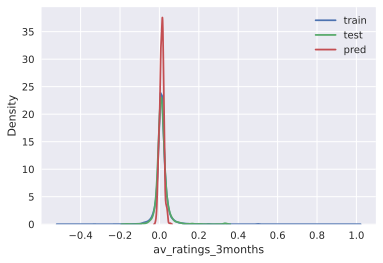

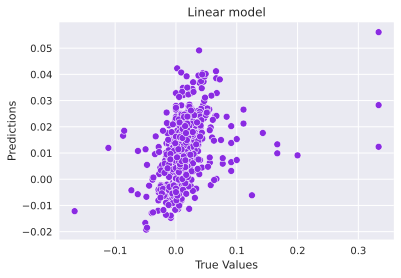

In [93]:
target_distr_linear(y_train, y_test, y_pred)   

In [94]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.0009307330860802309
RMSE:  0.03050791841604784
R2:    0.13949144729903218
MAE:   0.015311332769511316
MedAE: 0.009031431418972977
------------------------------


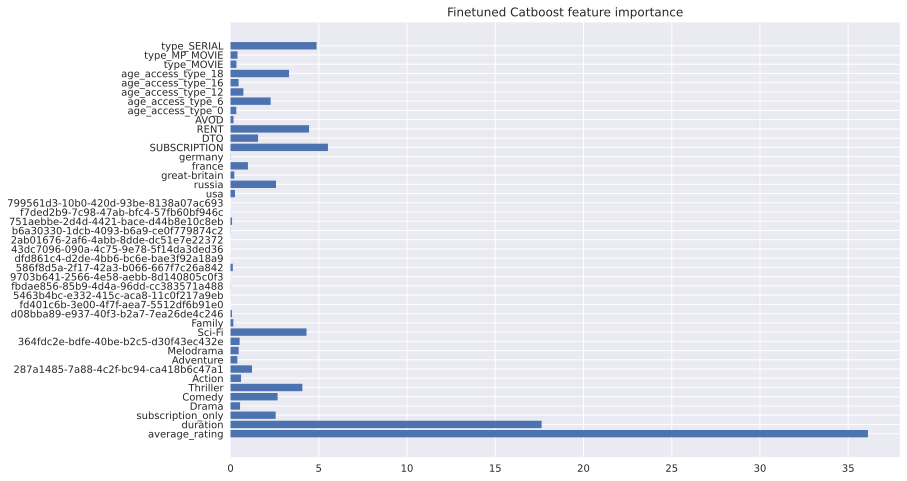

In [97]:
get_feature_imp(best_cat, train_dataset)

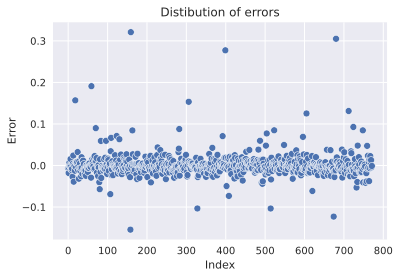

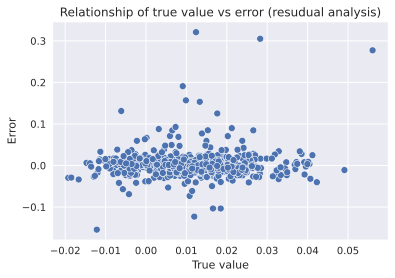

In [98]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Other models

### knn imp

In [49]:
from sklearn.impute import KNNImputer

In [50]:
imputer = KNNImputer()

imputer.fit(X_train[['average_rating']])

KNNImputer()

In [51]:
train = imputer.transform(X_train[['average_rating']])
test = imputer.transform(X_test[['average_rating']])

In [52]:
X_train['average_rating'] = train

In [53]:
X_test['average_rating'] = test

# KNN Regressor

In [99]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [100]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [101]:
from sklearn.inspection import permutation_importance

def get_fi_knn(model,X_train, y_train, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    results = permutation_importance(model, X_train, y_train, scoring='neg_mean_absolute_error', n_repeats=1)

    importance = results.importances_mean
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(importance).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [102]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [59]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold

In [104]:
params = [
    {
        'n_neighbors': [i for i in range(2, 50, 2)],
        'weights': ['uniform', 'distance'],
        'leaf_size' : [2,5,10,30,50]
    }
]

In [117]:
knn_reg_model = KNeighborsRegressor()

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(knn_reg_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [119]:
%%time
gs.fit(X_train, y_train);

CPU times: user 214 ms, sys: 1.51 s, total: 1.72 s
Wall time: 1min


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=KNeighborsRegressor(), n_jobs=-1,
                   param_distributions=[{'leaf_size': [2, 5, 10, 30, 50],
                                         'n_neighbors': [2, 4, 6, 8, 10, 12, 14,
                                                         16, 18, 20, 22, 24, 26,
                                                         28, 30, 32, 34, 36, 38,
                                                         40, 42, 44, 46, 48],
                                         'weights': ['uniform', 'distance']}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [120]:
gs.best_params_

{'weights': 'uniform', 'n_neighbors': 48, 'leaf_size': 2}

In [121]:
knn_reg_model = KNeighborsRegressor(leaf_size=2, n_neighbors=48, weights='uniform')
knn_reg_model.fit(X_train, y_train)

KNeighborsRegressor(leaf_size=2, n_neighbors=48)

In [122]:
pred = knn_reg_model.predict(X_test)

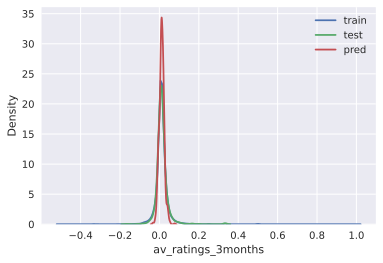

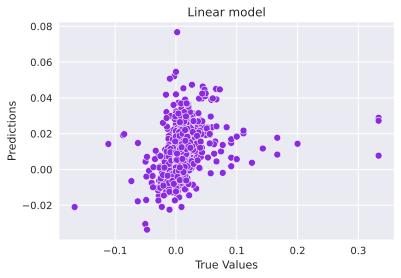

In [123]:
target_distr_linear(y_train, y_test, pred)   

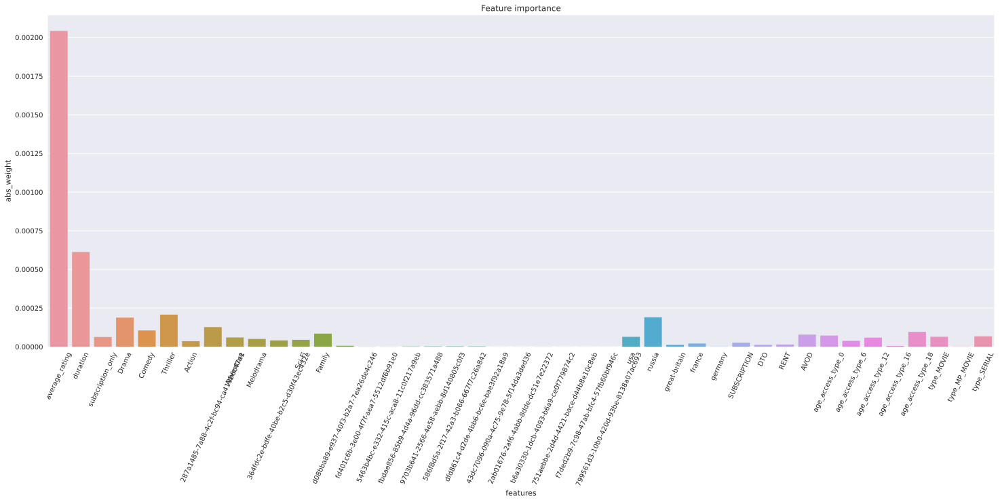

In [124]:
get_fi_knn(knn_reg_model, X_train, y_train)

**Detecting heteroscedasticity**

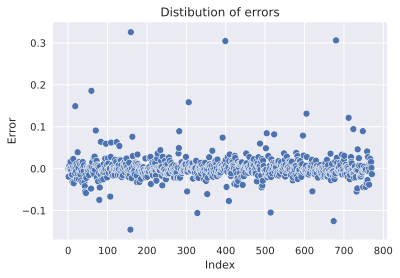

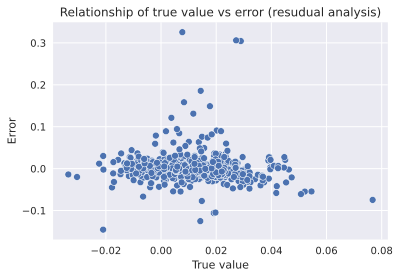

In [125]:
errors = y_test - pred
draw_res_analys(errors, pred)

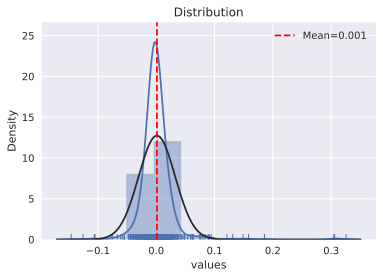

In [126]:
error = y_test - pred
draw_histogram(error)

In [127]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.0009825993417867057
RMSE:  0.03134644065578588
R2:    0.09153854082187962
MAE:   0.01600137885488513
MedAE: 0.00941467907690283
------------------------------


## Boosting Regressor - XGBRegressor

In [54]:
def get_feature_importance(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.feature_importances_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [55]:
!pip install xgboost

In [56]:
import xgboost as xgb

In [57]:
params = [
              {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500, 1000]}
        ]

In [60]:
xgbr_model = xgb.XGBRegressor() 

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(xgbr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [ ]:
%%time
gs.fit(X_train, y_train)

In [ ]:
gs.best_params_

In [224]:
xgbr_model = xgb.XGBRegressor(colsample_bytree=0.7,
                              learning_rate=0.03,
                              max_depth=5,
                              min_child_weight=4,
                              n_estimators=500,
                              nthread=4,
                              objective ='reg:squarederror',
                              subsample=0.7) 
xgbr_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.03, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=4,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=4,
             nthread=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)

[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting fl

In [225]:
pred = xgbr_model.predict(X_test)

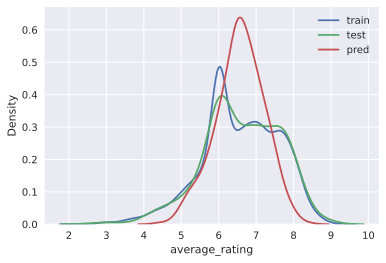

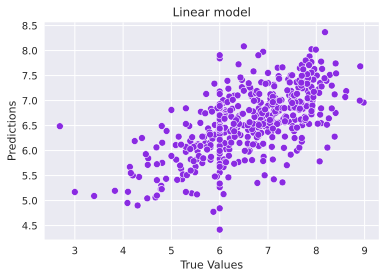

[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:34:18] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting fl

In [226]:
target_distr_linear(y_train, y_test, pred)   

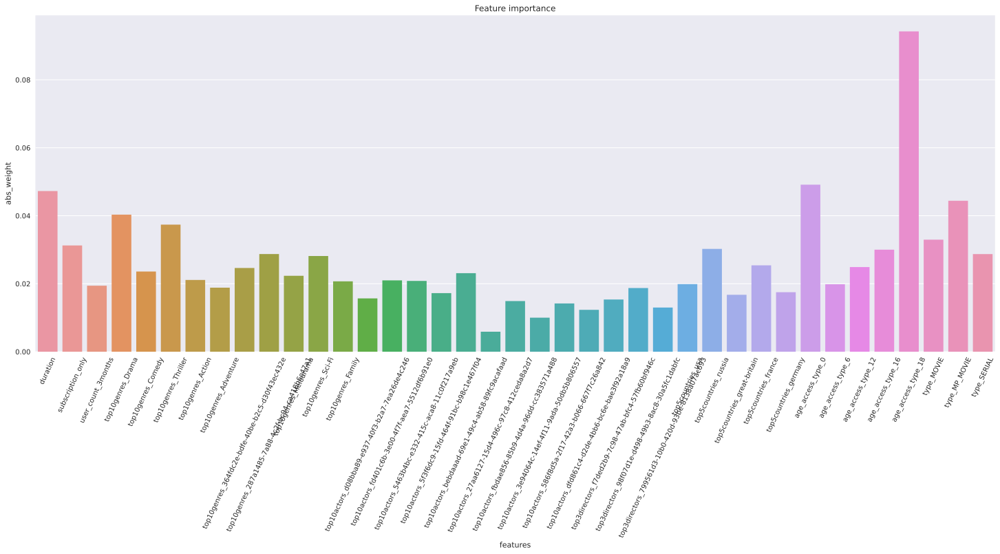

In [227]:
get_feature_importance(xgbr_model)

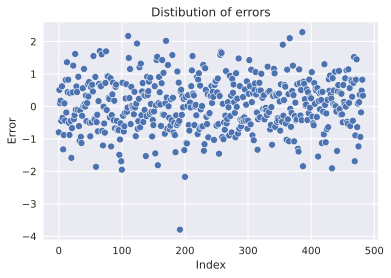

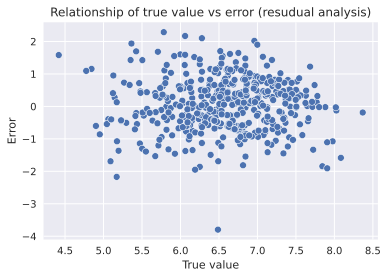

In [228]:
errors = y_test - pred
draw_res_analys(errors, pred) 

In [229]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.6301204724552336
RMSE:  0.7938012802050861
R2:    0.3969200692947986
MAE:   0.6318927146485134
MedAE: 0.5153267860412596
------------------------------


## Random Forest

In [230]:
from sklearn.ensemble import RandomForestRegressor

In [235]:
params = [
    {
        'max_depth': range(20, 50),
        'n_estimators': range(100, 161)

    }
]

In [236]:
rf_model = RandomForestRegressor(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(rf_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [237]:
%%time
gs.fit(X_train, y_train);

CPU times: user 1.97 s, sys: 37.6 ms, total: 2.01 s
Wall time: 4.7 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
                   param_distributions=[{'max_depth': range(20, 50),
                                         'n_estimators': range(100, 161)}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [238]:
gs.best_params_

{'n_estimators': 160, 'max_depth': 23}

In [239]:
rf_model = RandomForestRegressor(random_state=42, max_depth=23, n_estimators=160)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=23, n_estimators=160, random_state=42)

In [240]:
pred = rf_model.predict(X_test)

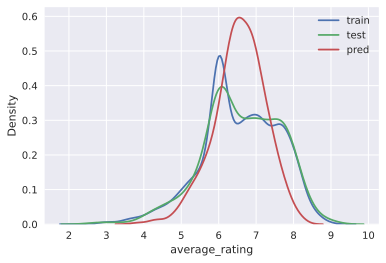

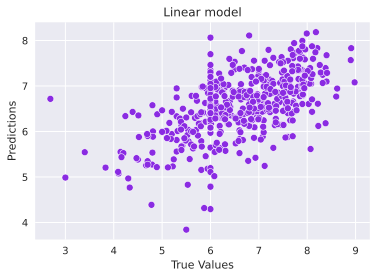

In [242]:
target_distr_linear(y_train, y_test, pred)   

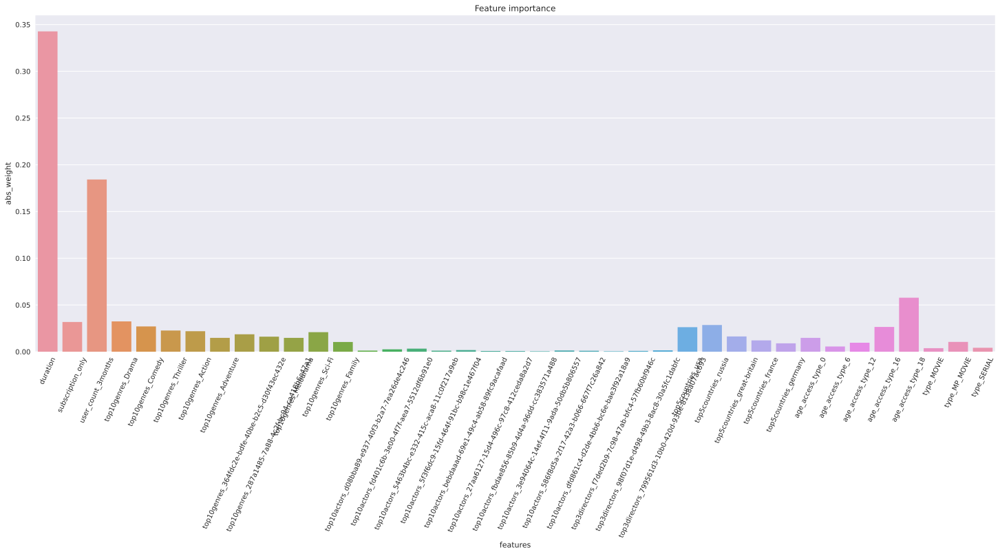

In [243]:
get_feature_importance(rf_model)

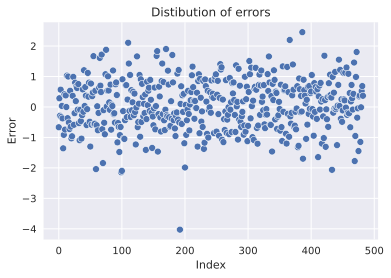

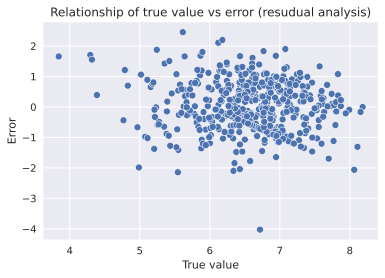

In [244]:
errors = y_test - pred

draw_res_analys(errors, pred) # 

In [245]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.6764099837389442
RMSE:  0.8224414773945586
R2:    0.35261699317257156
MAE:   0.6587127794991651
MedAE: 0.5744374999999984
------------------------------


## SVM Regressor

In [246]:
from sklearn.svm import LinearSVR

In [247]:
params = [
    {
        'C': [0.001,0.01,0.1,1,10,100,1000],
        'tol' : [1e-4, 1e-3]
    }
]

In [249]:
svr_model = LinearSVR(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(svr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [250]:
%%time
gs.fit(X_train, y_train);

CPU times: user 216 ms, sys: 1.58 s, total: 1.79 s
Wall time: 2.72 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=LinearSVR(random_state=42), n_jobs=-1,
                   param_distributions=[{'C': [0.001, 0.01, 0.1, 1, 10, 100,
                                               1000],
                                         'tol': [0.0001, 0.001]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [251]:
gs.best_params_

{'tol': 0.001, 'C': 0.1}

In [253]:
svr_model =  LinearSVR(C=0.1, tol=0.001, random_state=42)
svr_model.fit(X_train, y_train)

LinearSVR(C=0.1, random_state=42, tol=0.001)

In [254]:
pred = svr_model.predict(X_test)

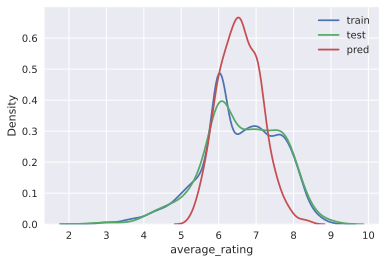

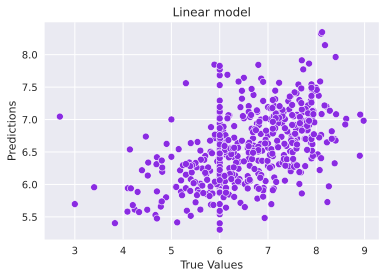

In [255]:
target_distr_linear(y_train, y_test, pred)  

In [257]:
def get_feat_imp_coef(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.coef_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

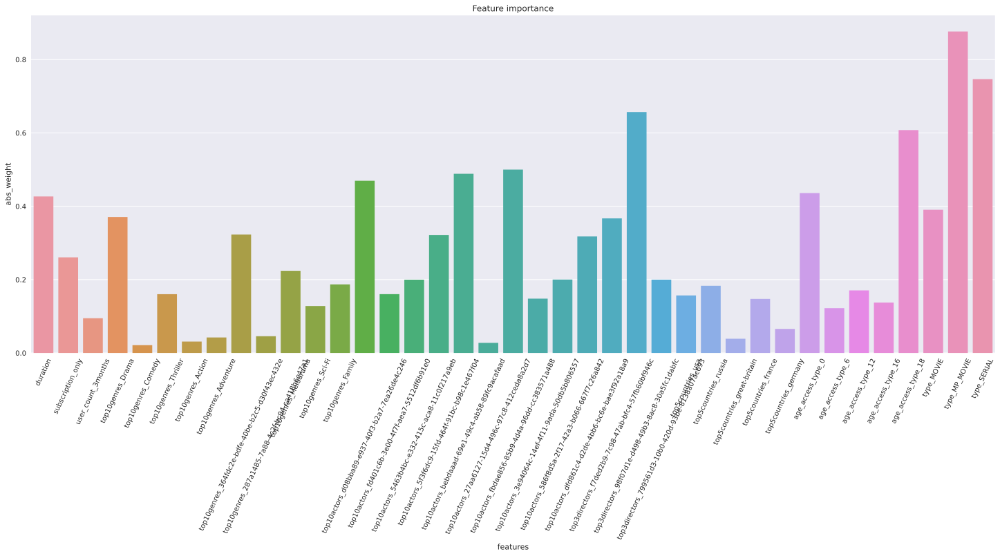

In [258]:
get_feat_imp_coef(svr_model)

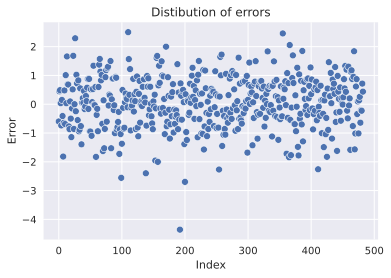

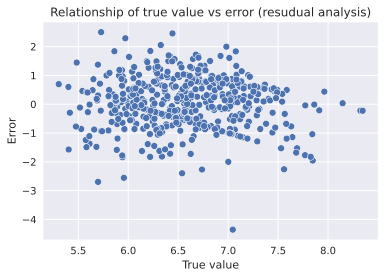

In [259]:
errors = y_test - pred
draw_res_analys(errors, pred)

In [260]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.7847804773854027
RMSE:  0.8858783648929478
R2:    0.2488970338064873
MAE:   0.6966818827930995
MedAE: 0.6059018384830432
------------------------------


/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warning